### Our project focuses on predicting job satisfaction using a deep learning approach. It involves various steps such as feature engineering, correlation analysis, and the use of different modeling techniques, including neural networks. The aim is to explore how well different features correlate with job satisfaction, to optimize the set of features used for training, and to establish whether deep learning performs better compared to classical machine learning methods in this context. ###

In [527]:
import pandas as pd
import numpy as np
np.random.seed(42)



Absolutely, data preprocessing is crucial, especially for creating a generalizable model. Let’s outline the steps we should include beyond missing value handling to ensure data completeness and address inconsistencies.

### **Data Preprocessing Plan**:

1. **Missing Value Handling**: (Already discussed)
   - Impute missing values in numerical and categorical features.
   - Drop columns with a high percentage of missing data.

2. **Data Consistency and Completeness**:
   - **Standardize Categorical Values**: Ensure that all categorical features are standardized (e.g., converting all text to lowercase, handling typos or inconsistencies).
   - **Handle Mixed Formats**: Ensure all numerical values are in the correct format and scale (e.g., years vs. months).
   - **Address Unit Inconsistencies**: For any features that involve units (e.g., salary, years of experience), make sure they are consistent (e.g., all salary figures in the same currency).

3. **Feature Engineering**:
   - **Encoding Categorical Variables**:
     - Use **One-Hot Encoding** for categorical features such as `DeveloperType_Simplified`, `RemoteStatus`, and `Employment_Simplified`.
     - For deep learning, consider using **embedding layers** for high-cardinality features.
   - **Normalization/Standardization**:
     - **Standardize** numerical features (`WorkExp_Log`, `ConvertedCompYearly_Log`, etc.) to bring all features to a similar scale, which helps deep learning models converge faster.
   - **Feature Creation**: Create new features that may capture meaningful interactions (e.g., interaction between experience and employment type).

4. **Outlier Handling**: (Partially discussed)
   - Ensure that extreme values are capped or transformed to reduce their impact on the model.
   - Outliers in `ConvertedCompYearly` and `WorkExp` have already been capped to the **99th percentile**.

5. **Data Splitting**:
   - Ensure the data is split into **train** and **test** sets before imputation and preprocessing to avoid data leakage.



In [528]:
data = pd.read_csv('survey_results_public.csv')

In [529]:
print(data.shape)
data.sample(5)

(65437, 114)


,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
36662,36663,I am a developer by profession,18-24 years old,I prefer not to say,NaN,Apples,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;On the job training;Sch...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Neither easy nor difficult,NaN,NaN
36720,36721,I am a developer by profession,25-34 years old,"Employed, full-time","Hybrid (some remote, some in-person)",Apples,Hobby;Contribute to open-source projects,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",On the job training;Other online resources (e....,Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,84851.0,NaN
30718,30719,"I am not primarily a developer, but I write co...",25-34 years old,"Employed, full-time",Remote,Apples,Hobby;Professional development or self-paced l...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",On the job training;Other online resources (e....,Technical documentation;Blogs;Books;Written Tu...,...,17.0,18.0,20.0,10.0,5.0,2.0,Appropriate in length,Easy,80000.0,7.0
17353,17354,I am a developer by profession,35-44 years old,"Independent contractor, freelancer, or self-em...",Remote,Apples,Bootstrapping a business,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Other online resources ...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,75184.0,NaN
39838,39839,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","School (i.e., University, College, etc);Friend...",NaN,...,20.0,25.0,20.0,25.0,0.0,0.0,Appropriate in length,Easy,332712.0,9.0



### 1. **Job-Related Attributes**
   - Columns reflecting aspects of the job that can influence satisfaction:
     - **Job Role and Responsibilities**: Columns like `MainBranch`, `Employment`, `DevType` (Developer type).
     - **Compensation and Benefits**: `ConvertedCompYearly`, `CompTotal`.
     - **Work Environment**: `RemoteWork`, `OrgSize`, `WorkExp`.
     - **Industry**: Relevant if available, as some industries may correlate with job satisfaction.
     - **Time**-related columns (e.g., `TimeAnswering`, `TimeSearching`): Indicate the time spent on work-related activities.
     - **Work-Life Balance**: `RemoteWork`, `JobSatPoints` series (factors scoring job attributes like project satisfaction, team support).

### 2. **Technical Skills and Tools**
   - Columns representing skills, tools, and resources accessible to the developer:
     - **Programming Languages and Frameworks**: Columns like `LanguageAdmired`, `LanguageHaveWorkedWith`, `WebframeAdmired`, `WebframeWantToWorkWith`.
     - **Professional Tools**: `ProfessionalTech`, `ProfessionalCloud`.
     - **Learning Resources**: Columns indicating how developers learn (e.g., `LearnCode`, `LearnCodeOnline`).

### 3. **AI and Technology Usage**
   - AI usage columns could reflect satisfaction if they impact efficiency:
     - **AI and Automation Tools**: `AIToolCurrently Using`, `AIToolInterested in Using`, `AIToolNot interested in Using`.
     - **Tech Preferences**: `PlatformAdmired`, `DatabaseAdmired`, `MiscTechAdmired`.

### 4. **Cultural and Community Factors**
   - Indicators of engagement with the developer community and cultural alignment:
     - **Stack Overflow Usage**: `SOAccount`, `SOVisitFreq`, `SOComm`.
     - **Community Engagement**: `TechDoc`, `PlatformWantToWorkWith`, `MiscTechWantToWorkWith`.
   
### Data Preparation Steps to Avoid Leakage

1. **Exclude Columns Explicitly Indicating Satisfaction**: Avoid columns directly related to satisfaction that might reveal answers, such as `JobSat` itself.
2. **Train-Test Splits Before Feature Engineering**: To prevent leakage, create train-test splits before calculating any feature statistics (e.g., mean encoding, scaling) based on the whole dataset.
3. **Use Only Relevant Historical and Categorical Data**: Avoid future information or direct outcomes in the model features. Columns like `JobSatPoints` may need to be assessed for indirect vs. direct satisfaction indicators.

This approach creates a feature set with minimal risk of data leakage by focusing on descriptive (not predictive) job attributes and neutral historical data, ready for transformations like encoding, scaling, and handling nulls as appropriate.

In [530]:
data.CodingActivities.head()

0                                                Hobby
1    Hobby;Contribute to open-source projects;Other...
2    Hobby;Contribute to open-source projects;Other...
3                                                  NaN
4                                                  NaN
Name: CodingActivities, dtype: object

In [531]:
# Let's apply a similar transformation for the 'CodingActivities' column

# Step 1: Identify unique values in the 'CodingActivities' column
unique_coding_activities = set()

# Split each non-null entry in 'CodingActivities' and update the unique set
data['CodingActivities'].dropna().apply(lambda x: unique_coding_activities.update(x.split(';')))

# Convert to a sorted list for readability
unique_coding_activities = sorted(unique_coding_activities)

# Display the unique values to verify
unique_coding_activities


['Bootstrapping a business',
 'Contribute to open-source projects',
 'Freelance/contract work',
 'Hobby',
 'I don’t code outside of work',
 'Other (please specify):',
 'Professional development or self-paced learning from online courses',
 'School or academic work']

In [532]:
# Define the unique coding activities as categories for binary encoding
coding_activity_categories = {
    "Bootstrapping Business": ["Bootstrapping a business"],
    "Open Source Contribution": ["Contribute to open-source projects"],
    "Freelance/Contract Work": ["Freelance/contract work"],
    "Hobby": ["Hobby"],
    "No Extra Coding": ["I donâ€™t code outside of work"],
    "Other": ["Other (please specify):"],
    "Professional Development": ["Professional development or self-paced learning from online courses"],
    "School/Academic Work": ["School or academic work"]
}

# Create a new DataFrame for binary encoded coding activity categories
coding_activity_df = pd.DataFrame(0, index=data.index, columns=coding_activity_categories.keys())

# Populate each category with binary values based on the 'CodingActivities' column
for category, activities in coding_activity_categories.items():
    coding_activity_df[category] = data['CodingActivities'].apply(lambda x: 1 if pd.notna(x) and any(activity in x for activity in activities) else 0)

# Concatenate the new coding activity columns to the main data and drop the original 'CodingActivities' column
data = pd.concat([data, coding_activity_df], axis=1)
data = data.drop('CodingActivities', axis=1)

# Display the new columns to verify the transformation
data[coding_activity_df.columns].head()


,Bootstrapping Business,Open Source Contribution,Freelance/Contract Work,Hobby,No Extra Coding,Other,Professional Development,School/Academic Work
0,0,0,0,1,0,0,0,0
1,0,1,0,1,0,1,0,0
2,0,1,0,1,0,1,0,0
3,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0


In [533]:
data.EdLevel.head()

0                            Primary/elementary school
1         Bachelor’s degree (B.A., B.S., B.Eng., etc.)
2      Master’s degree (M.A., M.S., M.Eng., MBA, etc.)
3    Some college/university study without earning ...
4    Secondary school (e.g. American high school, G...
Name: EdLevel, dtype: object

In [534]:
# # Define education level categories for binary encoding
# edlevel_categories = {
#     "Primary/Elementary School": ["Primary/elementary school"],
#     "Secondary School": ["Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)"],
#     "Some College/No Degree": ["Some college/university study without earning a degree"],
#     "Associate Degree": ["Associate degree (A.A., A.S., etc.)"],
#     "Bachelor's Degree": ["Bachelorâ€™s degree (B.A., B.S., B.Eng., etc.)"],
#     "Master's Degree": ["Masterâ€™s degree (M.A., M.S., M.Eng., MBA, etc.)"],
#     "Professional Degree": ["Professional degree (JD, MD, Ph.D, Ed.D, etc.)"],
#     "Other Education": ["Something else"]
# }

# # Create a new DataFrame for binary encoded education levels
# edlevel_df = pd.DataFrame(0, index=data.index, columns=edlevel_categories.keys())

# # Populate each category with binary values based on the 'EdLevel' column
# for category, levels in edlevel_categories.items():
#     edlevel_df[category] = data['EdLevel'].apply(lambda x: 1 if pd.notna(x) and any(level in x for level in levels) else 0)

# # Concatenate the new education level columns to the main data and drop the original 'EdLevel' column
# data = pd.concat([data, edlevel_df], axis=1)
# data = data.drop('EdLevel', axis=1)

# # Display the new columns to verify the transformation
# data[edlevel_df.columns].head()


In [535]:
# Let's examine the unique values in the 'EdLevel' column to determine possible categories

# Extract unique values for 'EdLevel'
unique_ed_levels = sorted(data['EdLevel'].dropna().unique())

# Display the unique values to understand the education levels
unique_ed_levels


['Associate degree (A.A., A.S., etc.)',
 'Bachelor’s degree (B.A., B.S., B.Eng., etc.)',
 'Master’s degree (M.A., M.S., M.Eng., MBA, etc.)',
 'Primary/elementary school',
 'Professional degree (JD, MD, Ph.D, Ed.D, etc.)',
 'Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)',
 'Some college/university study without earning a degree',
 'Something else']

In [536]:
# Extract unique values from 'TechDoc', 'PlatformWantToWorkWith', and 'MiscTechWantToWorkWith' by splitting each entry

# Extract unique items for each column
unique_techdocs = set()
unique_platforms_want = set()
unique_misctech_want = set()

# Split each non-null entry in the respective columns and update the unique sets
data['TechDoc'].dropna().apply(lambda x: unique_techdocs.update(x.split(';')))
data['PlatformWantToWorkWith'].dropna().apply(lambda x: unique_platforms_want.update(x.split(';')))
data['MiscTechWantToWorkWith'].dropna().apply(lambda x: unique_misctech_want.update(x.split(';')))

# Convert the sets of unique values to sorted lists for readability
unique_techdocs = sorted(unique_techdocs)
unique_platforms_want = sorted(unique_platforms_want)
unique_misctech_want = sorted(unique_misctech_want)

# Display the unique values to verify
unique_techdocs[:10], unique_platforms_want[:10], unique_misctech_want[:10]  # Displaying first 10 for each list


(['AI-powered search/dev tool (free)',
  'AI-powered search/dev tool (paid)',
  'API document(s) and/or SDK document(s)',
  'First-party knowledge base',
  'Other (please specify):',
  'Traditional public search engine',
  'User guides or README files found in the source repository'],
 ['Alibaba Cloud',
  'Amazon Web Services (AWS)',
  'Cloudflare',
  'Colocation',
  'Databricks',
  'Digital Ocean',
  'Firebase',
  'Fly.io',
  'Google Cloud',
  'Heroku'],
 ['.NET (5+) ',
  '.NET Framework (1.0 - 4.8)',
  '.NET MAUI',
  'Apache Kafka',
  'Apache Spark',
  'CUDA',
  'Capacitor',
  'Cordova',
  'DirectX',
  'Electron'])

In [537]:
# Define categories for each column based on the identified unique values

# Categories for TechDoc
techdoc_categories = {
    "AI Tools": ["AI-powered search/dev tool (free)", "AI-powered search/dev tool (paid)"],
    "Knowledge Bases": ["First-party knowledge base", "User guides or README files found in the source repository"],
    "Public Search Engine": ["Traditional public search engine"],
    "API/SDK Documentation": ["API document(s) and/or SDK document(s)"],
}

# Categories for PlatformWantToWorkWith
platform_want_categories = {
    "Cloud Platforms": ["Alibaba Cloud", "Amazon Web Services (AWS)", "Google Cloud", "Firebase", "Digital Ocean", "Heroku", "Fly.io"],
    "Data Processing": ["Databricks", "Cloudflare", "Colocation"],
}

# Categories for MiscTechWantToWorkWith
misctech_want_categories = {
    "Programming Frameworks": [".NET (5+)", ".NET Framework (1.0 - 4.8)", ".NET MAUI", "Capacitor", "Cordova"],
    "Data Processing Tech": ["Apache Kafka", "Apache Spark", "CUDA", "DirectX", "Electron"]
}

# Create new DataFrames for each of the admired columns
techdoc_df = pd.DataFrame(0, index=data.index, columns=techdoc_categories.keys())
platform_want_df = pd.DataFrame(0, index=data.index, columns=platform_want_categories.keys())
misctech_want_df = pd.DataFrame(0, index=data.index, columns=misctech_want_categories.keys())

# Populate each category with binary values based on the presence of values in each column
for category, techs in techdoc_categories.items():
    techdoc_df[category] = data['TechDoc'].apply(lambda x: 1 if pd.notna(x) and any(tech in x for tech in techs) else 0)

for category, platforms in platform_want_categories.items():
    platform_want_df[category] = data['PlatformWantToWorkWith'].apply(lambda x: 1 if pd.notna(x) and any(platform in x for platform in platforms) else 0)

for category, techs in misctech_want_categories.items():
    misctech_want_df[category] = data['MiscTechWantToWorkWith'].apply(lambda x: 1 if pd.notna(x) and any(tech in x for tech in techs) else 0)

# Concatenate the new grouped columns to the main data and drop the original columns
data = pd.concat([data, techdoc_df, platform_want_df, misctech_want_df], axis=1)
data = data.drop(['TechDoc', 'PlatformWantToWorkWith', 'MiscTechWantToWorkWith'], axis=1)

# Display the new columns to verify the transformation
data[techdoc_df.columns.tolist() + platform_want_df.columns.tolist() + misctech_want_df.columns.tolist()].head()


,AI Tools,Knowledge Bases,Public Search Engine,API/SDK Documentation,Cloud Platforms,Data Processing,Programming Frameworks,Data Processing Tech
0,0,0,0,0,0,0,0,0
1,0,1,1,1,1,0,0,0
2,0,1,1,1,1,0,1,0
3,0,0,0,0,1,0,0,0
4,0,1,1,1,0,0,0,0


In [538]:
# First, examine the unique values in 'SOAccount', 'SOVisitFreq', and 'SOComm' to determine possible categories

# Extract unique values for each column
soaccount_unique = sorted(data['SOAccount'].dropna().unique())
sovisitfreq_unique = sorted(data['SOVisitFreq'].dropna().unique())
socomm_unique = sorted(data['SOComm'].dropna().unique())

# Display the unique values for each column to guide the transformation
soaccount_unique, sovisitfreq_unique, socomm_unique


(['No', "Not sure/can't remember", 'Yes'],
 ['A few times per month or weekly',
  'A few times per week',
  'Daily or almost daily',
  'Less than once per month or monthly',
  'Multiple times per day'],
 ['Neutral',
  'No, not at all',
  'No, not really',
  'Not sure',
  'Yes, definitely',
  'Yes, somewhat'])

In [539]:
# Define categories for SOAccount, SOVisitFreq, and SOComm based on the identified unique values

# Categories for SOAccount
soaccount_categories = {
    "SOAccount - Yes": ["Yes"],
    "SOAccount - No": ["No"],
    "SOAccount - Not Sure": ["Not sure/can't remember"]
}

# Categories for SOVisitFreq (grouped by frequency level for simplicity)
sovisitfreq_categories = {
    "Infrequent": ["Less than once per month or monthly"],
    "Frequent": ["A few times per month or weekly", "A few times per week"],
    "Very Frequent": ["Daily or almost daily", "Multiple times per day"]
}

# Categories for SOComm
socomm_categories = {
    "Positive Community Engagement": ["Yes, definitely", "Yes, somewhat"],
    "Neutral Community Engagement": ["Neutral"],
    "Negative Community Engagement": ["No, not really", "No, not at all"]
}

# Create new DataFrames for binary encoded columns for each category
soaccount_df = pd.DataFrame(0, index=data.index, columns=soaccount_categories.keys())
sovisitfreq_df = pd.DataFrame(0, index=data.index, columns=sovisitfreq_categories.keys())
socomm_df = pd.DataFrame(0, index=data.index, columns=socomm_categories.keys())

# Populate each category with binary values for 'SOAccount', 'SOVisitFreq', and 'SOComm'
for category, responses in soaccount_categories.items():
    soaccount_df[category] = data['SOAccount'].apply(lambda x: 1 if pd.notna(x) and any(response in x for response in responses) else 0)

for category, responses in sovisitfreq_categories.items():
    sovisitfreq_df[category] = data['SOVisitFreq'].apply(lambda x: 1 if pd.notna(x) and any(response in x for response in responses) else 0)

for category, responses in socomm_categories.items():
    socomm_df[category] = data['SOComm'].apply(lambda x: 1 if pd.notna(x) and any(response in x for response in responses) else 0)

# Concatenate the new grouped columns to the main data and drop the original columns
data = pd.concat([data, soaccount_df, sovisitfreq_df, socomm_df], axis=1)
data = data.drop(['SOAccount', 'SOVisitFreq', 'SOComm'], axis=1)

# Display the new columns to verify the transformation
data[soaccount_df.columns.tolist() + sovisitfreq_df.columns.tolist() + socomm_df.columns.tolist()].head()


,SOAccount - Yes,SOAccount - No,SOAccount - Not Sure,Infrequent,Frequent,Very Frequent,Positive Community Engagement,Neutral Community Engagement,Negative Community Engagement
0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,1,1,0,0
2,1,0,0,0,0,1,1,0,0
3,0,1,0,0,0,1,0,0,1
4,1,0,0,0,0,1,1,0,0


In [540]:
# Extract unique values from 'PlatformAdmired', 'DatabaseAdmired', and 'MiscTechAdmired' by splitting each entry

# Extract unique platforms, databases, and miscellaneous tech admired
unique_platforms_admired = set()
unique_databases_admired = set()
unique_misctech_admired = set()

# Split each non-null entry in the respective columns and update the unique sets
data['PlatformAdmired'].dropna().apply(lambda x: unique_platforms_admired.update(x.split(';')))
data['DatabaseAdmired'].dropna().apply(lambda x: unique_databases_admired.update(x.split(';')))
data['MiscTechAdmired'].dropna().apply(lambda x: unique_misctech_admired.update(x.split(';')))

# Convert the sets of unique values to sorted lists for readability
unique_platforms_admired = sorted(unique_platforms_admired)
unique_databases_admired = sorted(unique_databases_admired)
unique_misctech_admired = sorted(unique_misctech_admired)

# Display the unique values to verify
unique_platforms_admired[:10], unique_databases_admired[:10], unique_misctech_admired[:10]  # Displaying first 10 for each list


(['Alibaba Cloud',
  'Amazon Web Services (AWS)',
  'Cloudflare',
  'Colocation',
  'Databricks',
  'Digital Ocean',
  'Firebase',
  'Fly.io',
  'Google Cloud',
  'Heroku'],
 ['BigQuery',
  'Cassandra',
  'Clickhouse',
  'Cloud Firestore',
  'Cockroachdb',
  'Cosmos DB',
  'Couch DB',
  'Couchbase',
  'Databricks SQL',
  'Datomic'],
 ['.NET (5+) ',
  '.NET Framework (1.0 - 4.8)',
  '.NET MAUI',
  'Apache Kafka',
  'Apache Spark',
  'CUDA',
  'Capacitor',
  'Cordova',
  'DirectX',
  'Electron'])

In [541]:
# Define categories based on unique values identified for each admired technology type
platform_admired_categories = {
    "Cloud Platforms": ["Alibaba Cloud", "Amazon Web Services (AWS)", "Google Cloud", "Firebase", "Digital Ocean", "Heroku", "Fly.io"],
    "Data Processing Platforms": ["Databricks", "Cloudflare", "Colocation"]
}

database_admired_categories = {
    "SQL Databases": ["BigQuery", "Clickhouse", "DuckDB", "Dynamodb", "Couch DB", "Cockroachdb", "Cosmos DB"],
    "NoSQL Databases": ["Cassandra", "Cloud Firestore", "Databricks SQL"],
}

misctech_admired_categories = {
    "Programming Frameworks": [".NET (5+)", ".NET Framework (1.0 - 4.8)", ".NET MAUI", "Capacitor", "Cordova"],
    "Data Processing Tech": ["Apache Kafka", "Apache Spark", "CUDA", "DirectX", "Electron"]
}

# Create new DataFrames for each of the admired columns
platform_admired_df = pd.DataFrame(0, index=data.index, columns=platform_admired_categories.keys())
database_admired_df = pd.DataFrame(0, index=data.index, columns=database_admired_categories.keys())
misctech_admired_df = pd.DataFrame(0, index=data.index, columns=misctech_admired_categories.keys())

# Populate each category with binary values based on the presence of platforms, databases, and misc tech in admired columns
for category, platforms in platform_admired_categories.items():
    platform_admired_df[category] = data['PlatformAdmired'].apply(
        lambda x: 1 if pd.notna(x) and any(platform in x for platform in platforms) else 0
    )

for category, databases in database_admired_categories.items():
    database_admired_df[category] = data['DatabaseAdmired'].apply(
        lambda x: 1 if pd.notna(x) and any(database in x for database in databases) else 0
    )

for category, techs in misctech_admired_categories.items():
    misctech_admired_df[category] = data['MiscTechAdmired'].apply(
        lambda x: 1 if pd.notna(x) and any(tech in x for tech in techs) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original columns
data = pd.concat([data, platform_admired_df, database_admired_df, misctech_admired_df], axis=1)
data = data.drop(['PlatformAdmired', 'DatabaseAdmired', 'MiscTechAdmired'], axis=1)

# Display the new columns to verify the transformation
data[platform_admired_df.columns.tolist() + database_admired_df.columns.tolist() + misctech_admired_df.columns.tolist()].head()


,Cloud Platforms,Cloud Platforms,Data Processing Platforms,SQL Databases,NoSQL Databases,Programming Frameworks,Programming Frameworks,Data Processing Tech,Data Processing Tech
0,0,0,0,0,0,0,0,0,0
1,1,1,0,0,0,0,0,0,0
2,1,1,0,0,0,1,1,0,0
3,1,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0


In [542]:
# First, extract unique AI tools by splitting the entries in 'AIToolCurrently Using', 'AIToolInterested in Using', and 'AIToolNot interested in Using'

# Extract unique AI tools from each column
unique_ai_tools_current = set()
unique_ai_tools_interested = set()
unique_ai_tools_not_interested = set()

# Split each non-null entry in the AI tool columns and update the unique sets
data['AIToolCurrently Using'].dropna().apply(lambda x: unique_ai_tools_current.update(x.split(';')))
data['AIToolInterested in Using'].dropna().apply(lambda x: unique_ai_tools_interested.update(x.split(';')))
data['AIToolNot interested in Using'].dropna().apply(lambda x: unique_ai_tools_not_interested.update(x.split(';')))

# Convert the sets of unique AI tools to sorted lists for readability
unique_ai_tools_current = sorted(unique_ai_tools_current)
unique_ai_tools_interested = sorted(unique_ai_tools_interested)
unique_ai_tools_not_interested = sorted(unique_ai_tools_not_interested)

# Display the unique AI tools to verify
unique_ai_tools_current[:10], unique_ai_tools_interested[:10], unique_ai_tools_not_interested[:10]  # Displaying first 10 for each list


(['Committing and reviewing code',
  'Debugging and getting help',
  'Deployment and monitoring',
  'Documenting code',
  'Generating content or synthetic data',
  'Learning about a codebase',
  'Other (please specify):',
  'Predictive analytics',
  'Project planning',
  'Search for answers'],
 ['Committing and reviewing code',
  'Debugging and getting help',
  'Deployment and monitoring',
  'Documenting code',
  'Generating content or synthetic data',
  'Learning about a codebase',
  'Other (please specify):',
  'Predictive analytics',
  'Project planning',
  'Search for answers'],
 ['Committing and reviewing code',
  'Debugging and getting help',
  'Deployment and monitoring',
  'Documenting code',
  'Generating content or synthetic data',
  'Learning about a codebase',
  'Other (please specify):',
  'Predictive analytics',
  'Project planning',
  'Search for answers'])

In [543]:
# Define categories based on unique AI tools identified
ai_tool_categories = {
    "Committing and Reviewing Code": ["Committing and reviewing code"],
    "Debugging and Getting Help": ["Debugging and getting help"],
    "Deployment and Monitoring": ["Deployment and monitoring"],
    "Documenting Code": ["Documenting code"],
    "Generating Content or Synthetic Data": ["Generating content or synthetic data"],
    "Learning About Codebase": ["Learning about a codebase"],
    "Predictive Analytics": ["Predictive analytics"],
    "Project Planning": ["Project planning"],
    "Search for Answers": ["Search for answers"],
    "Other": ["Other (please specify):"]
}

# Create new DataFrames for each of the AI tool columns
ai_tool_current_df = pd.DataFrame(0, index=data.index, columns=[f"{category} - Currently Using" for category in ai_tool_categories.keys()])
ai_tool_interested_df = pd.DataFrame(0, index=data.index, columns=[f"{category} - Interested" for category in ai_tool_categories.keys()])
ai_tool_not_interested_df = pd.DataFrame(0, index=data.index, columns=[f"{category} - Not Interested" for category in ai_tool_categories.keys()])

# Populate each category with binary values based on the presence of tools in each column
for category, tools in ai_tool_categories.items():
    ai_tool_current_df[f"{category} - Currently Using"] = data['AIToolCurrently Using'].apply(
        lambda x: 1 if pd.notna(x) and any(tool in x for tool in tools) else 0
    )
    ai_tool_interested_df[f"{category} - Interested"] = data['AIToolInterested in Using'].apply(
        lambda x: 1 if pd.notna(x) and any(tool in x for tool in tools) else 0
    )
    ai_tool_not_interested_df[f"{category} - Not Interested"] = data['AIToolNot interested in Using'].apply(
        lambda x: 1 if pd.notna(x) and any(tool in x for tool in tools) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original AI tool columns
data = pd.concat([data, ai_tool_current_df, ai_tool_interested_df, ai_tool_not_interested_df], axis=1)
data = data.drop(['AIToolCurrently Using', 'AIToolInterested in Using', 'AIToolNot interested in Using'], axis=1)

# Display the new columns to verify the transformation
data[ai_tool_current_df.columns.tolist() + ai_tool_interested_df.columns.tolist() + ai_tool_not_interested_df.columns.tolist()].head()


,Committing and Reviewing Code - Currently Using,Debugging and Getting Help - Currently Using,Deployment and Monitoring - Currently Using,Documenting Code - Currently Using,Generating Content or Synthetic Data - Currently Using,Learning About Codebase - Currently Using,Predictive Analytics - Currently Using,Project Planning - Currently Using,Search for Answers - Currently Using,Other - Currently Using,...,Committing and Reviewing Code - Not Interested,Debugging and Getting Help - Not Interested,Deployment and Monitoring - Not Interested,Documenting Code - Not Interested,Generating Content or Synthetic Data - Not Interested,Learning About Codebase - Not Interested,Predictive Analytics - Not Interested,Project Planning - Not Interested,Search for Answers - Not Interested,Other - Not Interested
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,1,1,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [544]:
# Define categories and transformations for `RemoteWork`, `OrgSize`, and `WorkExp`

# 1. RemoteWork
remote_work_categories = {
    "Remote": ["Remote"],
    "Hybrid": ["Hybrid (some remote, some in-person)"],
    "In-person": ["In-person"],
}

# Create a new DataFrame for binary encoded columns for `RemoteWork`
remote_work_df = pd.DataFrame(0, index=data.index, columns=remote_work_categories.keys())

# Populate each category with binary values based on the `RemoteWork` column
for category, keywords in remote_work_categories.items():
    remote_work_df[category] = data['RemoteWork'].apply(lambda x: 1 if pd.notna(x) and any(keyword in x for keyword in keywords) else 0)

# Add a column for missing values in `RemoteWork`
remote_work_df["Unknown RemoteWork"] = data['RemoteWork'].isnull().astype(int)

# 2. OrgSize
# Grouping company sizes into broader categories
org_size_categories = {
    "Small": ["Just me - I am a freelancer, sole proprietor, etc.", "2 to 9 employees", "10 to 19 employees"],
    "Medium": ["20 to 99 employees", "100 to 499 employees", "500 to 999 employees"],
    "Large": ["1,000 to 4,999 employees", "5,000 to 9,999 employees", "10,000 or more employees"],
    "Unknown OrgSize": ["I donâ€™t know"]
}

# Create a new DataFrame for binary encoded columns for `OrgSize`
org_size_df = pd.DataFrame(0, index=data.index, columns=org_size_categories.keys())

# Populate each category with binary values based on the `OrgSize` column
for category, keywords in org_size_categories.items():
    org_size_df[category] = data['OrgSize'].apply(lambda x: 1 if pd.notna(x) and any(keyword in x for keyword in keywords) else 0)

# Add a column for missing values in `OrgSize`
org_size_df["Unknown OrgSize"] += data['OrgSize'].isnull().astype(int)


# Normalization of `WorkExp`

# Concatenate the new columns to the main data and drop original `RemoteWork` and `OrgSize`
data = pd.concat([data, remote_work_df, org_size_df], axis=1)
data = data.drop(['RemoteWork', 'OrgSize'], axis=1)

# Display the new columns to verify the transformation
data[remote_work_df.columns.tolist() + org_size_df.columns.tolist() + ['WorkExp']].head()


,Remote,Hybrid,In-person,Unknown RemoteWork,Small,Medium,Large,Unknown OrgSize,WorkExp
0,1,0,0,0,0,0,0,1,NaN
1,1,0,0,0,0,0,0,1,17.0
2,1,0,0,0,0,0,0,1,NaN
3,0,0,0,1,0,0,0,1,NaN
4,0,0,0,1,0,0,0,1,NaN


In [545]:
# Define high-level categories for each column based on unique values identified

# Categories for 'MainBranch'
mainbranch_categories = {
    "Developer by Profession": ["I am a developer by profession"],
    "Learning to Code": ["I am learning to code"],
    "Occasional Developer": ["I am not primarily a developer, but I write code sometimes as part of my work/studies"],
    "Hobbyist": ["I code primarily as a hobby"],
    "Former Developer": ["I used to be a developer by profession, but no longer am"],
}

# Categories for 'Employment'
employment_categories = {
    "Full-time Employment": ["Employed, full-time"],
    "Part-time Employment": ["Employed, part-time"],
    "Contract/Freelance": ["Independent contractor, freelancer, or self-employed"],
    "Student": ["Student, full-time", "Student, part-time"],
    "Unemployed": ["Not employed, and not looking for work", "Not employed, but looking for work"],
    "Retired": ["Retired"],
}

# Categories for 'DevType' (sample categories based on job roles)
devtype_categories = {
    "Data-related": ["Data or business analyst", "Data scientist or machine learning specialist"],
    "Developer - Backend": ["Developer, back-end"],
    "Developer - Frontend": ["Developer, front-end"],
    "Developer - Full-stack": ["Developer, full-stack"],
    "Specialized Roles": ["Developer, mobile", "Developer, embedded applications or devices", "Developer, game or graphics"],
    "Other Technical Roles": ["DevOps specialist", "Cloud infrastructure engineer", "Database administrator"],
}

# Create a new DataFrame for binary encoded columns based on 'MainBranch', 'Employment', and 'DevType'
mainbranch_df = pd.DataFrame(0, index=data.index, columns=mainbranch_categories.keys())
employment_df = pd.DataFrame(0, index=data.index, columns=employment_categories.keys())
devtype_df = pd.DataFrame(0, index=data.index, columns=devtype_categories.keys())

# Populate each category with binary values based on the presence of each category in 'MainBranch', 'Employment', and 'DevType'
for category, keywords in mainbranch_categories.items():
    mainbranch_df[category] = data['MainBranch'].apply(lambda x: 1 if pd.notna(x) and any(keyword in x for keyword in keywords) else 0)

for category, keywords in employment_categories.items():
    employment_df[category] = data['Employment'].apply(lambda x: 1 if pd.notna(x) and any(keyword in x for keyword in keywords) else 0)

for category, keywords in devtype_categories.items():
    devtype_df[category] = data['DevType'].apply(lambda x: 1 if pd.notna(x) and any(keyword in x for keyword in keywords) else 0)

# Concatenate the new grouped columns to the main data and drop the original 'MainBranch', 'Employment', and 'DevType' columns
data = pd.concat([data, mainbranch_df, employment_df, devtype_df], axis=1)
data = data.drop(['MainBranch', 'Employment', 'DevType'], axis=1)

# Display the new columns to verify the transformation
data[mainbranch_df.columns.tolist() + employment_df.columns.tolist() + devtype_df.columns.tolist()].head()


,Developer by Profession,Learning to Code,Occasional Developer,Hobbyist,Former Developer,Full-time Employment,Part-time Employment,Contract/Freelance,Student,Unemployed,Retired,Data-related,Developer - Backend,Developer - Frontend,Developer - Full-stack,Specialized Roles,Other Technical Roles
0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0


In [546]:
data.WebframeWantToWorkWith

0                                                      NaN
1                         Express;Htmx;Node.js;React;Remix
2                                             ASP.NET CORE
3                             jQuery;Next.js;Node.js;React
4                                                      NaN
5                                                  Node.js
6                                                      NaN
7                                            Next.js;React
8                                                      NaN
9                            Express;Next.js;Node.js;React
10                      Django;Node.js;React;Ruby on Rails
11       ASP.NET;ASP.NET CORE;Express;jQuery;Node.js;React
12                                                     NaN
13                                                     NaN
14                                                     NaN
15                                                  Blazor
16                                           Deno;Solid.

In [509]:
# data.isna().any(axis=1).sum()

In [510]:
# # Define the language categories based on common usage and domain knowledge
# language_categories = {
#     "Front-end": ["HTML/CSS", "JavaScript", "TypeScript"],
#     "Back-end": ["Python", "Java", "C#", "PHP", "Ruby", "Go", "Rust", "Scala"],
#     "Data Science": ["R", "MATLAB", "Julia"],
#     "Scripting": ["Bash/Shell (all shells)", "PowerShell", "Perl"],
#     "Embedded/Systems": ["C", "C++", "Assembly", "Fortran"],
#     "Mobile": ["Swift", "Kotlin", "Objective-C"],
#     "Database": ["SQL"],
# }

# # Create a new DataFrame to hold the grouped binary features
# language_category_df = pd.DataFrame(0, index=data.index, columns=language_categories.keys())

# # Populate each category with binary values based on the presence of languages in that category
# for category, languages in language_categories.items():
#     # Set value to 1 if any of the languages in that category are in the LanguageAdmired list
#     language_category_df[category] = data['LanguageAdmired'].apply(
#         lambda x: 1 if pd.notna(x) and any(lang in x for lang in languages) else 0
#     )

# # Concatenate the new grouped columns to the main data and drop the original LanguageAdmired column
# data = pd.concat([data, language_category_df], axis=1)
# data = data.drop('LanguageAdmired', axis=1)

# # Display the new columns to verify the transformation
# data[language_category_df.columns].head()


In [547]:
language_categories = {
    "Front-end": ["HTML/CSS", "JavaScript", "TypeScript"],
    "Back-end": ["Python", "Java", "C#", "PHP", "Ruby", "Go", "Rust", "Scala"],
    "Data Science": ["R", "MATLAB", "Julia"],
    "Scripting": ["Bash/Shell (all shells)", "PowerShell", "Perl"],
    "Embedded/Systems": ["C", "C++", "Assembly", "Fortran"],
    "Mobile": ["Swift", "Kotlin", "Objective-C"],
    "Database": ["SQL"],
}


In [548]:
# Now that 'LanguageAdmired' is available, proceed with the transformation

# Create a new DataFrame to hold the grouped binary features for 'LanguageAdmired'
language_category_df_admired = pd.DataFrame(0, index=data.index, columns=language_categories.keys())

# Populate each category with binary values based on the presence of languages in the 'LanguageAdmired' list
for category, languages in language_categories.items():
    language_category_df_admired[category] = data['LanguageAdmired'].apply(
        lambda x: 1 if pd.notna(x) and any(lang in x for lang in languages) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original LanguageAdmired column
data = pd.concat([data, language_category_df_admired], axis=1)
data = data.drop('LanguageAdmired', axis=1)

# Display the new columns to verify the transformation
data[language_category_df_admired.columns].head()


,Front-end,Back-end,Data Science,Scripting,Embedded/Systems,Mobile,Database
0,0,0,0,0,0,0,0
1,1,1,0,1,1,0,0
2,0,1,0,0,1,0,0
3,1,1,0,1,1,0,1
4,1,1,0,0,1,0,0


In [549]:
data.head()

,ResponseId,Age,Check,EdLevel,LearnCode,LearnCodeOnline,YearsCode,YearsCodePro,PurchaseInfluence,BuyNewTool,...,Developer - Full-stack,Specialized Roles,Other Technical Roles,Front-end,Back-end,Data Science,Scripting,Embedded/Systems,Mobile,Database
0,1,Under 18 years old,Apples,Primary/elementary school,Books / Physical media,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
1,2,35-44 years old,Apples,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,20,17,NaN,NaN,...,1,0,0,1,1,0,1,1,0,0
2,3,45-54 years old,Apples,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,37,27,NaN,NaN,...,0,0,0,0,1,0,0,1,0,0
3,4,18-24 years old,Apples,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,4,NaN,NaN,NaN,...,1,0,0,1,1,0,1,1,0,1
4,5,18-24 years old,Apples,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,9,NaN,NaN,NaN,...,1,0,0,1,1,0,0,1,0,0


In [550]:
# Extract unique frameworks from 'WebframeAdmired' and 'WebframeWantToWorkWith' by splitting each entry
unique_webframes_admired = set()
unique_webframes_want = set()

# Split each non-null entry in 'WebframeAdmired' and update the unique_webframes_admired set
data['WebframeAdmired'].dropna().apply(lambda x: unique_webframes_admired.update(x.split(';')))

# Split each non-null entry in 'WebframeWantToWorkWith' and update the unique_webframes_want set
data['WebframeWantToWorkWith'].dropna().apply(lambda x: unique_webframes_want.update(x.split(';')))

# Convert the sets of unique frameworks to sorted lists for readability
unique_webframes_admired = sorted(unique_webframes_admired)
unique_webframes_want = sorted(unique_webframes_want)

# Display the unique frameworks to verify
unique_webframes_admired


['ASP.NET',
 'ASP.NET CORE',
 'Angular',
 'AngularJS',
 'Astro',
 'Blazor',
 'CodeIgniter',
 'Deno',
 'Django',
 'Drupal',
 'Elm',
 'Express',
 'FastAPI',
 'Fastify',
 'Flask',
 'Gatsby',
 'Htmx',
 'Laravel',
 'NestJS',
 'Next.js',
 'Node.js',
 'Nuxt.js',
 'Phoenix',
 'Play Framework',
 'React',
 'Remix',
 'Ruby on Rails',
 'Solid.js',
 'Spring Boot',
 'Strapi',
 'Svelte',
 'Symfony',
 'Vue.js',
 'WordPress',
 'Yii 2',
 'jQuery']

In [551]:
# Define categories based on common usage and domain knowledge for 'WebframeAdmired'
webframe_categories = {
    "JavaScript Frameworks": ["Angular", "AngularJS", "Astro", "Deno", "Express", "Gatsby", "Htmx", "NestJS", 
                              "Next.js", "Node.js", "Nuxt.js", "React", "Remix", "Solid.js", "Svelte", "Vue.js", "jQuery"],
    "Python Frameworks": ["Django", "FastAPI", "Flask"],
    "PHP Frameworks": ["Laravel", "CodeIgniter", "Symfony"],
    "Ruby Frameworks": ["Ruby on Rails"],
    "Java Frameworks": ["Spring Boot", "Play Framework"],
    "ASP.NET": ["ASP.NET", "ASP.NET CORE", "Blazor"],
    "CMS/Other": ["Drupal", "Strapi", "WordPress", "Yii 2"],
}

# Create a new DataFrame for the grouped binary features based on 'WebframeAdmired'
webframe_admired_category_df = pd.DataFrame(0, index=data.index, columns=webframe_categories.keys())

# Populate each category with binary values based on the presence of frameworks in 'WebframeAdmired'
for category, frameworks in webframe_categories.items():
    webframe_admired_category_df[category] = data['WebframeAdmired'].apply(
        lambda x: 1 if pd.notna(x) and any(frame in x for frame in frameworks) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original 'WebframeAdmired' column
data = pd.concat([data, webframe_admired_category_df], axis=1)
data = data.drop('WebframeAdmired', axis=1)

# Display the new columns to verify the transformation
data[webframe_admired_category_df.columns].head()


,JavaScript Frameworks,Python Frameworks,PHP Frameworks,Ruby Frameworks,Java Frameworks,ASP.NET,CMS/Other
0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0
2,0,0,0,0,0,1,0
3,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0


In [552]:
unique_webframes_want

['ASP.NET',
 'ASP.NET CORE',
 'Angular',
 'AngularJS',
 'Astro',
 'Blazor',
 'CodeIgniter',
 'Deno',
 'Django',
 'Drupal',
 'Elm',
 'Express',
 'FastAPI',
 'Fastify',
 'Flask',
 'Gatsby',
 'Htmx',
 'Laravel',
 'NestJS',
 'Next.js',
 'Node.js',
 'Nuxt.js',
 'Phoenix',
 'Play Framework',
 'React',
 'Remix',
 'Ruby on Rails',
 'Solid.js',
 'Spring Boot',
 'Strapi',
 'Svelte',
 'Symfony',
 'Vue.js',
 'WordPress',
 'Yii 2',
 'jQuery']

In [553]:
# Define categories for 'WebframeWantToWorkWith' based on unique frameworks identified
webframe_want_categories = {
    "JavaScript Frameworks": ["Angular", "AngularJS", "Astro", "Deno", "Express", "Gatsby", "Htmx", "NestJS", 
                              "Next.js", "Node.js", "Nuxt.js", "React", "Remix", "Solid.js", "Svelte", "Vue.js", "jQuery"],
    "Python Frameworks": ["Django", "FastAPI", "Flask", "Fastify"],
    "PHP Frameworks": ["Laravel", "CodeIgniter", "Symfony"],
    "Ruby Frameworks": ["Ruby on Rails"],
    "Java Frameworks": ["Spring Boot", "Play Framework"],
    "ASP.NET": ["ASP.NET", "ASP.NET CORE", "Blazor"],
    "CMS/Other": ["Drupal", "Strapi", "WordPress", "Yii 2", "Phoenix", "Elm"],
}

# Create a new DataFrame for the grouped binary features based on 'WebframeWantToWorkWith'
webframe_want_category_df = pd.DataFrame(0, index=data.index, columns=webframe_want_categories.keys())

# Populate each category with binary values based on the presence of frameworks in 'WebframeWantToWorkWith'
for category, frameworks in webframe_want_categories.items():
    webframe_want_category_df[category] = data['WebframeWantToWorkWith'].apply(
        lambda x: 1 if pd.notna(x) and any(frame in x for frame in frameworks) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original 'WebframeWantToWorkWith' column
data = pd.concat([data, webframe_want_category_df], axis=1)
data = data.drop('WebframeWantToWorkWith', axis=1)

# Display the new columns to verify the transformation
data[webframe_want_category_df.columns].head()


,JavaScript Frameworks,JavaScript Frameworks,Python Frameworks,Python Frameworks,PHP Frameworks,PHP Frameworks,Ruby Frameworks,Ruby Frameworks,Java Frameworks,Java Frameworks,ASP.NET,ASP.NET,CMS/Other,CMS/Other
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,1,1,0,0
3,1,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [554]:
data.shape

(65437, 200)

In [555]:
data.ProfessionalTech.head(20)

0                                                   NaN
1                                                   NaN
2                                                   NaN
3                                                   NaN
4                                                   NaN
5                                                   NaN
6                                                   NaN
7                                                   NaN
8                                                   NaN
9                                                   NaN
10    DevOps function;Automated testing;Observabilit...
11                                                  NaN
12                          Knowledge sharing community
13                                                  NaN
14                                                  NaN
15    DevOps function;Automated testing;AI-assisted ...
16                                                  NaN
17                                              

In [556]:
# First, extract unique technologies by splitting the entries in 'ProfessionalTech'
unique_technologies = set()

# Split each non-null entry in 'ProfessionalTech' and update the unique_technologies set
data['ProfessionalTech'].dropna().apply(lambda x: unique_technologies.update(x.split(';')))

# Convert the set of unique technologies to a sorted list for readability
unique_technologies = sorted(unique_technologies)

# Display the unique technologies to verify
unique_technologies[:20]  # Display first 20 unique values for inspection


['AI-assisted technology tool(s)',
 'Automated testing',
 'Continuous integration (CI) and (more often) continuous delivery',
 'DevOps function',
 'Developer portal or other central places to find tools/services',
 'Innersource initiative',
 'Knowledge sharing community',
 'Microservices',
 'None of these',
 'Observability tools']

In [557]:
# Define categories for 'ProfessionalTech' based on the unique technologies identified
professional_tech_categories = {
    "AI Tools": ["AI-assisted technology tool(s)"],
    "Automation": ["Automated testing", "Continuous integration (CI) and (more often) continuous delivery"],
    "DevOps": ["DevOps function", "Microservices", "Observability tools"],
    "Knowledge Sharing": ["Knowledge sharing community", "Developer portal or other central places to find tools/services"],
    "Innersource": ["Innersource initiative"],
}

# Create a new DataFrame for the grouped binary features based on 'ProfessionalTech'
professional_tech_category_df = pd.DataFrame(0, index=data.index, columns=professional_tech_categories.keys())

# Populate each category with binary values based on the presence of technologies in 'ProfessionalTech'
for category, technologies in professional_tech_categories.items():
    professional_tech_category_df[category] = data['ProfessionalTech'].apply(
        lambda x: 1 if pd.notna(x) and any(tech in x for tech in technologies) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original 'ProfessionalTech' column
data = pd.concat([data, professional_tech_category_df], axis=1)
data = data.drop('ProfessionalTech', axis=1)

# Display the new columns to verify the transformation
data[professional_tech_category_df.columns].head()


,AI Tools,AI Tools,Automation,DevOps,Knowledge Sharing,Innersource
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0


In [558]:
# First, extract unique cloud technologies by splitting the entries in 'ProfessionalCloud'
unique_cloud_technologies = set()

# Split each non-null entry in 'ProfessionalCloud' and update the unique_cloud_technologies set
data['ProfessionalCloud'].dropna().apply(lambda x: unique_cloud_technologies.update(x.split(';')))

# Convert the set of unique cloud technologies to a sorted list for readability
unique_cloud_technologies = sorted(unique_cloud_technologies)

# Display the unique cloud technologies to verify
unique_cloud_technologies


['Cloud only (single or multi-cloud)', 'Hybrid (on-prem and cloud)', 'On-prem']

In [559]:
# Define categories for 'ProfessionalCloud' based on unique cloud configurations identified
cloud_categories = {
    "Cloud Only": ["Cloud only (single or multi-cloud)"],
    "Hybrid": ["Hybrid (on-prem and cloud)"],
    "On-Premises": ["On-prem"],
}

# Create a new DataFrame for the grouped binary features based on 'ProfessionalCloud'
cloud_category_df = pd.DataFrame(0, index=data.index, columns=cloud_categories.keys())

# Populate each category with binary values based on the presence of cloud configurations in 'ProfessionalCloud'
for category, configurations in cloud_categories.items():
    cloud_category_df[category] = data['ProfessionalCloud'].apply(
        lambda x: 1 if pd.notna(x) and any(config in x for config in configurations) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original 'ProfessionalCloud' column
data = pd.concat([data, cloud_category_df], axis=1)
data = data.drop('ProfessionalCloud', axis=1)

# Display the new columns to verify the transformation
data[cloud_category_df.columns].head()


,Cloud Only,Hybrid,Hybrid,On-Premises
0,0,0,0,0
1,0,0,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0


In [560]:
data.shape

(65437, 206)

In [564]:
# Let's start by examining the unique values in each column: 'RemoteWork', 'Employment', 'SurveyEase', and 'SurveyLength'

# Extract unique values for each column to understand the possible categories
# unique_remote_work = sorted(data['RemoteWork'].dropna().unique())
# unique_employment = sorted(data['Employment'].dropna().unique())
unique_survey_ease = sorted(data['SurveyEase'].dropna().unique())
unique_survey_length = sorted(data['SurveyLength'].dropna().unique())

# Display the unique values for each column
# unique_remote_work, unique_employment, unique_survey_ease, unique_survey_length
unique_survey_ease, unique_survey_length


(['Difficult', 'Easy', 'Neither easy nor difficult'],
 ['Appropriate in length', 'Too long', 'Too short'])

In [566]:
# Define categories for each column based on the identified unique values

# # RemoteWork categories
# remotework_categories = {
#     "Remote": ["Remote"],
#     "Hybrid": ["Hybrid (some remote, some in-person)"],
#     "In-person": ["In-person"]
# }

# # Employment categories based on keywords
# employment_categories = {
#     "Full-time Employment": ["Employed, full-time"],
#     "Part-time Employment": ["Employed, part-time"],
#     "Independent Contractor": ["Independent contractor, freelancer, or self-employed"],
#     "Student": ["Student, full-time", "Student, part-time"],
#     "Unemployed": ["Not employed, and not looking for work", "Not employed, but looking for work"],
#     "Retired": ["Retired"],
#     "Prefer Not to Say": ["I prefer not to say"]
# }

# SurveyEase categories
surveyease_categories = {
    "Easy": ["Easy"],
    "Difficult": ["Difficult"],
    "Neutral": ["Neither easy nor difficult"]
}

# SurveyLength categories
surveylength_categories = {
    "Appropriate Length": ["Appropriate in length"],
    "Too Long": ["Too long"],
    "Too Short": ["Too short"]
}

# Function to apply binary encoding based on specified categories
def apply_binary_encoding(data, column, categories):
    df = pd.DataFrame(0, index=data.index, columns=categories.keys())
    for category, keywords in categories.items():
        df[category] = data[column].apply(lambda x: 1 if pd.notna(x) and any(keyword in x for keyword in keywords) else 0)
    return df

# Apply binary encoding for each specified column and concatenate to the main data
# remotework_df = apply_binary_encoding(data, 'RemoteWork', remotework_categories)
# employment_df = apply_binary_encoding(data, 'Employment', employment_categories)
surveyease_df = apply_binary_encoding(data, 'SurveyEase', surveyease_categories)
surveylength_df = apply_binary_encoding(data, 'SurveyLength', surveylength_categories)

# Concatenate new binary columns to the main dataset and drop the original columns
data = pd.concat([data, surveyease_df, surveylength_df], axis=1)
data = data.drop(['SurveyEase', 'SurveyLength'], axis=1)

# Display the transformed columns to verify
data[surveyease_df.columns.tolist() + surveylength_df.columns.tolist()].head()


,Easy,Difficult,Neutral,Appropriate Length,Too Long,Too Short
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,1,0,0,1,0,0
3,1,0,0,0,1,0
4,1,0,0,0,0,1


In [567]:
# First, extract unique learning resources by splitting the entries in 'LearnCode'
unique_learning_resources = set()

# Split each non-null entry in 'LearnCode' and update the unique_learning_resources set
data['LearnCode'].dropna().apply(lambda x: unique_learning_resources.update(x.split(';')))

# Convert the set of unique learning resources to a sorted list for readability
unique_learning_resources = sorted(unique_learning_resources)

# Display the unique learning resources to verify
unique_learning_resources


['Books / Physical media',
 'Coding Bootcamp',
 'Colleague',
 'Friend or family member',
 'On the job training',
 'Online Courses or Certification',
 'Other (please specify):',
 'Other online resources (e.g., videos, blogs, forum, online community)',
 'School (i.e., University, College, etc)']

In [568]:
# Define categories for 'LearnCode' based on unique learning resources identified
learning_categories = {
    "Books": ["Books / Physical media"],
    "Bootcamp": ["Coding Bootcamp"],
    "Colleague": ["Colleague"],
    "Friend/Family": ["Friend or family member"],
    "On the Job Training": ["On the job training"],
    "Online Courses": ["Online Courses or Certification"],
    "Online Resources": ["Other online resources (e.g., videos, blogs, forum, online community)"],
    "School": ["School (i.e., University, College, etc)"],
}

# Create a new DataFrame for the grouped binary features based on 'LearnCode'
learning_category_df = pd.DataFrame(0, index=data.index, columns=learning_categories.keys())

# Populate each category with binary values based on the presence of learning resources in 'LearnCode'
for category, resources in learning_categories.items():
    learning_category_df[category] = data['LearnCode'].apply(
        lambda x: 1 if pd.notna(x) and any(resource in x for resource in resources) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original 'LearnCode' column
data = pd.concat([data, learning_category_df], axis=1)
data = data.drop('LearnCode', axis=1)

# Display the new columns to verify the transformation
data[learning_category_df.columns].head()


,Books,Bootcamp,Colleague,Friend/Family,On the Job Training,Online Courses,Online Resources,School
0,1,0,0,0,0,0,0,0
1,1,0,1,0,1,0,1,0
2,1,0,1,0,1,0,1,1
3,0,0,0,0,0,1,1,1
4,0,0,0,0,0,0,1,0


In [569]:
# First, extract unique learning resources by splitting the entries in 'LearnCodeOnline'
unique_learning_online_resources = set()

# Split each non-null entry in 'LearnCodeOnline' and update the unique_learning_online_resources set
data['LearnCodeOnline'].dropna().apply(lambda x: unique_learning_online_resources.update(x.split(';')))

# Convert the set of unique online learning resources to a sorted list for readability
unique_learning_online_resources = sorted(unique_learning_online_resources)

# Display the unique online learning resources to verify
unique_learning_online_resources


['AI',
 'Auditory material (e.g., podcasts)',
 'Blogs',
 'Books',
 'Certification videos',
 'Coding sessions (live or recorded)',
 'How-to videos',
 'Interactive tutorial',
 'Online challenges (e.g., daily or weekly coding challenges)',
 'Other (Please specify):',
 'Programming Games',
 'Social Media',
 'Stack Overflow',
 'Technical documentation',
 'Video-based Online Courses',
 'Written Tutorials',
 'Written-based Online Courses']

In [570]:
# Define categories for 'LearnCodeOnline' based on unique online learning resources identified
online_learning_categories = {
    "AI": ["AI"],
    "Podcasts": ["Auditory material (e.g., podcasts)"],
    "Blogs": ["Blogs"],
    "Books": ["Books"],
    "Certification Videos": ["Certification videos"],
    "Coding Sessions": ["Coding sessions (live or recorded)"],
    "How-to Videos": ["How-to videos"],
    "Interactive Tutorials": ["Interactive tutorial"],
    "Online Challenges": ["Online challenges (e.g., daily or weekly coding challenges)"],
    "Programming Games": ["Programming Games"],
    "Social Media": ["Social Media"],
    "Stack Overflow": ["Stack Overflow"],
    "Technical Documentation": ["Technical documentation"],
    "Video-based Courses": ["Video-based Online Courses"],
    "Written Tutorials": ["Written Tutorials"],
    "Written-based Courses": ["Written-based Online Courses"],
}

# Create a new DataFrame for the grouped binary features based on 'LearnCodeOnline'
online_learning_category_df = pd.DataFrame(0, index=data.index, columns=online_learning_categories.keys())

# Populate each category with binary values based on the presence of resources in 'LearnCodeOnline'
for category, resources in online_learning_categories.items():
    online_learning_category_df[category] = data['LearnCodeOnline'].apply(
        lambda x: 1 if pd.notna(x) and any(resource in x for resource in resources) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original 'LearnCodeOnline' column
data = pd.concat([data, online_learning_category_df], axis=1)
data = data.drop('LearnCodeOnline', axis=1)

# Display the new columns to verify the transformation
data[online_learning_category_df.columns].head()


,AI,Podcasts,Blogs,Books,Books,Certification Videos,Coding Sessions,How-to Videos,Interactive Tutorials,Online Challenges,Programming Games,Social Media,Stack Overflow,Technical Documentation,Video-based Courses,Written Tutorials,Written-based Courses
0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,1,1,0,0,0,0,0,0,0,1,1,0,1,0
2,0,0,1,1,1,0,1,0,0,0,0,1,1,1,0,1,0
3,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,1,0


In [571]:
data.shape

(65437, 232)

In [356]:
# data['Front-end'].head()

In [357]:

# # Check unique values in 'LanguageAdmired' for better understanding
# unique_languages_original = data['LanguageAdmired'].dropna().unique()
# unique_languages_original[:10]  # Display first 10 unique values for inspection


In [358]:
# from sklearn.feature_extraction.text import HashingVectorizer

# # Use HashingVectorizer to hash the languages into a fixed number of features (e.g., 20)
# hv = HashingVectorizer(n_features=50, norm=None, alternate_sign=False)
# language_hashed = hv.fit_transform(data['LanguageAdmired'].fillna('')).toarray()

# # Convert hashed features to DataFrame and concatenate with the original data
# hashed_df = pd.DataFrame(language_hashed, columns=[f'LanguageAdmired_hash_{i}' for i in range(language_hashed.shape[1])])
# data = pd.concat([data.reset_index(drop=True), hashed_df], axis=1)
# data = data.drop('LanguageAdmired', axis=1)


In [359]:
# data.shape

In [360]:
data.LanguageHaveWorkedWith.head(20)

0                                                   NaN
1     Bash/Shell (all shells);Go;HTML/CSS;Java;JavaS...
2                                                    C#
3     C;C++;HTML/CSS;Java;JavaScript;PHP;PowerShell;...
4               C++;HTML/CSS;JavaScript;Lua;Python;Rust
5     Bash/Shell (all shells);HTML/CSS;Java;JavaScri...
6                                                     R
7                        HTML/CSS;JavaScript;TypeScript
8                                                   Lua
9                        HTML/CSS;JavaScript;TypeScript
10                               JavaScript;Python;Ruby
11    C;C#;C++;Delphi;HTML/CSS;Java;JavaScript;Power...
12    Bash/Shell (all shells);C#;JavaScript;PowerShe...
13                                           PHP;Python
14                                                C;C++
15    C#;HTML/CSS;JavaScript;PowerShell;SQL;TypeScri...
16                                      Rust;TypeScript
17                       HTML/CSS;JavaScript;Typ

In [572]:
# Define language categories again for clarity
language_categories = {
    "Front-end": ["HTML/CSS", "JavaScript", "TypeScript"],
    "Back-end": ["Python", "Java", "C#", "PHP", "Ruby", "Go", "Rust", "Scala"],
    "Data Science": ["R", "MATLAB", "Julia"],
    "Scripting": ["Bash/Shell (all shells)", "PowerShell", "Perl"],
    "Embedded/Systems": ["C", "C++", "Assembly", "Fortran"],
    "Mobile": ["Swift", "Kotlin", "Objective-C"],
    "Database": ["SQL"],
}

# Create a new DataFrame to hold the grouped binary features
language_category_df = pd.DataFrame(0, index=data.index, columns=language_categories.keys())

# Populate each category with binary values based on the presence of languages in that category
for category, languages in language_categories.items():
    language_category_df[category] = data['LanguageHaveWorkedWith'].apply(
        lambda x: 1 if pd.notna(x) and any(lang in x for lang in languages) else 0
    )

# Concatenate the new grouped columns to the main data and drop the original LanguageHaveWorkedWith column
data = pd.concat([data, language_category_df], axis=1)
data = data.drop('LanguageHaveWorkedWith', axis=1)

# Display the new columns to verify
data[language_category_df.columns].head()


,Front-end,Front-end,Back-end,Back-end,Data Science,Data Science,Scripting,Scripting,Embedded/Systems,Embedded/Systems,Mobile,Mobile,Database,Database
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,1,1,1,0,0,1,1,1,1,0,0,0,0
2,0,0,1,1,0,0,0,0,1,1,0,0,0,0
3,1,1,1,1,0,0,1,1,1,1,0,0,1,1
4,1,1,1,1,0,1,0,0,1,1,0,0,0,0


In [362]:
data.shape

(65437, 227)

In [573]:
import pandas as pd

# Assuming `data` is your DataFrame with 221 features
def calculate_sparsity(df):
    # Calculate the percentage of zeros in each column
    sparsity = (df == 0).sum() / len(df) * 100
    sparsity_df = pd.DataFrame(sparsity, columns=['Sparsity Percentage'])
    
    # Filter columns with high sparsity (e.g., more than 90% zeros)
    high_sparsity_columns = sparsity_df[sparsity_df['Sparsity Percentage'] > 90]
    
    # Display results
    print(f"Total columns: {len(df.columns)}")
    print(f"Columns with more than 90% sparsity: {len(high_sparsity_columns)}")
    return high_sparsity_columns

# Use the function and display high sparsity columns
high_sparsity_columns = calculate_sparsity(data)
print(high_sparsity_columns)


Total columns: 238
Columns with more than 90% sparsity: 47
                                                 Sparsity Percentage
No Extra Coding                                           100.000000
Other                                                      98.322050
SOAccount - Not Sure                                       93.155249
Infrequent                                                 94.305974
Data Processing Platforms                                  91.896022
SQL Databases                                              92.337668
NoSQL Databases                                            96.446964
Data Processing Tech                                       90.613873
Committing and Reviewing Code - Currently Using            92.731941
Deployment and Monitoring - Currently Using                97.550316
Predictive Analytics - Currently Using                     97.114782
Project Planning - Currently Using                         93.305011
Other - Currently Using                     

In [574]:
data.Age.head()

0    Under 18 years old
1       35-44 years old
2       45-54 years old
3       18-24 years old
4       18-24 years old
Name: Age, dtype: object

In [575]:
# Let's group age ranges into broader categories and then apply one-hot encoding

# Define broad age categories
age_broad_categories = {
    "Youth": ["Under 18 years old", "18-24 years old"],
    "Young Adult": ["25-34 years old", "35-44 years old"],
    "Middle Age": ["45-54 years old", "55-64 years old"],
    "Senior": ["65 years or older"],
    "Prefer Not to Say": ["Prefer not to say"]
}

# Create a new DataFrame for the binary encoded broad age groups
age_broad_df = pd.DataFrame(0, index=data.index, columns=age_broad_categories.keys())

# Populate each broad category with binary values based on the 'Age' column
for category, ranges in age_broad_categories.items():
    age_broad_df[category] = data['Age'].apply(lambda x: 1 if pd.notna(x) and any(age_range in x for age_range in ranges) else 0)

# Concatenate the new age columns to the main data and drop the original 'Age' column
data = pd.concat([data, age_broad_df], axis=1)
data = data.drop('Age', axis=1)

# Display the new columns to verify the transformation
data[age_broad_df.columns].head()


,Youth,Young Adult,Middle Age,Senior,Prefer Not to Say
0,1,0,0,0,0
1,0,1,0,0,0
2,0,0,1,0,0
3,1,0,0,0,0
4,1,0,0,0,0


In [576]:
# Re-calculate high-sparsity columns to ensure the list is available
sparsity = (data == 0).sum() / len(data) * 100
high_sparsity_columns = sparsity[sparsity > 90].index.tolist()

# Drop columns with more than 90% sparsity
data = data.drop(columns=high_sparsity_columns)

# Display the new shape of the dataset after dropping high sparsity columns
data.shape


(65437, 191)

In [367]:
# # Extract unique skills by splitting the 'LanguageHaveWorkedWith' entries
# unique_skills = set()

# # Split each non-null entry and update the unique_skills set
# data['LanguageHaveWorkedWith'].dropna().apply(lambda x: unique_skills.update(x.split(';')))

# # Convert the set of unique skills to a sorted list
# unique_skills = sorted(unique_skills)

# # Display the first few unique skills to verify
# unique_skills[:20]


In [368]:
# # Correcting NaN handling in 'LanguageHaveWorkedWith' column

# # Map each entry in 'LanguageHaveWorkedWith' to a category string while handling NaN values
# data['LanguageHaveWorkedWithGrouped'] = data['LanguageHaveWorkedWith'].apply(
#     lambda x: ' '.join(
#         [category for category, skills in language_categories.items() if pd.notna(x) and any(skill in x for skill in skills)]
#     )
# )

# # Apply HashingVectorizer to this new grouped column to create fixed-length hashed features
# hv = HashingVectorizer(n_features=20, norm=None, alternate_sign=False)
# language_hashed = hv.fit_transform(data['LanguageHaveWorkedWithGrouped'].fillna('')).toarray()

# # Convert hashed features to DataFrame
# hashed_df_worked = pd.DataFrame(language_hashed, columns=[f'LanguageHaveWorkedWith_hash_{i}' for i in range(language_hashed.shape[1])])

# # Concatenate with original data and drop the temporary grouped column and original LanguageHaveWorkedWith column
# data = pd.concat([data.reset_index(drop=True), hashed_df_worked], axis=1)
# data = data.drop(['LanguageHaveWorkedWith', 'LanguageHaveWorkedWithGrouped'], axis=1)

# # Display the new hashed columns to verify the transformation
# data[hashed_df_worked.columns].head()


In [369]:
data.shape

(65437, 184)

In [370]:
# from sklearn.feature_extraction.text import HashingVectorizer

# # Initialize HashingVectorizer for a fixed number of features
# hv = HashingVectorizer(n_features=50, norm=None, alternate_sign=False)

# # Apply HashingVectorizer to 'LanguageHaveWorkedWith' column
# language_worked_hashed = hv.fit_transform(data['LanguageHaveWorkedWith'].fillna('')).toarray()

# # Convert hashed features to a DataFrame
# hashed_df_worked = pd.DataFrame(language_worked_hashed, columns=[f'LanguageHaveWorkedWith_hash_{i}' for i in range(language_worked_hashed.shape[1])])

# # Concatenate with original data and drop the original column
# data = pd.concat([data.reset_index(drop=True), hashed_df_worked], axis=1)
# data = data.drop('LanguageHaveWorkedWith', axis=1)


In [371]:
data.shape

(65437, 184)

In [577]:
import pandas as pd

# Calculate null percentages
nulls_cnt = (data.isnull().sum() / len(data)) * 100
nulls = pd.DataFrame(nulls_cnt, columns=['Null percentage'])
nulls = nulls[nulls['Null percentage'] > 0]
nulls = nulls.sort_values(by='Null percentage', ascending=False)

# Set display option to show all rows
pd.set_option('display.max_rows', None)

# Display DataFrame
display(nulls)

# Optional: Reset display option if needed afterward
# pd.reset_option('display.max_rows')


,Null percentage
AINextMuch less integrated,98.245641
AINextLess integrated,96.401119
AINextNo change,80.900714
AINextMuch more integrated,79.464217
EmbeddedAdmired,74.428840
EmbeddedWantToWorkWith,73.103901
EmbeddedHaveWorkedWith,66.052845
ConvertedCompYearly,64.186928
AINextMore integrated,62.669438
Knowledge_9,57.768541


In [373]:
display(nulls[nulls['Null percentage']>50])

,Null percentage
AINextMuch less integrated,98.245641
AINextLess integrated,96.401119
AINextNo change,80.900714
AINextMuch more integrated,79.464217
EmbeddedAdmired,74.428840
EmbeddedWantToWorkWith,73.103901
EmbeddedHaveWorkedWith,66.052845
ConvertedCompYearly,64.186928
AINextMore integrated,62.669438
Knowledge_9,57.768541


In [374]:
data.duplicated().sum()

0

In [375]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65437 entries, 0 to 65436
Columns: 184 entries, ResponseId to Middle Age
dtypes: float64(13), int32(1), int64(96), object(74)
memory usage: 91.6+ MB


In [376]:
data.describe()

,ResponseId,CompTotal,WorkExp,JobSatPoints_1,JobSatPoints_4,JobSatPoints_5,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,...,Written-based Courses,Front-end,Back-end,Data Science,Scripting,Embedded/Systems,Database,Youth,Young Adult,Middle Age
count,65437.000000,3.374000e+04,29658.000000,29324.000000,29393.000000,29411.000000,29450.000000,29448.00000,29456.000000,29456.000000,...,65437.000000,65437.000000,65437.000000,65437.000000,65437.000000,65437.000000,65437.000000,65437.000000,65437.000000,65437.000000
mean,32719.000000,2.963841e+145,11.466957,18.581094,7.522140,10.060857,24.343232,22.96522,20.278165,16.169432,...,0.252686,0.657931,0.865840,0.212433,0.373290,0.691291,0.468878,0.254688,0.593747,0.134847
std,18890.179119,5.444117e+147,9.168709,25.966221,18.422661,21.833836,27.089360,27.01774,26.108110,24.845032,...,0.434556,0.474406,0.340826,0.409033,0.483682,0.461964,0.499034,0.435689,0.491137,0.341563
min,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16360.000000,6.000000e+04,4.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,32719.000000,1.100000e+05,9.000000,10.000000,0.000000,0.000000,20.000000,15.00000,10.000000,5.000000,...,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,49078.000000,2.500000e+05,16.000000,22.000000,5.000000,10.000000,30.000000,30.00000,25.000000,20.000000,...,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
max,65437.000000,1.000000e+150,50.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [377]:
data.describe(include='O')

,Check,CodingActivities,EdLevel,YearsCode,YearsCodePro,PurchaseInfluence,BuyNewTool,BuildvsBuy,TechEndorse,Country,...,Frequency_1,Frequency_2,Frequency_3,TimeSearching,TimeAnswering,Frustration,ProfessionalQuestion,Industry,SurveyLength,SurveyEase
count,65437,54466,60784,59869,51610,47406,45181,43358,43668,58930,...,28369,28364,27710,28911,28844,28251,28807,28858,56182,56238
unique,1,118,8,52,52,3,215,3,386,185,...,5,5,5,5,5,954,9,15,3,3
top,Apples,Hobby,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",10,2,I have some influence,Start a free trial;Ask developers I know/work ...,Is ready-to-go but also customizable for growt...,APIs;Customization;Reputation for quality and ...,United States of America,...,1-2 times a week,1-2 times a week,1-2 times a week,30-60 minutes a day,15-30 minutes a day,None of these,Traditional public search engine,Software Development,Appropriate in length,Easy
freq,65437,9993,24942,4561,4168,19197,6619,25972,1499,11095,...,16989,12578,14426,10951,9341,2364,15813,11918,38767,30071


In [378]:
# import plotly.express as px 
# import plotly.io as pio

# # Set renderer to display in the notebook
# pio.renderers.default = 'notebook'

# # Prepare data for visualization
# age_counts = data.Age.value_counts().reset_index(name='Count')
# age_counts.columns = ['Age', 'Count']
# total_count = age_counts['Count'].sum()
# age_counts['Percentage'] = (age_counts['Count'] / total_count) * 100

# # Create the Plotly bar chart
# fig = px.bar(age_counts, x='Age', y='Count', text=age_counts['Percentage'].round(2), 
#              color='Age', color_discrete_sequence=px.colors.sequential.Plasma, height=600)

# # Update the layout for better display
# fig.update_traces(texttemplate='%{text}%', textposition='outside')
# fig.update_layout(title='Distribution of Ages in Survey Respondents', showlegend=False)

# # Display the figure
# fig.show()


In [379]:
# grouped_df = data.groupby(['Country', 'EdLevel']).size().reset_index(name='Count')
# total_counts = grouped_df.groupby('Country')['Count'].transform('sum')
# grouped_df['Percentage'] = (grouped_df['Count'] / total_counts) * 100
# grouped_df = data.groupby(['Country', 'EdLevel']).size().reset_index(name='Count')
# total_counts = grouped_df.groupby('Country')['Count'].transform('sum')
# grouped_df['Percentage'] = (grouped_df['Count'] / total_counts) * 100
# grouped_df['Country'] = grouped_df['Country'].replace({
#     'United States of America': 'USA',
#     'United Kingdom of Great Britain and Northern Ireland': 'UK'
# })
# top_countries = grouped_df.groupby('Country')['Count'].sum().nlargest(5).index

# top_countries_df = grouped_df[grouped_df['Country'].isin(top_countries)]

# fig = px.bar(top_countries_df, 
#              x='EdLevel', 
#              y='Percentage', 
#              color='EdLevel', 
#              facet_col='Country',
#              title='Percentage of Education Levels by Top 5 Countries',
#              labels={'Percentage': 'Percentage of Respondents', 'EdLevel': 'Education Level'},
#              height=600,
#              color_discrete_sequence=px.colors.sequential.Plasma,
#              facet_col_spacing=0.04)

# fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

# fig.update_layout(showlegend=False)

# fig.show()

In [380]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Filter the data for the top 5 countries
# top_countries_df = grouped_df[grouped_df['Country'].isin(top_countries)]

# # Create a FacetGrid with Seaborn to plot for each country
# g = sns.FacetGrid(top_countries_df, col="Country", col_wrap=3, height=5, sharey=False)
# g.map_dataframe(sns.barplot, x="EdLevel", y="Percentage", hue="EdLevel", palette="viridis", dodge=False)

# # Customize the appearance
# for ax in g.axes.flat:
#     for p in ax.patches:
#         ax.text(p.get_x() + p.get_width() / 2, 
#                 p.get_height() + 0.5, 
#                 f'{p.get_height():.2f}%', 
#                 ha="center", va="bottom", fontsize=10)
        
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# g.set_axis_labels("Education Level", "Percentage of Respondents")
# g.set_titles("{col_name}")
# g.fig.suptitle("Percentage of Education Levels by Top 5 Countries", y=1.05)
# g.add_legend()

# plt.tight_layout()
# plt.show()


In [381]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Filter the data for the top countries with Professional and Master's Degrees
# degree_df = grouped_df[grouped_df['EdLevel'].isin(['Professional Degree', 'Master’s Degree'])]
# top_countries_by_degree = degree_df.groupby('Country')['Count'].sum().nlargest(5).index
# top_countries_degree_df = degree_df[degree_df['Country'].isin(top_countries_by_degree)]

# # Create the Seaborn plot with FacetGrid
# g = sns.FacetGrid(top_countries_degree_df, col='Country', height=5, aspect=0.8, sharey=False)
# g.map_dataframe(sns.barplot, x='EdLevel', y='Percentage', hue='EdLevel', palette='plasma')

# # Add labels and titles
# g.set_axis_labels("Education Level", "Percentage of Respondents")
# g.set_titles("{col_name}")
# g.add_legend(title="Education Level")
# plt.subplots_adjust(top=0.85)
# g.fig.suptitle("Percentage of Education Levels in Top Countries for Professional and Master’s Degrees")

# # Show percentage values on top of each bar
# for ax in g.axes.flat:
#     for p in ax.patches:
#         ax.annotate(f'{p.get_height():.2f}%', 
#                     (p.get_x() + p.get_width() / 2., p.get_height()), 
#                     ha='center', va='center', 
#                     xytext=(0, 8), 
#                     textcoords='offset points')

# plt.show()


In [382]:
# # Explode the LearnCode column to access individual learning methods
# df_exploded = data.explode('LearnCode')

# # Calculate average job satisfaction for each learning method
# learn_code_df = df_exploded.groupby('LearnCode')['JobSat'].mean().reset_index(name='Avg_Satisfaction')

# # Plot the modified data with seaborn
# import seaborn as sns
# import matplotlib.pyplot as plt

# plt.figure(figsize=(10, 6))
# sns.barplot(data=learn_code_df, x='LearnCode', y='Avg_Satisfaction', palette='plasma')
# plt.title('Average Job Satisfaction by Learning Method')
# plt.xlabel('Learning Method')
# plt.ylabel('Average Job Satisfaction Score')
# plt.xticks(rotation=45)
# plt.show()


In [383]:
# # Explode CodingActivities to get individual reasons
# coding_activities_exploded = data.explode('CodingActivities')

# # Calculate the average job satisfaction score for each coding activity
# coding_activities_df = coding_activities_exploded.groupby('CodingActivities')['JobSat'].mean().reset_index(name='Avg_Satisfaction')

# # Plot the data with Seaborn
# import seaborn as sns
# import matplotlib.pyplot as plt

# plt.figure(figsize=(12, 6))
# sns.barplot(data=coding_activities_df, x='CodingActivities', y='Avg_Satisfaction', palette='plasma')
# plt.title('Average Job Satisfaction by Reason for Learning Coding')
# plt.xlabel('Reason for Learning Coding')
# plt.ylabel('Average Job Satisfaction Score')
# plt.xticks(rotation=45, ha='right')
# plt.show()


In [384]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns


# # Define bins and labels for professional coding experience
# bins = [0, 1, 3, 5, 10, 20, 30, 40]
# labels = ['0-1 years', '1-3 years', '3-5 years', '5-10 years', '10-20 years', '20-30 years', '30+ years']

# # Bin the 'YearsCodePro' column and calculate value counts
# data['YearsCodeProBin'] = pd.cut(data['YearsCodePro'].astype(float), bins=bins, labels=labels, right=False)
# years_code_pro_bin_df = data['YearsCodeProBin'].value_counts().reset_index()
# years_code_pro_bin_df.columns = ['YearsCodeProBin', 'Count']

# # Calculate the percentage for each bin
# total_respondents = years_code_pro_bin_df['Count'].sum()
# years_code_pro_bin_df['Percentage'] = (years_code_pro_bin_df['Count'] / total_respondents) * 100

# # Plot using Seaborn and Matplotlib
# plt.figure(figsize=(10, 6))
# sns.barplot(x='Percentage', y='YearsCodeProBin', data=years_code_pro_bin_df, palette='plasma')
# plt.title('Distribution of Professional Coding Experience (Binned)')
# plt.xlabel('Percentage of Respondents')
# plt.ylabel('Years of Professional Coding Experience')

# # Add percentage labels to each bar
# for index, row in years_code_pro_bin_df.iterrows():
#     plt.text(row['Percentage'] + 0.5, index, f"{row['Percentage']:.2f}%", va='center')

# plt.show()


In [385]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Assuming 'OrgSize' column in df contains organization size data and 'JobSat' contains satisfaction scores
# # Calculate counts, percentages, and average job satisfaction for each organization size
# org_size_df = data.groupby('OrgSize').agg(
#     Count=('OrgSize', 'size'),
#     AvgJobSat=('JobSat', 'mean')
# ).reset_index()

# total_org_size = org_size_df['Count'].sum()
# org_size_df['Percentage'] = (org_size_df['Count'] / total_org_size) * 100

# # Normalize satisfaction scores to use them for color intensities
# norm = plt.Normalize(org_size_df['AvgJobSat'].min(), org_size_df['AvgJobSat'].max())
# colors = plt.cm.plasma(norm(org_size_df['AvgJobSat']))

# # Plot using Matplotlib
# plt.figure(figsize=(9, 9))
# plt.pie(org_size_df['Count'], 
#         labels=[f"{row.OrgSize} ({row.AvgJobSat:.1f})" for _, row in org_size_df.iterrows()], 
#         autopct='%1.1f%%', 
#         startangle=140, 
#         colors=colors, 
#         wedgeprops={'edgecolor': 'black'})

# plt.title('Distribution of Organization Size with Average Job Satisfaction')
# plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='plasma'), label='Average Job Satisfaction Score')
# plt.show()


In [386]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# def prepare_treemap_data_simple(df, col_have_worked, col_want_to_work, job_sat_col):
#     # Calculate the average job satisfaction for each tech respondents have worked with and want to work with
#     have_worked = data.explode(col_have_worked).groupby(['JobRole', col_have_worked])[job_sat_col].mean().reset_index(name='AvgJobSatHaveWorked')
#     want_to_work = data.explode(col_want_to_work).groupby(['JobRole', col_want_to_work])[job_sat_col].mean().reset_index(name='AvgJobSatWantToWork')

#     have_worked.rename(columns={col_have_worked: 'Tech'}, inplace=True)
#     want_to_work.rename(columns={col_want_to_work: 'Tech'}, inplace=True)

#     # Combine data for plotting
#     combined_counts = pd.merge(have_worked, want_to_work, on=['JobRole', 'Tech'], how='outer')
#     combined_counts['HaveWorked_AvgJobSat'] = combined_counts['AvgJobSatHaveWorked'].fillna(0)
#     combined_counts['WantToWork_AvgJobSat'] = combined_counts['AvgJobSatWantToWork'].fillna(0)

#     combined_counts = combined_counts.melt(id_vars=['JobRole', 'Tech'], 
#                                            value_vars=['HaveWorked_AvgJobSat', 'WantToWork_AvgJobSat'],
#                                            var_name='Category',
#                                            value_name='AvgJobSat')
    
#     combined_counts['Category'] = combined_counts['Category'].str.replace('HaveWorked_AvgJobSat', 'Have Worked With')
#     combined_counts['Category'] = combined_counts['Category'].str.replace('WantToWork_AvgJobSat', 'Want To Work With')

#     return combined_counts

# # Assuming 'df' is your DataFrame and includes JobRole, LanguageHaveWorkedWith, and LanguageWantToWorkWith columns
# # Prepare data for languages as an example
# prepared_data = prepare_treemap_data_simple(data, 'LanguageHaveWorkedWith', 'LanguageWantToWorkWith', 'JobSat')

# # Plotting
# plt.figure(figsize=(14, 8))
# sns.barplot(data=prepared_data, x='Tech', y='AvgJobSat', hue='Category')
# plt.xticks(rotation=90)
# plt.title('Average Job Satisfaction for Languages by Role')
# plt.xlabel('Technology')
# plt.ylabel('Average Job Satisfaction')
# plt.legend(title='Category')
# plt.show()


In [387]:
data.shape

(65437, 184)

In [388]:
# # Update REPLACE_DICT with relevant experience columns for job satisfaction analysis
# REPLACE_DICT = {
#     'YearsCodePro': {'Less than 1 year': 0, 'More than 50 years': 51}, 
#     'YearsCode':    {'Less than 1 year': 0, 'More than 50 years': 51}
# }

# # Role columns that relate to job type or position; focus on high-impact roles for job satisfaction
# ROLE_COLS = ['DevType']

# # Defining feature columns for prediction
# DEMO_COLS = ['Age', 'Country', 'EdLevel']  # demographic features if available
# WORK_ENV_COLS = ['OrgSize', 'RemoteWork']  # work environment features

# # Job satisfaction specific metrics
# JOB_SATISFACTION_METRICS = [col for col in data.columns if col.startswith('JobSatPoints_')]

# # Technology columns: include to analyze the influence of technologies on job satisfaction
# TECH_COLS = [
#     'LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith',
#     'WebframeHaveWorkedWith', 'MiscTechHaveWorkedWith', 'ToolsTechHaveWorkedWith',
#     'NEWCollabToolsHaveWorkedWith'
# ]

# # Updated exclusion list to remove roles that may have limited impact on job satisfaction
# EXCLUDE_ROLES = [
#     'Other (please specify):',
#     'Student',
#     'Designer',
#     'Marketing or sales professional',
#     'Project manager',
#     'Scientist',
#     'Educator',
#     'Product manager'
# ]

# # Combine relevant columns for modeling
# feature_cols = TECH_COLS + ROLE_COLS + DEMO_COLS + WORK_ENV_COLS + JOB_SATISFACTION_METRICS

# # Filter dataframe to include only selected features and target variable, 'JobSat'
# df_model = data[feature_cols + ['JobSat']].dropna(subset=['JobSat'])  # Ensuring the target is not missing

# # Apply exclusions for irrelevant roles
# df_model = df_model[~df_model['DevType'].isin(EXCLUDE_ROLES)]

# # Apply REPLACE_DICT transformations (Years of experience encoding)
# for col, replace_dict in REPLACE_DICT.items():
#     if col in df_model.columns:
#         df_model[col] = df_model[col].replace(replace_dict)


In [389]:
data.head()

,ResponseId,Check,CodingActivities,EdLevel,YearsCode,YearsCodePro,PurchaseInfluence,BuyNewTool,BuildvsBuy,TechEndorse,...,Written-based Courses,Front-end,Back-end,Data Science,Scripting,Embedded/Systems,Database,Youth,Young Adult,Middle Age
0,1,Apples,Hobby,Primary/elementary school,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,1,0,0
1,2,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",20,17,NaN,NaN,NaN,NaN,...,0,1,1,0,1,1,0,0,1,0
2,3,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",37,27,NaN,NaN,NaN,NaN,...,0,0,1,0,0,1,0,0,0,1
3,4,Apples,NaN,Some college/university study without earning ...,4,NaN,NaN,NaN,NaN,NaN,...,0,1,1,0,1,1,1,1,0,0
4,5,Apples,NaN,"Secondary school (e.g. American high school, G...",9,NaN,NaN,NaN,NaN,NaN,...,0,1,1,1,0,1,0,1,0,0


In [390]:
# import pandas as pd

# # Assuming `data` is your DataFrame
# unique_values = {column: data[column].unique() for column in data.columns}

# # Create a structured DataFrame for output
# unique_values_df = pd.DataFrame(
#     [(col, val) for col, values in unique_values.items() for val in values],
#     columns=['Column', 'Unique_Value']
# )

# # Save to CSV
# unique_values_df.to_csv("unique_values.csv", index=False)


In [578]:
# Import necessary libraries
from sklearn.model_selection import train_test_split

# Define the target variable and features
target_column = 'JobSat'  # Original name before renaming
features = data.drop(columns=[target_column])
target = data[target_column]

# Split data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)



In [579]:
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((52349, 190), (13088, 190), (52349,), (13088,))

In [580]:
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((52349, 190), (13088, 190), (52349,), (13088,))

In [581]:
# Identify duplicate columns in X_train and X_test
duplicate_columns_train = X_train.columns[X_train.columns.duplicated()]
duplicate_columns_test = X_test.columns[X_test.columns.duplicated()]

print(f"Duplicate columns in X_train: {duplicate_columns_train.tolist()}")
print(f"Duplicate columns in X_test: {duplicate_columns_test.tolist()}")

# Remove duplicate columns
X_train = X_train.loc[:, ~X_train.columns.duplicated()]
X_test = X_test.loc[:, ~X_test.columns.duplicated()]

# Re-run the missing values check after removing duplicates
missing_values_train = X_train.isnull().sum().sort_values(ascending=False)
missing_values_test = X_test.isnull().sum().sort_values(ascending=False)

# Calculate the percentage of missing values
missing_percentage_train = (missing_values_train / len(X_train)) * 100
missing_percentage_test = (missing_values_test / len(X_test)) * 100

# Create summary DataFrames
missing_summary_train = pd.DataFrame({'Missing Values': missing_values_train, 'Percentage': missing_percentage_train})
missing_summary_test = pd.DataFrame({'Missing Values': missing_values_test, 'Percentage': missing_percentage_test})

# Display missing values summary
print("Missing Values Summary - Training Set:")
print(missing_summary_train[missing_summary_train['Missing Values'] > 0])

print("\nMissing Values Summary - Testing Set:")
print(missing_summary_test[missing_summary_test['Missing Values'] > 0])


Duplicate columns in X_train: ['Cloud Platforms', 'Programming Frameworks', 'JavaScript Frameworks', 'Python Frameworks', 'ASP.NET', 'AI Tools', 'Hybrid', 'Books', 'Front-end', 'Back-end', 'Data Science', 'Scripting', 'Embedded/Systems', 'Database']
Duplicate columns in X_test: ['Cloud Platforms', 'Programming Frameworks', 'JavaScript Frameworks', 'Python Frameworks', 'ASP.NET', 'AI Tools', 'Hybrid', 'Books', 'Front-end', 'Back-end', 'Data Science', 'Scripting', 'Embedded/Systems', 'Database']
Missing Values Summary - Training Set:
                                Missing Values  Percentage
AINextMuch less integrated               51430   98.244475
AINextLess integrated                    50458   96.387706
AINextNo change                          42378   80.952836
AINextMuch more integrated               41648   79.558349
EmbeddedAdmired                          38974   74.450324
EmbeddedWantToWorkWith                   38276   73.116965
EmbeddedHaveWorkedWith                   34581   

In [320]:
# # Check the extent of missing values in each column after splitting
# missing_values_train = X_train.isnull().sum().sort_values(ascending=False)
# missing_values_test = X_test.isnull().sum().sort_values(ascending=False)

# # Calculate the percentage of missing values in the training and test sets for better understanding
# missing_percentage_train = (X_train.isnull().sum() / len(X_train)) * 100
# missing_percentage_test = (X_test.isnull().sum() / len(X_test)) * 100

# # Create DataFrames to display missing values summary for training and test sets
# missing_summary_train = pd.DataFrame({'Missing Values': missing_values_train, 'Percentage': missing_percentage_train})
# missing_summary_test = pd.DataFrame({'Missing Values': missing_values_test, 'Percentage': missing_percentage_test})

# # Display the top columns with the most missing values for training and test datasets
# print("Missing Values Summary - Training Set:")
# print(missing_summary_train[missing_summary_train['Missing Values'] > 0])

# print("\nMissing Values Summary - Testing Set:")
# print(missing_summary_test[missing_summary_test['Missing Values'] > 0])


ValueError: cannot reindex on an axis with duplicate labels

In [582]:
# Display all rows of the missing values summary by adjusting the Pandas settings
pd.set_option('display.max_rows', None)


# Sort the missing values summary to understand which columns have the most missing data
missing_summary_train_sorted = missing_summary_train.sort_values(by='Percentage', ascending=False)

# Display the complete sorted list of missing value percentages for each column in the training set
print("Complete List of Missing Values Percentage - Training Set:")
print(missing_summary_train_sorted)

Complete List of Missing Values Percentage - Training Set:
                                                    Missing Values  Percentage
AINextMuch less integrated                                   51430   98.244475
AINextLess integrated                                        50458   96.387706
AINextNo change                                              42378   80.952836
AINextMuch more integrated                                   41648   79.558349
EmbeddedAdmired                                              38974   74.450324
EmbeddedWantToWorkWith                                       38276   73.116965
EmbeddedHaveWorkedWith                                       34581   66.058568
ConvertedCompYearly                                          33624   64.230453
AINextMore integrated                                        32820   62.694607
Knowledge_9                                                  30267   57.817723
Frequency_3                                                  30250   57.

In [397]:
# # Import necessary libraries
# import pandas as pd

# # Step 1: Check unique values for each column
# for column in data.columns:
#     print(f"Unique values in '{column}':")
#     print(data[column].unique())
#     print("\n")



In [244]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Features for histogram
# numerical_features = ['Age', 'WorkExp', 'JobSat_WorkEnvironment', 'JobSat_ToolsAndResources', 
#                       'JobSat_CompanyCulture', 'JobSat_ProjectSatisfaction', 'JobSat_Teamwork', 
#                       'JobSat_JobRole', 'JobSat_Management', 'JobSat_Compensation', 
#                       'JobSat_WorkLifeBalance', 'ConvertedCompYearly', 'ExperienceRatio']

# # Setting up the grid layout
# num_features = len(numerical_features)
# num_cols = 4
# num_rows = (num_features // num_cols) + (num_features % num_cols > 0)

# fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))
# fig.tight_layout(pad=5.0)

# # Plotting each histogram in the grid
# for i, feature in enumerate(numerical_features):
#     row, col = divmod(i, num_cols)
#     sns.histplot(data=df, x=feature, bins=30, kde=True, ax=axes[row, col])
#     axes[row, col].set_title(f'Distribution of {feature}')
#     axes[row, col].set_xlabel(feature)
#     axes[row, col].set_ylabel('Frequency')

# # Hide any empty subplots
# for i in range(num_features, num_rows * num_cols):
#     row, col = divmod(i, num_cols)
#     axes[row, col].axis('off')

# plt.show()


In [245]:
# def simplify_age(age):
#     if pd.isna(age):
#         return 21.0  # Midpoint for 'Unknown'
#     elif isinstance(age, str):  # Ensure 'age' is a string before checking its value
#         if '18-24' in age:
#             return 21.0
#         elif '25-34' in age:
#             return 29.5
#         elif '35-44' in age:
#             return 39.5
#         elif '45-54' in age:
#             return 49.5
#         elif '55-64' in age:
#             return 59.5
#         elif '65' in age:
#             return 70.0
#     return 21.0  # Default to midpoint for 'Unknown' or other unhandled values

# # Apply simplifications to X_train and X_test
# # Simplify EdLevel
# for df in [X_train, X_test]:
#     df['EdLevel'] = df['EdLevel'].replace({
#         r"Bachelor.*": 'Bachelor’s Degree',
#         r"Master.*": 'Master’s Degree',
#         r"Professional.*": 'Professional Degree',
#         r"Associate.*": 'Associate Degree',
#         r"Primary.*": 'Primary School',
#         r"Secondary.*": 'Secondary School',
#         r"Some.*": 'Some College',
#         r".*else": 'Other'
#     }, regex=True)

#     # Simplify Employment
#     df['Employment'] = df['Employment'].str.split(';').str[0]  # Keep only the first category if there are multiple

#     # Simplify RemoteWork
#     df['RemoteWork'] = df['RemoteWork'].replace({
#         r"Hybrid \(some remote, some in-person\)": 'Hybrid'
#     }, regex=True)

#     # Simplify CodingActivities
#     df['CodingActivities'] = df['CodingActivities'].replace({
#         r".*Hobby.*": 'Hobby',
#         r".*Professional.*": 'Professional Development'
#     }, regex=True)

#     # Simplify LearnCode and LearnCodeOnline
#     df['LearnCode'] = df['LearnCode'].replace({
#         r".*online.*|.*videos.*|.*tutorials.*": 'Online Resources',
#         r".*books.*|.*media.*": 'Books',
#         r".*blogs.*": 'Blogs'
#     }, regex=True)

#     df['LearnCodeOnline'] = df['LearnCodeOnline'].replace({
#         r".*online.*|.*videos.*|.*tutorials.*": 'Online Resources',
#         r".*books.*|.*media.*": 'Books',
#         r".*blogs.*": 'Blogs'
#     }, regex=True)

#     # Simplify SurveyEase and SurveyLength
#     df['SurveyEase'] = df['SurveyEase'].replace({
#         r"Appropriate.*": 'Appropriate',
#         r"Easy": 'Easy',
#         r".*difficult.*": 'Difficult'
#     }, regex=True)

#     df['SurveyLength'] = df['SurveyLength'].replace({
#         r"Appropriate.*": 'Appropriate',
#         r"Too.*": 'Too Long'
#     }, regex=True)

#     # Simplify Age column using the defined function and convert to numerical
#     df['Age'] = df['Age'].apply(lambda x: simplify_age(x))

# # Convert appropriate columns to categorical in both X_train and X_test
# for df in [X_train, X_test]:
#     df['EdLevel'] = df['EdLevel'].astype('category')
#     df['Employment'] = df['Employment'].astype('category')
#     df['RemoteWork'] = df['RemoteWork'].astype('category')
#     df['CodingActivities'] = df['CodingActivities'].astype('category')
#     df['LearnCode'] = df['LearnCode'].astype('category')
#     df['LearnCodeOnline'] = df['LearnCodeOnline'].astype('category')
#     df['SurveyEase'] = df['SurveyEase'].astype('category')
#     df['SurveyLength'] = df['SurveyLength'].astype('category')

In [246]:
# # Create a new feature as a ratio of WorkExp to Age
# X_train['ExperienceRatio'] = X_train['WorkExp'] / X_train['Age']
# X_test['ExperienceRatio'] = X_test['WorkExp'] / X_test['Age']


In [247]:
# X_train.ExperienceRatio

In [248]:
X_train.head()

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_5,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly
21043,21044,I am a developer by profession,21.0,"Not employed, but looking for work",NaN,Apples,NaN,Bachelor’s Degree,Online Resources,Online Resources,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate,Difficult,NaN
48338,48339,I am learning to code,21.0,"Student, full-time",NaN,Apples,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40020,40021,I am a developer by profession,21.0,"Employed, full-time",In-person,Apples,Hobby,Bachelor’s Degree,Online Resources,Online Resources,...,0.0,20.0,25.0,20.0,25.0,10.0,0.0,Appropriate,Easy,61789.0
18367,18368,I am a developer by profession,59.5,"Employed, full-time",Remote,Apples,Hobby,Professional Degree,Online Resources,Technical documentation;Blogs;Books;Stack Over...,...,10.0,25.0,15.0,30.0,0.0,10.0,0.0,Appropriate,Easy,63694.0
24095,24096,I am a developer by profession,49.5,"Employed, full-time",Hybrid,Apples,Hobby,Master’s Degree,Online Resources,Online Resources,...,0.0,0.0,50.0,50.0,0.0,0.0,0.0,Appropriate,Easy,42962.0


In [583]:
# Identify columns with missing values between 40% and 80%
columns_40_80_missing = missing_summary_train[
    (missing_summary_train['Percentage'] > 40) & (missing_summary_train['Percentage'] <= 80)
].index

# Extract the columns with 40-80% missing values from the training dataset
X_train_40_80 = X_train[columns_40_80_missing]

# Filter only numerical columns for correlation analysis
numerical_columns_40_80 = X_train_40_80.select_dtypes(include=['int64', 'float64']).columns

# Combine these numerical columns with the target variable for correlation analysis
data_for_correlation = pd.concat([X_train_40_80[numerical_columns_40_80], y_train], axis=1)

# Calculate the correlation of features with 'Job Satisfaction' (target variable)
correlation_matrix = data_for_correlation.corr()

# Extract the correlation values for 'JobSat' column and sort by absolute value to see the importance
correlation_with_target = correlation_matrix['JobSat'].sort_values(key=abs, ascending=False)

# Display the correlation values for features with 'JobSat' to determine their importance
print("Correlation with Job Satisfaction for Features with 40-80% Missing Values:")
correlation_with_target


Correlation with Job Satisfaction for Features with 40-80% Missing Values:


JobSat                 1.000000
WorkExp                0.097421
JobSatPoints_1         0.095082
JobSatPoints_8         0.056756
JobSatPoints_10        0.048287
JobSatPoints_6         0.047980
JobSatPoints_5         0.047963
ConvertedCompYearly    0.045765
JobSatPoints_11        0.044905
JobSatPoints_9         0.040323
JobSatPoints_7         0.037790
JobSatPoints_4         0.030992
CompTotal             -0.010429
Name: JobSat, dtype: float64

In [584]:
# Rename columns in X_train and X_test
X_train.rename(columns={
    'JobSatPoints_1': 'JobSat_WorkEnvironment',
    'JobSatPoints_4': 'JobSat_ToolsAndResources',
    'JobSatPoints_5': 'JobSat_CompanyCulture',
    'JobSatPoints_6': 'JobSat_ProjectSatisfaction',
    'JobSatPoints_7': 'JobSat_Teamwork',
    'JobSatPoints_8': 'JobSat_JobRole',
    'JobSatPoints_9': 'JobSat_Management',
    'JobSatPoints_10': 'JobSat_Compensation',
    'JobSatPoints_11': 'JobSat_WorkLifeBalance'
}, inplace=True)

X_test.rename(columns={
    'JobSatPoints_1': 'JobSat_WorkEnvironment',
    'JobSatPoints_4': 'JobSat_ToolsAndResources',
    'JobSatPoints_5': 'JobSat_CompanyCulture',
    'JobSatPoints_6': 'JobSat_ProjectSatisfaction',
    'JobSatPoints_7': 'JobSat_Teamwork',
    'JobSatPoints_8': 'JobSat_JobRole',
    'JobSatPoints_9': 'JobSat_Management',
    'JobSatPoints_10': 'JobSat_Compensation',
    'JobSatPoints_11': 'JobSat_WorkLifeBalance'
}, inplace=True)


In [427]:
X_train.head()

,ResponseId,Check,CodingActivities,EdLevel,YearsCode,YearsCodePro,PurchaseInfluence,BuyNewTool,BuildvsBuy,TechEndorse,...,Online Challenges,Social Media,Stack Overflow,Technical Documentation,Video-based Courses,Written Tutorials,Written-based Courses,Youth,Young Adult,Middle Age
21043,21044,Apples,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",7,3,NaN,NaN,NaN,NaN,...,0,0,1,0,0,1,0,1,0,0
48338,48339,Apples,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,1,0,0
40020,40021,Apples,Hobby;School or academic work;Professional dev...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",4,1,I have little or no influence,Ask developers I know/work with;Visit develope...,Is ready-to-go but also customizable for growt...,APIs;Customization;Quality support system;Repu...,...,0,0,1,0,1,0,0,1,0,0
18367,18368,Apples,Hobby;Professional development or self-paced l...,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",45,35,I have a great deal of influence,Start a free trial;Ask developers I know/work ...,Is ready-to-go but also customizable for growt...,APIs;Customization;Integrated developer commun...,...,0,0,1,1,0,0,1,0,0,1
24095,24096,Apples,Hobby,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",37,25,I have a great deal of influence,Start a free trial;Visit developer communities...,Out-of-the-box is ready to go with little need...,APIs;Connected to an open source project,...,0,1,1,0,1,1,0,0,0,1


In [585]:
print(X_train.columns.tolist())

['ResponseId', 'Check', 'EdLevel', 'YearsCode', 'YearsCodePro', 'PurchaseInfluence', 'BuyNewTool', 'BuildvsBuy', 'TechEndorse', 'Country', 'Currency', 'CompTotal', 'LanguageWantToWorkWith', 'DatabaseHaveWorkedWith', 'DatabaseWantToWorkWith', 'PlatformHaveWorkedWith', 'WebframeHaveWorkedWith', 'EmbeddedHaveWorkedWith', 'EmbeddedWantToWorkWith', 'EmbeddedAdmired', 'MiscTechHaveWorkedWith', 'ToolsTechHaveWorkedWith', 'ToolsTechWantToWorkWith', 'ToolsTechAdmired', 'NEWCollabToolsHaveWorkedWith', 'NEWCollabToolsWantToWorkWith', 'NEWCollabToolsAdmired', 'OpSysPersonal use', 'OpSysProfessional use', 'OfficeStackAsyncHaveWorkedWith', 'OfficeStackAsyncWantToWorkWith', 'OfficeStackAsyncAdmired', 'OfficeStackSyncHaveWorkedWith', 'OfficeStackSyncWantToWorkWith', 'OfficeStackSyncAdmired', 'AISearchDevHaveWorkedWith', 'AISearchDevWantToWorkWith', 'AISearchDevAdmired', 'NEWSOSites', 'SOPartFreq', 'SOHow', 'AISelect', 'AISent', 'AIBen', 'AIAcc', 'AIComplex', 'AINextMuch more integrated', 'AINextNo cha


### **Analysis of Correlation Values**:
- Features like **`WorkExp`**, **`JobSatPoints_1`**, and **`JobSatPoints_8`** have the **highest positive correlation** with job satisfaction (though still relatively low, around 0.1).
- **`ConvertedCompYearly`** and **`CompTotal`** have very low correlations, suggesting that they may not be as impactful for predicting job satisfaction.
- The correlations are all **below 0.1**, indicating that none of these features have a very strong relationship with `Job Satisfaction`.



1. **Keep Features with Some Correlation**:
   - **`WorkExp`** and **`JobSatPoints_1` to `JobSatPoints_8`** have some correlation, though it's not particularly strong. These features could still be useful for building a model, especially considering interactions with other features.
   - **Imputation**: Use **KNN imputation** or **median imputation** for missing values in these features to preserve their relationships.

2. **Drop Features with Very Low Correlation**:
   - **`CompTotal`** has a very low correlation with `Job Satisfaction`. It may not add significant predictive power to the model and can be dropped to simplify the dataset.
   - **`ConvertedCompYearly`** has a low correlation, but it might still be contextually significant for salary analysis. Consider **retaining** if salary is an important dimension for understanding satisfaction, otherwise, **drop it**.

3. **Imputation Strategy**:
   - **KNN Imputation**:
     - Use KNN imputation for features that show moderate importance (e.g., `WorkExp` and job satisfaction point-related features).
   - **Median/Mode Imputation**:
     - Use median imputation for numerical features that are retained and have some missing values.
   - **Create Indicator Flags**:
     - For features that were imputed, create **indicator flags** to mark which values were missing.

- **Drop the features** that have very low or no correlation (`CompTotal`, possibly `ConvertedCompYearly`).
- **Impute missing values** for the rest using KNN for the moderately correlated features and median/mode imputation for others.
- **Create binary flags** for features with significant missing values to track imputation.


In [252]:
# # Box Plot for Job Satisfaction by Job Role
# plt.figure(figsize=(15, 7))
# sns.boxplot(x='JobSat_JobRole', y='ConvertedCompYearly', data=df)
# plt.xticks(rotation=90)
# plt.title('Job Satisfaction by Job Role')
# plt.xlabel('Job Role')
# plt.ylabel('Job Satisfaction')
# plt.show()


In [253]:
# # Correlation Heatmap
# plt.figure(figsize=(20, 15))
# sns.heatmap(df[numerical_features].corr(), annot=True, cmap='coolwarm')
# plt.title('Correlation Heatmap for Numerical Features')
# plt.show()


In [590]:
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score

# Step 1: Drop Features with Low Correlation
features_to_drop = ['CompTotal', 'ResponseId']  # Adjust based on your correlation analysis
X_train_cleaned = X_train.drop(columns=features_to_drop)
X_test_cleaned = X_test.drop(columns=features_to_drop)

# Ensure alignment of indices between X_train_cleaned and y_train
X_train_cleaned, y_train = X_train_cleaned.align(y_train, join='inner', axis=0)
X_test_cleaned, y_test = X_test_cleaned.align(y_test, join='inner', axis=0)

# Step 2: Remove rows with NaN in the target variable for training data
y_train = y_train.dropna()
X_train_cleaned = X_train_cleaned.loc[y_train.index]

# Step 3: Remove rows with NaN in the target variable for test data
y_test = y_test.dropna()
X_test_cleaned = X_test_cleaned.loc[y_test.index]

# Step 4: Impute Missing Values for Numerical Features
# Only include numerical columns for KNN imputation
numerical_features = X_train_cleaned.select_dtypes(include=['int64', 'float64']).columns

# Step 5: Find Optimal K for KNN Imputation
# Split a subset of training data for finding optimal k
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(
    X_train_cleaned[numerical_features], y_train, test_size=0.2, random_state=42
)

# Explore a range of k-values
k_values = [2]  # Try different k values
scores = []

for k in k_values:
    knn_imputer = KNNImputer(n_neighbors=k)
    
    # Impute only the selected numerical features
    X_train_imputed = knn_imputer.fit_transform(X_train_split)
    X_val_imputed = knn_imputer.transform(X_val_split)
    
    # Create DataFrames from the imputed numerical features
    X_train_imputed_df = pd.DataFrame(X_train_imputed, columns=numerical_features, index=X_train_split.index)
    X_val_imputed_df = pd.DataFrame(X_val_imputed, columns=numerical_features, index=X_val_split.index)

    # Model to evaluate imputation quality (Linear Regression)
    model = LinearRegression()
    model.fit(X_train_imputed_df, y_train_split)
    score = cross_val_score(model, X_val_imputed_df, y_val_split, cv=5, scoring='r2').mean()
    scores.append((k, score))

# Find the optimal k
best_k = max(scores, key=lambda item: item[1])[0]
print(f"Optimal value for k: {best_k}")

# Step 6: Apply KNN Imputation with Optimal k
knn_imputer = KNNImputer(n_neighbors=best_k)
X_train_cleaned[numerical_features] = knn_imputer.fit_transform(X_train_cleaned[numerical_features])
X_test_cleaned[numerical_features] = knn_imputer.transform(X_test_cleaned[numerical_features])

# Check for remaining NaNs in the imputed datasets
print(f"Remaining NaNs in training set: {X_train_cleaned.isnull().sum().sum()}")
print(f"Remaining NaNs in test set: {X_test_cleaned.isnull().sum().sum()}")

# Display the cleaned training dataset
X_train_cleaned.head()


Optimal value for k: 2
Remaining NaNs in training set: 310528
Remaining NaNs in test set: 77475


,Check,EdLevel,YearsCode,YearsCodePro,PurchaseInfluence,BuyNewTool,BuildvsBuy,TechEndorse,Country,Currency,...,Online Challenges,Social Media,Stack Overflow,Technical Documentation,Video-based Courses,Written Tutorials,Written-based Courses,Youth,Young Adult,Middle Age
40020,Apples,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",4,1,I have little or no influence,Ask developers I know/work with;Visit develope...,Is ready-to-go but also customizable for growt...,APIs;Customization;Quality support system;Repu...,Canada,CAD\tCanadian dollar,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
18367,Apples,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",45,35,I have a great deal of influence,Start a free trial;Ask developers I know/work ...,Is ready-to-go but also customizable for growt...,APIs;Customization;Integrated developer commun...,United Kingdom of Great Britain and Northern I...,GBP\tPound sterling,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
24095,Apples,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",37,25,I have a great deal of influence,Start a free trial;Visit developer communities...,Out-of-the-box is ready to go with little need...,APIs;Connected to an open source project,Belgium,EUR European Euro,...,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
682,Apples,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",35,18,I have a great deal of influence,Ask developers I know/work with;Visit develope...,Is ready-to-go but also customizable for growt...,APIs;Customization;Integrated developer commun...,Russian Federation,RUB\tRussian ruble,...,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
9767,Apples,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",20,18,I have little or no influence,Start a free trial;Ask developers I know/work ...,Is ready-to-go but also customizable for growt...,APIs;Integrated developer community;Reputation...,United States of America,USD\tUnited States dollar,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0


In [592]:
X_train_cleaned.shape

(23271, 174)

In [586]:
# import pandas as pd
# from sklearn.impute import KNNImputer
# from sklearn.linear_model import LinearRegression
# from sklearn.model_selection import train_test_split, cross_val_score

# # Step 1: Drop Features with Low Correlation
# features_to_drop = ['CompTotal', 'ResponseId']  # Adjust based on your analysis
# X_train_cleaned = X_train.drop(columns=features_to_drop)
# X_test_cleaned = X_test.drop(columns=features_to_drop)

# # Ensure alignment of indices between X_train_cleaned and y_train
# X_train_cleaned, y_train = X_train_cleaned.align(y_train, join='inner', axis=0)
# X_test_cleaned, y_test = X_test_cleaned.align(y_test, join='inner', axis=0)

# # Step 2: Impute Missing Values for Numerical Features
# # Only include numerical columns for KNN imputation (exclude any unexpected non-numeric entries)
# numerical_features = X_train_cleaned.select_dtypes(include=['int64', 'float64']).columns

# # Step 2.1: Find Optimal K for KNN Imputation
# # Split a subset of training data for finding optimal k
# X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(
#     X_train_cleaned[numerical_features], y_train, test_size=0.2, random_state=42
# )

# # Explore a range of k-values
# k_values = [2]
# scores = []

# for k in k_values:
#     knn_imputer = KNNImputer(n_neighbors=k)
    
#     # Impute only the selected numerical features
#     X_train_imputed = knn_imputer.fit_transform(X_train_split)
#     X_val_imputed = knn_imputer.transform(X_val_split)
    
#     # Create DataFrames from the imputed numerical features
#     X_train_imputed_df = pd.DataFrame(X_train_imputed, columns=numerical_features, index=X_train_split.index)
#     X_val_imputed_df = pd.DataFrame(X_val_imputed, columns=numerical_features, index=X_val_split.index)

#     # Model to evaluate imputation quality (Linear Regression)
#     model = LinearRegression()
#     model.fit(X_train_imputed_df, y_train_split)
#     score = cross_val_score(model, X_val_imputed_df, y_val_split, cv=5, scoring='r2').mean()
#     scores.append((k, score))

# # Find the optimal k
# best_k = max(scores, key=lambda item: item[1])[0]
# print(f"Optimal value for k: {best_k}")

# # Step 2.2: Apply KNN Imputation with Optimal k
# knn_imputer = KNNImputer(n_neighbors=best_k)
# X_train_cleaned[numerical_features] = knn_imputer.fit_transform(X_train_cleaned[numerical_features])
# X_test_cleaned[numerical_features] = knn_imputer.transform(X_test_cleaned[numerical_features])

# # Display the cleaned training dataset
# X_train_cleaned.head()


ValueError: Input y contains NaN.

In [428]:
# import pandas as pd
# from sklearn.impute import KNNImputer
# from sklearn.linear_model import LinearRegression
# from sklearn.model_selection import train_test_split, cross_val_score

# # Step 1: Drop Features with Low Correlation
# features_to_drop = ['CompTotal', 'ResponseId']
# X_train_cleaned = X_train.drop(columns=features_to_drop)
# X_test_cleaned = X_test.drop(columns=features_to_drop)

# # Step 2: Impute Missing Values
# # Identify numerical and categorical features
# numerical_features = X_train_cleaned.select_dtypes(include=['int64', 'float64']).columns
# categorical_features = X_train_cleaned.select_dtypes(include=['object']).columns

# # Step 2.1: Find Optimal K for KNN Imputation
# # Remove rows with NaN in the target variable for both training and test sets
# non_null_train_indices = y_train.notna()
# X_train_cleaned = X_train_cleaned[non_null_train_indices]
# y_train = y_train[non_null_train_indices]

# non_null_test_indices = y_test.notna()
# X_test_cleaned = X_test_cleaned[non_null_test_indices]
# y_test = y_test[non_null_test_indices]

# # Split a subset of training data for finding optimal k
# X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_train_cleaned, y_train, test_size=0.2, random_state=42)

# k_values = [2]
# scores = []

# for k in k_values:
#     knn_imputer = KNNImputer(n_neighbors=k)
#     X_train_imputed = knn_imputer.fit_transform(X_train_split[numerical_features])
#     X_val_imputed = knn_imputer.transform(X_val_split[numerical_features])

#     # Create DataFrames from the imputed numerical features
#     X_train_imputed_df = pd.DataFrame(X_train_imputed, columns=numerical_features, index=X_train_split.index)
#     X_val_imputed_df = pd.DataFrame(X_val_imputed, columns=numerical_features, index=X_val_split.index)

#     # Concatenate categorical features back to the imputed numerical DataFrame
#     X_train_imputed_df = pd.concat([X_train_imputed_df, X_train_split[categorical_features]], axis=1)
#     X_val_imputed_df = pd.concat([X_val_imputed_df, X_val_split[categorical_features]], axis=1)

#     # Train a model (e.g., linear regression) to evaluate the imputation
#     model = LinearRegression()
#     model.fit(X_train_imputed_df[numerical_features], y_train_split)
#     score = cross_val_score(model, X_val_imputed_df[numerical_features], y_val_split, cv=5, scoring='r2').mean()
#     scores.append((k, score))

# # Find the optimal k value
# best_k = max(scores, key=lambda item: item[1])[0]
# print(f"Optimal value for k: {best_k}")

# # Step 2.2: KNN Imputation with Optimal k
# knn_imputer = KNNImputer(n_neighbors=best_k)
# X_train_cleaned[numerical_features] = knn_imputer.fit_transform(X_train_cleaned[numerical_features])
# X_test_cleaned[numerical_features] = knn_imputer.transform(X_test_cleaned[numerical_features])

# # Convert appropriate columns to categorical in both X_train_cleaned and X_test_cleaned
# for df in [X_train_cleaned, X_test_cleaned]:
#     df['EdLevel'] = df['EdLevel'].astype('category')
#     df['Employment'] = df['Employment'].astype('category')
#     df['RemoteWork'] = df['RemoteWork'].astype('category')
#     df['CodingActivities'] = df['CodingActivities'].astype('category')
#     df['LearnCode'] = df['LearnCode'].astype('category')
#     df['LearnCodeOnline'] = df['LearnCodeOnline'].astype('category')
#     df['SurveyEase'] = df['SurveyEase'].astype('category')
#     df['SurveyLength'] = df['SurveyLength'].astype('category')

# # Display the updated DataFrame for X_train_cleaned
# X_train_cleaned.head()


Optimal value for k: 2


KeyboardInterrupt: 

In [255]:
# # Rename columns in X_train and X_test
# X_train.rename(columns={
#     'JobSatPoints_1': 'JobSat_WorkEnvironment',
#     'JobSatPoints_4': 'JobSat_ToolsAndResources',
#     'JobSatPoints_5': 'JobSat_CompanyCulture',
#     'JobSatPoints_6': 'JobSat_ProjectSatisfaction',
#     'JobSatPoints_7': 'JobSat_Teamwork',
#     'JobSatPoints_8': 'JobSat_JobRole',
#     'JobSatPoints_9': 'JobSat_Management',
#     'JobSatPoints_10': 'JobSat_Compensation',
#     'JobSatPoints_11': 'JobSat_WorkLifeBalance'
# }, inplace=True)

# X_test.rename(columns={
#     'JobSatPoints_1': 'JobSat_WorkEnvironment',
#     'JobSatPoints_4': 'JobSat_ToolsAndResources',
#     'JobSatPoints_5': 'JobSat_CompanyCulture',
#     'JobSatPoints_6': 'JobSat_ProjectSatisfaction',
#     'JobSatPoints_7': 'JobSat_Teamwork',
#     'JobSatPoints_8': 'JobSat_JobRole',
#     'JobSatPoints_9': 'JobSat_Management',
#     'JobSatPoints_10': 'JobSat_Compensation',
#     'JobSatPoints_11': 'JobSat_WorkLifeBalance'
# }, inplace=True)


In [593]:
# Step 2.2: Check Missing Value Percentages After KNN Imputation
missing_values_train = X_train_cleaned.isnull().sum().sort_values(ascending=False)
missing_percentage_train = (X_train_cleaned.isnull().sum() / len(X_train_cleaned)) * 100
missing_summary_train = pd.DataFrame({'Missing Values': missing_values_train, 'Percentage': missing_percentage_train})

missing_values_test = X_test_cleaned.isnull().sum().sort_values(ascending=False)
missing_percentage_test = (X_test_cleaned.isnull().sum() / len(X_test_cleaned)) * 100
missing_summary_test = pd.DataFrame({'Missing Values': missing_values_test, 'Percentage': missing_percentage_test})

# Display missing value summaries
print("Missing Values Summary - Training Set:")
print(missing_summary_train[missing_summary_train['Missing Values'] > 0])

print("\nMissing Values Summary - Testing Set:")
print(missing_summary_test[missing_summary_test['Missing Values'] > 0])

# Continue with Median and Mode Imputation for Remaining Features if needed


Missing Values Summary - Training Set:
                                Missing Values  Percentage
AIAcc                                     8763   37.656310
AIBen                                     8942   38.425508
AIChallenges                              7163   30.780800
AIComplex                                 8827   37.931331
AIEthics                                  6259   26.896137
AINextLess integrated                    22424   96.360277
AINextMore integrated                    13221   56.813201
AINextMuch less integrated               22864   98.251042
AINextMuch more integrated               17894   76.893988
AINextNo change                          18208   78.243307
AISearchDevAdmired                        8538   36.689442
AISearchDevHaveWorkedWith                 5185   22.280951
AISearchDevWantToWorkWith                 8075   34.699841
AISent                                    5415   23.269305
AIThreat                                  5417   23.277900
BuildvsBuy       

In [594]:
# Step 1: Drop Features with Excessive Missing Values (above 80%)
threshold = 80
features_to_drop_due_to_missingness = missing_summary_train[missing_summary_train['Percentage'] > threshold].index.tolist()
# X_train_cleaned.drop(columns=features_to_drop_due_to_missingness, inplace=True)
# X_test_cleaned.drop(columns=features_to_drop_due_to_missingness, inplace=True)


X_train_cleaned.drop(columns=[col for col in features_to_drop_due_to_missingness if col in X_train_cleaned.columns], inplace=True)
X_test_cleaned.drop(columns=[col for col in features_to_drop_due_to_missingness if col in X_test_cleaned.columns], inplace=True)



In [595]:
# Step 1: Re-identify Numerical and Categorical Features After Cleaning
categorical_features = X_train_cleaned.select_dtypes(include=['object', 'category']).columns
numerical_features = X_train_cleaned.select_dtypes(include=['int64', 'float64']).columns

print("Categorical Features:", categorical_features)
print("Numerical Features:", numerical_features)

Categorical Features: Index(['Check', 'EdLevel', 'YearsCode', 'YearsCodePro', 'PurchaseInfluence',
       'BuyNewTool', 'BuildvsBuy', 'TechEndorse', 'Country', 'Currency',
       'LanguageWantToWorkWith', 'DatabaseHaveWorkedWith',
       'DatabaseWantToWorkWith', 'PlatformHaveWorkedWith',
       'WebframeHaveWorkedWith', 'EmbeddedHaveWorkedWith',
       'EmbeddedWantToWorkWith', 'EmbeddedAdmired', 'MiscTechHaveWorkedWith',
       'ToolsTechHaveWorkedWith', 'ToolsTechWantToWorkWith',
       'ToolsTechAdmired', 'NEWCollabToolsHaveWorkedWith',
       'NEWCollabToolsWantToWorkWith', 'NEWCollabToolsAdmired',
       'OpSysPersonal use', 'OpSysProfessional use',
       'OfficeStackAsyncHaveWorkedWith', 'OfficeStackAsyncWantToWorkWith',
       'OfficeStackAsyncAdmired', 'OfficeStackSyncHaveWorkedWith',
       'OfficeStackSyncWantToWorkWith', 'OfficeStackSyncAdmired',
       'AISearchDevHaveWorkedWith', 'AISearchDevWantToWorkWith',
       'AISearchDevAdmired', 'NEWSOSites', 'SOPartFreq', 'SOHow

In [259]:
# import pandas as pd
# from sklearn.preprocessing import StandardScaler, OneHotEncoder
# from sklearn.compose import ColumnTransformer
# from sklearn.pipeline import Pipeline
# from scipy import stats

# # Frequency encoding function
# def frequency_encoding(df, feature):
#     freq_map = df[feature].value_counts(normalize=True).to_dict()  # Get the frequency of each category
#     df[feature] = df[feature].map(freq_map)  # Map the frequency to the original feature
#     return df

# # Re-identify low and high cardinality categorical features
# available_categorical_features = [col for col in categorical_features if col in X_train_cleaned.columns]

# # Remove outliers using z-score threshold before transformation
# X_train_cleaned = X_train_cleaned[(np.abs(stats.zscore(X_train_cleaned[numerical_features])) < 3).all(axis=1)]
# y_train_cleaned = y_train[X_train_cleaned.index]  # Make sure to align y_train with the cleaned X_train

# # Separate low and high cardinality categorical features
# low_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() < 10]
# high_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() >= 10]

# # Apply frequency encoding to high-cardinality features in both train and test datasets
# for feature in high_cardinality_features:
#     X_train_cleaned = frequency_encoding(X_train_cleaned, feature)
#     X_test_cleaned = frequency_encoding(X_test_cleaned, feature)

# # Reinitialize the pipeline for encoding and scaling (using 'sparse_output' instead of 'sparse')
# column_transformer = ColumnTransformer(
#     transformers=[
#         ('num', 'passthrough', numerical_features),
#         ('cat', OneHotEncoder(drop='first', sparse_output=False), low_cardinality_features)  # Only low-cardinality features are one-hot encoded
#     ]
# )

# # Include scaling in the pipeline
# pipeline = Pipeline(steps=[
#     ('preprocessor', column_transformer),
#     ('scaler', StandardScaler(with_mean=False))
# ])

# # Fit the pipeline on training data and transform both train and test sets
# X_train_transformed = pipeline.fit_transform(X_train_cleaned)
# X_test_transformed = pipeline.transform(X_test_cleaned)

# # Get column names after transformation
# numeric_feature_names = numerical_features.tolist()
# onehot_feature_names = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(low_cardinality_features).tolist()

# # Combine column names
# all_feature_names = numeric_feature_names + onehot_feature_names

# # Create DataFrames from transformed data with proper column names
# X_train_transformed_df = pd.DataFrame(X_train_transformed, index=X_train_cleaned.index, columns=all_feature_names)
# X_test_transformed_df = pd.DataFrame(X_test_transformed, index=X_test_cleaned.index, columns=all_feature_names)

# # Display the transformed training dataset
# print(X_train_transformed_df.head())


In [260]:
# X_train_transformed_df.head()

In [ ]:
# below code was updated

In [596]:
# Required Imports
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Frequency encoding function
def frequency_encoding(df, feature):
    freq_map = df[feature].value_counts(normalize=True).to_dict()  # Get the frequency of each category
    df[feature] = df[feature].map(freq_map)  # Map the frequency to the original feature
    return df
# Re-identify low and high cardinality categorical features
available_categorical_features = [col for col in categorical_features if col in X_train_cleaned.columns]

# Separate low and high cardinality categorical features
low_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() < 10]
high_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() >= 10]

# Apply frequency encoding to high-cardinality features in both train and test datasets
for feature in high_cardinality_features:
    X_train_cleaned = frequency_encoding(X_train_cleaned, feature)
    X_test_cleaned = frequency_encoding(X_test_cleaned, feature)

# Reinitialize the pipeline for encoding and scaling
column_transformer = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),  # Apply StandardScaler to numerical features directly in ColumnTransformer
        ('cat', OneHotEncoder(drop='first', sparse_output=False), low_cardinality_features)  # Encode only low-cardinality features
    ]
)

# Fit the pipeline on training data and transform both train and test sets
X_train_transformed = column_transformer.fit_transform(X_train_cleaned)
X_test_transformed = column_transformer.transform(X_test_cleaned)

# Get column names after transformation
numeric_feature_names = numerical_features.tolist()
onehot_feature_names = column_transformer.named_transformers_['cat'].get_feature_names_out(low_cardinality_features).tolist()

# Combine column names
all_feature_names = numeric_feature_names + onehot_feature_names

# Create DataFrames from transformed data with proper column names
X_train_transformed_df = pd.DataFrame(X_train_transformed, index=X_train_cleaned.index, columns=all_feature_names)
X_test_transformed_df = pd.DataFrame(X_test_transformed, index=X_test_cleaned.index, columns=all_feature_names)

# Display the transformed training dataset
print(X_train_transformed_df.head())


        WorkExp  JobSat_WorkEnvironment  JobSat_ToolsAndResources  \
40020 -1.137549               -0.722026                 -0.411963   
18367  2.554942               -0.337765                 -0.411963   
24095  1.468915               -0.722026                 -0.411963   
682    1.360313               -0.722026                 -0.411963   
9767   0.708696               -0.722026                  0.127042   

       JobSat_CompanyCulture  JobSat_ProjectSatisfaction  JobSat_Teamwork  \
40020              -0.465425                   -0.173184         0.061671   
18367              -0.007012                    0.011329        -0.307350   
24095              -0.465425                   -0.911238         0.984224   
682                -0.465425                   -0.911238        -0.860882   
9767               -0.465425                   -0.542211         0.061671   

       JobSat_JobRole  JobSat_Management  JobSat_Compensation  \
40020       -0.019866           0.341217            -0.04

In [597]:
X_train_transformed_df.head()

,WorkExp,JobSat_WorkEnvironment,JobSat_ToolsAndResources,JobSat_CompanyCulture,JobSat_ProjectSatisfaction,JobSat_Teamwork,JobSat_JobRole,JobSat_Management,JobSat_Compensation,JobSat_WorkLifeBalance,...,TimeAnswering_nan,ProfessionalQuestion_AI-powered search (free),ProfessionalQuestion_AI-powered search (paid),"ProfessionalQuestion_Do search of internal share drives/storage locations for documentation (i.e., not a structured knowledge base)",ProfessionalQuestion_Internal Developer portal,ProfessionalQuestion_Microsoft Teams search,ProfessionalQuestion_Other:,ProfessionalQuestion_Slack search,ProfessionalQuestion_Traditional public search engine,ProfessionalQuestion_nan
40020,-1.137549,-0.722026,-0.411963,-0.465425,-0.173184,0.061671,-0.019866,0.341217,-0.046557,-0.463136,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
18367,2.554942,-0.337765,-0.411963,-0.007012,0.011329,-0.307350,0.362146,-0.659176,-0.046557,-0.463136,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
24095,1.468915,-0.722026,-0.411963,-0.465425,-0.911238,0.984224,1.126169,-0.659176,-0.482186,-0.463136,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
682,1.360313,-0.722026,-0.411963,-0.465425,-0.911238,-0.860882,-0.783889,-0.659176,-0.482186,-0.463136,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9767,0.708696,-0.722026,0.127042,-0.465425,-0.542211,0.061671,0.362146,0.341217,-0.482186,-0.463136,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [449]:
# # Working fully
# import pandas as pd
# from sklearn.preprocessing import StandardScaler, OneHotEncoder
# from sklearn.compose import ColumnTransformer
# from sklearn.pipeline import Pipeline

# # Frequency encoding function
# def frequency_encoding(df, feature):
#     freq_map = df[feature].value_counts(normalize=True).to_dict()  # Get the frequency of each category
#     df[feature] = df[feature].map(freq_map)  # Map the frequency to the original feature
#     return df

# # Re-identify low and high cardinality categorical features
# available_categorical_features = [col for col in categorical_features if col in X_train_cleaned.columns]

# # Separate low and high cardinality categorical features
# low_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() < 10]
# high_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() >= 10]

# # Apply frequency encoding to high-cardinality features in both train and test datasets
# for feature in high_cardinality_features:
#     X_train_cleaned = frequency_encoding(X_train_cleaned, feature)
#     X_test_cleaned = frequency_encoding(X_test_cleaned, feature)

# # Reinitialize the pipeline for encoding and scaling (using 'sparse_output' instead of 'sparse')
# column_transformer = ColumnTransformer(
#     transformers=[
#         ('num', 'passthrough', numerical_features),
#         ('cat', OneHotEncoder(drop='first', sparse_output=False), low_cardinality_features)  # Only low-cardinality features are one-hot encoded
#     ]
# )

# # Include scaling in the pipeline
# pipeline = Pipeline(steps=[
#     ('preprocessor', column_transformer),
#     ('scaler', StandardScaler(with_mean=False))
# ])

# # Fit the pipeline on training data and transform both train and test sets
# X_train_transformed = pipeline.fit_transform(X_train_cleaned)
# X_test_transformed = pipeline.transform(X_test_cleaned)

# # Get column names after transformation
# numeric_feature_names = numerical_features.tolist()
# onehot_feature_names = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(low_cardinality_features).tolist()

# # Combine column names
# all_feature_names = numeric_feature_names + onehot_feature_names

# # Create DataFrames from transformed data with proper column names
# X_train_transformed_df = pd.DataFrame(X_train_transformed, index=X_train_cleaned.index, columns=all_feature_names)
# X_test_transformed_df = pd.DataFrame(X_test_transformed, index=X_test_cleaned.index, columns=all_feature_names)

# # Display the transformed training dataset
# print(X_train_transformed_df.head())


        WorkExp  JobSat_WorkEnvironment  JobSat_ToolsAndResources  \
40020  0.108592                0.000000                  0.000000   
18367  3.800732                0.384201                  0.000000   
24095  2.714809                0.000000                  0.000000   
682    2.606216                0.000000                  0.000000   
9767   1.954662                0.000000                  0.538961   

       JobSat_CompanyCulture  JobSat_ProjectSatisfaction  JobSat_Teamwork  \
40020               0.000000                    0.738085         0.922596   
18367               0.458395                    0.922607         0.553558   
24095               0.000000                    0.000000         1.845192   
682                 0.000000                    0.000000         0.000000   
9767                0.000000                    0.369043         0.922596   

       JobSat_JobRole  JobSat_Management  JobSat_Compensation  \
40020        0.763934           1.000478             0.43

In [598]:
X_train_transformed_df.shape

(23271, 223)

In [599]:
from scipy import stats
import numpy as np

# Apply z-score to detect outliers in the transformed numerical features
# We assume `numeric_feature_names` contains the list of numeric feature names
z_scores = np.abs(stats.zscore(X_train_transformed_df[numeric_feature_names]))

# Filter rows that have z-scores less than the threshold (e.g., 3) for outlier detection
X_train_transformed_df = X_train_transformed_df[(z_scores < 3).all(axis=1)]

# Make sure y_train is aligned with the cleaned X_train
y_train = y_train.loc[X_train_transformed_df.index]

# Verify the shapes after outlier removal
print("Shape after outlier removal:", X_train_transformed_df.shape)
print("Shape of y_train after alignment:", y_train.shape)


Shape after outlier removal: (17247, 223)
Shape of y_train after alignment: (17247,)


In [600]:
# Create a backup of the original dense DataFrames
X_train_transformed_df_backup = X_train_transformed_df.copy()
X_test_transformed_df_backup = X_test_transformed_df.copy()

# #### ADD SPARSE CONVERSION HERE ####
# Convert the DataFrame to a sparse DataFrame
X_train_transformed_df = X_train_transformed_df.astype(pd.SparseDtype("float", 0))
X_test_transformed_df = X_test_transformed_df.astype(pd.SparseDtype("float", 0))

# Check memory usage to verify sparsity
print(X_train_transformed_df.memory_usage(deep=True))
print(X_test_transformed_df.memory_usage(deep=True))

# Proceed with model training using the transformed sparse DataFrames


Index                                                                                                                                  137976
WorkExp                                                                                                                                206964
JobSat_WorkEnvironment                                                                                                                 206964
JobSat_ToolsAndResources                                                                                                               206964
JobSat_CompanyCulture                                                                                                                  206964
JobSat_ProjectSatisfaction                                                                                                             206964
JobSat_Teamwork                                                                                                                        206964
JobSat

### Applying the frequency encoding function to all high-cardinality features. This maps each categorical value in a feature to its relative frequency in the dataset. ###
### OneHotEncoder for Low-Cardinality: Low-cardinality features are one-hot encoded using the OneHotEncoder. ###
### Integration in Pipeline: After frequency encoding, the pipeline applies one-hot encoding to low-cardinality features and standardizes the numerical features.  ###

In [265]:
# # Import necessary libraries
# import pandas as pd
# from sklearn.impute import KNNImputer
# from sklearn.preprocessing import StandardScaler, OneHotEncoder
# from sklearn.compose import ColumnTransformer
# from sklearn.pipeline import Pipeline

# # Step 2.3: Median Imputation for Remaining Numerical Features
# # important_numerical_features = ['WorkExp', 'JobSat_WorkEnvironment', 'JobSat_JobRole', 'JobSat_Compensation', 
# #                                 'JobSat_ProjectSatisfaction', 'JobSat_CompanyCulture', 'JobSat_WorkLifeBalance', 
# #                                 'JobSat_Management', 'JobSat_Teamwork', 'JobSat_ToolsAndResources']

# important_numerical_features = ['Age', 'WorkExp', 'JobSat_WorkEnvironment', 'JobSat_ToolsAndResources',
#        'JobSat_CompanyCulture', 'JobSat_ProjectSatisfaction',
#        'JobSat_Teamwork', 'JobSat_JobRole', 'JobSat_Management',
#        'JobSat_Compensation', 'JobSat_WorkLifeBalance', 'ConvertedCompYearly']



# for feature in numerical_features:
#     if feature not in important_numerical_features:
#         median_value = X_train_cleaned[feature].median()
#         X_train_cleaned[feature] = X_train_cleaned[feature].fillna(median_value)
#         X_test_cleaned[feature] = X_test_cleaned[feature].fillna(median_value)

# # Step 2.4: Mode Imputation for Categorical Features
# for feature in categorical_features:
#     if feature in X_train_cleaned.columns:  # Ensure feature exists in cleaned dataset
#         mode_value = X_train_cleaned[feature].mode()[0]
#         X_train_cleaned[feature] = X_train_cleaned[feature].fillna(mode_value)
#         X_test_cleaned[feature] = X_test_cleaned[feature].fillna(mode_value)

# # Concatenate the missing flags to the cleaned DataFrame
# X_train_cleaned = pd.concat([X_train_cleaned], axis=1)
# X_test_cleaned = pd.concat([X_test_cleaned], axis=1)

# # Step 3: Encoding and Scaling
# # Check for any missing columns in X_train_cleaned before separating low and high cardinality categorical features
# available_categorical_features = [col for col in categorical_features if col in X_train_cleaned.columns]

# # Separate low and high cardinality categorical features
# low_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() < 10]
# high_cardinality_features = [col for col in available_categorical_features if X_train_cleaned[col].nunique() >= 10]

# # Apply OneHotEncoder only to low-cardinality features
# column_transformer = ColumnTransformer(
#     transformers=[
#         ('num', 'passthrough', numerical_features),
#         ('cat', OneHotEncoder(drop='first', sparse_output=False), low_cardinality_features)
#     ]
# )

# # Include scaling in the pipeline
# pipeline = Pipeline(steps=[
#     ('preprocessor', column_transformer),
#     ('scaler', StandardScaler(with_mean=False))
# ])

# # Fit the pipeline on training data and transform both train and test sets
# X_train_transformed = pipeline.fit_transform(X_train_cleaned)
# X_test_transformed = pipeline.transform(X_test_cleaned)

# # Get column names after transformation
# numeric_feature_names = numerical_features.tolist()
# onehot_feature_names = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(low_cardinality_features).tolist()

# # Combine column names
# all_feature_names = numeric_feature_names + onehot_feature_names

# # Create DataFrames from transformed data with proper column names
# X_train_transformed_df = pd.DataFrame(X_train_transformed, index=X_train_cleaned.index, columns=all_feature_names)
# X_test_transformed_df = pd.DataFrame(X_test_transformed, index=X_test_cleaned.index, columns=all_feature_names)


In [601]:
X_train_transformed_df.head()

,WorkExp,JobSat_WorkEnvironment,JobSat_ToolsAndResources,JobSat_CompanyCulture,JobSat_ProjectSatisfaction,JobSat_Teamwork,JobSat_JobRole,JobSat_Management,JobSat_Compensation,JobSat_WorkLifeBalance,...,TimeAnswering_nan,ProfessionalQuestion_AI-powered search (free),ProfessionalQuestion_AI-powered search (paid),"ProfessionalQuestion_Do search of internal share drives/storage locations for documentation (i.e., not a structured knowledge base)",ProfessionalQuestion_Internal Developer portal,ProfessionalQuestion_Microsoft Teams search,ProfessionalQuestion_Other:,ProfessionalQuestion_Slack search,ProfessionalQuestion_Traditional public search engine,ProfessionalQuestion_nan
18367,2.554942,-0.337765,-0.411963,-0.007012,0.011329,-0.30735,0.362146,-0.659176,-0.046557,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0
24095,1.468915,-0.722026,-0.411963,-0.465425,-0.911238,0.984224,1.126169,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0
682,1.360313,-0.722026,-0.411963,-0.465425,-0.911238,-0.860882,-0.783889,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0
19059,-0.920344,-0.722026,-0.14246,-0.465425,1.302923,0.430692,-0.783889,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,0,0
30334,0.05708,-0.722026,-0.411963,-0.465425,-0.911238,0.984224,0.17114,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0


In [267]:
# import numpy as np

# # Calculate total number of elements
# total_elements = X_train_transformed_df.size

# # Calculate number of zero elements
# zero_elements = (X_train_transformed_df == 0).sum().sum()

# # Calculate the sparsity percentage
# sparsity = (zero_elements / total_elements) * 100

# print(f"Sparsity of the dataset: {sparsity:.2f}%")


In [602]:
# Calculate total number of elements in the dataset
total_elements = X_train_transformed_df_backup.size

# Calculate number of zero elements in the dataset
zero_elements = (X_train_transformed_df_backup == 0).sum().sum()

# Calculate the sparsity percentage
sparsity = (zero_elements / total_elements) * 100

print(f"Sparsity of the dataset before sparse conversion: {sparsity:.2f}%")


Sparsity of the dataset before sparse conversion: 46.84%


In [269]:
# from sklearn.decomposition import PCA
# import matplotlib.pyplot as plt
# import pandas as pd

# # Step 1: Standardize the data - You have already done this in your pipeline
# # Assuming X_train_transformed_df and X_test_transformed_df are already standardized

# # Step 2: Apply PCA
# # We will first determine the optimal number of components that explain most of the variance
# pca = PCA()
# pca.fit(X_train_transformed_df)

# # Calculate the cumulative explained variance ratio
# explained_variance_ratio_cumulative = pca.explained_variance_ratio_.cumsum()

# # Plot the explained variance
# plt.figure(figsize=(10, 6))
# plt.plot(range(1, len(explained_variance_ratio_cumulative) + 1), explained_variance_ratio_cumulative, marker='o')
# plt.xlabel('Number of Principal Components')
# plt.ylabel('Cumulative Explained Variance')
# plt.title('Explained Variance vs. Number of Principal Components')
# plt.grid(True)
# plt.show()

# # Step 3: Choose the number of components that explain a significant amount of variance (e.g., 95%)
# # Let's say we want to keep at least 95% of the variance
# n_components = next(x for x, val in enumerate(explained_variance_ratio_cumulative) if val >= 0.95) + 1

# print(f"Number of components to retain 95% variance: {n_components}")

# # Step 4: Apply PCA to the dataset with the chosen number of components
# pca = PCA(n_components=n_components)
# X_train_pca = pca.fit_transform(X_train_transformed_df)
# X_test_pca = pca.transform(X_test_transformed_df)

# # Convert the PCA result into a DataFrame (optional)
# pca_columns = [f'PC{i+1}' for i in range(n_components)]
# X_train_pca_df = pd.DataFrame(X_train_pca, columns=pca_columns, index=X_train_transformed_df.index)
# X_test_pca_df = pd.DataFrame(X_test_pca, columns=pca_columns, index=X_test_transformed_df.index)

# # Display some information for verification
# print("PCA-transformed Training Data Overview:")
# print(X_train_pca_df.head())

# print("\nPCA-transformed Testing Data Overview:")
# print(X_test_pca_df.head())

# # You can save the PCA-transformed data to CSV files if needed
# X_train_pca_df.to_csv('X_train_pca.csv', index=False)
# X_test_pca_df.to_csv('X_test_pca.csv', index=False)


In [270]:
# # Save the transformed training and testing datasets to CSV files
# X_train_transformed_df.to_csv('X_train_transformed.csv', index=False)
# X_test_transformed_df.to_csv('X_test_transformed.csv', index=False)
# y_train.to_csv('y_train.csv', index=False)
# y_test.to_csv('y_test.csv', index=False)

# print("Data saved successfully to CSV files.")


In [271]:
# # Display the cleaned and imputed datasets for verification
# print("Transformed Training Data Overview:")
# X_train_transformed_df.head()

# # print("\nTransformed Testing Data Overview:")
# # X_test_transformed_df.head()


In [460]:
X_train_transformed_df.columns.tolist()

['WorkExp',
 'JobSat_WorkEnvironment',
 'JobSat_ToolsAndResources',
 'JobSat_CompanyCulture',
 'JobSat_ProjectSatisfaction',
 'JobSat_Teamwork',
 'JobSat_JobRole',
 'JobSat_Management',
 'JobSat_Compensation',
 'JobSat_WorkLifeBalance',
 'ConvertedCompYearly',
 'AI Tools',
 'Knowledge Bases',
 'Public Search Engine',
 'API/SDK Documentation',
 'Cloud Platforms',
 'Data Processing',
 'Programming Frameworks',
 'SOAccount - Yes',
 'SOAccount - No',
 'Frequent',
 'Very Frequent',
 'Positive Community Engagement',
 'Neutral Community Engagement',
 'Negative Community Engagement',
 'Debugging and Getting Help - Currently Using',
 'Documenting Code - Currently Using',
 'Generating Content or Synthetic Data - Currently Using',
 'Learning About Codebase - Currently Using',
 'Search for Answers - Currently Using',
 'Committing and Reviewing Code - Interested',
 'Debugging and Getting Help - Interested',
 'Deployment and Monitoring - Interested',
 'Documenting Code - Interested',
 'Generating Co

In [603]:
# Check missing values in training data
missing_values_train = X_train_transformed_df.isnull().sum()
print("Missing Values in Training Data:")
print(missing_values_train[missing_values_train > 0])

# Check missing values in test data
missing_values_test = X_test_transformed_df.isnull().sum()
print("\nMissing Values in Testing Data:")
print(missing_values_test[missing_values_test > 0])


Missing Values in Training Data:
Series([], dtype: Sparse[bool, False])

Missing Values in Testing Data:
Series([], dtype: Sparse[bool, False])


In [604]:
# Check if there are any missing values in the training and test sets
any_missing_train = X_train_transformed_df.isnull().values.any()
any_missing_test = X_test_transformed_df.isnull().values.any()

print(f"\nAre there any missing values in the training set? {any_missing_train}")
print(f"Are there any missing values in the test set? {any_missing_test}")



Are there any missing values in the training set? False
Are there any missing values in the test set? False


In [282]:
# # Merge the transformed features with the target variable to form the complete dataset for visualization
# train_complete_df = X_train_transformed_df.copy()
# train_complete_df['JobSat'] = y_train.values  # Ensure alignment by using .values

# test_complete_df = X_test_transformed_df.copy()
# test_complete_df['JobSat'] = y_test.values

# # Concatenate train and test data for comprehensive visualizations
# full_df = pd.concat([train_complete_df, test_complete_df])
# full_df.shape

# print(full_df.columns)



Index(['Age', 'WorkExp', 'JobSat_WorkEnvironment', 'JobSat_ToolsAndResources',
       'JobSat_CompanyCulture', 'JobSat_ProjectSatisfaction',
       'JobSat_Teamwork', 'JobSat_JobRole', 'JobSat_Management',
       'JobSat_Compensation',
       ...
       'ProfessionalQuestion_Microsoft Teams search',
       'ProfessionalQuestion_Other:', 'ProfessionalQuestion_Slack search',
       'ProfessionalQuestion_Traditional public search engine',
       'ProfessionalQuestion_nan', 'SurveyLength_Too Long', 'SurveyLength_nan',
       'SurveyEase_Easy', 'SurveyEase_nan', 'JobSat'],
      dtype='object', length=167)


In [303]:
# # Get unique countries
# unique_countries = full_df['Country'].unique()

# # Display unique countries for inspection
# unique_countries

KeyError: 'Country'

### Demographic Profile of Developers ###

In [283]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import geopandas as gpd

# # Set style for seaborn
# sns.set(style="whitegrid")


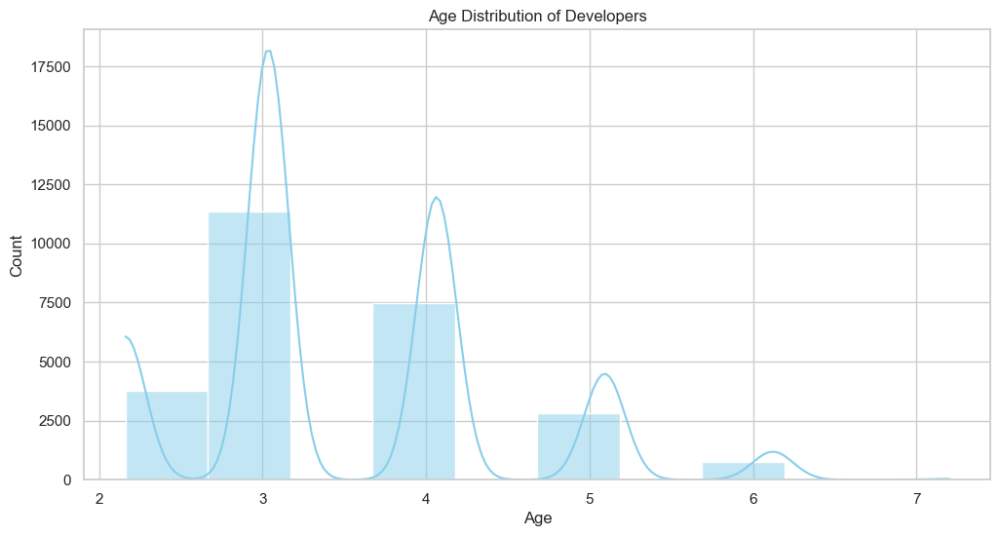

In [284]:
# plt.figure(figsize=(12, 6))
# sns.histplot(full_df['Age'], bins=10, kde=True, color='skyblue')
# plt.title("Age Distribution of Developers")
# plt.xlabel("Age")
# plt.ylabel("Count")
# plt.show()


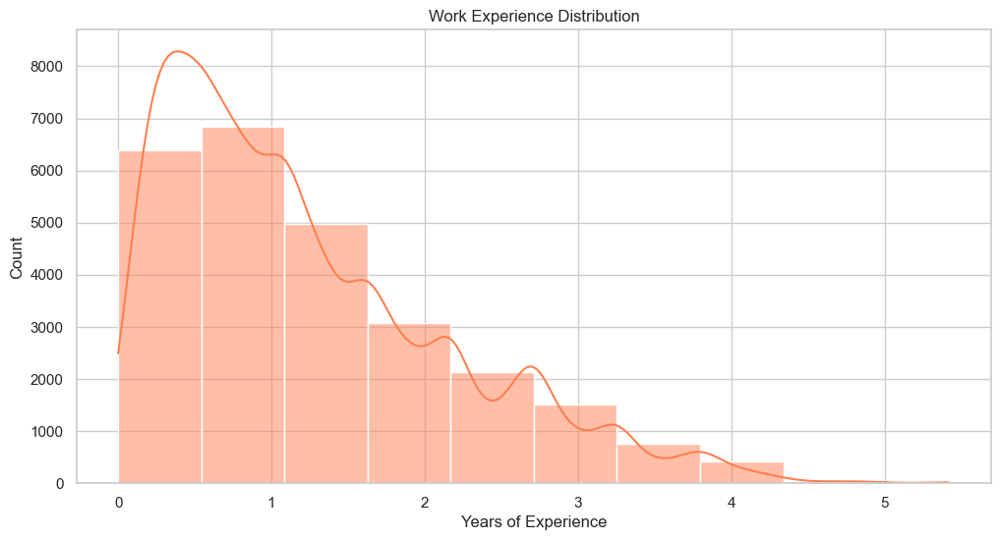

In [285]:
# plt.figure(figsize=(12, 6))
# sns.histplot(full_df['WorkExp'], bins=10, kde=True, color='coral')
# plt.title("Work Experience Distribution")
# plt.xlabel("Years of Experience")
# plt.ylabel("Count")
# plt.show()


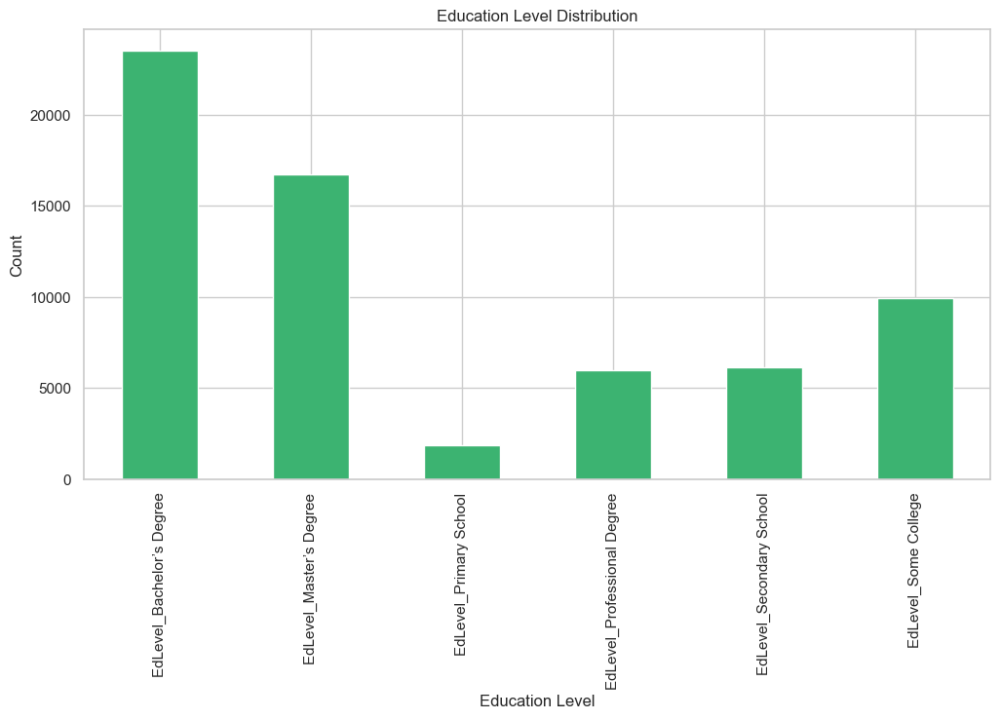

In [286]:
# plt.figure(figsize=(12, 6))
# education_columns = [col for col in full_df.columns if 'EdLevel' in col]
# education_counts = full_df[education_columns].sum()
# education_counts.plot(kind='bar', color='mediumseagreen')
# plt.title("Education Level Distribution")
# plt.xlabel("Education Level")
# plt.ylabel("Count")
# plt.show()


### Job Satisfaction ###

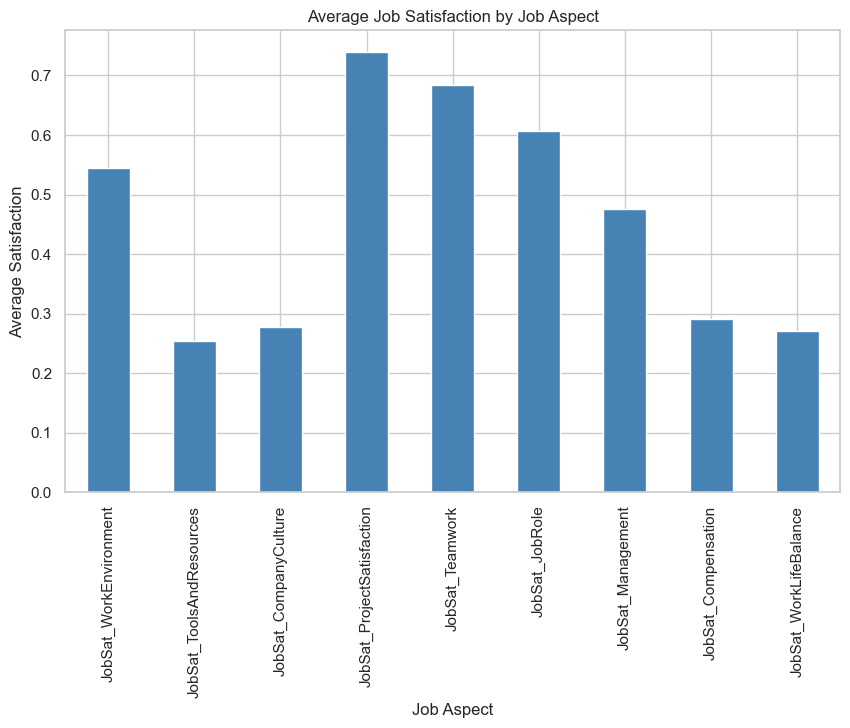

In [288]:
# job_sat_columns = [col for col in full_df.columns if 'JobSat_' in col]
# job_sat_data = full_df[job_sat_columns].mean()  # Assuming these columns are numerical scores

# plt.figure(figsize=(10, 6))
# job_sat_data.plot(kind='bar', color='steelblue')
# plt.title("Average Job Satisfaction by Job Aspect")
# plt.xlabel("Job Aspect")
# plt.ylabel("Average Satisfaction")
# plt.show()


### Remote Work and Work Environment ###

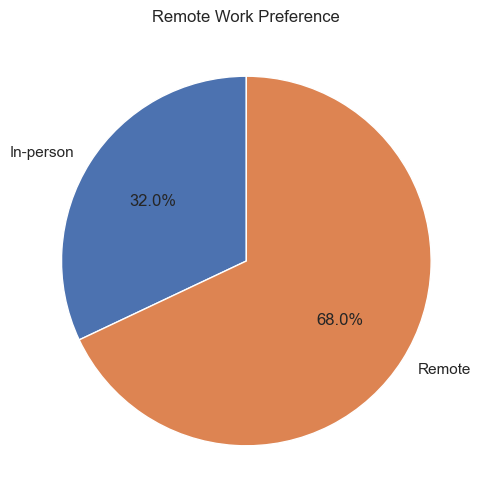

In [297]:
# # Select remote work columns with 'RemoteWork' in their names
# remote_work_columns = [col for col in full_df.columns if 'RemoteWork' in col]

# # Convert boolean columns to integers (True -> 1, False -> 0)
# full_df[remote_work_columns] = full_df[remote_work_columns].astype(int)

# # Sum the counts for each category
# remote_work_counts = full_df[remote_work_columns].sum()

# # Remove the 'RemoteWork_' prefix for cleaner labels in the pie chart
# remote_work_counts.index = [col.replace('RemoteWork_', '') for col in remote_work_counts.index]

# # Exclude rows with "nan" values in remote work columns
# remote_work_counts = remote_work_counts.drop('nan', errors='ignore')

# # Plot again
# plt.figure(figsize=(10, 6))
# remote_work_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90)
# plt.title("Remote Work Preference")
# plt.ylabel("")  # Clear the y-label for pie chart
# plt.show()


In [298]:
# # Check all column names to identify the correct one
# print(full_df.columns)


Index(['Age', 'WorkExp', 'JobSat_WorkEnvironment', 'JobSat_ToolsAndResources',
       'JobSat_CompanyCulture', 'JobSat_ProjectSatisfaction',
       'JobSat_Teamwork', 'JobSat_JobRole', 'JobSat_Management',
       'JobSat_Compensation',
       ...
       'ProfessionalQuestion_Microsoft Teams search',
       'ProfessionalQuestion_Other:', 'ProfessionalQuestion_Slack search',
       'ProfessionalQuestion_Traditional public search engine',
       'ProfessionalQuestion_nan', 'SurveyLength_Too Long', 'SurveyLength_nan',
       'SurveyEase_Easy', 'SurveyEase_nan', 'JobSat'],
      dtype='object', length=167)


### Technology and Tool Usage ###

In [296]:
# # Assuming 'LanguagesUsed' has comma-separated values for each language
# languages = full_df['LanguagesUsed'].str.get_dummies(sep=', ').sum().sort_values(ascending=False)
# plt.figure(figsize=(10, 6))
# languages.plot(kind='bar', color='slateblue')
# plt.title("Popularity of Programming Languages")
# plt.xlabel("Languages")
# plt.ylabel("Count")
# plt.show()


KeyError: 'LanguagesUsed'

In [300]:
# # Assuming 'Frameworks' and 'JobRole' columns exist
# frameworks = full_df['Frameworks'].str.get_dummies(sep=', ')
# frameworks_by_role = frameworks.groupby(full_df['JobRole']).sum()

# plt.figure(figsize=(12, 8))
# frameworks_by_role.plot(kind='bar', stacked=True, figsize=(12, 8))
# plt.title("Frameworks and Libraries by Developer Role")
# plt.xlabel("Job Role")
# plt.ylabel("Count")
# plt.legend(title='Frameworks', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.show()


KeyError: 'Frameworks'

### Community Participation and Learning Resources ###

In [294]:
# plt.figure(figsize=(10, 6))
# sns.histplot(full_df['StackOverflowUse'], kde=False, color='teal')
# plt.title("Frequency of Stack Overflow Participation")
# plt.xlabel("Usage Frequency")
# plt.ylabel("Count")
# plt.show()


KeyError: 'StackOverflowUse'

<Figure size 1000x600 with 0 Axes>

In [73]:
# learning_resources = full_df['LearningResources'].str.get_dummies(sep=', ').sum().sort_values(ascending=False)
# learning_resources.plot(kind='pie', autopct='%1.1f%%', startangle=90, figsize=(8, 8))
# plt.title("Preferred Learning Resources")
# plt.ylabel("")
# plt.show()


NameError: name 'full_df' is not defined

### AI Usage and Sentiment ###

In [ ]:
# ai_sent_columns = [col for col in full_df.columns if 'AISent_' in col]
# ai_sent_counts = full_df[ai_sent_columns].sum()

# plt.figure(figsize=(10, 6))
# ai_sent_counts.plot(kind='bar', color='purple')
# plt.title("Sentiment Toward AI")
# plt.xlabel("Sentiment")
# plt.ylabel("Count")
# plt.show()


In [ ]:
# ai_complex_columns = [col for col in full_df.columns if 'AIComplex_' in col]
# ai_complex_counts = full_df[ai_complex_columns].sum()

# plt.figure(figsize=(10, 6))
# ai_complex_counts.plot(kind='bar', color='crimson')
# plt.title("Perception of AI's Capability in Handling Complex Tasks")
# plt.xlabel("Complexity Handling")
# plt.ylabel("Count")
# plt.show()


### Geographical Distribution (requires external map data) ###

In [ ]:
# # Load the Natural Earth country shapefile
# world = gpd.read_file(r"D:\ReDI\Data Circle\Redi project Stackoverflow\gpd_countries\ne_110m_admin_0_countries.shp")

# # Assuming 'Country' column exists in `full_df` with country names
# country_counts = full_df['Country'].value_counts()
# world['count'] = world['NAME'].map(country_counts)  # Map counts to 'NAME' column in Natural Earth data

# # Plot the geographical distribution
# plt.figure(figsize=(12, 8))
# world.plot(column='count', cmap='Blues', legend=True, legend_kwds={'label': "Number of Developers"})
# plt.title("Geographical Distribution of Developers")
# plt.show()


Index(['PurchaseInfluence_I have little or no influence',
       'Knowledge_1_Strongly agree', 'Knowledge_2_Disagree',
       'Knowledge_2_Strongly agree', 'Knowledge_2_Strongly disagree',
       'Knowledge_3_Disagree', 'Knowledge_3_Strongly agree',
       'Knowledge_3_Strongly disagree', 'Knowledge_4_Disagree',
       'Knowledge_4_Strongly agree', 'Knowledge_4_Strongly disagree',
       'Knowledge_5_Disagree', 'Knowledge_5_Strongly agree',
       'Knowledge_5_Strongly disagree', 'Knowledge_7_Disagree',
       'Knowledge_7_Strongly agree', 'Knowledge_8_Disagree',
       'Knowledge_8_Strongly agree', 'Knowledge_8_Strongly disagree',
       'Frequency_3_10+ times a week', 'Frequency_3_3-5 times a week',
       'Frequency_3_Never', 'JobSat'],
      dtype='object')

AttributeError: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.

AttributeError: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.

KeyError: 'Gender'

<Figure size 800x600 with 0 Axes>

KeyError: 'Education'

<Figure size 1200x600 with 0 Axes>

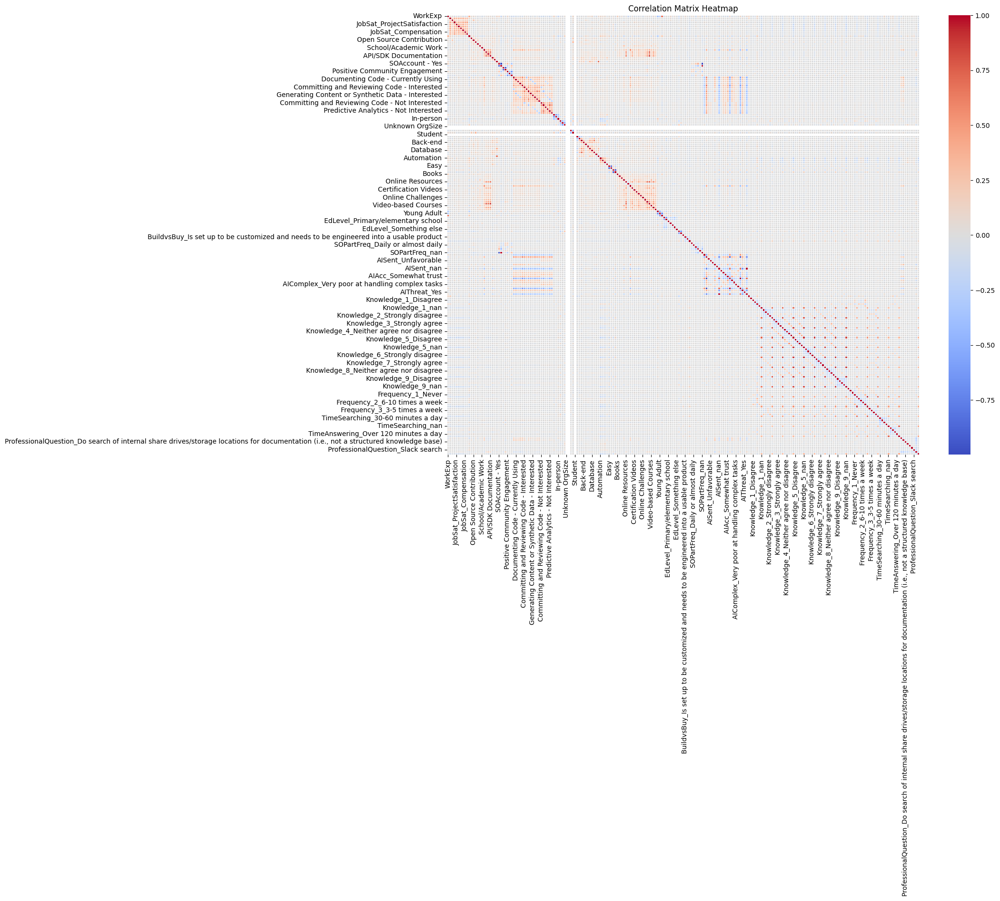

In [605]:
import matplotlib.pyplot as plt
import seaborn as sns
# Step 1: Calculate the correlation matrix
# correlation_matrix = X_train_transformed_df.corr()
# print("Correlation Matrix:")
# print(correlation_matrix)
correlation_matrix = X_train_transformed_df.corr()

# Save the correlation matrix to a CSV file
correlation_matrix.to_csv('correlation_matrix.csv', index=True)
# Step 1: Calculate correlation matrix
# correlation_matrix = X_train_transformed_df.corr()

# Step 2: Plot heatmap of the correlation matrix
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


In [36]:
# correlation_matrix

In [37]:
# # Find highly correlated features
# threshold = 0.8  # You can adjust this threshold
# highly_correlated_pairs = []

# for i in range(correlation_matrix.shape[0]):
#     for j in range(i+1, correlation_matrix.shape[1]):
#         if abs(correlation_matrix.iloc[i, j]) > threshold:
#             highly_correlated_pairs.append((correlation_matrix.index[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))

# # Display highly correlated pairs
# for feature1, feature2, correlation in highly_correlated_pairs:
#     print(f"{feature1} and {feature2} have a correlation of {correlation:.2f}")


In [38]:
# highly_correlated_pairs

In [464]:
import pandas as pd
import numpy as np

# Step 1: Calculate the correlation matrix of features
correlation_matrix = X_train_transformed_df.corr().abs()

# Step 2: Identify the upper triangle of the correlation matrix
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Step 3: Find features with high correlation among features
high_correlation_threshold = 0.8
features_to_drop_high_corr = [column for column in upper_triangle.columns if any(upper_triangle[column] > high_correlation_threshold)]

# Since 'Age' and 'WorkExp' have high correlation, decide which one to remove (example logic)
if 'Age' in features_to_drop_high_corr and 'WorkExp' not in features_to_drop_high_corr:
    features_to_drop_high_corr.remove('Age')
elif 'WorkExp' in features_to_drop_high_corr and 'Age' not in features_to_drop_high_corr:
    features_to_drop_high_corr.remove('WorkExp')

# Step 4: Find features with low correlation with the target
target_corr_threshold = 0.1
# Calculate correlation between each feature and the target variable (`y_train`)
target_corr = X_train_transformed_df.join(y_train.rename('JobSat')).corr()['JobSat'].abs()

# Get features with correlation below the threshold with target
low_corr_features = target_corr[target_corr < target_corr_threshold].index.tolist()

# Remove 'JobSat' from low_corr_features if it's included
if 'JobSat' in low_corr_features:
    low_corr_features.remove('JobSat')

# Step 5: Combine features to drop (either highly correlated with other features or with low correlation with target)
features_to_drop = list(set(features_to_drop_high_corr + low_corr_features))

# Step 6: Drop selected features from train and test sets
X_train_transformed_df = X_train_transformed_df.drop(columns=features_to_drop)
X_test_transformed_df = X_test_transformed_df.drop(columns=features_to_drop)

print(f"Features removed due to high or low correlation: {features_to_drop}")


Features removed due to high or low correlation: ['AIAcc_Neither trust nor distrust', 'Frequent', 'Documenting Code - Interested', 'Knowledge_4_Neither agree nor disagree', 'WorkExp', 'JobSat_Compensation', 'Full-time Employment', 'SOPartFreq_nan', 'JobSat_Management', 'Generating Content or Synthetic Data - Currently Using', 'Coding Sessions', 'Scripting', 'Knowledge_6_Neither agree nor disagree', 'AISent_nan', 'Embedded/Systems', 'Documenting Code - Currently Using', 'Social Media', 'PurchaseInfluence_I have some influence', 'AIAcc_Highly trust', 'Knowledge_1_Neither agree nor disagree', 'TimeSearching_Less than 15 minutes a day', 'AIAcc_Somewhat distrust', 'EdLevel_Primary/elementary school', 'Young Adult', 'SOPartFreq_A few times per week', 'Committing and Reviewing Code - Interested', 'JobSat_ToolsAndResources', 'Frequency_1_10+ times a week', 'SOAccount - Yes', 'AIAcc_nan', 'Written Tutorials', 'JavaScript Frameworks', 'Predictive Analytics - Not Interested', 'AISent_Very unfavor

In [606]:
X_train_transformed_df.head()

,WorkExp,JobSat_WorkEnvironment,JobSat_ToolsAndResources,JobSat_CompanyCulture,JobSat_ProjectSatisfaction,JobSat_Teamwork,JobSat_JobRole,JobSat_Management,JobSat_Compensation,JobSat_WorkLifeBalance,...,TimeAnswering_nan,ProfessionalQuestion_AI-powered search (free),ProfessionalQuestion_AI-powered search (paid),"ProfessionalQuestion_Do search of internal share drives/storage locations for documentation (i.e., not a structured knowledge base)",ProfessionalQuestion_Internal Developer portal,ProfessionalQuestion_Microsoft Teams search,ProfessionalQuestion_Other:,ProfessionalQuestion_Slack search,ProfessionalQuestion_Traditional public search engine,ProfessionalQuestion_nan
18367,2.554942,-0.337765,-0.411963,-0.007012,0.011329,-0.30735,0.362146,-0.659176,-0.046557,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0
24095,1.468915,-0.722026,-0.411963,-0.465425,-0.911238,0.984224,1.126169,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0
682,1.360313,-0.722026,-0.411963,-0.465425,-0.911238,-0.860882,-0.783889,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0
19059,-0.920344,-0.722026,-0.14246,-0.465425,1.302923,0.430692,-0.783889,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,0,0
30334,0.05708,-0.722026,-0.411963,-0.465425,-0.911238,0.984224,0.17114,-0.659176,-0.482186,-0.463136,...,0,0,0,0,0,0,0,0,1.0,0


In [607]:
print(X_train_transformed_df.shape)
print(y_train.shape)


(17247, 223)
(17247,)


In [ ]:
# just testing 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.losses import Huber

# Ensure data is scaled
scaler = RobustScaler(with_centering=False)
X_train_scaled = scaler.fit_transform(X_train_transformed_df)
X_test_scaled = scaler.transform(X_test_transformed_df)

# Define the neural network model architecture
def create_full_feature_model(input_dim, learning_rate=0.001, neurons=128, dropout_rate=0.3, l2_lambda=0.01):
    model = Sequential()
    model.add(Dense(neurons, input_dim=input_dim, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    
    model.add(Dense(neurons, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    
    model.add(Dense(1, activation='linear'))  # Regression output
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))
    return model

# Initialize the model
input_dim = X_train_scaled.shape[1]  # Using all 200 features
model = create_full_feature_model(input_dim=input_dim)

# Callbacks for early stopping and learning rate reduction
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)

# Train the model with all 200 features
history = model.fit(
    X_train_scaled, y_train,
    validation_split=0.2,
    epochs=50,  # Start with 50 epochs; increase as needed
    batch_size=64,
    callbacks=[early_stopping, lr_scheduler],
    verbose=1
)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate the model on the test set
y_test_pred = model.predict(X_test_scaled)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Test MSE: {test_mse}")
print(f"Test R-squared: {test_r2}")

# Plot predicted vs actual values
plt.scatter(y_test, y_test_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Neural Network: Actual vs Predicted')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.losses import Huber

# Ensure data is scaled
scaler = RobustScaler(with_centering=False)
X_train_scaled = scaler.fit_transform(X_train_transformed_df)
X_test_scaled = scaler.transform(X_test_transformed_df)

# Function to create the model with hyperparameters
def create_full_feature_model(input_dim, learning_rate=0.001, neurons=128, dropout_rate=0.3, l2_lambda=0.01):
    model = Sequential()
    model.add(Dense(neurons, input_dim=input_dim, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    
    model.add(Dense(neurons, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    
    model.add(Dense(1, activation='linear'))  # Regression output
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))
    return model

# Hyperparameter grid
param_grid = {
    'learning_rate': [0.001, 0.01],
    'neurons': [64, 128],
    'dropout_rate': [0.2, 0.3],
    'batch_size': [32, 64],
    'epochs': [10, 20]
}

# Variables to store best results
best_mse = float("inf")
best_params = {}

# Hyperparameter tuning loop
for learning_rate in param_grid['learning_rate']:
    for neurons in param_grid['neurons']:
        for dropout_rate in param_grid['dropout_rate']:
            for batch_size in param_grid['batch_size']:
                for epochs in param_grid['epochs']:
                    print(f"Training model with lr={learning_rate}, neurons={neurons}, dropout={dropout_rate}, "
                          f"batch_size={batch_size}, epochs={epochs}")
                    
                    # Initialize the model
                    input_dim = X_train_scaled.shape[1]
                    model = create_full_feature_model(input_dim=input_dim, learning_rate=learning_rate, 
                                                      neurons=neurons, dropout_rate=dropout_rate)
                    
                    # Callbacks for early stopping and learning rate reduction
                    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                    
                    # Train the model with the current parameters
                    history = model.fit(
                        X_train_scaled, y_train,
                        validation_split=0.2,
                        epochs=epochs,
                        batch_size=batch_size,
                        callbacks=[early_stopping, lr_scheduler],
                        verbose=0
                    )
                    
                    # Calculate validation MSE
                    y_val_pred = model.predict(X_train_scaled[int(0.8 * len(X_train_scaled)):])  # last 20% as validation
                    val_mse = mean_squared_error(y_train[int(0.8 * len(X_train_scaled)):], y_val_pred)
                    
                    # Check if this configuration is better
                    if val_mse < best_mse:
                        best_mse = val_mse
                        best_params = {
                            'learning_rate': learning_rate,
                            'neurons': neurons,
                            'dropout_rate': dropout_rate,
                            'batch_size': batch_size,
                            'epochs': epochs
                        }

# Display best hyperparameters
print("Best hyperparameters found:")
print(best_params)
print(f"Validation MSE with best parameters: {best_mse}")

# Train final model using the best parameters
model = create_full_feature_model(input_dim=input_dim, **best_params)
history = model.fit(
    X_train_scaled, y_train,
    validation_split=0.2,
    epochs=best_params['epochs'],
    batch_size=best_params['batch_size'],
    callbacks=[early_stopping, lr_scheduler],
    verbose=1
)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate the model on the test set
y_test_pred = model.predict(X_test_scaled)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Test MSE: {test_mse}")
print(f"Test R-squared: {test_r2}")

# Plot predicted vs actual values
plt.scatter(y_test, y_test_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Neural Network: Actual vs Predicted')
plt.grid(True)
plt.show()


In [204]:
# # Ensure that both X_train and y_train are aligned
# X_train_transformed_df = X_train_transformed_df.loc[y_train.index]

# # Verify that both now have the same number of rows
# print(X_train_transformed_df.shape)
# print(y_train.shape)


Fitting 3 folds for each of 50 candidates, totalling 150 fits


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


48 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
33 fits failed with the following error:
Traceback (most recent call last):
  File "d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\sklea

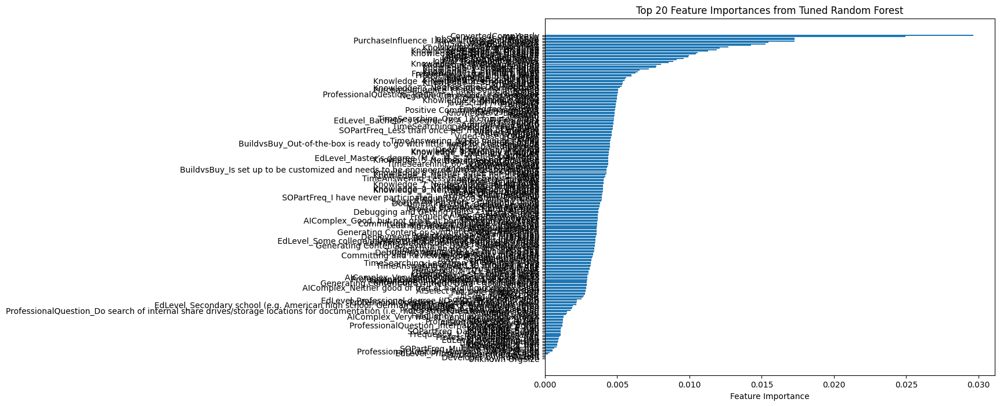

                                             Feature  Importance
10                               ConvertedCompYearly    0.029643
0                                            WorkExp    0.024954
4                         JobSat_ProjectSatisfaction    0.017263
109  PurchaseInfluence_I have little or no influence    0.017260
5                                    JobSat_Teamwork    0.017258
1                             JobSat_WorkEnvironment    0.015472
6                                     JobSat_JobRole    0.015256
7                                  JobSat_Management    0.014247
151                       Knowledge_2_Strongly agree    0.012687
179                             Knowledge_8_Disagree    0.012071
182                    Knowledge_8_Strongly disagree    0.011890
159                             Knowledge_4_Disagree    0.011271
157                    Knowledge_3_Strongly disagree    0.010570
154                             Knowledge_3_Disagree    0.010452
8                        

In [609]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Instantiate the RandomForestRegressor
rf = RandomForestRegressor(random_state=42)

# RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, 
                                   n_iter=50, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit to the data without 'ResponseId'
random_search.fit(X_train_transformed_df, y_train)

# Get the best estimator
best_rf = random_search.best_estimator_

# Extract feature importances from the best model
importances = best_rf.feature_importances_
feature_names = X_train_transformed_df.columns
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort feature importances in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)




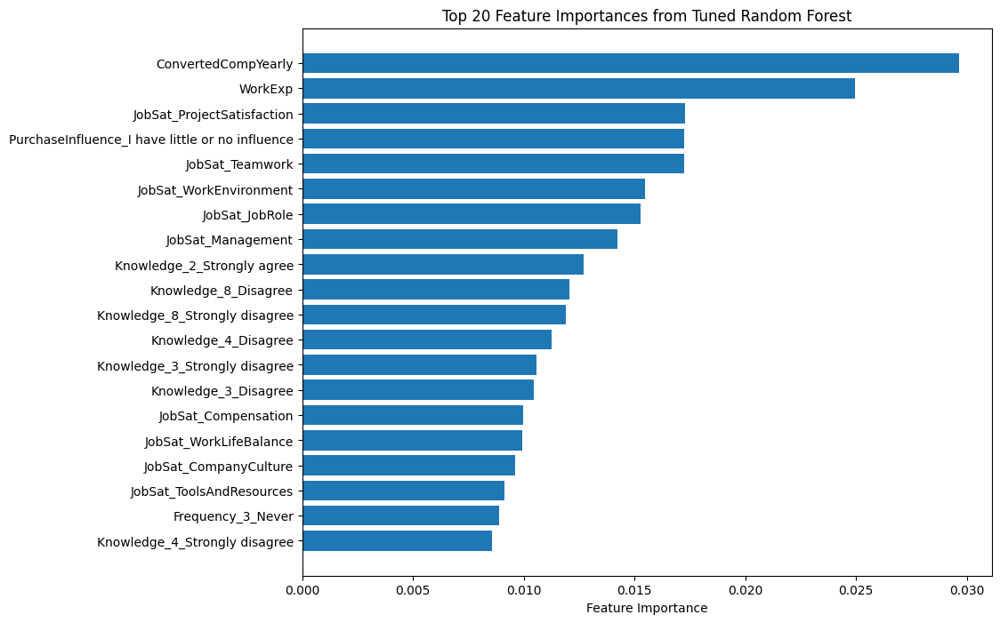

                                             Feature  Importance
10                               ConvertedCompYearly    0.029643
0                                            WorkExp    0.024954
4                         JobSat_ProjectSatisfaction    0.017263
109  PurchaseInfluence_I have little or no influence    0.017260
5                                    JobSat_Teamwork    0.017258
1                             JobSat_WorkEnvironment    0.015472
6                                     JobSat_JobRole    0.015256
7                                  JobSat_Management    0.014247
151                       Knowledge_2_Strongly agree    0.012687
179                             Knowledge_8_Disagree    0.012071
182                    Knowledge_8_Strongly disagree    0.011890
159                             Knowledge_4_Disagree    0.011271
157                    Knowledge_3_Strongly disagree    0.010570
154                             Knowledge_3_Disagree    0.010452
8                        

In [610]:

# Plot the top feature importances
plt.figure(figsize=(10, 8))
plt.barh(feature_importances['Feature'][:20], feature_importances['Importance'][:20])
plt.gca().invert_yaxis()
plt.xlabel('Feature Importance')
plt.title('Top 20 Feature Importances from Tuned Random Forest')
plt.show()

# Display feature importances as DataFrame
print(feature_importances.head(20))


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the top 20 features
top_20_features = feature_importances['Feature'][:20].tolist()

# Create a DataFrame with the top 20 features and the target variable
top_20_df = X_train_transformed_df[top_20_features].copy()
top_20_df['JobSat'] = y_train.values  # Ensure alignment

# Calculate the correlation matrix
correlation_top_20 = top_20_df.corr()

# Display the correlation between the top 20 features and the target variable
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_top_20[['JobSat']].sort_values(by='JobSat', ascending=False),
            annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation of Top 20 Features with Job Satisfaction')
plt.show()


For the given number of features (121), **Random Forest** can indeed be a good choice for a baseline model, but it's important to weigh its pros and cons against a **Neural Network** model, especially given the differences in the types of problems each model can effectively solve. Let’s look at both:

### 1. **Random Forest as a Baseline**
Random Forest is a solid choice for a baseline model for several reasons:

- **Ease of Use**: Random Forest works well without a lot of hyperparameter tuning. It's generally good at capturing interactions between features, and it doesn’t require feature scaling, which makes it relatively easy to implement and interpret.

- **Handling Many Features**: Random Forest can handle datasets with many features effectively. Since each tree in the forest uses a subset of features, it’s capable of managing a large number of inputs without overfitting too easily.

- **Feature Importance**: Random Forest gives insights into feature importance. With 121 features, it's helpful to have a model that can directly tell you which features are contributing the most. This is useful for feature selection and understanding your data better.

- **Overfitting Risk**: Random Forest is good at avoiding overfitting by aggregating predictions across many trees. However, if you have many correlated features, Random Forest may become less effective.

- **Computational Cost**: Training a Random Forest on 121 features may be computationally intensive depending on the number of estimators (`n_estimators`) and the size of the dataset, but it’s generally feasible on a reasonably powerful machine.

- **Suitability**: Random Forest is well suited for structured/tabular data, which is typically the case when dealing with survey or categorical datasets like yours. It may not be as efficient if the underlying relationships between features are highly complex and nonlinear.

### 2. **Neural Network for Baseline**
Using a **Neural Network** as a baseline model is also possible, but there are a few key considerations:

- **Complexity Handling**: Neural Networks are powerful when dealing with complex relationships and high-dimensional data. If the relationships among the features are nonlinear and complex, a neural network can model these dependencies better than a Random Forest.

- **Scalability**: Neural Networks can scale well with a high number of features. However, the more features you have, the more likely the network will require more hidden layers and neurons to capture relationships effectively, which increases the computational complexity.

- **Hyperparameter Sensitivity**: Neural Networks are more sensitive to hyperparameter choices compared to Random Forest. You need to carefully tune learning rates, the number of layers, activation functions, etc., to get good performance. This makes them more challenging as a baseline compared to Random Forest, which can perform reasonably well with default parameters.

- **Risk of Overfitting**: Neural Networks are prone to overfitting, especially if the dataset isn't large enough. Techniques like dropout, L2 regularization, and early stopping can help, but they add to the complexity of building the model.

- **Training Time**: Neural Networks generally require more time to train compared to Random Forests, especially when the dataset is large or has many features.

- **Feature Engineering Requirement**: Neural Networks often benefit from having informative features. If your features are not particularly engineered to be useful for prediction, a Random Forest may handle the original features more efficiently without extensive feature engineering.

### **Comparison for Baseline Choice**
- **Interpretability**: Random Forest is much easier to interpret, especially with respect to understanding feature importance. Neural Networks tend to be "black boxes" and may not provide direct interpretability, which is often important in the baseline phase.
  
- **Speed and Complexity**: Random Forest is generally faster to train and evaluate, and requires fewer computational resources compared to a Neural Network. This makes Random Forest a strong candidate for a baseline to assess the feasibility of a project quickly.

- **Performance**: Neural Networks can potentially outperform Random Forests if the relationships are complex and there’s enough data for the model to learn from. However, as a baseline, the Random Forest may suffice to give you an idea of the model’s predictive power with simpler hyperparameter tuning.

- **High Feature Count**: Both Random Forest and Neural Networks can handle high feature counts, but Random Forest is often more robust in the early stages of exploration when you don't yet know which features are important. It allows you to quickly identify the most relevant features before moving to more complex models like Neural Networks.

### **Recommendation**
- Start with **Random Forest** as your baseline. It’s easier to implement, interpret, and evaluate, which allows you to quickly determine if your features have predictive power.
- Once you establish a baseline, you can try to optimize the Random Forest and, eventually, move to a **Neural Network** model to potentially improve your performance, especially if you observe that the relationships in your data are highly nonlinear and complex.
- Use **feature importance** from Random Forest to reduce the number of features, and then use those reduced features with a Neural Network to see if it performs better with a simplified, relevant input space.

In short, **Random Forest** is a suitable baseline due to its robustness and simplicity, and you can consider the **Neural Network** afterward for deeper optimization, provided you have enough data and computational resources to train it effectively.

In [611]:
num_columns = X_train_transformed_df.shape[1]
print(f"Number of columns (features) used to train the model: {num_columns}")


Number of columns (features) used to train the model: 223


In [612]:
print("Columns (features) used to train the model:")
X_train_transformed_df.columns.tolist()


Columns (features) used to train the model:


['WorkExp',
 'JobSat_WorkEnvironment',
 'JobSat_ToolsAndResources',
 'JobSat_CompanyCulture',
 'JobSat_ProjectSatisfaction',
 'JobSat_Teamwork',
 'JobSat_JobRole',
 'JobSat_Management',
 'JobSat_Compensation',
 'JobSat_WorkLifeBalance',
 'ConvertedCompYearly',
 'Bootstrapping Business',
 'Open Source Contribution',
 'Freelance/Contract Work',
 'Hobby',
 'Professional Development',
 'School/Academic Work',
 'AI Tools',
 'Knowledge Bases',
 'Public Search Engine',
 'API/SDK Documentation',
 'Cloud Platforms',
 'Data Processing',
 'Programming Frameworks',
 'SOAccount - Yes',
 'SOAccount - No',
 'Frequent',
 'Very Frequent',
 'Positive Community Engagement',
 'Neutral Community Engagement',
 'Negative Community Engagement',
 'Debugging and Getting Help - Currently Using',
 'Documenting Code - Currently Using',
 'Generating Content or Synthetic Data - Currently Using',
 'Learning About Codebase - Currently Using',
 'Search for Answers - Currently Using',
 'Committing and Reviewing Code - I

In [67]:
# from sklearn.linear_model import Lasso
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.metrics import mean_squared_error
# import numpy as np

# # Define the Lasso model
# lasso = Lasso(max_iter=10000)

# # Set up the parameter distribution for alpha
# param_dist = {'alpha': np.logspace(-4, 2, 100)}  # Randomly sample alpha from 0.0001 to 100

# # Use RandomizedSearchCV to find the best alpha
# random_search = RandomizedSearchCV(estimator=lasso, param_distributions=param_dist, 
#                                    n_iter=50, cv=5, scoring='neg_mean_squared_error', 
#                                    random_state=42, n_jobs=-1, verbose=2)

# # Fit the model to the training data
# random_search.fit(X_train_transformed_df, y_train)

# # Get the best model and alpha
# best_lasso = random_search.best_estimator_
# best_alpha = random_search.best_params_['alpha']

# # Print the best alpha value
# print(f"Best alpha (regularization strength): {best_alpha}")

# # Predict on the training set and calculate MSE
# y_train_pred = best_lasso.predict(X_train_transformed_df)
# train_mse = mean_squared_error(y_train, y_train_pred)
# print(f"Training MSE: {train_mse}")

# # Predict on the test set
# y_test_pred = best_lasso.predict(X_test_transformed_df)
# test_mse = mean_squared_error(y_test, y_test_pred)
# print(f"Test MSE: {test_mse}")


In [68]:
# from sklearn.linear_model import Lasso
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error, r2_score
# import numpy as np

# # Define the Lasso model
# lasso = Lasso(max_iter=10000)

# # Set up the parameter grid for alpha (regularization strength)
# param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

# # Use GridSearchCV to find the best alpha
# grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, 
#                            cv=5, scoring='neg_mean_squared_error', 
#                            n_jobs=-1, verbose=2)

# # Fit the model to the training data
# grid_search.fit(X_train_transformed_df, y_train)

# # Get the best model and alpha
# best_lasso = grid_search.best_estimator_
# best_alpha = grid_search.best_params_['alpha']

# # Print the best alpha value
# print(f"Best alpha (regularization strength): {best_alpha}")

# # Predict on the training set and calculate MSE
# y_train_pred = best_lasso.predict(X_train_transformed_df)
# train_mse = mean_squared_error(y_train, y_train_pred)
# print(f"Training MSE: {train_mse}")

# # Predict on the test set
# y_test_pred = best_lasso.predict(X_test_transformed_df)
# test_mse = mean_squared_error(y_test, y_test_pred)
# print(f"Test MSE: {test_mse}")


In [69]:
X_train_transformed_df.shape

(23271, 23)

In [70]:
# from sklearn.linear_model import Lasso
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error, r2_score
# import numpy as np

# # Define the Lasso model
# lasso = Lasso(max_iter=10000)

# # Set up the parameter grid for alpha (regularization strength)
# param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

# # Use GridSearchCV to find the best alpha
# grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, 
#                            cv=5, scoring='neg_mean_squared_error', 
#                            n_jobs=-1, verbose=2)

# # Fit the model to the training data
# grid_search.fit(X_train_transformed_df, y_train)

# # Get the best model and alpha
# best_lasso = grid_search.best_estimator_
# best_alpha = grid_search.best_params_['alpha']

# # Print the best alpha value
# print(f"Best alpha (regularization strength): {best_alpha}")

# # Predict on the training set and calculate MSE and R-squared
# y_train_pred = best_lasso.predict(X_train_transformed_df)
# train_mse = mean_squared_error(y_train, y_train_pred)
# train_r2 = r2_score(y_train, y_train_pred)
# print(f"Training MSE: {train_mse}")
# print(f"Training R-squared: {train_r2}")

# # Predict on the test set and calculate MSE and R-squared
# y_test_pred = best_lasso.predict(X_test_transformed_df)
# test_mse = mean_squared_error(y_test, y_test_pred)
# test_r2 = r2_score(y_test, y_test_pred)
# print(f"Test MSE: {test_mse}")
# print(f"Test R-squared: {test_r2}")


In [71]:
# train_r2 = r2_score(y_train, y_train_pred)
# print(f"Training R-squared: {train_r2}")

In [72]:
# test_r2 = r2_score(y_test, y_test_pred)
# print(f"Test R-squared: {test_r2}")

In [73]:
# from sklearn.linear_model import Ridge
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error, r2_score
# import numpy as np

# # Define the Ridge model
# ridge = Ridge(max_iter=10000)

# # Set up the parameter grid for alpha (regularization strength)
# param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

# # Use GridSearchCV to find the best alpha
# grid_search_ridge = GridSearchCV(estimator=ridge, param_grid=param_grid, 
#                                  cv=5, scoring='neg_mean_squared_error', 
#                                  n_jobs=-1, verbose=2)

# # Fit the model to the training data
# grid_search_ridge.fit(X_train_transformed_df, y_train)

# # Get the best model and alpha
# best_ridge = grid_search_ridge.best_estimator_
# best_alpha_ridge = grid_search_ridge.best_params_['alpha']

# # Print the best alpha value
# print(f"Best alpha (regularization strength) for Ridge: {best_alpha_ridge}")

# # Predict on the training set and calculate MSE and R-squared
# y_train_pred_ridge = best_ridge.predict(X_train_transformed_df)
# train_mse_ridge = mean_squared_error(y_train, y_train_pred_ridge)
# train_r2_ridge = r2_score(y_train, y_train_pred_ridge)
# print(f"Training MSE (Ridge): {train_mse_ridge}")
# print(f"Training R-squared (Ridge): {train_r2_ridge}")

# # Predict on the test set and calculate MSE and R-squared
# y_test_pred_ridge = best_ridge.predict(X_test_transformed_df)
# test_mse_ridge = mean_squared_error(y_test, y_test_pred_ridge)
# test_r2_ridge = r2_score(y_test, y_test_pred_ridge)
# print(f"Test MSE (Ridge): {test_mse_ridge}")
# print(f"Test R-squared (Ridge): {test_r2_ridge}")


In [74]:
# from sklearn.linear_model import Ridge
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error
# import numpy as np

# # Define the Ridge model
# ridge = Ridge(max_iter=10000)

# # Set up the parameter grid for alpha (regularization strength)
# param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

# # Use GridSearchCV to find the best alpha
# grid_search_ridge = GridSearchCV(estimator=ridge, param_grid=param_grid, 
#                                  cv=5, scoring='neg_mean_squared_error', 
#                                  n_jobs=-1, verbose=2)

# # Fit the model to the training data
# grid_search_ridge.fit(X_train_transformed_df, y_train)

# # Get the best model and alpha
# best_ridge = grid_search_ridge.best_estimator_
# best_alpha_ridge = grid_search_ridge.best_params_['alpha']

# # Print the best alpha value
# print(f"Best alpha (regularization strength) for Ridge: {best_alpha_ridge}")

# # Predict on the training set and calculate MSE
# y_train_pred_ridge = best_ridge.predict(X_train_transformed_df)
# train_mse_ridge = mean_squared_error(y_train, y_train_pred_ridge)
# print(f"Training MSE (Ridge): {train_mse_ridge}")




# # Predict on the test set and calculate MSE
# y_test_pred_ridge = best_ridge.predict(X_test_transformed_df)
# test_mse_ridge = mean_squared_error(y_test, y_test_pred_ridge)
# print(f"Test MSE (Ridge): {test_mse_ridge}")


In [75]:
# # Store the MSE values for Lasso and Ridge in variables (no hardcoding)
# lasso_train_mse = train_mse
# lasso_test_mse = test_mse

# ridge_train_mse = train_mse_ridge
# ridge_test_mse = test_mse_ridge

# # Define the model names and MSE values for plotting
# models = ['Lasso', 'Ridge']
# train_mse_values = [lasso_train_mse, ridge_train_mse]
# test_mse_values = [lasso_test_mse, ridge_test_mse]

# # Create a plot comparing Lasso and Ridge MSE values
# plt.figure(figsize=(10, 6))

# # Plot training MSE values
# plt.bar(models, train_mse_values, width=0.4, label='Training MSE', align='center', color='blue')

# # Plot test MSE values
# plt.bar(models, test_mse_values, width=0.4, label='Test MSE', align='edge', color='orange')

# # Add labels and title
# plt.ylabel('Mean Squared Error')
# plt.title('Comparison of Lasso vs Ridge: MSE')
# plt.legend()

# # Display the plot
# plt.show()


In [76]:
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.metrics import mean_squared_error, r2_score
# import numpy as np

# # Define the Random Forest Regressor
# rf = RandomForestRegressor(random_state=42)

# # Define the parameter grid for RandomizedSearchCV
# param_dist = {
#     'n_estimators': [100, 200, 300, 400, 500],  # Number of trees
#     'max_depth': [None, 10, 20, 30, 40],  # Depth of trees
#     'min_samples_split': [2, 5, 10],  # Minimum samples to split a node
#     'min_samples_leaf': [1, 2, 4],  # Minimum samples in a leaf node
#     'max_features': ['sqrt', 'log2']  # Number of features to consider at each split (removed 'auto')
# }

# # Use RandomizedSearchCV to find the best hyperparameters
# random_search_rf = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, 
#                                       n_iter=50, cv=5, verbose=2, random_state=42, n_jobs=-1)

# # Fit the RandomizedSearchCV model to the training data
# random_search_rf.fit(X_train_transformed_df, y_train)

# # Get the best Random Forest model and parameters
# best_rf = random_search_rf.best_estimator_
# best_params_rf = random_search_rf.best_params_

# # Print the best hyperparameters
# print(f"Best parameters for Random Forest: {best_params_rf}")

# # Predict on the training data and calculate MSE and R-squared
# y_train_pred_rf = best_rf.predict(X_train_transformed_df)
# train_mse_rf = mean_squared_error(y_train, y_train_pred_rf)
# train_r2_rf = r2_score(y_train, y_train_pred_rf)
# print(f"Training MSE (Random Forest): {train_mse_rf}")
# print(f"Training R-squared (Random Forest): {train_r2_rf}")

# # Predict on the test data and calculate MSE and R-squared
# y_test_pred_rf = best_rf.predict(X_test_transformed_df)
# test_mse_rf = mean_squared_error(y_test, y_test_pred_rf)
# test_r2_rf = r2_score(y_test, y_test_pred_rf)
# print(f"Test MSE (Random Forest): {test_mse_rf}")
# print(f"Test R-squared (Random Forest): {test_r2_rf}")


In [77]:
# import matplotlib.pyplot as plt

# # Plot predicted vs actual values for training set
# plt.figure(figsize=(12, 6))

# plt.subplot(1, 2, 1)
# plt.scatter(y_train, y_train_pred_rf, alpha=0.7, color='blue', edgecolors='k')
# plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)  # Line of perfect prediction
# plt.xlabel('Actual (Training)')
# plt.ylabel('Predicted (Training)')
# plt.title('Random Forest: Actual vs Predicted (Training Set)')
# plt.grid(True)

# # Plot predicted vs actual values for test set
# plt.subplot(1, 2, 2)
# plt.scatter(y_test, y_test_pred_rf, alpha=0.7, color='green', edgecolors='k')
# plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of perfect prediction
# plt.xlabel('Actual (Test)')
# plt.ylabel('Predicted (Test)')
# plt.title('Random Forest: Actual vs Predicted (Test Set)')
# plt.grid(True)

# plt.tight_layout()
# plt.show()


In [209]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import KFold
from scipy import stats
import numpy as np
import pandas as pd

# Sort feature importances in descending order (if not already sorted)
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Features to test: top 5, 10, 15, and 20 features
features_to_test = [5, 10, 15, 20]

# Dictionary to store results for each feature subset
results = {}

# Apply RobustScaler to handle potential outliers and scale the data with `with_centering=False`
scaler = RobustScaler(with_centering=False)

# Degrees to test for polynomial features
degrees_to_test = [2, 3, 4, 5]  # You can extend this to higher degrees, but beware of overfitting

for degree in degrees_to_test:
    print(f"\nTesting Polynomial Degree: {degree}")
    
    poly = PolynomialFeatures(degree=degree, include_bias=False)  # Polynomial feature generator
    
    for num_features in features_to_test:
        # Extract the top N features based on sorted feature importance
        top_n_features = feature_importances['Feature'][:num_features].tolist()

        # Filter X_train and X_test to keep only the top N features
        X_train_topN = X_train_transformed_df[top_n_features]
        X_test_topN = X_test_transformed_df[top_n_features]

        # Remove outliers using z-score threshold (if necessary)
        z_scores = np.abs(stats.zscore(X_train_topN))
        X_train_cleaned = X_train_topN[(z_scores < 3).all(axis=1)]
        y_train_cleaned = y_train[X_train_cleaned.index]

        # Generate polynomial features to capture non-linear relationships
        X_train_poly = poly.fit_transform(X_train_cleaned)
        X_test_poly = poly.transform(X_test_topN)

        # Scale the training and test data using RobustScaler with centering disabled for sparse data
        X_train_scaled = scaler.fit_transform(X_train_poly)
        X_test_scaled = scaler.transform(X_test_poly)

        # Define the Lasso model
        lasso = Lasso(max_iter=10000)

        # Set up the parameter grid for alpha (regularization strength)
        param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

        # Use GridSearchCV to find the best alpha
        grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, 
                                   cv=5, scoring='neg_mean_squared_error', 
                                   n_jobs=-1, verbose=2)

        # Fit the model to the training data with the top N features
        grid_search.fit(X_train_scaled, y_train_cleaned)

        # Get the best Lasso model and alpha
        best_lasso = grid_search.best_estimator_
        best_alpha = grid_search.best_params_['alpha']

        # Print the best alpha value
        print(f"\nTop {num_features} Features with Degree {degree}:")
        print(f"Best alpha (regularization strength): {best_alpha}")

        # Predict on the training set and calculate MSE and R-squared
        y_train_pred = best_lasso.predict(X_train_scaled)
        train_mse = mean_squared_error(y_train_cleaned, y_train_pred)
        train_r2 = r2_score(y_train_cleaned, y_train_pred)
        print(f"Training MSE: {train_mse}")
        print(f"Training R-squared: {train_r2}")

        # Predict on the test set and calculate MSE and R-squared
        y_test_pred = best_lasso.predict(X_test_scaled)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_r2 = r2_score(y_test, y_test_pred)
        print(f"Test MSE: {test_mse}")
        print(f"Test R-squared: {test_r2}")

        # Store results in the dictionary
        results[(num_features, degree)] = {'Best Alpha': best_alpha, 
                                           'Training MSE': train_mse, 
                                           'Training R-squared': train_r2, 
                                           'Test MSE': test_mse, 
                                           'Test R-squared': test_r2}

# Print final results summary
print("\nSummary of Results for Different Feature Subsets and Polynomial Degrees:")
for (num_features, degree), metrics in results.items():
    print(f"\nTop {num_features} Features with Polynomial Degree {degree}:")



Testing Polynomial Degree: 2
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 5 Features with Degree 2:
Best alpha (regularization strength): 0.00011497569953977356
Training MSE: 3.6636865597334247
Training R-squared: 0.0644049206110896
Test MSE: 4.005910195190007
Test R-squared: 0.051949409066075036
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 10 Features with Degree 2:
Best alpha (regularization strength): 0.0032745491628777285
Training MSE: 3.445900835111579
Training R-squared: 0.10785412219309509
Test MSE: 3.830687999419236
Test R-squared: 0.09341801374040937
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 15 Features with Degree 2:
Best alpha (regularization strength): 0.004977023564332114
Training MSE: 3.383413919978319
Training R-squared: 0.09579705901105207
Test MSE: 3.797260997801127
Test R-squared: 0.10132894710962193
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 20 Features with Degree 2:
Be

KeyboardInterrupt: 

ValueError: Shape of passed values is (18362, 1), indices imply (18362, 5)

In [78]:
# from sklearn.linear_model import Lasso
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error, r2_score
# from sklearn.preprocessing import RobustScaler
# from sklearn.model_selection import KFold
# import numpy as np
# import pandas as pd

# # Sort feature importances in descending order (if not already sorted)
# feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# # Features to test: top 5, 10, 15, and 20 features
# features_to_test = [5, 10, 15, 20]

# # Dictionary to store results for each feature subset
# results = {}

# # Apply RobustScaler to handle potential outliers and scale the data
# scaler = RobustScaler()

# for num_features in features_to_test:
#     # Extract the top N features based on sorted feature importance
#     top_n_features = feature_importances['Feature'][:num_features].tolist()

#     # Filter X_train and X_test to keep only the top N features
#     X_train_topN = X_train_transformed_df[top_n_features]
#     X_test_topN = X_test_transformed_df[top_n_features]

#     # Scale the training and test data
#     X_train_scaled = scaler.fit_transform(X_train_topN)
#     X_test_scaled = scaler.transform(X_test_topN)

#     # Define the Lasso model
#     lasso = Lasso(max_iter=10000)

#     # Set up the parameter grid for alpha (regularization strength)
#     param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

#     # Use GridSearchCV to find the best alpha
#     grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, 
#                                cv=5, scoring='neg_mean_squared_error', 
#                                n_jobs=-1, verbose=2)

#     # Fit the model to the training data with the top N features
#     grid_search.fit(X_train_scaled, y_train)

#     # Get the best Lasso model and alpha
#     best_lasso = grid_search.best_estimator_
#     best_alpha = grid_search.best_params_['alpha']

#     # Print the best alpha value
#     print(f"\nTop {num_features} Features:")
#     print(f"Best alpha (regularization strength): {best_alpha}")

#     # Predict on the training set and calculate MSE and R-squared
#     y_train_pred = best_lasso.predict(X_train_scaled)
#     train_mse = mean_squared_error(y_train, y_train_pred)
#     train_r2 = r2_score(y_train, y_train_pred)
#     print(f"Training MSE: {train_mse}")
#     print(f"Training R-squared: {train_r2}")

#     # Predict on the test set and calculate MSE and R-squared
#     y_test_pred = best_lasso.predict(X_test_scaled)
#     test_mse = mean_squared_error(y_test, y_test_pred)
#     test_r2 = r2_score(y_test, y_test_pred)
#     print(f"Test MSE: {test_mse}")
#     print(f"Test R-squared: {test_r2}")

#     # Store results in the dictionary
#     results[num_features] = {'Best Alpha': best_alpha, 
#                              'Training MSE': train_mse, 
#                              'Training R-squared': train_r2, 
#                              'Test MSE': test_mse, 
#                              'Test R-squared': test_r2}

# # Print final results summary
# print("\nSummary of Results for Different Feature Subsets:")
# for num_features, metrics in results.items():
#     print(f"\nTop {num_features} Features:")
#     print(f"Best Alpha: {metrics['Best Alpha']}")
#     print(f"Training MSE: {metrics['Training MSE']}")
#     print(f"Training R-squared: {metrics['Training R-squared']}")
#     print(f"Test MSE: {metrics['Test MSE']}")
#     print(f"Test R-squared: {metrics['Test R-squared']}")


Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 5 Features:
Best alpha (regularization strength): 0.0001
Training MSE: 3.9496126335775954
Training R-squared: 0.1011139522410699
Test MSE: 3.858859953186117
Test R-squared: 0.086750755585565
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 10 Features:
Best alpha (regularization strength): 0.0001
Training MSE: 3.751591790936757
Training R-squared: 0.14618120038132199
Test MSE: 3.677053678107208
Test R-squared: 0.1297775680016331
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 15 Features:
Best alpha (regularization strength): 0.0001
Training MSE: 3.6834579213043956
Training R-squared: 0.16168767923742178
Test MSE: 3.6125156021842426
Test R-squared: 0.14505134051155422
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 20 Features:
Best alpha (regularization strength): 0.0001
Training MSE: 3.6592791634678252
Training R-squared: 0.16719048421800753
Test MSE: 3.59209

In [79]:
# from sklearn.linear_model import Lasso
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error, r2_score
# import numpy as np

# # Sort feature importances in descending order (if not already sorted)
# feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# # Features to test: top 5, 10, 15, and 20 features
# features_to_test = [5, 10, 15, 20]

# # Dictionary to store results for each feature subset
# results = {}

# for num_features in features_to_test:
#     # Extract the top N features based on sorted feature importance
#     top_n_features = feature_importances['Feature'][:num_features].tolist()

#     # Filter X_train and X_test to keep only the top N features
#     X_train_topN = X_train_transformed_df[top_n_features]
#     X_test_topN = X_test_transformed_df[top_n_features]

#     # Define the Lasso model
#     lasso = Lasso(max_iter=10000)

#     # Set up the parameter grid for alpha (regularization strength)
#     param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

#     # Use GridSearchCV to find the best alpha
#     grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, 
#                                cv=5, scoring='neg_mean_squared_error', 
#                                n_jobs=-1, verbose=2)

#     # Fit the model to the training data with the top N features
#     grid_search.fit(X_train_topN, y_train)

#     # Get the best Lasso model and alpha
#     best_lasso = grid_search.best_estimator_
#     best_alpha = grid_search.best_params_['alpha']

#     # Print the best alpha value
#     print(f"\nTop {num_features} Features:")
#     print(f"Best alpha (regularization strength): {best_alpha}")

#     # Predict on the training set and calculate MSE and R-squared
#     y_train_pred = best_lasso.predict(X_train_topN)
#     train_mse = mean_squared_error(y_train, y_train_pred)
#     train_r2 = r2_score(y_train, y_train_pred)
#     print(f"Training MSE: {train_mse}")
#     print(f"Training R-squared: {train_r2}")

#     # Predict on the test set and calculate MSE and R-squared
#     y_test_pred = best_lasso.predict(X_test_topN)
#     test_mse = mean_squared_error(y_test, y_test_pred)
#     test_r2 = r2_score(y_test, y_test_pred)
#     print(f"Test MSE: {test_mse}")
#     print(f"Test R-squared: {test_r2}")

#     # Store results in the dictionary
#     results[num_features] = {'Best Alpha': best_alpha, 
#                              'Training MSE': train_mse, 
#                              'Training R-squared': train_r2, 
#                              'Test MSE': test_mse, 
#                              'Test R-squared': test_r2}

# # Print final results summary
# print("\nSummary of Results for Different Feature Subsets:")
# for num_features, metrics in results.items():
#     print(f"\nTop {num_features} Features:")
#     print(f"Best Alpha: {metrics['Best Alpha']}")
#     print(f"Training MSE: {metrics['Training MSE']}")
#     print(f"Training R-squared: {metrics['Training R-squared']}")
#     print(f"Test MSE: {metrics['Test MSE']}")
#     print(f"Test R-squared: {metrics['Test R-squared']}")


In [80]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Sort feature importances in descending order (if not already sorted)
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Features to test: top 5, 10, 15, and 20 features
features_to_test = [5, 10, 15, 20]

# Dictionary to store results for each feature subset
results_ridge = {}

for num_features in features_to_test:
    # Extract the top N features based on sorted feature importance
    top_n_features = feature_importances['Feature'][:num_features].tolist()

    # Filter X_train and X_test to keep only the top N features
    X_train_topN = X_train_transformed_df[top_n_features]
    X_test_topN = X_test_transformed_df[top_n_features]

    # Define the Ridge model
    ridge = Ridge(max_iter=10000)

    # Set up the parameter grid for alpha (regularization strength)
    param_grid = {'alpha': np.logspace(-4, 2, 100)}  # Exhaustively search alpha from 0.0001 to 100

    # Use GridSearchCV to find the best alpha
    grid_search_ridge = GridSearchCV(estimator=ridge, param_grid=param_grid, 
                                     cv=5, scoring='neg_mean_squared_error', 
                                     n_jobs=-1, verbose=2)

    # Fit the model to the training data with the top N features
    grid_search_ridge.fit(X_train_topN, y_train)

    # Get the best Ridge model and alpha
    best_ridge = grid_search_ridge.best_estimator_
    best_alpha_ridge = grid_search_ridge.best_params_['alpha']

    # Print the best alpha value
    print(f"\nTop {num_features} Features (Ridge):")
    print(f"Best alpha (regularization strength): {best_alpha_ridge}")

    # Predict on the training set and calculate MSE and R-squared
    y_train_pred_ridge = best_ridge.predict(X_train_topN)
    train_mse_ridge = mean_squared_error(y_train, y_train_pred_ridge)
    train_r2_ridge = r2_score(y_train, y_train_pred_ridge)
    print(f"Training MSE (Ridge): {train_mse_ridge}")
    print(f"Training R-squared (Ridge): {train_r2_ridge}")

    # Predict on the test set and calculate MSE and R-squared
    y_test_pred_ridge = best_ridge.predict(X_test_topN)
    test_mse_ridge = mean_squared_error(y_test, y_test_pred_ridge)
    test_r2_ridge = r2_score(y_test, y_test_pred_ridge)
    print(f"Test MSE (Ridge): {test_mse_ridge}")
    print(f"Test R-squared (Ridge): {test_r2_ridge}")

    # Store results in the dictionary
    results_ridge[num_features] = {'Best Alpha': best_alpha_ridge, 
                                   'Training MSE': train_mse_ridge, 
                                   'Training R-squared': train_r2_ridge, 
                                   'Test MSE': test_mse_ridge, 
                                   'Test R-squared': test_r2_ridge}

# Print final results summary for Ridge
print("\nSummary of Ridge Results for Different Feature Subsets:")
for num_features, metrics in results_ridge.items():
    print(f"\nTop {num_features} Features (Ridge):")
    print(f"Best Alpha: {metrics['Best Alpha']}")
    print(f"Training MSE: {metrics['Training MSE']}")
    print(f"Training R-squared: {metrics['Training R-squared']}")
    print(f"Test MSE: {metrics['Test MSE']}")
    print(f"Test R-squared: {metrics['Test R-squared']}")


Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 5 Features (Ridge):
Best alpha (regularization strength): 100.0
Training MSE (Ridge): 3.9496177587040506
Training R-squared (Ridge): 0.10111278582170402
Test MSE (Ridge): 3.8587099227703754
Test R-squared (Ridge): 0.08678626222884245
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 10 Features (Ridge):
Best alpha (regularization strength): 100.0
Training MSE (Ridge): 3.751596345062248
Training R-squared (Ridge): 0.1461801639151561
Test MSE (Ridge): 3.676929767665632
Test R-squared (Ridge): 0.12980689301433568
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 15 Features (Ridge):
Best alpha (regularization strength): 100.0
Training MSE (Ridge): 3.683461469109933
Training R-squared (Ridge): 0.161686871798011
Test MSE (Ridge): 3.6124253572615976
Test R-squared (Ridge): 0.14507269814267265
Fitting 5 folds for each of 100 candidates, totalling 500 fits

Top 20 Features (Ridge):
Best alph

In [ ]:
# new code

In [613]:
# import numpy as np
# from sklearn.model_selection import KFold
# from sklearn.metrics import mean_squared_error, r2_score
# from sklearn.linear_model import Ridge
# from sklearn.feature_selection import RFE
# from sklearn.preprocessing import RobustScaler
# from sklearn.decomposition import PCA
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# from tensorflow.keras.losses import Huber
# import matplotlib.pyplot as plt
# from scipy import stats

# # Initial Feature Selection using RFE
# def perform_rfe(X, y, model, n_features=20):  # Adjust n_features to desired top features
#     rfe = RFE(estimator=model, n_features_to_select=n_features, step=1)
#     rfe.fit(X, y)
#     selected_features = X.columns[rfe.support_].tolist()
#     return selected_features

# # Feature Preparation with Scaling and PCA
# scaler = RobustScaler()
# X_train_scaled = scaler.fit_transform(X_train_transformed_df)
# X_test_scaled = scaler.transform(X_test_transformed_df)

# # Handle outliers using Z-score filtering
# X_train_cleaned = X_train_transformed_df[(np.abs(stats.zscore(X_train_transformed_df)) < 3).all(axis=1)]
# y_train_cleaned = y_train[X_train_cleaned.index]

# # Initial feature selection with Ridge for RFE
# ridge = Ridge()
# selected_features = perform_rfe(X_train_cleaned, y_train_cleaned, ridge, n_features=20)  # Top 20 features for PCA
# X_train_subset = X_train_cleaned[selected_features]
# X_test_subset = X_test_transformed_df[selected_features]

# # Optional: PCA for further dimensionality reduction
# pca = PCA(n_components=0.95)  # Retain 95% variance
# X_train_pca = pca.fit_transform(X_train_subset)
# X_test_pca = pca.transform(X_test_subset)

# # Create model with optimized settings
# def create_model(input_dim, learning_rate=0.001, neurons=128, dropout_rate=0.3, l2_lambda=0.01):
#     model = Sequential()
#     model.add(Dense(neurons, input_dim=input_dim, activation='relu', kernel_regularizer='l2'))
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
#     model.add(Dense(neurons, activation='relu', kernel_regularizer='l2'))
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
#     model.add(Dense(1, activation='linear'))
#     model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))
#     return model

# # Hyperparameter Search with K-Fold Cross-Validation
# kf = KFold(n_splits=3, shuffle=True, random_state=42)
# param_grid = {
#     'neurons': [128, 256],
#     'learning_rate': [0.001, 0.01],
#     'dropout_rate': [0.2, 0.3],
#     'l2_lambda': [0.01, 0.001]
# }
# best_mse = float("inf")
# best_params = {}

# # Hyperparameter Tuning Loop
# for neurons in param_grid['neurons']:
#     for learning_rate in param_grid['learning_rate']:
#         for dropout_rate in param_grid['dropout_rate']:
#             for l2_lambda in param_grid['l2_lambda']:
#                 fold_mse = []
                
#                 for train_idx, val_idx in kf.split(X_train_pca):
#                     X_train_cv, X_val_cv = X_train_pca[train_idx], X_train_pca[val_idx]
#                     y_train_cv, y_val_cv = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]
                    
#                     model = create_model(input_dim=X_train_pca.shape[1], learning_rate=learning_rate, 
#                                          neurons=neurons, dropout_rate=dropout_rate, l2_lambda=l2_lambda)
#                     early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
#                     lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                    
#                     history = model.fit(X_train_cv, y_train_cv, epochs=100, batch_size=64, validation_data=(X_val_cv, y_val_cv),
#                                         callbacks=[early_stopping, lr_scheduler], verbose=0)
                    
#                     y_val_pred = model.predict(X_val_cv)
#                     mse = mean_squared_error(y_val_cv, y_val_pred)
#                     fold_mse.append(mse)
                
#                 avg_mse = np.mean(fold_mse)
#                 if avg_mse < best_mse:
#                     best_mse = avg_mse
#                     best_params = {'neurons': neurons, 'learning_rate': learning_rate, 
#                                    'dropout_rate': dropout_rate, 'l2_lambda': l2_lambda}

# print(f"Best hyperparameters: {best_params}, Best MSE: {best_mse}")

# # Final Training and Evaluation
# best_model = create_model(input_dim=X_train_pca.shape[1], **best_params)
# history = best_model.fit(X_train_pca, y_train_cleaned, epochs=200, batch_size=64, validation_split=0.2, 
#                          callbacks=[early_stopping, lr_scheduler], verbose=1)

# # Prediction and Performance Evaluation
# y_test_pred = best_model.predict(X_test_pca)
# test_mse = mean_squared_error(y_test, y_test_pred)
# test_r2 = r2_score(y_test, y_test_pred)
# print(f"Test MSE: {test_mse}, Test R-squared: {test_r2}")

# # Plot Predicted vs Actual
# plt.scatter(y_test, y_test_pred, alpha=0.7)
# plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
# plt.xlabel('Actual')
# plt.ylabel('Predicted')
# plt.title('Deep Learning Model: Actual vs Predicted')
# plt.grid(True)
# plt.show()


ValueError: Cannot center sparse matrices: use `with_centering=False` instead. See docstring for motivation and alternatives.

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.4685 - val_loss: 0.9035 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9241 - val_loss: 0.6867 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6939 - val_loss: 0.5482 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5478 - val_loss: 0.4605 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4556 - val_loss: 0.4058 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4211 - val_loss: 0.3752 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3893 - val_loss: 0.3584 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3763 - val_loss: 0.3480 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3647 - val_loss: 0.3421 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 1.5031 - val_loss: 0.9338 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9417 - val_loss: 0.7200 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7003 - val_loss: 0.5849 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5651 - val_loss: 0.4961 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4795 - val_loss: 0.4365 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4355 - val_loss: 0.4019 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3739 - val_loss: 0.3809 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3693 - val_loss: 0.3660 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3621 - val_loss: 0.3604 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4586 - val_loss: 0.9324 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9190 - val_loss: 0.7072 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6784 - val_loss: 0.5768 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5376 - val_loss: 0.4790 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4618 - val_loss: 0.4286 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4120 - val_loss: 0.3959 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3729 - val_loss: 0.3845 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3512 - val_loss: 0.3700 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3474 - val_loss: 0.3649 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.5065 - val_loss: 0.9365 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9561 - val_loss: 0.7004 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7082 - val_loss: 0.5611 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5656 - val_loss: 0.4710 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4806 - val_loss: 0.4146 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4284 - val_loss: 0.3821 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3949 - val_loss: 0.3578 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3743 - val_loss: 0.3474 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3648 - val_loss: 0.3450 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4435 - val_loss: 0.9059 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8984 - val_loss: 0.7003 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6707 - val_loss: 0.5630 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5542 - val_loss: 0.4785 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4655 - val_loss: 0.4278 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4063 - val_loss: 0.3921 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3867 - val_loss: 0.3748 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3696 - val_loss: 0.3661 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3554 - val_loss: 0.3617 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4220 - val_loss: 0.9122 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9108 - val_loss: 0.7105 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6899 - val_loss: 0.5690 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5315 - val_loss: 0.4856 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4529 - val_loss: 0.4294 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4079 - val_loss: 0.3971 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3852 - val_loss: 0.3757 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3610 - val_loss: 0.3712 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3521 - val_loss: 0.3622 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4737 - val_loss: 0.8693 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8953 - val_loss: 0.6594 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6660 - val_loss: 0.5281 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5348 - val_loss: 0.4461 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4559 - val_loss: 0.3957 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4084 - val_loss: 0.3683 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3837 - val_loss: 0.3538 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3791 - val_loss: 0.3460 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3561 - val_loss: 0.3425 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4965 - val_loss: 0.9217 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9320 - val_loss: 0.6950 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6751 - val_loss: 0.5560 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5170 - val_loss: 0.4642 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4492 - val_loss: 0.4139 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4004 - val_loss: 0.3866 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3687 - val_loss: 0.3716 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3651 - val_loss: 0.3633 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3657 - val_loss: 0.3613 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.7066 - val_loss: 1.0161 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0434 - val_loss: 0.7954 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7709 - val_loss: 0.6458 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6194 - val_loss: 0.5379 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5141 - val_loss: 0.4712 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4464 - val_loss: 0.4213 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4151 - val_loss: 0.3939 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3795 - val_loss: 0.3799 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3655 - val_loss: 0.3740 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.6431 - val_loss: 0.9481 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9995 - val_loss: 0.7398 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7477 - val_loss: 0.5909 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5949 - val_loss: 0.4901 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4943 - val_loss: 0.4294 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4366 - val_loss: 0.3862 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4012 - val_loss: 0.3684 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3877 - val_loss: 0.3520 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3670 - val_loss: 0.3452 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.6061 - val_loss: 0.9655 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0035 - val_loss: 0.7624 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7439 - val_loss: 0.6221 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6049 - val_loss: 0.5244 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4968 - val_loss: 0.4517 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4341 - val_loss: 0.4119 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4077 - val_loss: 0.3853 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3731 - val_loss: 0.3706 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3689 - val_loss: 0.3642 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.6043 - val_loss: 0.9670 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9903 - val_loss: 0.7489 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7117 - val_loss: 0.6000 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5680 - val_loss: 0.5014 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4664 - val_loss: 0.4394 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4167 - val_loss: 0.4002 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3768 - val_loss: 0.3810 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3686 - val_loss: 0.3771 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3697 - val_loss: 0.3673 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.5301 - val_loss: 0.9374 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9400 - val_loss: 0.6956 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7023 - val_loss: 0.5500 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5572 - val_loss: 0.4643 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4746 - val_loss: 0.4074 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4174 - val_loss: 0.3738 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3902 - val_loss: 0.3560 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3786 - val_loss: 0.3471 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3733 - val_loss: 0.3421 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4515 - val_loss: 0.8972 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8993 - val_loss: 0.6965 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6780 - val_loss: 0.5757 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5488 - val_loss: 0.4868 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4690 - val_loss: 0.4301 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4132 - val_loss: 0.4027 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3863 - val_loss: 0.3800 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3578 - val_loss: 0.3702 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3621 - val_loss: 0.3622 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4701 - val_loss: 0.9344 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9234 - val_loss: 0.7217 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6951 - val_loss: 0.5794 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5527 - val_loss: 0.4892 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4555 - val_loss: 0.4307 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4253 - val_loss: 0.3996 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3810 - val_loss: 0.3917 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3672 - val_loss: 0.3721 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3614 - val_loss: 0.3640 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.5229 - val_loss: 0.9138 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9602 - val_loss: 0.7057 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7081 - val_loss: 0.5656 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5732 - val_loss: 0.4765 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4768 - val_loss: 0.4165 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4283 - val_loss: 0.3830 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3944 - val_loss: 0.3610 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3879 - val_loss: 0.3474 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3609 - val_loss: 0.3482 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4463 - val_loss: 0.9096 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8881 - val_loss: 0.6942 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6662 - val_loss: 0.5561 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5340 - val_loss: 0.4751 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4534 - val_loss: 0.4212 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4081 - val_loss: 0.3892 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3684 - val_loss: 0.3749 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3757 - val_loss: 0.3615 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3490 - val_loss: 0.3602 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4449 - val_loss: 0.9289 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9176 - val_loss: 0.7151 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6807 - val_loss: 0.5754 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5500 - val_loss: 0.4868 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4755 - val_loss: 0.4310 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4085 - val_loss: 0.3987 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3880 - val_loss: 0.3820 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3689 - val_loss: 0.3689 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3507 - val_loss: 0.3626 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.4597 - val_loss: 0.8807 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9034 - val_loss: 0.6715 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6767 - val_loss: 0.5338 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5335 - val_loss: 0.4499 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4524 - val_loss: 0.3967 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4136 - val_loss: 0.3683 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3871 - val_loss: 0.3547 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3694 - val_loss: 0.3465 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3686 - val_loss: 0.3403 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.6005 - val_loss: 0.9567 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9813 - val_loss: 0.7420 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7140 - val_loss: 0.5946 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5642 - val_loss: 0.4974 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4740 - val_loss: 0.4365 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4237 - val_loss: 0.3966 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3921 - val_loss: 0.3770 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3722 - val_loss: 0.3651 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3628 - val_loss: 0.3578 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.5419 - val_loss: 0.9345 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9425 - val_loss: 0.7145 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6832 - val_loss: 0.5725 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5388 - val_loss: 0.4812 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4513 - val_loss: 0.4233 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4039 - val_loss: 0.3956 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3768 - val_loss: 0.3790 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3564 - val_loss: 0.3669 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3542 - val_loss: 0.3626 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.6337 - val_loss: 0.9494 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9986 - val_loss: 0.7335 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7418 - val_loss: 0.5884 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5855 - val_loss: 0.4922 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4951 - val_loss: 0.4232 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4322 - val_loss: 0.3834 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3984 - val_loss: 0.3601 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3711 - val_loss: 0.3490 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3709 - val_loss: 0.3436 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.5007 - val_loss: 0.9244 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9302 - val_loss: 0.7071 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6801 - val_loss: 0.5632 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5258 - val_loss: 0.4721 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4537 - val_loss: 0.4156 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3973 - val_loss: 0.3883 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3873 - val_loss: 0.3732 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3754 - val_loss: 0.3652 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3593 - val_loss: 0.3664 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.5627 - val_loss: 0.9499 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9643 - val_loss: 0.7404 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7242 - val_loss: 0.5975 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5656 - val_loss: 0.5020 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4675 - val_loss: 0.4405 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4241 - val_loss: 0.4041 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3829 - val_loss: 0.3881 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3644 - val_loss: 0.3696 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3636 - val_loss: 0.3657 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.5552 - val_loss: 1.0017 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0556 - val_loss: 0.8126 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8579 - val_loss: 0.6817 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7010 - val_loss: 0.5842 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5981 - val_loss: 0.5097 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5296 - val_loss: 0.4554 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4674 - val_loss: 0.4188 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4283 - val_loss: 0.3929 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3944 - val_loss: 0.3769 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.5135 - val_loss: 1.0299 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0161 - val_loss: 0.8041 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7902 - val_loss: 0.6670 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6547 - val_loss: 0.5691 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5583 - val_loss: 0.5026 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4919 - val_loss: 0.4524 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4384 - val_loss: 0.4224 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4169 - val_loss: 0.4014 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3872 - val_loss: 0.3820 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.6346 - val_loss: 1.0602 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0834 - val_loss: 0.8504 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8598 - val_loss: 0.7094 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6981 - val_loss: 0.6055 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5831 - val_loss: 0.5300 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5172 - val_loss: 0.4784 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4629 - val_loss: 0.4395 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4136 - val_loss: 0.4165 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4054 - val_loss: 0.3923 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.5279 - val_loss: 0.9788 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0348 - val_loss: 0.7971 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8203 - val_loss: 0.6643 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6841 - val_loss: 0.5672 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5792 - val_loss: 0.5018 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5150 - val_loss: 0.4481 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4617 - val_loss: 0.4129 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4244 - val_loss: 0.3869 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4131 - val_loss: 0.3713 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.5572 - val_loss: 1.0358 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0861 - val_loss: 0.8547 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8627 - val_loss: 0.7178 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7003 - val_loss: 0.6201 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6179 - val_loss: 0.5469 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5365 - val_loss: 0.4942 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4859 - val_loss: 0.4514 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4444 - val_loss: 0.4240 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4071 - val_loss: 0.4036 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.4725 - val_loss: 1.0144 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0127 - val_loss: 0.8128 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7819 - val_loss: 0.6691 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6424 - val_loss: 0.5711 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5488 - val_loss: 0.5077 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4874 - val_loss: 0.4607 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4398 - val_loss: 0.4294 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4084 - val_loss: 0.4062 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3805 - val_loss: 0.3917 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.6275 - val_loss: 0.9942 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0908 - val_loss: 0.8114 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8570 - val_loss: 0.6830 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7047 - val_loss: 0.5905 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5991 - val_loss: 0.5147 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5227 - val_loss: 0.4627 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4768 - val_loss: 0.4238 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4369 - val_loss: 0.3971 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4150 - val_loss: 0.3769 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.8048 - val_loss: 1.0951 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2193 - val_loss: 0.9147 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9558 - val_loss: 0.7761 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7805 - val_loss: 0.6660 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6529 - val_loss: 0.5807 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5696 - val_loss: 0.5169 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4977 - val_loss: 0.4680 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4528 - val_loss: 0.4306 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4123 - val_loss: 0.4060 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.6279 - val_loss: 1.0450 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1131 - val_loss: 0.8589 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8689 - val_loss: 0.7218 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7137 - val_loss: 0.6175 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6032 - val_loss: 0.5398 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5109 - val_loss: 0.4845 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4639 - val_loss: 0.4455 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4247 - val_loss: 0.4179 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3905 - val_loss: 0.3996 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.6235 - val_loss: 1.0002 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1004 - val_loss: 0.8096 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8480 - val_loss: 0.6744 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6841 - val_loss: 0.5732 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5966 - val_loss: 0.5013 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5094 - val_loss: 0.4473 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4570 - val_loss: 0.4099 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4213 - val_loss: 0.3865 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3910 - val_loss: 0.3659 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.7023 - val_loss: 1.0304 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1609 - val_loss: 0.8575 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9116 - val_loss: 0.7314 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7358 - val_loss: 0.6328 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6230 - val_loss: 0.5560 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5469 - val_loss: 0.4970 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4929 - val_loss: 0.4545 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4436 - val_loss: 0.4255 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4047 - val_loss: 0.4007 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.5930 - val_loss: 1.0378 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0931 - val_loss: 0.8469 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8547 - val_loss: 0.7094 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6894 - val_loss: 0.6046 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5923 - val_loss: 0.5267 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5132 - val_loss: 0.4737 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4554 - val_loss: 0.4332 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4153 - val_loss: 0.4112 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3878 - val_loss: 0.3901 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.4922 - val_loss: 0.9782 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0253 - val_loss: 0.7792 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8033 - val_loss: 0.6472 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6717 - val_loss: 0.5491 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5713 - val_loss: 0.4831 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4986 - val_loss: 0.4327 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4452 - val_loss: 0.4018 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4127 - val_loss: 0.3789 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3976 - val_loss: 0.3640 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.5445 - val_loss: 1.0347 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0910 - val_loss: 0.8571 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8742 - val_loss: 0.7221 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7193 - val_loss: 0.6187 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6060 - val_loss: 0.5432 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5255 - val_loss: 0.4842 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4702 - val_loss: 0.4447 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4253 - val_loss: 0.4165 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4133 - val_loss: 0.3974 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.6389 - val_loss: 1.0473 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0673 - val_loss: 0.8598 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8527 - val_loss: 0.7218 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7033 - val_loss: 0.6202 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5999 - val_loss: 0.5435 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5191 - val_loss: 0.4909 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4717 - val_loss: 0.4508 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4261 - val_loss: 0.4197 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4011 - val_loss: 0.4027 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.5213 - val_loss: 1.0012 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0492 - val_loss: 0.8006 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8342 - val_loss: 0.6625 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6793 - val_loss: 0.5684 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5768 - val_loss: 0.4995 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5132 - val_loss: 0.4481 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4599 - val_loss: 0.4133 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4376 - val_loss: 0.3887 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4014 - val_loss: 0.3700 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.6074 - val_loss: 1.0400 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0702 - val_loss: 0.8406 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8485 - val_loss: 0.6971 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7020 - val_loss: 0.5976 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5852 - val_loss: 0.5259 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5058 - val_loss: 0.4711 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4557 - val_loss: 0.4361 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4334 - val_loss: 0.4088 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3991 - val_loss: 0.3904 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4992 - val_loss: 1.0179 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0412 - val_loss: 0.8233 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8382 - val_loss: 0.6943 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6800 - val_loss: 0.5973 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5814 - val_loss: 0.5257 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5012 - val_loss: 0.4761 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4514 - val_loss: 0.4405 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4212 - val_loss: 0.4167 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3977 - val_loss: 0.3969 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.6079 - val_loss: 1.0079 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1065 - val_loss: 0.8216 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8744 - val_loss: 0.6897 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7086 - val_loss: 0.5908 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5975 - val_loss: 0.5159 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5142 - val_loss: 0.4607 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4826 - val_loss: 0.4220 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4333 - val_loss: 0.3923 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4076 - val_loss: 0.3739 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.5993 - val_loss: 1.0317 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0945 - val_loss: 0.8435 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8555 - val_loss: 0.7062 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6962 - val_loss: 0.6000 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5860 - val_loss: 0.5264 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5091 - val_loss: 0.4715 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4503 - val_loss: 0.4324 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4225 - val_loss: 0.4038 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3923 - val_loss: 0.3850 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.6229 - val_loss: 1.0266 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0711 - val_loss: 0.8258 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8444 - val_loss: 0.6894 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6840 - val_loss: 0.5940 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5688 - val_loss: 0.5216 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5096 - val_loss: 0.4706 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4584 - val_loss: 0.4358 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4139 - val_loss: 0.4087 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3924 - val_loss: 0.3935 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.6755 - val_loss: 1.0166 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1442 - val_loss: 0.8387 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8962 - val_loss: 0.7008 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7465 - val_loss: 0.6001 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6252 - val_loss: 0.5286 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5387 - val_loss: 0.4679 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4834 - val_loss: 0.4296 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4540 - val_loss: 0.4015 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4132 - val_loss: 0.3780 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.6133 - val_loss: 1.0274 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0793 - val_loss: 0.8441 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8475 - val_loss: 0.7078 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6993 - val_loss: 0.6046 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5796 - val_loss: 0.5291 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5165 - val_loss: 0.4733 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4669 - val_loss: 0.4328 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4191 - val_loss: 0.4081 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4016 - val_loss: 0.3893 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.6137 - val_loss: 1.0266 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0972 - val_loss: 0.8461 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8544 - val_loss: 0.7149 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7009 - val_loss: 0.6209 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5942 - val_loss: 0.5441 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5145 - val_loss: 0.4906 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4646 - val_loss: 0.4500 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4239 - val_loss: 0.4214 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3919 - val_loss: 0.4022 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.8981 - val_loss: 0.3847 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4082 - val_loss: 0.3616 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3901 - val_loss: 0.3563 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3807 - val_loss: 0.3731 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3746 - val_loss: 0.3473 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3664 - val_loss: 0.3664 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3672 - val_loss: 0.3495 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3702 - val_loss: 0.3443 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3730 - val_loss: 0.3418 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9599 - val_loss: 0.4101 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4029 - val_loss: 0.3902 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3932 - val_loss: 0.3930 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3623 - val_loss: 0.3706 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3681 - val_loss: 0.3731 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3555 - val_loss: 0.3775 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3583 - val_loss: 0.4246 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3544 - val_loss: 0.3585 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3661 - val_loss: 0.3622 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9650 - val_loss: 0.4170 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3891 - val_loss: 0.3879 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3666 - val_loss: 0.3740 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3695 - val_loss: 0.3792 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3602 - val_loss: 0.3674 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3545 - val_loss: 0.3703 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3499 - val_loss: 0.3727 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3579 - val_loss: 0.3620 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3560 - val_loss: 0.3685 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.8831 - val_loss: 0.3960 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4007 - val_loss: 0.3688 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3859 - val_loss: 0.3581 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3841 - val_loss: 0.3800 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3746 - val_loss: 0.3525 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3715 - val_loss: 0.3479 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3664 - val_loss: 0.3514 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3746 - val_loss: 0.3592 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3641 - val_loss: 0.3481 - learning_rate: 0.0100
Epoch 10/10
280/280 

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9117 - val_loss: 0.4088 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4098 - val_loss: 0.4422 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3737 - val_loss: 0.4041 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3571 - val_loss: 0.3787 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3654 - val_loss: 0.3664 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3626 - val_loss: 0.3720 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3648 - val_loss: 0.3606 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3626 - val_loss: 0.3620 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3554 - val_loss: 0.3630 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.8980 - val_loss: 0.4170 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3909 - val_loss: 0.4050 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3657 - val_loss: 0.3771 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3746 - val_loss: 0.3779 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3686 - val_loss: 0.3686 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3552 - val_loss: 0.3662 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3548 - val_loss: 0.3707 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3644 - val_loss: 0.3609 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3523 - val_loss: 0.3701 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.0023 - val_loss: 0.4053 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4294 - val_loss: 0.3959 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3994 - val_loss: 0.3613 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3885 - val_loss: 0.3580 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3798 - val_loss: 0.3718 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3684 - val_loss: 0.3486 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3677 - val_loss: 0.3581 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3735 - val_loss: 0.3621 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3690 - val_loss: 0.3584 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.0224 - val_loss: 0.4223 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4151 - val_loss: 0.3922 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3845 - val_loss: 0.3770 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3707 - val_loss: 0.3659 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3736 - val_loss: 0.3747 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3575 - val_loss: 0.3706 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3675 - val_loss: 0.3706 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3651 - val_loss: 0.3734 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3552 - val_loss: 0.3698 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.0058 - val_loss: 0.4292 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4050 - val_loss: 0.3925 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3863 - val_loss: 0.3868 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3763 - val_loss: 0.3740 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3617 - val_loss: 0.4108 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3686 - val_loss: 0.3679 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3500 - val_loss: 0.3893 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3638 - val_loss: 0.3827 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3609 - val_loss: 0.3652 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.0097 - val_loss: 0.4049 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4245 - val_loss: 0.3862 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4003 - val_loss: 0.3699 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3808 - val_loss: 0.4524 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3874 - val_loss: 0.3539 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3662 - val_loss: 0.3553 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3826 - val_loss: 0.3703 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3716 - val_loss: 0.3535 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3704 - val_loss: 0.3455 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.0465 - val_loss: 0.4285 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3982 - val_loss: 0.3995 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3963 - val_loss: 0.4232 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3731 - val_loss: 0.3685 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3733 - val_loss: 0.3633 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3642 - val_loss: 0.3715 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3739 - val_loss: 0.3651 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3603 - val_loss: 0.3674 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3604 - val_loss: 0.3594 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9280 - val_loss: 0.4304 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4135 - val_loss: 0.3973 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3797 - val_loss: 0.3758 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3646 - val_loss: 0.3785 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3675 - val_loss: 0.3816 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3535 - val_loss: 0.3820 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3635 - val_loss: 0.3711 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3594 - val_loss: 0.3690 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3574 - val_loss: 0.3665 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9598 - val_loss: 0.3937 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4146 - val_loss: 0.3642 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3919 - val_loss: 0.4016 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3754 - val_loss: 0.3559 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3696 - val_loss: 0.3745 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3713 - val_loss: 0.3539 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3673 - val_loss: 0.3461 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3649 - val_loss: 0.3587 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3704 - val_loss: 0.3424 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9461 - val_loss: 0.4210 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3897 - val_loss: 0.4072 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3736 - val_loss: 0.3783 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3736 - val_loss: 0.3859 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3765 - val_loss: 0.3885 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3670 - val_loss: 0.3628 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3589 - val_loss: 0.3636 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3616 - val_loss: 0.3742 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3505 - val_loss: 0.3670 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.8877 - val_loss: 0.4115 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4000 - val_loss: 0.3930 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3823 - val_loss: 0.4137 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3617 - val_loss: 0.3907 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3617 - val_loss: 0.3720 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3474 - val_loss: 0.3619 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3524 - val_loss: 0.3932 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3458 - val_loss: 0.3640 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3612 - val_loss: 0.3644 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9537 - val_loss: 0.3857 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4105 - val_loss: 0.3723 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3905 - val_loss: 0.3604 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3768 - val_loss: 0.3505 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3655 - val_loss: 0.3534 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3613 - val_loss: 0.3468 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3828 - val_loss: 0.3456 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3634 - val_loss: 0.3524 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3782 - val_loss: 0.3513 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9256 - val_loss: 0.4149 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4031 - val_loss: 0.3796 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3826 - val_loss: 0.3739 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3650 - val_loss: 0.3853 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3509 - val_loss: 0.3888 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3668 - val_loss: 0.3676 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3703 - val_loss: 0.3860 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3675 - val_loss: 0.3601 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3624 - val_loss: 0.3763 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.8913 - val_loss: 0.4034 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3916 - val_loss: 0.3885 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3777 - val_loss: 0.3694 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3630 - val_loss: 0.3727 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3688 - val_loss: 0.3972 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3478 - val_loss: 0.3645 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3576 - val_loss: 0.3667 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3521 - val_loss: 0.3699 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3513 - val_loss: 0.3633 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9784 - val_loss: 0.4057 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4096 - val_loss: 0.3808 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4032 - val_loss: 0.3760 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3908 - val_loss: 0.3479 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3811 - val_loss: 0.3476 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3762 - val_loss: 0.3483 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3672 - val_loss: 0.3569 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3732 - val_loss: 0.3439 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3677 - val_loss: 0.3442 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9698 - val_loss: 0.4207 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4036 - val_loss: 0.4021 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3820 - val_loss: 0.3866 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3810 - val_loss: 0.3774 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3736 - val_loss: 0.3784 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3633 - val_loss: 0.3726 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3586 - val_loss: 0.3664 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3640 - val_loss: 0.3913 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3615 - val_loss: 0.3596 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9666 - val_loss: 0.4224 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4052 - val_loss: 0.3938 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3706 - val_loss: 0.3774 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3693 - val_loss: 0.3786 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3620 - val_loss: 0.3775 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3566 - val_loss: 0.3687 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3629 - val_loss: 0.3729 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3541 - val_loss: 0.3778 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3666 - val_loss: 0.3667 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9468 - val_loss: 0.3975 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4214 - val_loss: 0.3737 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3952 - val_loss: 0.4805 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3769 - val_loss: 0.3533 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3778 - val_loss: 0.3665 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3804 - val_loss: 0.3541 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3702 - val_loss: 0.3581 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3823 - val_loss: 0.3617 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3752 - val_loss: 0.3544 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.9625 - val_loss: 0.4170 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4080 - val_loss: 0.3986 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3862 - val_loss: 0.3894 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3757 - val_loss: 0.3693 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3803 - val_loss: 0.3685 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3571 - val_loss: 0.3659 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3671 - val_loss: 0.3728 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3745 - val_loss: 0.3640 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3586 - val_loss: 0.3602 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.0574 - val_loss: 0.4356 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4163 - val_loss: 0.4389 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3916 - val_loss: 0.3751 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3640 - val_loss: 0.3820 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3710 - val_loss: 0.3730 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3686 - val_loss: 0.3739 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3539 - val_loss: 0.3831 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3632 - val_loss: 0.3778 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3536 - val_loss: 0.3765 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1231 - val_loss: 0.4105 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4015 - val_loss: 0.3676 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3850 - val_loss: 0.3601 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3823 - val_loss: 0.3586 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3794 - val_loss: 0.3539 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3641 - val_loss: 0.3677 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3654 - val_loss: 0.3456 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3612 - val_loss: 0.3789 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3665 - val_loss: 0.3383 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0707 - val_loss: 0.4297 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4113 - val_loss: 0.3933 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3815 - val_loss: 0.3750 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3788 - val_loss: 0.3679 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3664 - val_loss: 0.4171 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3657 - val_loss: 0.3612 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3637 - val_loss: 0.3595 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3583 - val_loss: 0.3806 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3510 - val_loss: 0.3586 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0133 - val_loss: 0.4282 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3953 - val_loss: 0.3930 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3839 - val_loss: 0.3773 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3675 - val_loss: 0.3762 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3651 - val_loss: 0.3712 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3590 - val_loss: 0.3703 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3500 - val_loss: 0.3758 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3628 - val_loss: 0.3693 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3504 - val_loss: 0.3787 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1008 - val_loss: 0.4040 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4019 - val_loss: 0.3813 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3891 - val_loss: 0.3623 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3752 - val_loss: 0.3545 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3749 - val_loss: 0.3538 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3747 - val_loss: 0.3510 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3603 - val_loss: 0.3610 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3710 - val_loss: 0.3434 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3748 - val_loss: 0.3480 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0077 - val_loss: 0.4241 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3926 - val_loss: 0.3937 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3791 - val_loss: 0.3797 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3669 - val_loss: 0.3759 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3648 - val_loss: 0.3683 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3673 - val_loss: 0.3626 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3590 - val_loss: 0.3660 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3558 - val_loss: 0.3593 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3519 - val_loss: 0.3571 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0137 - val_loss: 0.4236 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3874 - val_loss: 0.4055 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3774 - val_loss: 0.4049 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3609 - val_loss: 0.3810 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3692 - val_loss: 0.3685 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3627 - val_loss: 0.3658 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3622 - val_loss: 0.3723 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3628 - val_loss: 0.3672 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3552 - val_loss: 0.3659 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1486 - val_loss: 0.4143 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4102 - val_loss: 0.3833 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3896 - val_loss: 0.3704 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3781 - val_loss: 0.3827 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3779 - val_loss: 0.3501 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3706 - val_loss: 0.3506 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3732 - val_loss: 0.3495 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3718 - val_loss: 0.3409 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3759 - val_loss: 0.3478 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0762 - val_loss: 0.4283 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4008 - val_loss: 0.3968 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3895 - val_loss: 0.4027 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3733 - val_loss: 0.3711 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3714 - val_loss: 0.3695 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3582 - val_loss: 0.3695 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3712 - val_loss: 0.3899 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3654 - val_loss: 0.3649 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3603 - val_loss: 0.3835 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1288 - val_loss: 0.4352 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3943 - val_loss: 0.4085 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3842 - val_loss: 0.3846 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3778 - val_loss: 0.3807 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3690 - val_loss: 0.3760 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3593 - val_loss: 0.3706 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3535 - val_loss: 0.3752 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3558 - val_loss: 0.3643 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3555 - val_loss: 0.3735 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0947 - val_loss: 0.4097 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4104 - val_loss: 0.3849 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3861 - val_loss: 0.3671 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3841 - val_loss: 0.3524 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3719 - val_loss: 0.3918 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3768 - val_loss: 0.3651 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3739 - val_loss: 0.3512 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3723 - val_loss: 0.3522 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3735 - val_loss: 0.3611 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0780 - val_loss: 0.4250 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3972 - val_loss: 0.4075 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3877 - val_loss: 0.3841 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3891 - val_loss: 0.3871 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3776 - val_loss: 0.3837 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3707 - val_loss: 0.3682 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3784 - val_loss: 0.3629 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3554 - val_loss: 0.3693 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3729 - val_loss: 0.3611 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0454 - val_loss: 0.4317 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3994 - val_loss: 0.4099 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3794 - val_loss: 0.3846 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3765 - val_loss: 0.4228 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3672 - val_loss: 0.3718 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3661 - val_loss: 0.4096 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3505 - val_loss: 0.3652 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3545 - val_loss: 0.3645 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3486 - val_loss: 0.3664 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1124 - val_loss: 0.4029 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4067 - val_loss: 0.3737 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3934 - val_loss: 0.3583 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3758 - val_loss: 0.3533 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3771 - val_loss: 0.3609 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3682 - val_loss: 0.3474 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3669 - val_loss: 0.3468 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3649 - val_loss: 0.3529 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3698 - val_loss: 0.3560 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0303 - val_loss: 0.4154 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3862 - val_loss: 0.3946 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3785 - val_loss: 0.3958 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3694 - val_loss: 0.3784 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3684 - val_loss: 0.3654 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3599 - val_loss: 0.3747 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3595 - val_loss: 0.3637 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3645 - val_loss: 0.3631 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3575 - val_loss: 0.3765 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0229 - val_loss: 0.4250 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3913 - val_loss: 0.4071 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3753 - val_loss: 0.3916 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3711 - val_loss: 0.3745 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3650 - val_loss: 0.3743 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3586 - val_loss: 0.3734 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3596 - val_loss: 0.3646 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3574 - val_loss: 0.3966 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3541 - val_loss: 0.3814 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0610 - val_loss: 0.4064 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4011 - val_loss: 0.3796 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3897 - val_loss: 0.3570 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3759 - val_loss: 0.3639 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3631 - val_loss: 0.3509 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3669 - val_loss: 0.3671 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3611 - val_loss: 0.3457 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3716 - val_loss: 0.3690 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3734 - val_loss: 0.3537 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0883 - val_loss: 0.4262 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4038 - val_loss: 0.3909 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3848 - val_loss: 0.3812 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3783 - val_loss: 0.3735 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3714 - val_loss: 0.3766 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3574 - val_loss: 0.3640 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3597 - val_loss: 0.3663 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3617 - val_loss: 0.3949 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3562 - val_loss: 0.3578 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0381 - val_loss: 0.4246 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3923 - val_loss: 0.3938 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3797 - val_loss: 0.3812 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3633 - val_loss: 0.3728 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3693 - val_loss: 0.3776 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3629 - val_loss: 0.3736 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3584 - val_loss: 0.3788 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3648 - val_loss: 0.4033 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3568 - val_loss: 0.3680 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1130 - val_loss: 0.4106 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4088 - val_loss: 0.3920 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4056 - val_loss: 0.3713 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3867 - val_loss: 0.3634 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3846 - val_loss: 0.3759 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3812 - val_loss: 0.3694 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3743 - val_loss: 0.3447 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3745 - val_loss: 0.3502 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3732 - val_loss: 0.3493 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1274 - val_loss: 0.4340 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4021 - val_loss: 0.4008 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3907 - val_loss: 0.3857 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3886 - val_loss: 0.3787 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3770 - val_loss: 0.3719 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3608 - val_loss: 0.3653 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3556 - val_loss: 0.3588 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3559 - val_loss: 0.3616 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3596 - val_loss: 0.3642 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0603 - val_loss: 0.4324 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3984 - val_loss: 0.4021 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3951 - val_loss: 0.3850 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3790 - val_loss: 0.3812 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3763 - val_loss: 0.3783 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3616 - val_loss: 0.3745 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3764 - val_loss: 0.3705 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3582 - val_loss: 0.3667 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3537 - val_loss: 0.3907 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.1026 - val_loss: 0.4077 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4066 - val_loss: 0.3810 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3908 - val_loss: 0.3643 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3795 - val_loss: 0.3761 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3834 - val_loss: 0.3759 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3759 - val_loss: 0.3466 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3823 - val_loss: 0.3521 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3709 - val_loss: 0.3460 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3695 - val_loss: 0.3473 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0204 - val_loss: 0.4333 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4088 - val_loss: 0.3970 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3917 - val_loss: 0.3837 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3782 - val_loss: 0.3699 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3749 - val_loss: 0.3659 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3680 - val_loss: 0.3642 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3607 - val_loss: 0.3664 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3632 - val_loss: 0.3629 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3574 - val_loss: 0.3640 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.0746 - val_loss: 0.4358 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3999 - val_loss: 0.4063 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3893 - val_loss: 0.4080 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3875 - val_loss: 0.3830 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3728 - val_loss: 0.3749 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3661 - val_loss: 0.3648 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3602 - val_loss: 0.3772 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3596 - val_loss: 0.3670 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3536 - val_loss: 0.3707 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0614 - val_loss: 1.2188 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2079 - val_loss: 0.8342 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8158 - val_loss: 0.6025 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5910 - val_loss: 0.4825 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4834 - val_loss: 0.4101 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4195 - val_loss: 0.3765 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3904 - val_loss: 0.3575 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3829 - val_loss: 0.3477 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3610 - val_loss: 0.3429 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.9502 - val_loss: 1.1499 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0996 - val_loss: 0.8011 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7516 - val_loss: 0.5916 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5574 - val_loss: 0.4783 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4604 - val_loss: 0.4208 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4046 - val_loss: 0.3877 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3894 - val_loss: 0.3809 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3622 - val_loss: 0.3646 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3511 - val_loss: 0.3612 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.9616 - val_loss: 1.1775 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1206 - val_loss: 0.7938 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7450 - val_loss: 0.5894 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5437 - val_loss: 0.4780 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4569 - val_loss: 0.4194 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3938 - val_loss: 0.3895 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3837 - val_loss: 0.3749 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3609 - val_loss: 0.3680 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3572 - val_loss: 0.3624 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0359 - val_loss: 1.1949 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1736 - val_loss: 0.8179 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8035 - val_loss: 0.5974 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5838 - val_loss: 0.4726 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4857 - val_loss: 0.4084 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4229 - val_loss: 0.3774 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3968 - val_loss: 0.3590 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3775 - val_loss: 0.3478 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3666 - val_loss: 0.3423 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.9870 - val_loss: 1.1776 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1128 - val_loss: 0.8053 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7533 - val_loss: 0.5968 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5812 - val_loss: 0.4866 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4680 - val_loss: 0.4223 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4004 - val_loss: 0.3906 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3839 - val_loss: 0.3713 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3542 - val_loss: 0.3691 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3673 - val_loss: 0.3616 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0036 - val_loss: 1.2112 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1706 - val_loss: 0.8462 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7985 - val_loss: 0.6288 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5824 - val_loss: 0.5023 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4824 - val_loss: 0.4380 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4110 - val_loss: 0.3996 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3843 - val_loss: 0.3877 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3654 - val_loss: 0.3746 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3584 - val_loss: 0.3664 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.1749 - val_loss: 1.2754 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2944 - val_loss: 0.8825 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8537 - val_loss: 0.6390 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6144 - val_loss: 0.4961 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5011 - val_loss: 0.4253 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4289 - val_loss: 0.3830 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3999 - val_loss: 0.3622 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3890 - val_loss: 0.3485 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3794 - val_loss: 0.3464 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 2.1453 - val_loss: 1.2736 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2468 - val_loss: 0.9031 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8523 - val_loss: 0.6665 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6259 - val_loss: 0.5213 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4925 - val_loss: 0.4418 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4267 - val_loss: 0.4029 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3906 - val_loss: 0.3835 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3721 - val_loss: 0.3776 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3518 - val_loss: 0.3667 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.0315 - val_loss: 1.1958 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1443 - val_loss: 0.8077 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7497 - val_loss: 0.5933 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5553 - val_loss: 0.4843 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4636 - val_loss: 0.4217 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4011 - val_loss: 0.3959 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3755 - val_loss: 0.3799 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3671 - val_loss: 0.3765 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3580 - val_loss: 0.3692 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0115 - val_loss: 1.1718 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1365 - val_loss: 0.7846 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7666 - val_loss: 0.5712 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5610 - val_loss: 0.4559 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4653 - val_loss: 0.3973 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4163 - val_loss: 0.3680 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3781 - val_loss: 0.3645 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3684 - val_loss: 0.3466 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3695 - val_loss: 0.3490 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.1057 - val_loss: 1.2480 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1690 - val_loss: 0.8403 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7899 - val_loss: 0.6169 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5861 - val_loss: 0.4907 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4649 - val_loss: 0.4216 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4155 - val_loss: 0.3941 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3771 - val_loss: 0.3792 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3706 - val_loss: 0.3678 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3561 - val_loss: 0.3631 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.0636 - val_loss: 1.2281 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1661 - val_loss: 0.8335 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7776 - val_loss: 0.6150 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5610 - val_loss: 0.4879 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4621 - val_loss: 0.4232 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4077 - val_loss: 0.3934 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3794 - val_loss: 0.3835 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3697 - val_loss: 0.3731 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3579 - val_loss: 0.3712 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.0589 - val_loss: 1.2178 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1934 - val_loss: 0.8252 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8063 - val_loss: 0.6157 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5919 - val_loss: 0.4808 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4809 - val_loss: 0.4157 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4248 - val_loss: 0.3747 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3885 - val_loss: 0.3627 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3700 - val_loss: 0.3496 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3717 - val_loss: 0.3442 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0398 - val_loss: 1.2197 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1790 - val_loss: 0.8378 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7850 - val_loss: 0.6127 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5763 - val_loss: 0.4937 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4705 - val_loss: 0.4266 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4148 - val_loss: 0.3920 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3868 - val_loss: 0.3789 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3648 - val_loss: 0.3671 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3680 - val_loss: 0.3630 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0525 - val_loss: 1.2400 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1951 - val_loss: 0.8739 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8192 - val_loss: 0.6545 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6090 - val_loss: 0.5232 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4911 - val_loss: 0.4483 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4259 - val_loss: 0.4066 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3840 - val_loss: 0.3829 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3691 - val_loss: 0.3731 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3572 - val_loss: 0.3854 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0861 - val_loss: 1.2252 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2151 - val_loss: 0.8378 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8344 - val_loss: 0.6210 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6054 - val_loss: 0.4923 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4828 - val_loss: 0.4239 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4325 - val_loss: 0.3819 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3977 - val_loss: 0.3606 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3747 - val_loss: 0.3556 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3633 - val_loss: 0.3500 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0329 - val_loss: 1.2125 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1753 - val_loss: 0.8351 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7942 - val_loss: 0.6150 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5782 - val_loss: 0.4920 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4765 - val_loss: 0.4262 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4126 - val_loss: 0.3948 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3910 - val_loss: 0.3819 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3652 - val_loss: 0.3693 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3554 - val_loss: 0.3599 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0044 - val_loss: 1.1968 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1292 - val_loss: 0.8156 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7534 - val_loss: 0.5981 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5609 - val_loss: 0.4806 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4626 - val_loss: 0.4267 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3986 - val_loss: 0.3982 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3750 - val_loss: 0.3771 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3704 - val_loss: 0.3691 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3628 - val_loss: 0.3694 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.2098 - val_loss: 1.2883 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2956 - val_loss: 0.8996 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8719 - val_loss: 0.6501 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6276 - val_loss: 0.5063 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5081 - val_loss: 0.4276 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4320 - val_loss: 0.3849 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3947 - val_loss: 0.3659 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3849 - val_loss: 0.3513 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3696 - val_loss: 0.3505 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.1261 - val_loss: 1.2757 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2493 - val_loss: 0.8845 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8378 - val_loss: 0.6496 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6037 - val_loss: 0.5185 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4846 - val_loss: 0.4398 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4196 - val_loss: 0.3981 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3901 - val_loss: 0.3796 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3714 - val_loss: 0.3693 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3581 - val_loss: 0.3667 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.1732 - val_loss: 1.2941 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2714 - val_loss: 0.9048 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8464 - val_loss: 0.6648 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6150 - val_loss: 0.5190 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4860 - val_loss: 0.4423 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4106 - val_loss: 0.4020 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3882 - val_loss: 0.3850 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3770 - val_loss: 0.3815 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3618 - val_loss: 0.3695 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0561 - val_loss: 1.1917 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1749 - val_loss: 0.8060 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7927 - val_loss: 0.5871 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5810 - val_loss: 0.4694 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4633 - val_loss: 0.4028 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4108 - val_loss: 0.3726 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3820 - val_loss: 0.3576 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3767 - val_loss: 0.3480 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3684 - val_loss: 0.3450 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0801 - val_loss: 1.2121 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1773 - val_loss: 0.8304 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7781 - val_loss: 0.6196 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5842 - val_loss: 0.4906 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4756 - val_loss: 0.4312 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4107 - val_loss: 0.3937 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3842 - val_loss: 0.3794 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3821 - val_loss: 0.3751 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3695 - val_loss: 0.3671 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.0420 - val_loss: 1.1861 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1304 - val_loss: 0.8129 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7641 - val_loss: 0.5981 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5610 - val_loss: 0.4825 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4443 - val_loss: 0.4255 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4081 - val_loss: 0.3915 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3805 - val_loss: 0.3767 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3688 - val_loss: 0.3709 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3544 - val_loss: 0.3676 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1383 - val_loss: 1.4564 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4345 - val_loss: 1.0738 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0650 - val_loss: 0.8284 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8297 - val_loss: 0.6646 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6692 - val_loss: 0.5514 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5479 - val_loss: 0.4797 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4891 - val_loss: 0.4274 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4362 - val_loss: 0.3968 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4084 - val_loss: 0.3768 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.0541 - val_loss: 1.3517 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3264 - val_loss: 0.9955 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9725 - val_loss: 0.7738 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7340 - val_loss: 0.6234 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6054 - val_loss: 0.5337 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5126 - val_loss: 0.4657 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4520 - val_loss: 0.4267 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4094 - val_loss: 0.4002 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3879 - val_loss: 0.3831 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1091 - val_loss: 1.3609 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3332 - val_loss: 1.0201 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9840 - val_loss: 0.8098 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7787 - val_loss: 0.6481 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6249 - val_loss: 0.5513 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5283 - val_loss: 0.4799 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4567 - val_loss: 0.4433 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4215 - val_loss: 0.4106 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3852 - val_loss: 0.3907 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1338 - val_loss: 1.3754 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4085 - val_loss: 1.0356 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0459 - val_loss: 0.8073 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8107 - val_loss: 0.6477 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6487 - val_loss: 0.5388 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5488 - val_loss: 0.4714 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4823 - val_loss: 0.4209 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4226 - val_loss: 0.3895 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4058 - val_loss: 0.3751 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.1633 - val_loss: 1.3923 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3987 - val_loss: 1.0446 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0447 - val_loss: 0.8191 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.8004 - val_loss: 0.6667 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6405 - val_loss: 0.5620 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5341 - val_loss: 0.4933 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4696 - val_loss: 0.4450 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4212 - val_loss: 0.4168 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4022 - val_loss: 0.3925 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.0545 - val_loss: 1.3258 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2995 - val_loss: 0.9764 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9515 - val_loss: 0.7643 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7342 - val_loss: 0.6200 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5811 - val_loss: 0.5286 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5069 - val_loss: 0.4662 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4347 - val_loss: 0.4287 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4057 - val_loss: 0.4001 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3798 - val_loss: 0.3851 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1524 - val_loss: 1.3342 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3728 - val_loss: 0.9791 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9794 - val_loss: 0.7479 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7340 - val_loss: 0.5953 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5919 - val_loss: 0.4964 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4977 - val_loss: 0.4392 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4507 - val_loss: 0.3984 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4127 - val_loss: 0.3729 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3936 - val_loss: 0.3646 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.2450 - val_loss: 1.4247 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4625 - val_loss: 1.0787 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0606 - val_loss: 0.8408 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8126 - val_loss: 0.6720 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6427 - val_loss: 0.5650 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5284 - val_loss: 0.4889 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4614 - val_loss: 0.4394 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4221 - val_loss: 0.4070 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3916 - val_loss: 0.3946 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1461 - val_loss: 1.3341 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3296 - val_loss: 0.9917 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9652 - val_loss: 0.7710 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7499 - val_loss: 0.6321 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5880 - val_loss: 0.5368 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4965 - val_loss: 0.4705 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4472 - val_loss: 0.4300 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4071 - val_loss: 0.4072 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3773 - val_loss: 0.3877 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 2.1850 - val_loss: 1.3953 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4235 - val_loss: 1.0439 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0373 - val_loss: 0.7989 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7947 - val_loss: 0.6367 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6350 - val_loss: 0.5272 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5313 - val_loss: 0.4626 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4629 - val_loss: 0.4169 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4236 - val_loss: 0.3839 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3966 - val_loss: 0.3668 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 2.2219 - val_loss: 1.4149 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4478 - val_loss: 1.0796 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0555 - val_loss: 0.8390 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7990 - val_loss: 0.6736 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6349 - val_loss: 0.5620 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5330 - val_loss: 0.4871 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4658 - val_loss: 0.4376 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4266 - val_loss: 0.4089 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3981 - val_loss: 0.3858 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.2882 - val_loss: 1.4464 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4912 - val_loss: 1.1034 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0908 - val_loss: 0.8626 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8353 - val_loss: 0.6960 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6708 - val_loss: 0.5796 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5504 - val_loss: 0.4995 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4725 - val_loss: 0.4528 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4350 - val_loss: 0.4143 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3977 - val_loss: 0.3947 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1225 - val_loss: 1.3748 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3809 - val_loss: 1.0028 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0028 - val_loss: 0.7702 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7793 - val_loss: 0.6247 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6364 - val_loss: 0.5201 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5320 - val_loss: 0.4630 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4636 - val_loss: 0.4101 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4200 - val_loss: 0.3843 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3937 - val_loss: 0.3725 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.0747 - val_loss: 1.3517 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3218 - val_loss: 0.9936 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9811 - val_loss: 0.7759 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7476 - val_loss: 0.6288 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6150 - val_loss: 0.5297 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5129 - val_loss: 0.4687 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4618 - val_loss: 0.4253 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4075 - val_loss: 0.4022 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3801 - val_loss: 0.3848 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1321 - val_loss: 1.4050 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3683 - val_loss: 1.0416 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9935 - val_loss: 0.8095 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7580 - val_loss: 0.6452 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5991 - val_loss: 0.5398 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5134 - val_loss: 0.4748 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4540 - val_loss: 0.4330 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4091 - val_loss: 0.4066 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3826 - val_loss: 0.3898 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1223 - val_loss: 1.3570 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3765 - val_loss: 1.0050 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0242 - val_loss: 0.7792 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7697 - val_loss: 0.6169 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6197 - val_loss: 0.5189 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5155 - val_loss: 0.4525 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4600 - val_loss: 0.4132 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4103 - val_loss: 0.3833 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3905 - val_loss: 0.3695 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.0325 - val_loss: 1.3512 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3021 - val_loss: 0.9821 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9550 - val_loss: 0.7602 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7294 - val_loss: 0.6173 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5928 - val_loss: 0.5265 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4995 - val_loss: 0.4666 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.4475 - val_loss: 0.4289 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4046 - val_loss: 0.3981 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3863 - val_loss: 0.3861 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1070 - val_loss: 1.3793 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3687 - val_loss: 1.0329 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0032 - val_loss: 0.7937 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7646 - val_loss: 0.6433 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6205 - val_loss: 0.5397 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5171 - val_loss: 0.4741 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4489 - val_loss: 0.4294 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4079 - val_loss: 0.4030 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3780 - val_loss: 0.3895 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.1837 - val_loss: 1.3489 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3939 - val_loss: 1.0099 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0166 - val_loss: 0.7742 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7720 - val_loss: 0.6184 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6213 - val_loss: 0.5204 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5263 - val_loss: 0.4515 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4687 - val_loss: 0.4126 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4287 - val_loss: 0.3798 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3953 - val_loss: 0.3624 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.1133 - val_loss: 1.3449 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3237 - val_loss: 0.9919 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9643 - val_loss: 0.7672 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7379 - val_loss: 0.6175 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5951 - val_loss: 0.5216 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5028 - val_loss: 0.4581 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4478 - val_loss: 0.4188 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3995 - val_loss: 0.3951 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3761 - val_loss: 0.3838 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.2172 - val_loss: 1.4018 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4290 - val_loss: 1.0705 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0506 - val_loss: 0.8384 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8121 - val_loss: 0.6769 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6453 - val_loss: 0.5681 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5357 - val_loss: 0.4935 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4674 - val_loss: 0.4461 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4245 - val_loss: 0.4167 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3856 - val_loss: 0.3979 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.2456 - val_loss: 1.3921 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4747 - val_loss: 1.0595 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0867 - val_loss: 0.8344 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8252 - val_loss: 0.6729 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6700 - val_loss: 0.5549 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5632 - val_loss: 0.4782 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4841 - val_loss: 0.4305 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4423 - val_loss: 0.3980 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4148 - val_loss: 0.3770 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.2384 - val_loss: 1.4366 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4339 - val_loss: 1.0664 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0489 - val_loss: 0.8215 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7830 - val_loss: 0.6619 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6389 - val_loss: 0.5520 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5321 - val_loss: 0.4807 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4673 - val_loss: 0.4355 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4099 - val_loss: 0.4014 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3904 - val_loss: 0.3867 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 2.1979 - val_loss: 1.3950 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4205 - val_loss: 1.0509 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0206 - val_loss: 0.8181 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7864 - val_loss: 0.6532 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.6165 - val_loss: 0.5480 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5167 - val_loss: 0.4820 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4517 - val_loss: 0.4396 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4096 - val_loss: 0.4069 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3969 - val_loss: 0.3899 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.2465 - val_loss: 0.4362 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4459 - val_loss: 0.3792 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4180 - val_loss: 0.3705 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3804 - val_loss: 0.3715 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3853 - val_loss: 0.3447 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3797 - val_loss: 0.3613 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3742 - val_loss: 0.3459 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3821 - val_loss: 0.3472 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3597 - val_loss: 0.3518 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.2703 - val_loss: 0.4586 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4406 - val_loss: 0.4148 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3950 - val_loss: 0.4056 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3894 - val_loss: 0.3808 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3632 - val_loss: 0.3619 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3684 - val_loss: 0.3716 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3628 - val_loss: 0.3746 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3635 - val_loss: 0.3645 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3553 - val_loss: 0.3664 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.1894 - val_loss: 0.4622 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4274 - val_loss: 0.4045 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3978 - val_loss: 0.3898 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3747 - val_loss: 0.3748 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3749 - val_loss: 0.3729 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3608 - val_loss: 0.3810 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3623 - val_loss: 0.3876 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3524 - val_loss: 0.3720 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3540 - val_loss: 0.3679 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.2810 - val_loss: 0.4379 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4642 - val_loss: 0.3882 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4126 - val_loss: 0.3795 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3815 - val_loss: 0.3806 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3798 - val_loss: 0.3545 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3766 - val_loss: 0.3709 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3757 - val_loss: 0.3551 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3809 - val_loss: 0.3487 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3727 - val_loss: 0.3491 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.2746 - val_loss: 0.4583 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4428 - val_loss: 0.4673 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4079 - val_loss: 0.3844 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3889 - val_loss: 0.3908 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3778 - val_loss: 0.3773 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3599 - val_loss: 0.3716 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3694 - val_loss: 0.3768 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3540 - val_loss: 0.3835 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3629 - val_loss: 0.3699 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.3268 - val_loss: 0.4491 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4482 - val_loss: 0.4277 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4188 - val_loss: 0.3961 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3792 - val_loss: 0.3950 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3691 - val_loss: 0.4758 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3665 - val_loss: 0.3733 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3669 - val_loss: 0.3900 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3606 - val_loss: 0.3724 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3640 - val_loss: 0.3716 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.2527 - val_loss: 0.4431 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4812 - val_loss: 0.4212 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4293 - val_loss: 0.3641 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3922 - val_loss: 0.3839 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3875 - val_loss: 0.3575 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3819 - val_loss: 0.3672 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3792 - val_loss: 0.3550 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3798 - val_loss: 0.3554 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3670 - val_loss: 0.3481 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.3247 - val_loss: 0.4631 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4613 - val_loss: 0.4206 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4190 - val_loss: 0.4139 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3897 - val_loss: 0.3888 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3742 - val_loss: 0.3872 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3660 - val_loss: 0.3722 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3712 - val_loss: 0.3730 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3706 - val_loss: 0.3677 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3643 - val_loss: 0.3728 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.2849 - val_loss: 0.5003 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4655 - val_loss: 0.4107 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4095 - val_loss: 0.4037 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3882 - val_loss: 0.3976 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3742 - val_loss: 0.3846 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3670 - val_loss: 0.4568 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3756 - val_loss: 0.3728 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3658 - val_loss: 0.3875 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3657 - val_loss: 0.3691 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.2742 - val_loss: 0.4532 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4806 - val_loss: 0.3910 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4183 - val_loss: 0.3885 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4099 - val_loss: 0.3973 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3861 - val_loss: 0.4087 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3750 - val_loss: 0.3717 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3808 - val_loss: 0.3633 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3821 - val_loss: 0.3588 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3696 - val_loss: 0.3553 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.2618 - val_loss: 0.4641 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4683 - val_loss: 0.4485 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4154 - val_loss: 0.3922 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3986 - val_loss: 0.5282 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3797 - val_loss: 0.4609 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3726 - val_loss: 0.3880 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3804 - val_loss: 0.3780 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3670 - val_loss: 0.3637 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3558 - val_loss: 0.3670 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.3389 - val_loss: 0.4863 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4618 - val_loss: 0.4266 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4119 - val_loss: 0.4192 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3898 - val_loss: 0.3909 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3800 - val_loss: 0.4065 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3644 - val_loss: 0.3899 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3710 - val_loss: 0.3821 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3628 - val_loss: 0.3717 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3642 - val_loss: 0.3696 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.2841 - val_loss: 0.4236 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4491 - val_loss: 0.3984 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4137 - val_loss: 0.4538 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4013 - val_loss: 0.3808 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3763 - val_loss: 0.3659 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3771 - val_loss: 0.3527 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3800 - val_loss: 0.3470 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3739 - val_loss: 0.3631 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3680 - val_loss: 0.3486 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.2156 - val_loss: 0.4445 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4512 - val_loss: 0.4088 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3996 - val_loss: 0.3906 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3764 - val_loss: 0.3761 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3716 - val_loss: 0.3687 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3724 - val_loss: 0.4052 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3623 - val_loss: 0.3761 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3616 - val_loss: 0.3770 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3755 - val_loss: 0.3703 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.2223 - val_loss: 0.4795 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4566 - val_loss: 0.4163 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3993 - val_loss: 0.3918 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3673 - val_loss: 0.3843 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3678 - val_loss: 0.3767 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3572 - val_loss: 0.3738 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3599 - val_loss: 0.3830 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3574 - val_loss: 0.3676 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3651 - val_loss: 0.3694 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.2230 - val_loss: 0.4200 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4360 - val_loss: 0.3903 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4029 - val_loss: 0.3767 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3870 - val_loss: 0.3700 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3867 - val_loss: 0.4100 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3704 - val_loss: 0.3501 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3629 - val_loss: 0.3529 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3854 - val_loss: 0.3471 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3785 - val_loss: 0.3567 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.2336 - val_loss: 0.4534 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4312 - val_loss: 0.4526 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4012 - val_loss: 0.4013 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3824 - val_loss: 0.3948 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3705 - val_loss: 0.3689 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3689 - val_loss: 0.3776 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3604 - val_loss: 0.4025 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3587 - val_loss: 0.3678 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3640 - val_loss: 0.3664 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.2661 - val_loss: 0.4462 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4313 - val_loss: 0.4319 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3969 - val_loss: 0.4015 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3837 - val_loss: 0.3969 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3803 - val_loss: 0.3847 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3687 - val_loss: 0.3989 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3715 - val_loss: 0.3706 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3685 - val_loss: 0.3693 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3613 - val_loss: 0.3698 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.3371 - val_loss: 0.4798 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4817 - val_loss: 0.4297 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4176 - val_loss: 0.3775 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3981 - val_loss: 0.3690 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3790 - val_loss: 0.3693 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3782 - val_loss: 0.3773 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3982 - val_loss: 0.3564 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3773 - val_loss: 0.3468 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3770 - val_loss: 0.3563 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.3641 - val_loss: 0.4644 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4657 - val_loss: 0.4415 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4368 - val_loss: 0.4153 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3890 - val_loss: 0.4101 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3845 - val_loss: 0.3825 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3702 - val_loss: 0.3783 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3711 - val_loss: 0.3690 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3729 - val_loss: 0.3666 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3663 - val_loss: 0.3624 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 1.3142 - val_loss: 0.4769 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4600 - val_loss: 0.4502 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4119 - val_loss: 0.3980 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3851 - val_loss: 0.3930 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3789 - val_loss: 0.4182 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3641 - val_loss: 0.3905 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3727 - val_loss: 0.3721 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3701 - val_loss: 0.3703 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3682 - val_loss: 0.3684 - learning_rate: 0.0100
Epoch 10/20
280/280 

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.3582 - val_loss: 0.4620 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4765 - val_loss: 0.4132 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4348 - val_loss: 0.3760 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3895 - val_loss: 0.3691 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3833 - val_loss: 0.3756 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3792 - val_loss: 0.3549 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3714 - val_loss: 0.3552 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3692 - val_loss: 0.3562 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3786 - val_loss: 0.3451 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.3066 - val_loss: 0.4767 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4674 - val_loss: 0.4664 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4108 - val_loss: 0.3891 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3819 - val_loss: 0.3771 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3790 - val_loss: 0.3670 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3724 - val_loss: 0.3690 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3756 - val_loss: 0.3727 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3649 - val_loss: 0.3760 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3642 - val_loss: 0.3792 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.2525 - val_loss: 0.4869 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4672 - val_loss: 0.4323 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4068 - val_loss: 0.4449 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3807 - val_loss: 0.3939 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3816 - val_loss: 0.3948 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3625 - val_loss: 0.3841 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3652 - val_loss: 0.3720 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3608 - val_loss: 0.3898 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3551 - val_loss: 0.3906 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 1.4034 - val_loss: 0.4218 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4289 - val_loss: 0.3997 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4228 - val_loss: 0.3858 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4062 - val_loss: 0.4093 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3891 - val_loss: 0.3820 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3833 - val_loss: 0.3593 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3798 - val_loss: 0.3521 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3737 - val_loss: 0.3612 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3747 - val_loss: 0.3658 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.3898 - val_loss: 0.4472 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4314 - val_loss: 0.4214 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4103 - val_loss: 0.4101 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3873 - val_loss: 0.3839 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3786 - val_loss: 0.3757 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3849 - val_loss: 0.3730 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3755 - val_loss: 0.3807 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3594 - val_loss: 0.3711 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3654 - val_loss: 0.3696 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.4322 - val_loss: 0.4568 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4210 - val_loss: 0.4239 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4147 - val_loss: 0.4136 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4007 - val_loss: 0.3955 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3727 - val_loss: 0.4079 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3685 - val_loss: 0.3692 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3564 - val_loss: 0.3726 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3523 - val_loss: 0.3745 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3475 - val_loss: 0.3741 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4180 - val_loss: 0.4193 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4387 - val_loss: 0.4078 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4236 - val_loss: 0.3816 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4193 - val_loss: 0.3726 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4070 - val_loss: 0.3636 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3843 - val_loss: 0.3568 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3740 - val_loss: 0.3499 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3663 - val_loss: 0.3454 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3648 - val_loss: 0.3485 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.4766 - val_loss: 0.4514 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4260 - val_loss: 0.4206 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4158 - val_loss: 0.3960 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3849 - val_loss: 0.4644 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3923 - val_loss: 0.3848 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3719 - val_loss: 0.3754 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3604 - val_loss: 0.3792 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3727 - val_loss: 0.3618 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3574 - val_loss: 0.3655 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.4023 - val_loss: 0.4476 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4309 - val_loss: 0.4265 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4020 - val_loss: 0.3984 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3865 - val_loss: 0.4394 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3752 - val_loss: 0.3834 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3670 - val_loss: 0.3677 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3623 - val_loss: 0.3679 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3532 - val_loss: 0.3729 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3603 - val_loss: 0.3772 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4558 - val_loss: 0.4551 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4419 - val_loss: 0.4231 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4325 - val_loss: 0.4355 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4147 - val_loss: 0.3793 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3898 - val_loss: 0.4488 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3909 - val_loss: 0.3684 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3780 - val_loss: 0.4577 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3887 - val_loss: 0.3542 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3792 - val_loss: 0.3538 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.5400 - val_loss: 0.4718 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4394 - val_loss: 0.4226 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4140 - val_loss: 0.4160 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4105 - val_loss: 0.3877 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3870 - val_loss: 0.3976 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3851 - val_loss: 0.3838 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3690 - val_loss: 0.4061 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3690 - val_loss: 0.3712 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3580 - val_loss: 0.3974 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.4781 - val_loss: 0.4591 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4406 - val_loss: 0.4428 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4211 - val_loss: 0.4309 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4031 - val_loss: 0.3998 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3974 - val_loss: 0.4011 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3784 - val_loss: 0.3934 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3650 - val_loss: 0.3728 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3607 - val_loss: 0.3877 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3643 - val_loss: 0.3839 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.4692 - val_loss: 0.4487 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4646 - val_loss: 0.4094 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4280 - val_loss: 0.3923 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4052 - val_loss: 0.3817 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4034 - val_loss: 0.4446 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3882 - val_loss: 0.3614 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3786 - val_loss: 0.3518 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3726 - val_loss: 0.3593 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3722 - val_loss: 0.3606 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.3848 - val_loss: 0.4633 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4437 - val_loss: 0.4415 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4379 - val_loss: 0.4074 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4070 - val_loss: 0.3894 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3910 - val_loss: 0.3708 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3694 - val_loss: 0.3809 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3694 - val_loss: 0.3645 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3559 - val_loss: 0.3626 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3575 - val_loss: 0.3761 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4402 - val_loss: 0.4681 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4452 - val_loss: 0.4583 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4313 - val_loss: 0.4090 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4150 - val_loss: 0.4047 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3888 - val_loss: 0.4060 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3838 - val_loss: 0.3904 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3764 - val_loss: 0.3849 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3653 - val_loss: 0.3813 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3553 - val_loss: 0.3743 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4543 - val_loss: 0.4328 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4351 - val_loss: 0.3972 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4236 - val_loss: 0.3825 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4095 - val_loss: 0.3780 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3941 - val_loss: 0.3545 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3780 - val_loss: 0.3599 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3763 - val_loss: 0.3507 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3631 - val_loss: 0.3512 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3719 - val_loss: 0.3601 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.5006 - val_loss: 0.4497 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4257 - val_loss: 0.4295 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4175 - val_loss: 0.4007 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3928 - val_loss: 0.3846 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3819 - val_loss: 0.3674 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3681 - val_loss: 0.3747 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3508 - val_loss: 0.3641 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3674 - val_loss: 0.3844 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3608 - val_loss: 0.3639 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4267 - val_loss: 0.4482 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4278 - val_loss: 0.4238 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4317 - val_loss: 0.4198 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3882 - val_loss: 0.3819 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3750 - val_loss: 0.3836 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3677 - val_loss: 0.3736 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3605 - val_loss: 0.3741 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3566 - val_loss: 0.3722 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3591 - val_loss: 0.4064 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.3917 - val_loss: 0.4270 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4407 - val_loss: 0.4153 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4315 - val_loss: 0.3926 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4073 - val_loss: 0.3657 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3933 - val_loss: 0.3503 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3691 - val_loss: 0.3493 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3773 - val_loss: 0.3527 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3725 - val_loss: 0.3524 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3700 - val_loss: 0.3471 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.3878 - val_loss: 0.4371 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4176 - val_loss: 0.4332 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4099 - val_loss: 0.4009 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3842 - val_loss: 0.3783 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3870 - val_loss: 0.3757 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3653 - val_loss: 0.3785 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3601 - val_loss: 0.3686 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3782 - val_loss: 0.4001 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3616 - val_loss: 0.3687 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.3983 - val_loss: 0.4587 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4191 - val_loss: 0.4202 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4086 - val_loss: 0.4127 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3957 - val_loss: 0.3911 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3709 - val_loss: 0.3758 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3617 - val_loss: 0.3891 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3720 - val_loss: 0.3709 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3515 - val_loss: 0.3624 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3546 - val_loss: 0.3663 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4470 - val_loss: 0.4492 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4579 - val_loss: 0.4210 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4405 - val_loss: 0.3953 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4060 - val_loss: 0.3730 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3958 - val_loss: 0.3716 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3877 - val_loss: 0.3660 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3779 - val_loss: 0.3580 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3826 - val_loss: 0.3534 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3732 - val_loss: 0.3584 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4319 - val_loss: 0.4616 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4523 - val_loss: 0.4406 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4269 - val_loss: 0.4113 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3994 - val_loss: 0.3919 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3788 - val_loss: 0.3874 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3797 - val_loss: 0.3700 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3735 - val_loss: 0.3953 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3581 - val_loss: 0.3690 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3751 - val_loss: 0.3724 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.4799 - val_loss: 0.4675 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4332 - val_loss: 0.4431 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4289 - val_loss: 0.4246 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4024 - val_loss: 0.4031 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3905 - val_loss: 0.4107 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3884 - val_loss: 0.3878 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3633 - val_loss: 0.3750 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3718 - val_loss: 0.3807 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3777 - val_loss: 0.3681 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.5217 - val_loss: 0.4612 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4608 - val_loss: 0.4287 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4409 - val_loss: 0.3847 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4182 - val_loss: 0.3760 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3847 - val_loss: 0.3570 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3883 - val_loss: 0.3628 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3787 - val_loss: 0.3502 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3669 - val_loss: 0.4166 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3812 - val_loss: 0.3531 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.4229 - val_loss: 0.4655 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4636 - val_loss: 0.4448 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4300 - val_loss: 0.4155 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4091 - val_loss: 0.4316 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3916 - val_loss: 0.3842 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3853 - val_loss: 0.3668 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3657 - val_loss: 0.3682 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3675 - val_loss: 0.3792 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3604 - val_loss: 0.3655 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.3725 - val_loss: 0.4663 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4337 - val_loss: 0.4396 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4199 - val_loss: 0.4239 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3940 - val_loss: 0.3939 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3742 - val_loss: 0.4418 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3800 - val_loss: 0.3887 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3639 - val_loss: 0.3703 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3587 - val_loss: 0.3920 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3640 - val_loss: 0.3761 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.5369 - val_loss: 0.9899 - learning_rate: 0.0010
Epoch 2/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0178 - val_loss: 0.7854 - learning_rate: 0.0010
Epoch 3/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7924 - val_loss: 0.6416 - learning_rate: 0.0010
Epoch 4/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6367 - val_loss: 0.5421 - learning_rate: 0.0010
Epoch 5/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5214 - val_loss: 0.4758 - learning_rate: 0.0010
Epoch 6/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4536 - val_loss: 0.4348 - learning_rate: 0.0010
Epoch 7/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4148 - val_loss: 0.4005 - learning_rate: 0.0010
Epoch 8/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3875 - val_loss: 0.3823 - learning_rate: 0.0010
Epoch 9/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3737 - val_loss: 0.3720 - learning_rate: 0.0010
Epoch 10/20
168/168 ━

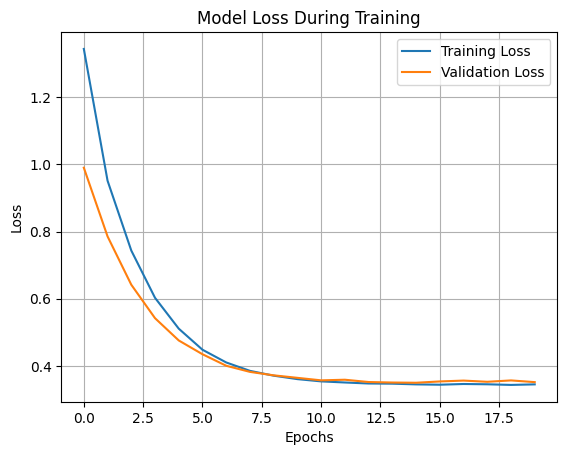

183/183 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Test MSE: 5.193702160621681
Test R-squared: -0.22915696123802864


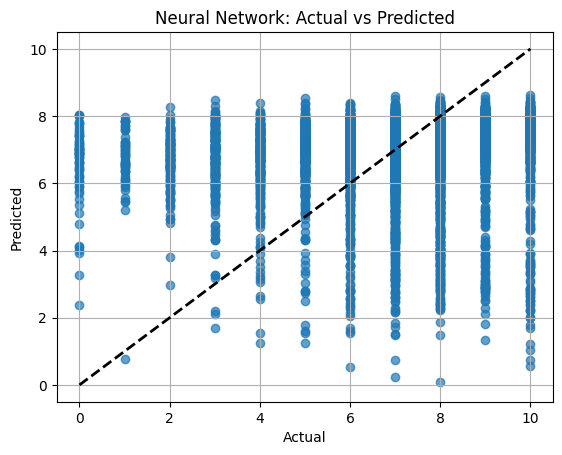

In [622]:
# Required Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import RobustScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.losses import Huber
from scipy import stats

# Define top 20 features based on previous feature importance analysis
top_20_features = [
    'ConvertedCompYearly', 'WorkExp', 'JobSat_ProjectSatisfaction', 'PurchaseInfluence_I have little or no influence',
    'JobSat_Teamwork', 'JobSat_WorkEnvironment', 'JobSat_JobRole', 'JobSat_Management', 
    'Knowledge_2_Strongly agree', 'Knowledge_8_Disagree', 'Knowledge_8_Strongly disagree', 
    'Knowledge_4_Disagree', 'Knowledge_3_Strongly disagree', 'Knowledge_3_Disagree', 
    'JobSat_Compensation', 'JobSat_WorkLifeBalance', 'JobSat_CompanyCulture', 'JobSat_ToolsAndResources', 
    'Frequency_3_Never', 'Knowledge_4_Strongly disagree'
]

# Subset the training and test data to only include the top 20 features
X_train_subset = X_train_transformed_df[top_20_features]
X_test_subset = X_test_transformed_df[top_20_features]

# Convert sparse data to dense format if necessary
def to_dense(df):
    return np.asarray(df.todense()) if hasattr(df, "todense") else np.asarray(df)

X_train_subset = to_dense(X_train_subset)
X_test_subset = to_dense(X_test_subset)

# Load and preprocess data
scaler = RobustScaler(with_centering=False)
X_train_scaled = scaler.fit_transform(X_train_subset)
X_test_scaled = scaler.transform(X_test_subset)

# Scale the target variable to improve model performance
target_scaler = RobustScaler()
y_train_scaled = target_scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten()
y_test_scaled = target_scaler.transform(y_test.values.reshape(-1, 1)).flatten()

# Handle outliers by removing samples with extreme Z-scores
z_scores = np.abs(stats.zscore(X_train_scaled))
outlier_filter = (z_scores < 3).all(axis=1)
X_train_cleaned = X_train_scaled[outlier_filter]
y_train_cleaned = y_train_scaled[outlier_filter]  # Use boolean indexing for matching y values

# Function to create the model
def create_model(input_dim, learning_rate=0.001, neurons=64, dropout_rate=0.2, l2_lambda=0.01):
    model = Sequential()
    model.add(Dense(neurons, input_dim=input_dim, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(neurons, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='linear'))  # Linear activation for regression tasks
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))
    return model

# Define hyperparameters for tuning
param_dist = {
    'neurons': [64, 128],
    'learning_rate': [0.001, 0.01],
    'batch_size': [32, 64],
    'epochs': [10, 20],
    'dropout_rate': [0.2, 0.3],
    'l2_lambda': [0.01, 0.001]
}

# Manual cross-validation for hyperparameter tuning
kf = KFold(n_splits=3, shuffle=True, random_state=42)
best_mse = float("inf")
best_params = {}

# Cross-validation loop through hyperparameters
for neurons in param_dist['neurons']:
    for learning_rate in param_dist['learning_rate']:
        for batch_size in param_dist['batch_size']:
            for epochs in param_dist['epochs']:
                for dropout_rate in param_dist['dropout_rate']:
                    for l2_lambda in param_dist['l2_lambda']:
                        fold_mse = []
                        for train_index, val_index in kf.split(X_train_cleaned):
                            X_train_cv, X_val_cv = X_train_cleaned[train_index], X_train_cleaned[val_index]
                            y_train_cv, y_val_cv = y_train_cleaned[train_index], y_train_cleaned[val_index]
                            
                            model = create_model(
                                input_dim=X_train_cleaned.shape[1], 
                                learning_rate=learning_rate, 
                                neurons=neurons, 
                                dropout_rate=dropout_rate, 
                                l2_lambda=l2_lambda
                            )
                            
                            early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                            lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                            
                            # Fit the model
                            history = model.fit(
                                X_train_cv, y_train_cv, 
                                epochs=epochs, 
                                batch_size=batch_size,
                                validation_data=(X_val_cv, y_val_cv), 
                                callbacks=[early_stopping, lr_scheduler], 
                                verbose=1
                            )
                            
                            # Calculate MSE for validation set
                            y_val_pred = model.predict(X_val_cv)
                            mse = mean_squared_error(y_val_cv, y_val_pred)
                            fold_mse.append(mse)
                        
                        avg_mse = np.mean(fold_mse)
                        if avg_mse < best_mse:
                            best_mse = avg_mse
                            best_params = {
                                'neurons': neurons, 
                                'learning_rate': learning_rate, 
                                'batch_size': batch_size, 
                                'epochs': epochs,
                                'dropout_rate': dropout_rate, 
                                'l2_lambda': l2_lambda
                            }

print(f"Best hyperparameters: {best_params}")
print(f"Best MSE: {best_mse}")

# Train the final model with the best parameters
best_model = create_model(
    input_dim=X_train_cleaned.shape[1], 
    learning_rate=best_params['learning_rate'], 
    neurons=best_params['neurons'],
    dropout_rate=best_params['dropout_rate'], 
    l2_lambda=best_params['l2_lambda']
)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)

history = best_model.fit(
    X_train_cleaned, y_train_cleaned, 
    epochs=best_params['epochs'], 
    batch_size=best_params['batch_size'], 
    validation_split=0.2, 
    callbacks=[early_stopping, lr_scheduler], 
    verbose=1
)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Predict on the test set and calculate MSE and R-squared
y_test_pred = best_model.predict(X_test_scaled)
y_test_pred_unscaled = target_scaler.inverse_transform(y_test_pred).flatten()  # Unscale predictions
test_mse = mean_squared_error(y_test, y_test_pred_unscaled)
test_r2 = r2_score(y_test, y_test_pred_unscaled)

print(f"Test MSE: {test_mse}")
print(f"Test R-squared: {test_r2}")

# Plot predicted vs actual values
plt.scatter(y_test, y_test_pred_unscaled, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Neural Network: Actual vs Predicted')
plt.grid(True)
plt.show()


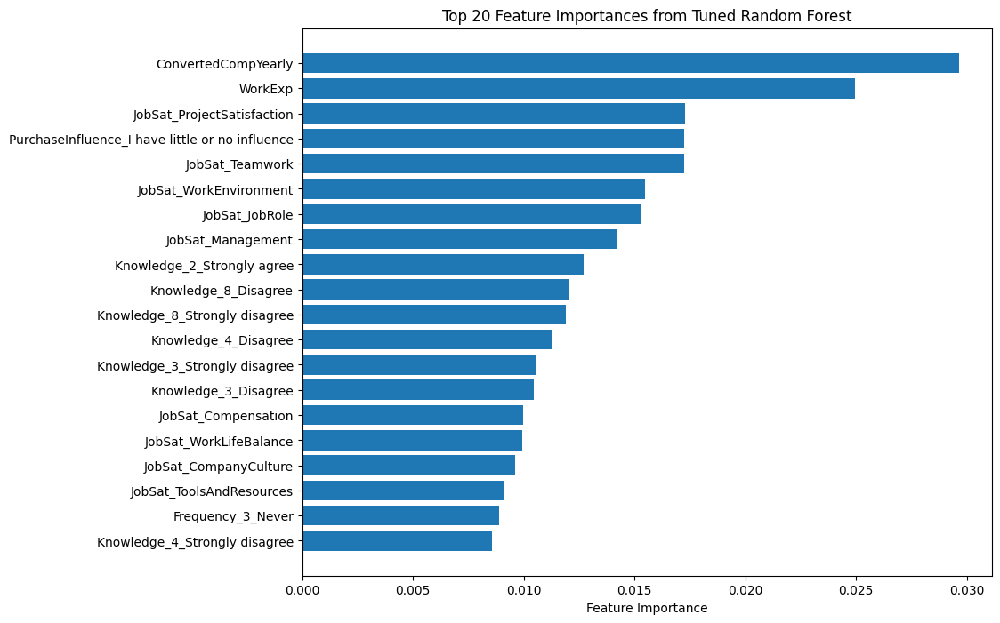

Epoch 1/10


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 6.4200 - val_loss: 1.7613 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1083 - val_loss: 1.4867 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8501 - val_loss: 1.4204 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6605 - val_loss: 1.3219 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5353 - val_loss: 1.3006 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4492 - val_loss: 1.2344 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3927 - val_loss: 1.1588 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3287 - val_loss: 1.1381 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2520 - val_loss: 1.0948 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 6.3890 - val_loss: 1.7112 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0738 - val_loss: 1.5497 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8122 - val_loss: 1.4405 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6232 - val_loss: 1.3892 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5219 - val_loss: 1.2940 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4142 - val_loss: 1.2339 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3449 - val_loss: 1.2018 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3032 - val_loss: 1.1600 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2671 - val_loss: 1.1225 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.4097 - val_loss: 1.6515 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0552 - val_loss: 1.5605 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7911 - val_loss: 1.4404 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6514 - val_loss: 1.3577 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5361 - val_loss: 1.2860 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4444 - val_loss: 1.2418 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3420 - val_loss: 1.2115 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2685 - val_loss: 1.1604 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2500 - val_loss: 1.1209 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 6.3092 - val_loss: 1.6046 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1082 - val_loss: 1.5052 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8283 - val_loss: 1.4147 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7092 - val_loss: 1.3118 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5490 - val_loss: 1.2520 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4767 - val_loss: 1.2053 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4031 - val_loss: 1.1477 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3237 - val_loss: 1.1149 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2906 - val_loss: 1.0951 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.4430 - val_loss: 1.6990 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0706 - val_loss: 1.5113 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7912 - val_loss: 1.4203 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6233 - val_loss: 1.3608 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4958 - val_loss: 1.3148 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4221 - val_loss: 1.2359 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3654 - val_loss: 1.2017 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2826 - val_loss: 1.1823 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2515 - val_loss: 1.1252 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.3651 - val_loss: 1.7290 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1122 - val_loss: 1.5617 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8046 - val_loss: 1.4638 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6549 - val_loss: 1.3571 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5349 - val_loss: 1.3115 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4700 - val_loss: 1.2791 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3675 - val_loss: 1.2019 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3132 - val_loss: 1.1670 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2263 - val_loss: 1.1310 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.5207 - val_loss: 2.1988 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3291 - val_loss: 1.5673 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9817 - val_loss: 1.4391 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8138 - val_loss: 1.3473 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6379 - val_loss: 1.2796 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5260 - val_loss: 1.2270 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4589 - val_loss: 1.1681 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3552 - val_loss: 1.1248 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3351 - val_loss: 1.0908 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.4354 - val_loss: 1.8034 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2842 - val_loss: 1.5918 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9753 - val_loss: 1.4765 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7789 - val_loss: 1.4068 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6154 - val_loss: 1.3321 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5438 - val_loss: 1.2858 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4342 - val_loss: 1.2131 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3379 - val_loss: 1.1829 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3110 - val_loss: 1.1480 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 6.4582 - val_loss: 1.8914 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3046 - val_loss: 1.6077 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9767 - val_loss: 1.5057 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7528 - val_loss: 1.3914 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6282 - val_loss: 1.3298 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5362 - val_loss: 1.2798 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4351 - val_loss: 1.2215 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3607 - val_loss: 1.1860 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3141 - val_loss: 1.1382 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5168 - val_loss: 1.7078 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1896 - val_loss: 1.4942 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9200 - val_loss: 1.3981 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7572 - val_loss: 1.3226 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6058 - val_loss: 1.2616 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5326 - val_loss: 1.2014 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4212 - val_loss: 1.1431 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3412 - val_loss: 1.1072 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2993 - val_loss: 1.0883 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.4679 - val_loss: 1.8362 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2466 - val_loss: 1.5510 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9430 - val_loss: 1.4622 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7518 - val_loss: 1.3771 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6232 - val_loss: 1.3081 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5100 - val_loss: 1.2666 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4671 - val_loss: 1.2637 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3517 - val_loss: 1.1798 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3172 - val_loss: 1.1575 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.4586 - val_loss: 1.8738 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2827 - val_loss: 1.5730 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9078 - val_loss: 1.4686 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7094 - val_loss: 1.3856 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6100 - val_loss: 1.3222 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4878 - val_loss: 1.2714 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4448 - val_loss: 1.2251 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3533 - val_loss: 1.1768 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2846 - val_loss: 1.1465 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.3441 - val_loss: 1.7676 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0844 - val_loss: 1.4843 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7913 - val_loss: 1.3896 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6718 - val_loss: 1.3225 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5188 - val_loss: 1.2497 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4466 - val_loss: 1.1933 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3744 - val_loss: 1.1595 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3023 - val_loss: 1.1128 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2717 - val_loss: 1.0763 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.3597 - val_loss: 1.6533 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0920 - val_loss: 1.5546 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8005 - val_loss: 1.4318 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6415 - val_loss: 1.3708 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5363 - val_loss: 1.2904 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4439 - val_loss: 1.2653 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3471 - val_loss: 1.2070 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2966 - val_loss: 1.1567 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2553 - val_loss: 1.1429 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.4484 - val_loss: 2.0019 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1325 - val_loss: 1.5691 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8284 - val_loss: 1.4805 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6677 - val_loss: 1.4011 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5530 - val_loss: 1.3221 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4521 - val_loss: 1.2814 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3961 - val_loss: 1.2463 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3130 - val_loss: 1.1878 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2410 - val_loss: 1.1703 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.4122 - val_loss: 1.8046 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0537 - val_loss: 1.4818 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8073 - val_loss: 1.3897 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6313 - val_loss: 1.3099 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5338 - val_loss: 1.2303 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4360 - val_loss: 1.2247 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3719 - val_loss: 1.1482 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3260 - val_loss: 1.1116 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2470 - val_loss: 1.0734 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 6.3292 - val_loss: 1.8511 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1241 - val_loss: 1.5889 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8204 - val_loss: 1.4922 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6917 - val_loss: 1.4132 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5620 - val_loss: 1.3177 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4635 - val_loss: 1.2625 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4013 - val_loss: 1.2130 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3005 - val_loss: 1.1801 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2408 - val_loss: 1.1377 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.3712 - val_loss: 1.8219 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0798 - val_loss: 1.5440 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7877 - val_loss: 1.4597 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6757 - val_loss: 1.3951 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5414 - val_loss: 1.3229 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4671 - val_loss: 1.2602 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3847 - val_loss: 1.2329 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3132 - val_loss: 1.1621 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2489 - val_loss: 1.1459 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 6.4296 - val_loss: 1.8469 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3921 - val_loss: 1.5704 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0331 - val_loss: 1.4694 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8370 - val_loss: 1.3733 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6816 - val_loss: 1.2955 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5631 - val_loss: 1.2379 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5073 - val_loss: 1.1846 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4254 - val_loss: 1.1408 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3431 - val_loss: 1.1093 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.4595 - val_loss: 1.7315 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2390 - val_loss: 1.5505 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9269 - val_loss: 1.4629 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7319 - val_loss: 1.3634 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6136 - val_loss: 1.2956 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5151 - val_loss: 1.2416 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4052 - val_loss: 1.2146 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3515 - val_loss: 1.1551 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2847 - val_loss: 1.1279 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5336 - val_loss: 1.8830 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2796 - val_loss: 1.5575 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9540 - val_loss: 1.5087 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7581 - val_loss: 1.3834 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6357 - val_loss: 1.3183 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5179 - val_loss: 1.2711 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4237 - val_loss: 1.2092 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3717 - val_loss: 1.1747 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2959 - val_loss: 1.1580 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 6.4540 - val_loss: 2.2980 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3140 - val_loss: 1.6043 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0048 - val_loss: 1.4497 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7798 - val_loss: 1.3631 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6244 - val_loss: 1.2946 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5367 - val_loss: 1.2358 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4261 - val_loss: 1.1699 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3814 - val_loss: 1.1494 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3412 - val_loss: 1.0919 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 6.5233 - val_loss: 1.8518 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2844 - val_loss: 1.5791 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9455 - val_loss: 1.4935 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7630 - val_loss: 1.4261 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6169 - val_loss: 1.3386 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5309 - val_loss: 1.2725 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4419 - val_loss: 1.2119 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3922 - val_loss: 1.1842 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2798 - val_loss: 1.1685 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5601 - val_loss: 1.7574 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2476 - val_loss: 1.5425 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8965 - val_loss: 1.4533 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7076 - val_loss: 1.3730 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5846 - val_loss: 1.3283 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4895 - val_loss: 1.2687 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4099 - val_loss: 1.2130 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3640 - val_loss: 1.1701 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2712 - val_loss: 1.1359 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.0426 - val_loss: 4.8766 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8148 - val_loss: 1.5285 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9697 - val_loss: 1.4265 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7790 - val_loss: 1.3658 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7026 - val_loss: 1.3184 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5917 - val_loss: 1.2746 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5251 - val_loss: 1.2776 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4748 - val_loss: 1.2305 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4150 - val_loss: 1.1697 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.0851 - val_loss: 5.0037 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8639 - val_loss: 1.5937 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8979 - val_loss: 1.4740 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7443 - val_loss: 1.4359 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6816 - val_loss: 1.3617 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5700 - val_loss: 1.3331 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4894 - val_loss: 1.2738 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4337 - val_loss: 1.2488 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3830 - val_loss: 1.2200 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.0357 - val_loss: 4.8817 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8297 - val_loss: 1.6056 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9308 - val_loss: 1.4710 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7562 - val_loss: 1.4187 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6302 - val_loss: 1.3834 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5532 - val_loss: 1.3465 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4755 - val_loss: 1.2943 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4452 - val_loss: 1.2567 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3933 - val_loss: 1.2160 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0306 - val_loss: 4.4833 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8287 - val_loss: 1.4787 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9697 - val_loss: 1.4075 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7778 - val_loss: 1.3497 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6859 - val_loss: 1.3039 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5940 - val_loss: 1.2651 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5358 - val_loss: 1.2247 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4546 - val_loss: 1.2051 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4035 - val_loss: 1.1673 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.9987 - val_loss: 4.9251 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7424 - val_loss: 1.6415 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9756 - val_loss: 1.5039 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8377 - val_loss: 1.4294 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6692 - val_loss: 1.3634 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5856 - val_loss: 1.3223 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5149 - val_loss: 1.2848 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4670 - val_loss: 1.2484 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3814 - val_loss: 1.2094 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0312 - val_loss: 4.6259 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7297 - val_loss: 1.5380 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9874 - val_loss: 1.4752 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8254 - val_loss: 1.4286 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6923 - val_loss: 1.3648 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5642 - val_loss: 1.3254 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5056 - val_loss: 1.2788 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4541 - val_loss: 1.2419 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3852 - val_loss: 1.2339 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.0687 - val_loss: 4.7425 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1139 - val_loss: 1.5967 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2431 - val_loss: 1.4823 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9613 - val_loss: 1.3989 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8165 - val_loss: 1.3387 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7150 - val_loss: 1.3030 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6753 - val_loss: 1.2468 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5452 - val_loss: 1.2052 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4868 - val_loss: 1.1674 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0103 - val_loss: 5.1843 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.0655 - val_loss: 1.7430 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2102 - val_loss: 1.5379 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0477 - val_loss: 1.4827 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8683 - val_loss: 1.4105 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6921 - val_loss: 1.3737 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6188 - val_loss: 1.3167 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5641 - val_loss: 1.2795 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5190 - val_loss: 1.2545 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0945 - val_loss: 4.5378 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.0946 - val_loss: 1.6317 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2360 - val_loss: 1.5457 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0231 - val_loss: 1.4941 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8716 - val_loss: 1.4227 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7373 - val_loss: 1.3808 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6489 - val_loss: 1.3569 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5877 - val_loss: 1.2843 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4854 - val_loss: 1.2570 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0579 - val_loss: 4.7520 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.0967 - val_loss: 1.6158 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2480 - val_loss: 1.4782 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0022 - val_loss: 1.4137 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8775 - val_loss: 1.3705 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7234 - val_loss: 1.3031 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6646 - val_loss: 1.2787 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5823 - val_loss: 1.2201 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5139 - val_loss: 1.1838 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0954 - val_loss: 5.2680 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1754 - val_loss: 1.7608 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0978 - val_loss: 1.5036 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8699 - val_loss: 1.4571 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7548 - val_loss: 1.3764 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6350 - val_loss: 1.3288 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5954 - val_loss: 1.3018 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5306 - val_loss: 1.2451 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4358 - val_loss: 1.2166 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0724 - val_loss: 5.0165 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1360 - val_loss: 1.6322 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2240 - val_loss: 1.5110 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9923 - val_loss: 1.4763 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8342 - val_loss: 1.4227 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7305 - val_loss: 1.3695 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6196 - val_loss: 1.3313 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5791 - val_loss: 1.3102 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5125 - val_loss: 1.2560 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0198 - val_loss: 4.4044 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8007 - val_loss: 1.5216 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0072 - val_loss: 1.4206 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8230 - val_loss: 1.3830 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7206 - val_loss: 1.3237 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6000 - val_loss: 1.2712 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5293 - val_loss: 1.2269 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4857 - val_loss: 1.1982 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4225 - val_loss: 1.1821 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 7.0571 - val_loss: 4.6807 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8500 - val_loss: 1.5747 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0311 - val_loss: 1.4886 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8403 - val_loss: 1.4406 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7247 - val_loss: 1.4012 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6259 - val_loss: 1.3550 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5219 - val_loss: 1.3073 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4969 - val_loss: 1.2632 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4105 - val_loss: 1.2361 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0236 - val_loss: 4.6988 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7303 - val_loss: 1.5811 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9735 - val_loss: 1.4524 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7835 - val_loss: 1.4298 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6477 - val_loss: 1.3732 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5731 - val_loss: 1.3357 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4938 - val_loss: 1.2748 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4342 - val_loss: 1.2421 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3994 - val_loss: 1.2252 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.9912 - val_loss: 4.3392 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8164 - val_loss: 1.5006 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9734 - val_loss: 1.4169 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7700 - val_loss: 1.3528 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6717 - val_loss: 1.3089 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5731 - val_loss: 1.2462 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5245 - val_loss: 1.2299 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4659 - val_loss: 1.1910 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4113 - val_loss: 1.1515 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0434 - val_loss: 4.9891 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8504 - val_loss: 1.5874 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9633 - val_loss: 1.4483 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7787 - val_loss: 1.4167 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6772 - val_loss: 1.3945 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5804 - val_loss: 1.3108 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4681 - val_loss: 1.2918 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4719 - val_loss: 1.2463 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3624 - val_loss: 1.2215 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0173 - val_loss: 4.6195 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7678 - val_loss: 1.5616 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9543 - val_loss: 1.4782 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8036 - val_loss: 1.4387 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6584 - val_loss: 1.3803 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6092 - val_loss: 1.3249 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5117 - val_loss: 1.3000 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4421 - val_loss: 1.2728 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4063 - val_loss: 1.2172 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.1077 - val_loss: 4.9327 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1279 - val_loss: 1.6058 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2233 - val_loss: 1.4681 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9738 - val_loss: 1.4283 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8434 - val_loss: 1.3529 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7371 - val_loss: 1.2922 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6168 - val_loss: 1.2594 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5506 - val_loss: 1.2399 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5266 - val_loss: 1.2008 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0305 - val_loss: 5.3469 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.0996 - val_loss: 2.0113 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2893 - val_loss: 1.6076 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0083 - val_loss: 1.5109 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8895 - val_loss: 1.4392 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7099 - val_loss: 1.4091 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6521 - val_loss: 1.3407 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5582 - val_loss: 1.2907 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5115 - val_loss: 1.2803 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0777 - val_loss: 5.3536 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1969 - val_loss: 1.9018 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1856 - val_loss: 1.5574 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9859 - val_loss: 1.5218 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8141 - val_loss: 1.4272 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7059 - val_loss: 1.3751 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6097 - val_loss: 1.3209 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5404 - val_loss: 1.2795 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4489 - val_loss: 1.2301 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.0421 - val_loss: 4.8452 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1198 - val_loss: 1.6032 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2465 - val_loss: 1.4864 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9855 - val_loss: 1.4013 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8744 - val_loss: 1.3441 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7294 - val_loss: 1.2925 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6232 - val_loss: 1.2467 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5585 - val_loss: 1.2271 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5273 - val_loss: 1.1867 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.1203 - val_loss: 5.6858 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.2606 - val_loss: 2.0801 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2443 - val_loss: 1.6572 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9388 - val_loss: 1.5306 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8081 - val_loss: 1.4345 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6985 - val_loss: 1.4068 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6176 - val_loss: 1.3230 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5179 - val_loss: 1.2807 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4662 - val_loss: 1.2492 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.0624 - val_loss: 5.1234 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.0704 - val_loss: 1.8138 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2638 - val_loss: 1.5326 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9873 - val_loss: 1.4870 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8400 - val_loss: 1.4129 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7632 - val_loss: 1.3627 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6243 - val_loss: 1.3340 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5821 - val_loss: 1.2816 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4955 - val_loss: 1.2556 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2368 - val_loss: 1.2009 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2747 - val_loss: 1.0327 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1029 - val_loss: 0.9932 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0796 - val_loss: 0.9652 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0439 - val_loss: 0.9501 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0411 - val_loss: 0.9610 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0676 - val_loss: 0.9667 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0593 - val_loss: 0.9794 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0333 - val_loss: 0.9608 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2839 - val_loss: 1.2022 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1945 - val_loss: 1.0356 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1064 - val_loss: 1.0164 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0714 - val_loss: 1.0093 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0681 - val_loss: 1.0009 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0264 - val_loss: 0.9858 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0495 - val_loss: 1.0355 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0356 - val_loss: 0.9939 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0381 - val_loss: 0.9939 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2376 - val_loss: 1.2093 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2132 - val_loss: 1.0637 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0906 - val_loss: 1.0929 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0530 - val_loss: 1.0961 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0305 - val_loss: 1.0140 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0459 - val_loss: 1.0032 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0229 - val_loss: 1.0335 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0415 - val_loss: 1.0148 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0188 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2680 - val_loss: 1.1410 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2648 - val_loss: 1.1007 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1270 - val_loss: 0.9867 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1115 - val_loss: 0.9764 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0606 - val_loss: 0.9813 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0952 - val_loss: 0.9606 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0450 - val_loss: 0.9756 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0639 - val_loss: 0.9836 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0527 - val_loss: 0.9891 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.1989 - val_loss: 1.2053 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2331 - val_loss: 1.1223 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0997 - val_loss: 1.0434 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0788 - val_loss: 1.0003 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0285 - val_loss: 1.0248 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0663 - val_loss: 1.0758 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0571 - val_loss: 1.0184 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0127 - val_loss: 0.9947 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0201 - val_loss: 1.0095 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2544 - val_loss: 1.1956 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2387 - val_loss: 1.0880 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0833 - val_loss: 1.0677 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0331 - val_loss: 1.0208 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0403 - val_loss: 1.0009 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0262 - val_loss: 1.0099 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0308 - val_loss: 1.0341 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0288 - val_loss: 1.0303 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0720 - val_loss: 1.1126 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3933 - val_loss: 1.1759 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2819 - val_loss: 1.0111 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1443 - val_loss: 0.9717 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1051 - val_loss: 0.9731 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1005 - val_loss: 1.0001 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1037 - val_loss: 0.9680 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0792 - val_loss: 1.0756 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0562 - val_loss: 0.9610 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0369 - val_loss: 0.9879 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 3.3975 - val_loss: 1.2796 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2843 - val_loss: 1.0584 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1125 - val_loss: 1.0329 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0939 - val_loss: 1.0105 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0759 - val_loss: 1.0226 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0713 - val_loss: 1.0629 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0500 - val_loss: 1.0297 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0557 - val_loss: 1.0282 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0669 - val_loss: 1.0039 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3637 - val_loss: 1.2507 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2687 - val_loss: 1.0877 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1568 - val_loss: 1.0310 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0711 - val_loss: 1.0497 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0690 - val_loss: 1.0320 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0581 - val_loss: 1.0252 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0428 - val_loss: 1.0258 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0392 - val_loss: 1.0138 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0291 - val_loss: 1.0096 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3736 - val_loss: 1.2211 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2931 - val_loss: 1.0391 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1483 - val_loss: 0.9955 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1152 - val_loss: 1.2086 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0883 - val_loss: 0.9696 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0938 - val_loss: 0.9941 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0702 - val_loss: 0.9753 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0665 - val_loss: 0.9582 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0589 - val_loss: 0.9790 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3392 - val_loss: 1.2436 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2966 - val_loss: 1.0705 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1164 - val_loss: 1.0330 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0871 - val_loss: 1.0115 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0449 - val_loss: 1.0098 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0746 - val_loss: 0.9938 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0412 - val_loss: 1.1146 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0431 - val_loss: 1.0088 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0427 - val_loss: 0.9895 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3425 - val_loss: 1.2882 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2939 - val_loss: 1.0816 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1257 - val_loss: 1.0222 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0555 - val_loss: 1.0143 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0434 - val_loss: 1.0235 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0519 - val_loss: 1.0061 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0572 - val_loss: 1.0202 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0291 - val_loss: 1.0030 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0282 - val_loss: 1.0367 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2907 - val_loss: 1.1504 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2696 - val_loss: 1.0182 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1160 - val_loss: 0.9876 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0887 - val_loss: 0.9734 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0576 - val_loss: 1.0026 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0597 - val_loss: 1.0716 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0454 - val_loss: 0.9569 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0687 - val_loss: 0.9684 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0294 - val_loss: 0.9656 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2667 - val_loss: 1.2443 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2437 - val_loss: 1.0913 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1004 - val_loss: 1.0125 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0586 - val_loss: 1.0238 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0247 - val_loss: 1.0404 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0351 - val_loss: 1.0239 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0465 - val_loss: 1.0355 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0361 - val_loss: 1.0182 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0058 - val_loss: 0.9751 - learning_rate: 0.0050
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2053 - val_loss: 1.2234 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2449 - val_loss: 1.0567 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1136 - val_loss: 1.0330 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0462 - val_loss: 1.0436 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0631 - val_loss: 1.0274 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0459 - val_loss: 1.0493 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0178 - val_loss: 1.0239 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0112 - val_loss: 0.9947 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0089 - val_loss: 1.0266 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2769 - val_loss: 1.1473 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2393 - val_loss: 1.0453 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1075 - val_loss: 1.0085 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0622 - val_loss: 0.9620 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0860 - val_loss: 0.9884 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0652 - val_loss: 0.9542 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0811 - val_loss: 0.9631 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0627 - val_loss: 0.9582 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0422 - val_loss: 0.9597 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2008 - val_loss: 1.2064 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2243 - val_loss: 1.0532 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0913 - val_loss: 1.0391 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0518 - val_loss: 0.9958 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0646 - val_loss: 0.9986 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0552 - val_loss: 1.0023 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0326 - val_loss: 1.0352 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0328 - val_loss: 1.0697 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0220 - val_loss: 1.0388 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2405 - val_loss: 1.2473 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2509 - val_loss: 1.0619 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0651 - val_loss: 1.0241 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0405 - val_loss: 1.0527 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0160 - val_loss: 1.0269 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0283 - val_loss: 1.0429 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0127 - val_loss: 1.0478 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0384 - val_loss: 1.0307 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0088 - val_loss: 1.0659 - learning_rate: 0.0050
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3908 - val_loss: 1.1689 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2799 - val_loss: 1.0305 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1287 - val_loss: 0.9881 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0967 - val_loss: 0.9871 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0830 - val_loss: 0.9964 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0892 - val_loss: 1.0158 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0964 - val_loss: 0.9737 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0774 - val_loss: 0.9596 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0817 - val_loss: 1.0408 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 3.2842 - val_loss: 1.2051 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2782 - val_loss: 1.0647 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1182 - val_loss: 1.0153 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0925 - val_loss: 1.0575 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0797 - val_loss: 1.0071 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0711 - val_loss: 1.0484 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0509 - val_loss: 1.1116 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0905 - val_loss: 0.9960 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0364 - val_loss: 1.0090 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3207 - val_loss: 1.2299 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2571 - val_loss: 1.0640 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1179 - val_loss: 1.0502 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0790 - val_loss: 1.0144 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0579 - val_loss: 1.0191 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0525 - val_loss: 1.0267 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0461 - val_loss: 1.0154 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0470 - val_loss: 1.1436 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0578 - val_loss: 1.0410 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3983 - val_loss: 1.1576 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2776 - val_loss: 1.0175 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1659 - val_loss: 1.0634 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1043 - val_loss: 0.9901 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0755 - val_loss: 1.2149 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1033 - val_loss: 0.9924 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0958 - val_loss: 0.9922 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0640 - val_loss: 0.9585 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0620 - val_loss: 0.9723 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.4369 - val_loss: 1.2171 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2919 - val_loss: 1.0546 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1181 - val_loss: 1.0186 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0764 - val_loss: 1.0519 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0508 - val_loss: 1.0415 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0494 - val_loss: 1.0028 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0453 - val_loss: 1.0178 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0500 - val_loss: 1.0090 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0263 - val_loss: 0.9971 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3330 - val_loss: 1.2353 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2777 - val_loss: 1.0801 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1102 - val_loss: 1.0520 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0531 - val_loss: 1.0182 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0441 - val_loss: 1.0207 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0505 - val_loss: 1.0595 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0399 - val_loss: 1.0148 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0300 - val_loss: 1.0101 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0535 - val_loss: 1.0039 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.0218 - val_loss: 1.2161 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3359 - val_loss: 1.0493 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1513 - val_loss: 1.1375 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1158 - val_loss: 1.0013 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1007 - val_loss: 0.9741 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0867 - val_loss: 0.9554 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0647 - val_loss: 0.9556 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0398 - val_loss: 0.9465 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0379 - val_loss: 0.9662 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 3.9458 - val_loss: 1.2900 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3636 - val_loss: 1.1263 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1575 - val_loss: 1.0740 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0839 - val_loss: 1.0360 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0541 - val_loss: 1.0256 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0415 - val_loss: 0.9895 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0423 - val_loss: 1.0061 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0219 - val_loss: 0.9857 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0187 - val_loss: 0.9957 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.0022 - val_loss: 1.3038 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3634 - val_loss: 1.1583 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1578 - val_loss: 1.1041 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1166 - val_loss: 1.0446 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0524 - val_loss: 1.0282 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0397 - val_loss: 1.0145 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0284 - val_loss: 1.0088 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0188 - val_loss: 1.0046 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0091 - val_loss: 1.0382 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.9524 - val_loss: 1.2396 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3815 - val_loss: 1.0795 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1876 - val_loss: 1.0290 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1249 - val_loss: 0.9938 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0736 - val_loss: 0.9601 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0427 - val_loss: 0.9616 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0353 - val_loss: 0.9550 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0514 - val_loss: 0.9873 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0534 - val_loss: 0.9639 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.9995 - val_loss: 1.2847 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3448 - val_loss: 1.1457 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1828 - val_loss: 1.0467 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1063 - val_loss: 1.0090 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0484 - val_loss: 1.0069 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0552 - val_loss: 1.0270 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0060 - val_loss: 1.0060 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0184 - val_loss: 0.9867 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0412 - val_loss: 0.9929 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.9322 - val_loss: 1.3273 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3792 - val_loss: 1.1359 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1511 - val_loss: 1.1205 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0873 - val_loss: 1.0528 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0697 - val_loss: 1.0248 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0352 - val_loss: 1.0263 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0354 - val_loss: 1.0171 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0424 - val_loss: 1.0012 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0119 - val_loss: 1.0027 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 4.0501 - val_loss: 1.3234 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4609 - val_loss: 1.0761 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2312 - val_loss: 1.0059 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1443 - val_loss: 0.9982 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1161 - val_loss: 0.9963 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0719 - val_loss: 0.9519 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0857 - val_loss: 0.9762 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0752 - val_loss: 0.9704 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0821 - val_loss: 0.9554 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.1181 - val_loss: 1.3385 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4022 - val_loss: 1.1376 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1792 - val_loss: 1.0790 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1133 - val_loss: 1.0866 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0675 - val_loss: 1.0095 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0816 - val_loss: 1.0313 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0571 - val_loss: 0.9940 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0505 - val_loss: 1.0003 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0132 - val_loss: 1.0023 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.0852 - val_loss: 1.3261 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4130 - val_loss: 1.1140 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1710 - val_loss: 1.0584 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1117 - val_loss: 1.0292 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0589 - val_loss: 1.0133 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0520 - val_loss: 1.0422 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0468 - val_loss: 1.0026 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0589 - val_loss: 1.0540 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0325 - val_loss: 0.9949 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.1431 - val_loss: 1.2937 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4340 - val_loss: 1.0731 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2015 - val_loss: 1.0185 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1222 - val_loss: 1.0214 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0842 - val_loss: 0.9587 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1028 - val_loss: 0.9487 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0558 - val_loss: 0.9657 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0941 - val_loss: 0.9461 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0814 - val_loss: 0.9655 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.1144 - val_loss: 1.3983 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4342 - val_loss: 1.1140 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1975 - val_loss: 1.0472 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1268 - val_loss: 1.0293 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0875 - val_loss: 1.0021 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0751 - val_loss: 0.9974 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0504 - val_loss: 1.0088 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0449 - val_loss: 1.0039 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0406 - val_loss: 1.0184 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 4.0057 - val_loss: 1.3530 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4545 - val_loss: 1.1331 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1690 - val_loss: 1.0540 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1154 - val_loss: 1.0535 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0754 - val_loss: 1.0289 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0727 - val_loss: 1.0120 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0469 - val_loss: 1.0203 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0436 - val_loss: 1.0161 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0407 - val_loss: 1.0020 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.9229 - val_loss: 1.2483 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4179 - val_loss: 1.0943 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2137 - val_loss: 1.0239 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1635 - val_loss: 0.9987 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0863 - val_loss: 0.9762 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0568 - val_loss: 0.9510 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0518 - val_loss: 0.9533 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0467 - val_loss: 0.9523 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0478 - val_loss: 0.9536 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.9795 - val_loss: 1.3209 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3422 - val_loss: 1.1272 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1628 - val_loss: 1.0909 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0976 - val_loss: 1.0532 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0684 - val_loss: 1.0215 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0444 - val_loss: 0.9985 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0401 - val_loss: 1.0068 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0155 - val_loss: 0.9857 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0380 - val_loss: 0.9941 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.9875 - val_loss: 1.3047 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3159 - val_loss: 1.0962 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1923 - val_loss: 1.0604 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1004 - val_loss: 1.0556 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0685 - val_loss: 1.0344 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0382 - val_loss: 0.9973 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0004 - val_loss: 1.0066 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0197 - val_loss: 0.9988 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0237 - val_loss: 0.9983 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.0082 - val_loss: 1.2590 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3702 - val_loss: 1.0662 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1737 - val_loss: 1.0577 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1134 - val_loss: 0.9876 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1173 - val_loss: 0.9757 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0569 - val_loss: 0.9547 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0526 - val_loss: 0.9538 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0423 - val_loss: 0.9435 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0240 - val_loss: 0.9581 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.9424 - val_loss: 1.3380 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3482 - val_loss: 1.1078 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1846 - val_loss: 1.0592 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0975 - val_loss: 1.0493 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0606 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0366 - val_loss: 0.9852 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0226 - val_loss: 0.9923 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0217 - val_loss: 0.9926 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0267 - val_loss: 1.0318 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.9552 - val_loss: 1.2843 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3641 - val_loss: 1.1189 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1606 - val_loss: 1.0550 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0808 - val_loss: 1.0431 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0907 - val_loss: 1.0244 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0301 - val_loss: 1.0323 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0361 - val_loss: 1.0110 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0257 - val_loss: 1.0396 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0182 - val_loss: 1.0044 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.1687 - val_loss: 1.2810 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4281 - val_loss: 1.0801 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1973 - val_loss: 1.0236 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1341 - val_loss: 0.9758 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1253 - val_loss: 0.9519 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0747 - val_loss: 0.9582 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0807 - val_loss: 0.9612 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0850 - val_loss: 0.9594 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0307 - val_loss: 1.0745 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.1229 - val_loss: 1.3283 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3871 - val_loss: 1.1462 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2095 - val_loss: 1.0725 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1280 - val_loss: 1.0431 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0857 - val_loss: 1.0172 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0601 - val_loss: 0.9897 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0289 - val_loss: 0.9953 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0698 - val_loss: 1.0558 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0626 - val_loss: 0.9926 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.1290 - val_loss: 1.3719 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4141 - val_loss: 1.1333 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1587 - val_loss: 1.1017 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1092 - val_loss: 1.0639 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0787 - val_loss: 1.0157 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0507 - val_loss: 1.0126 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0570 - val_loss: 1.0069 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0592 - val_loss: 0.9947 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0190 - val_loss: 1.0601 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.1537 - val_loss: 1.2771 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4292 - val_loss: 1.0615 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1965 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1275 - val_loss: 1.0339 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1238 - val_loss: 0.9781 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0876 - val_loss: 0.9501 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0954 - val_loss: 0.9751 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0599 - val_loss: 1.0038 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0582 - val_loss: 0.9712 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.0590 - val_loss: 1.3585 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4137 - val_loss: 1.1186 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1634 - val_loss: 1.0632 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1158 - val_loss: 1.0298 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0570 - val_loss: 0.9938 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0625 - val_loss: 0.9991 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0352 - val_loss: 1.0054 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0521 - val_loss: 1.0000 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0341 - val_loss: 1.0177 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 4.0801 - val_loss: 1.3546 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4550 - val_loss: 1.1568 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2277 - val_loss: 1.1221 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1507 - val_loss: 1.0315 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0773 - val_loss: 1.0208 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0866 - val_loss: 1.0471 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0682 - val_loss: 1.0029 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0451 - val_loss: 1.0588 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0307 - val_loss: 1.0263 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5343 - val_loss: 1.9398 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3400 - val_loss: 1.7411 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0354 - val_loss: 1.5608 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7434 - val_loss: 1.4157 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6022 - val_loss: 1.3662 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4501 - val_loss: 1.2463 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3504 - val_loss: 1.1669 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2943 - val_loss: 1.1256 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2248 - val_loss: 1.0936 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.4961 - val_loss: 1.9950 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2622 - val_loss: 1.7921 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9571 - val_loss: 1.5861 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7000 - val_loss: 1.5323 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5971 - val_loss: 1.3775 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4362 - val_loss: 1.2755 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3391 - val_loss: 1.2487 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2776 - val_loss: 1.1791 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2464 - val_loss: 1.1715 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5107 - val_loss: 1.9830 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2296 - val_loss: 1.7348 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9007 - val_loss: 1.5839 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7008 - val_loss: 1.4714 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5248 - val_loss: 1.3500 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4123 - val_loss: 1.2869 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3516 - val_loss: 1.2006 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2637 - val_loss: 1.1442 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2152 - val_loss: 1.1150 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.4733 - val_loss: 1.9027 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3130 - val_loss: 1.7398 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0072 - val_loss: 1.6132 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7476 - val_loss: 1.4146 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6093 - val_loss: 1.3312 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5115 - val_loss: 1.2620 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3899 - val_loss: 1.2019 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3271 - val_loss: 1.1350 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2535 - val_loss: 1.0972 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 6.5259 - val_loss: 1.9260 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2685 - val_loss: 1.7558 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9240 - val_loss: 1.6245 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7466 - val_loss: 1.4888 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5660 - val_loss: 1.3950 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4420 - val_loss: 1.3022 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3987 - val_loss: 1.2089 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2903 - val_loss: 1.1666 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2443 - val_loss: 1.1537 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5106 - val_loss: 1.9917 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3224 - val_loss: 1.8397 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0012 - val_loss: 1.6424 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7631 - val_loss: 1.5181 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6294 - val_loss: 1.4104 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4684 - val_loss: 1.3369 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3681 - val_loss: 1.2463 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2975 - val_loss: 1.1822 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2339 - val_loss: 1.1536 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5961 - val_loss: 2.1271 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6059 - val_loss: 1.8350 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1831 - val_loss: 1.6648 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9321 - val_loss: 1.5220 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7560 - val_loss: 1.4130 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5716 - val_loss: 1.3326 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4876 - val_loss: 1.2287 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3861 - val_loss: 1.1569 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3020 - val_loss: 1.1167 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6258 - val_loss: 2.0529 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5320 - val_loss: 1.8247 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1429 - val_loss: 1.6742 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8924 - val_loss: 1.5245 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6838 - val_loss: 1.4182 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5399 - val_loss: 1.3258 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4167 - val_loss: 1.2670 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3497 - val_loss: 1.1969 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2661 - val_loss: 1.1536 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6338 - val_loss: 2.1222 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4937 - val_loss: 1.8618 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1222 - val_loss: 1.6712 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8641 - val_loss: 1.5377 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6717 - val_loss: 1.4294 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5236 - val_loss: 1.3278 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4104 - val_loss: 1.2708 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3357 - val_loss: 1.2050 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2588 - val_loss: 1.1772 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6031 - val_loss: 2.1930 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6064 - val_loss: 1.8456 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1945 - val_loss: 1.6510 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9640 - val_loss: 1.5144 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7597 - val_loss: 1.4094 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6002 - val_loss: 1.3003 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4730 - val_loss: 1.2324 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3950 - val_loss: 1.1961 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3363 - val_loss: 1.1539 - learning_rate: 0.0010
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5829 - val_loss: 2.1878 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5536 - val_loss: 1.8961 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1765 - val_loss: 1.7300 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9243 - val_loss: 1.5431 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7164 - val_loss: 1.4286 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5831 - val_loss: 1.3699 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4648 - val_loss: 1.2927 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3817 - val_loss: 1.1951 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3147 - val_loss: 1.1687 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6837 - val_loss: 2.1553 - learning_rate: 0.0010
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5129 - val_loss: 1.8581 - learning_rate: 0.0010
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1267 - val_loss: 1.7405 - learning_rate: 0.0010
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8961 - val_loss: 1.5514 - learning_rate: 0.0010
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6894 - val_loss: 1.4437 - learning_rate: 0.0010
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5421 - val_loss: 1.3237 - learning_rate: 0.0010
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4129 - val_loss: 1.2965 - learning_rate: 0.0010
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3534 - val_loss: 1.2185 - learning_rate: 0.0010
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2709 - val_loss: 1.1788 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5095 - val_loss: 2.0107 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3222 - val_loss: 1.7764 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9843 - val_loss: 1.5641 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7516 - val_loss: 1.4075 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6173 - val_loss: 1.3164 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4511 - val_loss: 1.2132 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3511 - val_loss: 1.1656 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2863 - val_loss: 1.1510 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2650 - val_loss: 1.1211 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5121 - val_loss: 1.9630 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2588 - val_loss: 1.7450 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9746 - val_loss: 1.6045 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7507 - val_loss: 1.4815 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5740 - val_loss: 1.3500 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4504 - val_loss: 1.3157 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3342 - val_loss: 1.2274 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2623 - val_loss: 1.1924 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2222 - val_loss: 1.1737 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5414 - val_loss: 1.9973 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2574 - val_loss: 1.8213 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9786 - val_loss: 1.6332 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7021 - val_loss: 1.4508 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5517 - val_loss: 1.3993 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4270 - val_loss: 1.2958 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3634 - val_loss: 1.2571 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2742 - val_loss: 1.1597 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1781 - val_loss: 1.1294 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 6.4955 - val_loss: 1.9081 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 2.2752 - val_loss: 1.7444 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9541 - val_loss: 1.5953 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7852 - val_loss: 1.4781 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6266 - val_loss: 1.3808 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4472 - val_loss: 1.2919 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4068 - val_loss: 1.1838 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2805 - val_loss: 1.1523 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2547 - val_loss: 1.1040 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.4602 - val_loss: 2.1165 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3660 - val_loss: 1.8273 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9836 - val_loss: 1.6801 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7807 - val_loss: 1.5259 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6047 - val_loss: 1.3954 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4850 - val_loss: 1.2922 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3521 - val_loss: 1.2236 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2936 - val_loss: 1.1977 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2510 - val_loss: 1.1634 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.4948 - val_loss: 1.9875 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3000 - val_loss: 1.8271 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9600 - val_loss: 1.6004 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7526 - val_loss: 1.4824 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5753 - val_loss: 1.3848 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4525 - val_loss: 1.3125 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3861 - val_loss: 1.2102 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2454 - val_loss: 1.1808 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2003 - val_loss: 1.1477 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5999 - val_loss: 1.9889 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5480 - val_loss: 1.7961 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1630 - val_loss: 1.6060 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9006 - val_loss: 1.4860 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6931 - val_loss: 1.3617 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5606 - val_loss: 1.2670 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4545 - val_loss: 1.1966 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3947 - val_loss: 1.1523 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2636 - val_loss: 1.0895 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6481 - val_loss: 2.0952 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4872 - val_loss: 1.8355 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1331 - val_loss: 1.6491 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8590 - val_loss: 1.5252 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6751 - val_loss: 1.4193 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5429 - val_loss: 1.3019 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4052 - val_loss: 1.2175 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3507 - val_loss: 1.1670 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2649 - val_loss: 1.1445 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6447 - val_loss: 2.1119 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5715 - val_loss: 1.9292 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1631 - val_loss: 1.7177 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9012 - val_loss: 1.5668 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6740 - val_loss: 1.4479 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5925 - val_loss: 1.3540 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4582 - val_loss: 1.2540 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3469 - val_loss: 1.2183 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3055 - val_loss: 1.1799 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6604 - val_loss: 2.1379 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5132 - val_loss: 1.7718 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1321 - val_loss: 1.6447 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8652 - val_loss: 1.5000 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6940 - val_loss: 1.3706 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5729 - val_loss: 1.2655 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4445 - val_loss: 1.2396 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3719 - val_loss: 1.1272 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3038 - val_loss: 1.0883 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.7039 - val_loss: 2.1954 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5609 - val_loss: 1.8585 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1523 - val_loss: 1.7390 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8852 - val_loss: 1.5479 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6954 - val_loss: 1.4683 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5921 - val_loss: 1.3180 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4748 - val_loss: 1.2512 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3360 - val_loss: 1.1991 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2767 - val_loss: 1.1486 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6085 - val_loss: 2.1602 - learning_rate: 0.0010
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5613 - val_loss: 1.9273 - learning_rate: 0.0010
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1697 - val_loss: 1.6763 - learning_rate: 0.0010
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8586 - val_loss: 1.5753 - learning_rate: 0.0010
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6724 - val_loss: 1.4140 - learning_rate: 0.0010
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5752 - val_loss: 1.3545 - learning_rate: 0.0010
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4326 - val_loss: 1.2713 - learning_rate: 0.0010
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3150 - val_loss: 1.2007 - learning_rate: 0.0010
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2827 - val_loss: 1.1428 - learning_rate: 0.0010
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4131 - val_loss: 4.1853 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.9727 - val_loss: 1.8291 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1269 - val_loss: 1.6452 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8963 - val_loss: 1.5141 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7412 - val_loss: 1.4219 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6324 - val_loss: 1.3365 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5532 - val_loss: 1.2940 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4396 - val_loss: 1.2446 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3928 - val_loss: 1.2169 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3834 - val_loss: 3.9506 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.0591 - val_loss: 1.8632 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0738 - val_loss: 1.7830 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8954 - val_loss: 1.5698 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7685 - val_loss: 1.4880 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6225 - val_loss: 1.4129 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5401 - val_loss: 1.3297 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4377 - val_loss: 1.3130 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3938 - val_loss: 1.2111 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3553 - val_loss: 3.0990 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.9928 - val_loss: 1.8334 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2156 - val_loss: 1.6985 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9551 - val_loss: 1.6511 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7903 - val_loss: 1.5442 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6643 - val_loss: 1.4569 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5656 - val_loss: 1.3938 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4866 - val_loss: 1.3049 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4016 - val_loss: 1.2583 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3745 - val_loss: 3.5987 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.0678 - val_loss: 1.7777 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1878 - val_loss: 1.6614 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9639 - val_loss: 1.5636 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8259 - val_loss: 1.4620 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7006 - val_loss: 1.3982 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5980 - val_loss: 1.3130 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4977 - val_loss: 1.2800 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4380 - val_loss: 1.1966 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3568 - val_loss: 2.9090 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.0374 - val_loss: 1.9578 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1995 - val_loss: 1.7796 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9843 - val_loss: 1.6467 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8138 - val_loss: 1.5575 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6989 - val_loss: 1.4351 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5600 - val_loss: 1.4189 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4870 - val_loss: 1.3081 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4555 - val_loss: 1.2717 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3490 - val_loss: 3.9092 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.9866 - val_loss: 1.8519 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1309 - val_loss: 1.6979 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9446 - val_loss: 1.6037 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7586 - val_loss: 1.4766 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6283 - val_loss: 1.4272 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5562 - val_loss: 1.3436 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4587 - val_loss: 1.3080 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3964 - val_loss: 1.2636 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4937 - val_loss: 4.9738 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.4442 - val_loss: 2.1921 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4114 - val_loss: 1.8309 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1546 - val_loss: 1.6515 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9874 - val_loss: 1.5606 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8244 - val_loss: 1.4472 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6915 - val_loss: 1.3755 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6376 - val_loss: 1.3320 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5224 - val_loss: 1.2367 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4574 - val_loss: 4.1196 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.4291 - val_loss: 1.8786 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4407 - val_loss: 1.7951 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1826 - val_loss: 1.6919 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9855 - val_loss: 1.5722 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8085 - val_loss: 1.4915 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6903 - val_loss: 1.4023 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5929 - val_loss: 1.3565 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5011 - val_loss: 1.2924 - learning_rate: 0.0010
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 7.4940 - val_loss: 4.3025 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.3985 - val_loss: 1.9444 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4034 - val_loss: 1.7908 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1635 - val_loss: 1.7177 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9573 - val_loss: 1.6030 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8139 - val_loss: 1.5056 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7008 - val_loss: 1.4291 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5883 - val_loss: 1.3777 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4966 - val_loss: 1.3209 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4092 - val_loss: 3.9957 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.3680 - val_loss: 1.8268 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3635 - val_loss: 1.7141 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1203 - val_loss: 1.6222 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9520 - val_loss: 1.5432 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8344 - val_loss: 1.4460 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6926 - val_loss: 1.3483 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5623 - val_loss: 1.3014 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5198 - val_loss: 1.2303 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3989 - val_loss: 3.7380 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.4150 - val_loss: 1.9083 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4485 - val_loss: 1.8214 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1956 - val_loss: 1.7133 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0070 - val_loss: 1.6660 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8523 - val_loss: 1.5209 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7303 - val_loss: 1.4702 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6026 - val_loss: 1.3641 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5289 - val_loss: 1.3106 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4289 - val_loss: 4.2980 - learning_rate: 0.0010
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.3892 - val_loss: 1.9020 - learning_rate: 0.0010
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3429 - val_loss: 1.7777 - learning_rate: 0.0010
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1195 - val_loss: 1.6617 - learning_rate: 0.0010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9337 - val_loss: 1.5629 - learning_rate: 0.0010
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8100 - val_loss: 1.5053 - learning_rate: 0.0010
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6813 - val_loss: 1.4099 - learning_rate: 0.0010
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5650 - val_loss: 1.3982 - learning_rate: 0.0010
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4815 - val_loss: 1.2967 - learning_rate: 0.0010
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.4128 - val_loss: 4.6997 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0904 - val_loss: 2.0344 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1857 - val_loss: 1.7265 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0218 - val_loss: 1.5773 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8450 - val_loss: 1.4623 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7145 - val_loss: 1.4086 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5875 - val_loss: 1.3639 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5128 - val_loss: 1.2779 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4595 - val_loss: 1.2019 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.3835 - val_loss: 3.6759 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.1174 - val_loss: 1.8218 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1487 - val_loss: 1.7488 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9548 - val_loss: 1.6077 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8334 - val_loss: 1.5167 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6784 - val_loss: 1.4377 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5713 - val_loss: 1.3558 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4703 - val_loss: 1.2934 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3958 - val_loss: 1.2462 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.3484 - val_loss: 3.4743 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0010 - val_loss: 1.8387 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1959 - val_loss: 1.7585 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9601 - val_loss: 1.6543 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7962 - val_loss: 1.5312 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6635 - val_loss: 1.4901 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5985 - val_loss: 1.4039 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5102 - val_loss: 1.3288 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4394 - val_loss: 1.3036 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3737 - val_loss: 3.0299 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.0101 - val_loss: 1.8405 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1991 - val_loss: 1.6903 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9950 - val_loss: 1.5508 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8482 - val_loss: 1.4807 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6924 - val_loss: 1.3951 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6217 - val_loss: 1.3213 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5134 - val_loss: 1.2754 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4768 - val_loss: 1.2144 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3823 - val_loss: 3.1288 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.9962 - val_loss: 1.8842 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1612 - val_loss: 1.7153 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9390 - val_loss: 1.6370 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8011 - val_loss: 1.5011 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6752 - val_loss: 1.4513 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5666 - val_loss: 1.3874 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4716 - val_loss: 1.3068 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4052 - val_loss: 1.2543 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.3677 - val_loss: 3.5969 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0347 - val_loss: 1.8615 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2128 - val_loss: 1.7042 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9698 - val_loss: 1.6287 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8136 - val_loss: 1.5652 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7124 - val_loss: 1.4635 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5843 - val_loss: 1.3832 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4905 - val_loss: 1.3074 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4157 - val_loss: 1.2707 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4255 - val_loss: 4.1049 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.3440 - val_loss: 1.8458 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4073 - val_loss: 1.7655 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2392 - val_loss: 1.6367 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9608 - val_loss: 1.5479 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8336 - val_loss: 1.4583 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7248 - val_loss: 1.3846 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6044 - val_loss: 1.3246 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5198 - val_loss: 1.2493 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4427 - val_loss: 4.5679 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.3022 - val_loss: 2.0904 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4004 - val_loss: 1.8133 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1177 - val_loss: 1.6604 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9623 - val_loss: 1.5612 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7990 - val_loss: 1.5020 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6723 - val_loss: 1.4164 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5744 - val_loss: 1.3492 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4701 - val_loss: 1.2681 - learning_rate: 0.0010
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4447 - val_loss: 3.4092 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.3395 - val_loss: 1.9377 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3767 - val_loss: 1.7742 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1364 - val_loss: 1.6618 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9292 - val_loss: 1.5539 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7629 - val_loss: 1.4636 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6933 - val_loss: 1.4351 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5889 - val_loss: 1.3940 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4928 - val_loss: 1.2993 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4523 - val_loss: 4.3017 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.4192 - val_loss: 1.8868 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4538 - val_loss: 1.7721 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2500 - val_loss: 1.6692 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0181 - val_loss: 1.5558 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8750 - val_loss: 1.4544 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7315 - val_loss: 1.3863 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6180 - val_loss: 1.3614 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5519 - val_loss: 1.2813 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4525 - val_loss: 4.4525 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.4253 - val_loss: 1.8924 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3879 - val_loss: 1.8038 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1215 - val_loss: 1.6681 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9245 - val_loss: 1.6017 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7756 - val_loss: 1.4873 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6943 - val_loss: 1.4185 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5738 - val_loss: 1.3569 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5086 - val_loss: 1.2965 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.4475 - val_loss: 4.6357 - learning_rate: 0.0010
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.4473 - val_loss: 2.0901 - learning_rate: 0.0010
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4453 - val_loss: 1.8170 - learning_rate: 0.0010
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1609 - val_loss: 1.6928 - learning_rate: 0.0010
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9571 - val_loss: 1.6022 - learning_rate: 0.0010
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8351 - val_loss: 1.5155 - learning_rate: 0.0010
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6914 - val_loss: 1.4331 - learning_rate: 0.0010
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6309 - val_loss: 1.3712 - learning_rate: 0.0010
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4884 - val_loss: 1.3363 - learning_rate: 0.0010
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.4593 - val_loss: 1.2986 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3120 - val_loss: 1.0729 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1752 - val_loss: 1.0519 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0975 - val_loss: 1.1196 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0944 - val_loss: 1.0053 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0935 - val_loss: 0.9548 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0846 - val_loss: 0.9939 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0387 - val_loss: 0.9715 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0494 - val_loss: 0.9803 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3956 - val_loss: 1.2736 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3377 - val_loss: 1.1784 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1797 - val_loss: 1.0945 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1213 - val_loss: 1.0765 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0624 - val_loss: 1.0158 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0654 - val_loss: 1.0267 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0448 - val_loss: 1.0467 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0617 - val_loss: 0.9927 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0339 - val_loss: 1.0520 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3511 - val_loss: 1.3723 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3116 - val_loss: 1.1481 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1115 - val_loss: 1.0541 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0975 - val_loss: 1.0355 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0765 - val_loss: 1.0352 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0463 - val_loss: 1.0332 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0421 - val_loss: 1.0566 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0392 - val_loss: 1.0227 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0356 - val_loss: 1.0472 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.4421 - val_loss: 1.2429 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2705 - val_loss: 1.0964 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1993 - val_loss: 1.0525 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1011 - val_loss: 0.9821 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0816 - val_loss: 1.0274 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0731 - val_loss: 0.9812 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0636 - val_loss: 1.0210 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0701 - val_loss: 1.0022 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0255 - val_loss: 1.0322 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.4963 - val_loss: 1.3034 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2678 - val_loss: 1.1203 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1520 - val_loss: 1.0455 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0926 - val_loss: 1.0584 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0749 - val_loss: 1.0157 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0657 - val_loss: 1.0178 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0430 - val_loss: 1.0449 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0821 - val_loss: 1.0649 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0644 - val_loss: 1.0157 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.4103 - val_loss: 1.2493 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3334 - val_loss: 1.1897 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1818 - val_loss: 1.0793 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0679 - val_loss: 1.0768 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0557 - val_loss: 1.0320 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0400 - val_loss: 1.0171 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0350 - val_loss: 1.0269 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0179 - val_loss: 1.0051 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0160 - val_loss: 1.0427 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.6771 - val_loss: 1.2865 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4022 - val_loss: 1.1837 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2226 - val_loss: 1.0349 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1373 - val_loss: 1.0596 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1077 - val_loss: 0.9891 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1062 - val_loss: 1.0603 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0758 - val_loss: 1.0375 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0737 - val_loss: 0.9637 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0800 - val_loss: 1.0066 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.5526 - val_loss: 1.2789 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3297 - val_loss: 1.1750 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1589 - val_loss: 1.0912 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1091 - val_loss: 1.0752 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0631 - val_loss: 1.0618 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0715 - val_loss: 1.0755 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0855 - val_loss: 1.0201 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0700 - val_loss: 1.0137 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0655 - val_loss: 1.0121 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 3.6043 - val_loss: 1.2853 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3240 - val_loss: 1.1517 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1524 - val_loss: 1.0650 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0834 - val_loss: 1.0315 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0540 - val_loss: 1.0304 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0535 - val_loss: 1.0430 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0499 - val_loss: 1.0737 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0728 - val_loss: 1.0297 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0528 - val_loss: 1.0840 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.6262 - val_loss: 1.2675 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3864 - val_loss: 1.0936 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1770 - val_loss: 1.1577 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1517 - val_loss: 1.0042 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1069 - val_loss: 1.0471 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1085 - val_loss: 0.9947 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0982 - val_loss: 1.0932 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0851 - val_loss: 0.9849 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1077 - val_loss: 1.1463 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.5956 - val_loss: 1.3994 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3791 - val_loss: 1.1143 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1705 - val_loss: 1.3922 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1261 - val_loss: 1.0458 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0643 - val_loss: 1.0710 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0761 - val_loss: 1.0594 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0420 - val_loss: 1.0315 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0625 - val_loss: 1.0924 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0624 - val_loss: 1.1129 - learning_rate: 0.0100
Epoch 10/1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.5894 - val_loss: 1.3196 - learning_rate: 0.0100
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2908 - val_loss: 1.1419 - learning_rate: 0.0100
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1796 - val_loss: 1.2445 - learning_rate: 0.0100
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1132 - val_loss: 1.0460 - learning_rate: 0.0100
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0523 - val_loss: 1.0538 - learning_rate: 0.0100
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0638 - val_loss: 1.0641 - learning_rate: 0.0100
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0376 - val_loss: 1.0492 - learning_rate: 0.0100
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0397 - val_loss: 1.0361 - learning_rate: 0.0100
Epoch 9/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0492 - val_loss: 1.0909 - learning_rate: 0.0100
Epoch 10/10
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.4447 - val_loss: 1.2018 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3019 - val_loss: 1.0895 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1735 - val_loss: 1.0578 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1289 - val_loss: 1.0620 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0931 - val_loss: 0.9833 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0826 - val_loss: 0.9937 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0823 - val_loss: 0.9972 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0831 - val_loss: 0.9687 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0629 - val_loss: 0.9626 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.3952 - val_loss: 1.2938 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2842 - val_loss: 1.2405 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1579 - val_loss: 1.0792 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0821 - val_loss: 1.0595 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0524 - val_loss: 1.0322 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0534 - val_loss: 1.0503 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0708 - val_loss: 1.0150 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0124 - val_loss: 1.0172 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0181 - val_loss: 1.0738 - learning_rate: 0.0100
Epoch 10/2

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.4122 - val_loss: 1.2968 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3219 - val_loss: 1.1918 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1605 - val_loss: 1.2122 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0761 - val_loss: 1.0591 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0468 - val_loss: 1.0360 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0532 - val_loss: 1.0172 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0546 - val_loss: 1.2036 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0533 - val_loss: 1.0156 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0314 - val_loss: 1.0234 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 3.5183 - val_loss: 1.3351 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3378 - val_loss: 1.0926 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1581 - val_loss: 1.0577 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1041 - val_loss: 1.0228 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0856 - val_loss: 1.0685 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0740 - val_loss: 1.0342 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0486 - val_loss: 1.0747 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0701 - val_loss: 0.9825 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0456 - val_loss: 0.9992 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 3.4104 - val_loss: 1.3267 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3130 - val_loss: 1.1322 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1543 - val_loss: 1.0467 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0664 - val_loss: 1.0371 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0541 - val_loss: 1.0307 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0458 - val_loss: 1.0135 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0332 - val_loss: 1.0234 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0377 - val_loss: 1.0363 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0329 - val_loss: 1.0191 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 3.4225 - val_loss: 1.2767 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2850 - val_loss: 1.2457 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1964 - val_loss: 1.0776 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0915 - val_loss: 1.0512 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0766 - val_loss: 1.0838 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0473 - val_loss: 1.0335 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0444 - val_loss: 1.0384 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0139 - val_loss: 1.0558 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0542 - val_loss: 1.0995 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 3.6348 - val_loss: 1.2347 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3670 - val_loss: 1.0732 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1939 - val_loss: 1.0708 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1408 - val_loss: 1.0171 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1040 - val_loss: 1.0094 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1073 - val_loss: 0.9744 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0768 - val_loss: 0.9689 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0550 - val_loss: 1.0515 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0998 - val_loss: 1.0417 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 3.6546 - val_loss: 1.3660 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3675 - val_loss: 1.1634 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1894 - val_loss: 1.1049 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1053 - val_loss: 1.1099 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0745 - val_loss: 1.0551 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0890 - val_loss: 1.1077 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0624 - val_loss: 1.0273 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0722 - val_loss: 1.0248 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0522 - val_loss: 1.0293 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 3.6267 - val_loss: 1.2957 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3286 - val_loss: 1.2488 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2008 - val_loss: 1.0860 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1115 - val_loss: 1.0655 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0807 - val_loss: 1.0502 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0402 - val_loss: 1.0248 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0593 - val_loss: 1.0489 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0559 - val_loss: 1.1282 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0494 - val_loss: 1.0176 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 3.5877 - val_loss: 1.2963 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3707 - val_loss: 1.1501 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2117 - val_loss: 1.0491 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1259 - val_loss: 1.0227 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1009 - val_loss: 0.9849 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0634 - val_loss: 0.9863 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1116 - val_loss: 1.0419 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0664 - val_loss: 1.0229 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0893 - val_loss: 0.9778 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 3.6091 - val_loss: 1.3415 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3836 - val_loss: 1.1082 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1546 - val_loss: 1.1090 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0993 - val_loss: 1.0458 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0735 - val_loss: 1.1227 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1141 - val_loss: 1.0595 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0586 - val_loss: 1.0247 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0532 - val_loss: 1.0337 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0709 - val_loss: 1.0439 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 3.6442 - val_loss: 1.3740 - learning_rate: 0.0100
Epoch 2/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3734 - val_loss: 1.2329 - learning_rate: 0.0100
Epoch 3/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1605 - val_loss: 1.0651 - learning_rate: 0.0100
Epoch 4/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0955 - val_loss: 1.1907 - learning_rate: 0.0100
Epoch 5/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0940 - val_loss: 1.0303 - learning_rate: 0.0100
Epoch 6/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0559 - val_loss: 1.1109 - learning_rate: 0.0100
Epoch 7/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0820 - val_loss: 1.0755 - learning_rate: 0.0100
Epoch 8/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0473 - val_loss: 1.0511 - learning_rate: 0.0100
Epoch 9/20
280/280 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0698 - val_loss: 1.0209 - learning_rate: 0.0100
Epoch 10/20
280/280 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0961 - val_loss: 1.2874 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4504 - val_loss: 1.0986 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2426 - val_loss: 1.0855 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1666 - val_loss: 1.0976 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1216 - val_loss: 1.0522 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1113 - val_loss: 1.0063 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0821 - val_loss: 0.9746 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0798 - val_loss: 1.0533 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0270 - val_loss: 1.0190 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0932 - val_loss: 1.3648 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.4027 - val_loss: 1.1814 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2131 - val_loss: 1.0902 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1480 - val_loss: 1.1426 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1357 - val_loss: 1.0600 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0824 - val_loss: 1.0504 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0492 - val_loss: 1.0555 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0529 - val_loss: 1.0359 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0108 - val_loss: 1.0634 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0760 - val_loss: 1.3744 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3945 - val_loss: 1.1932 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1968 - val_loss: 1.0877 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1343 - val_loss: 1.1071 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0979 - val_loss: 1.0855 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0617 - val_loss: 1.0460 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0460 - val_loss: 1.1272 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0212 - val_loss: 1.0010 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0058 - val_loss: 1.0200 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0617 - val_loss: 1.3789 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.4857 - val_loss: 1.1985 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2785 - val_loss: 1.1083 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1764 - val_loss: 1.0534 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1484 - val_loss: 1.0935 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1189 - val_loss: 1.0077 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0751 - val_loss: 0.9731 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0412 - val_loss: 1.0189 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0606 - val_loss: 0.9509 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0789 - val_loss: 1.3394 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4092 - val_loss: 1.1869 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2357 - val_loss: 1.1337 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1441 - val_loss: 1.1535 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1373 - val_loss: 1.0446 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0905 - val_loss: 1.0489 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0379 - val_loss: 1.0148 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0327 - val_loss: 1.0265 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0372 - val_loss: 1.0336 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0553 - val_loss: 1.3554 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3885 - val_loss: 1.2072 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2144 - val_loss: 1.1239 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1456 - val_loss: 1.1028 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0767 - val_loss: 1.0580 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0853 - val_loss: 1.0693 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0592 - val_loss: 1.0335 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0408 - val_loss: 1.0195 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0069 - val_loss: 1.0133 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.2560 - val_loss: 1.3527 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4829 - val_loss: 1.1404 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2714 - val_loss: 1.0688 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1933 - val_loss: 1.1102 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1447 - val_loss: 1.0034 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0865 - val_loss: 0.9745 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0695 - val_loss: 0.9663 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0762 - val_loss: 0.9702 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0479 - val_loss: 1.0041 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.3158 - val_loss: 1.4810 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4840 - val_loss: 1.2388 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2608 - val_loss: 1.1479 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1649 - val_loss: 1.1442 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1432 - val_loss: 1.0912 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0954 - val_loss: 1.0295 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0489 - val_loss: 1.0921 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0984 - val_loss: 0.9998 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0097 - val_loss: 1.0217 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.2714 - val_loss: 1.4564 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5091 - val_loss: 1.2016 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2369 - val_loss: 1.1329 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1492 - val_loss: 1.0832 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1124 - val_loss: 1.0902 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0792 - val_loss: 1.0492 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0468 - val_loss: 1.0339 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0346 - val_loss: 1.0388 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0322 - val_loss: 1.0695 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.2241 - val_loss: 1.3387 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4911 - val_loss: 1.1475 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2662 - val_loss: 1.0978 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2076 - val_loss: 1.0413 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1169 - val_loss: 1.0225 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0826 - val_loss: 1.0241 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1081 - val_loss: 0.9878 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0789 - val_loss: 0.9777 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0700 - val_loss: 1.0002 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.2813 - val_loss: 1.4456 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4798 - val_loss: 1.2137 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2635 - val_loss: 1.1256 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1687 - val_loss: 1.0552 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1016 - val_loss: 1.0951 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0783 - val_loss: 1.0531 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0465 - val_loss: 1.0182 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0551 - val_loss: 1.1678 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0352 - val_loss: 1.0363 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.2166 - val_loss: 1.4749 - learning_rate: 0.0100
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5078 - val_loss: 1.2596 - learning_rate: 0.0100
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2604 - val_loss: 1.2348 - learning_rate: 0.0100
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2047 - val_loss: 1.0808 - learning_rate: 0.0100
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1284 - val_loss: 1.0627 - learning_rate: 0.0100
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0870 - val_loss: 1.1431 - learning_rate: 0.0100
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0725 - val_loss: 1.0440 - learning_rate: 0.0100
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0511 - val_loss: 1.0445 - learning_rate: 0.0100
Epoch 9/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0627 - val_loss: 1.0239 - learning_rate: 0.0100
Epoch 10/10
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.1356 - val_loss: 1.2996 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4396 - val_loss: 1.1293 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2573 - val_loss: 1.1085 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1905 - val_loss: 1.0258 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1325 - val_loss: 1.0116 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1017 - val_loss: 0.9872 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0693 - val_loss: 0.9825 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0407 - val_loss: 1.0136 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0446 - val_loss: 0.9713 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 4.1174 - val_loss: 1.4077 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4276 - val_loss: 1.2576 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2504 - val_loss: 1.1215 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1618 - val_loss: 1.0813 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1237 - val_loss: 1.0735 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0677 - val_loss: 1.0446 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0449 - val_loss: 1.0350 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0629 - val_loss: 1.0399 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0377 - val_loss: 1.0045 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0747 - val_loss: 1.3632 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4094 - val_loss: 1.1761 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2168 - val_loss: 1.1070 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1403 - val_loss: 1.0727 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0998 - val_loss: 1.0606 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0898 - val_loss: 1.1024 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0440 - val_loss: 1.0502 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0420 - val_loss: 1.0288 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0397 - val_loss: 1.0456 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.1085 - val_loss: 1.3302 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4430 - val_loss: 1.1113 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2461 - val_loss: 1.1010 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1858 - val_loss: 1.0493 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1445 - val_loss: 1.0030 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0765 - val_loss: 0.9781 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0955 - val_loss: 0.9783 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0786 - val_loss: 0.9676 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0656 - val_loss: 0.9911 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0901 - val_loss: 1.3747 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3944 - val_loss: 1.1981 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2653 - val_loss: 1.1265 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1103 - val_loss: 1.0882 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0971 - val_loss: 1.0589 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0930 - val_loss: 1.0712 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0428 - val_loss: 1.0317 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0257 - val_loss: 1.0117 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0167 - val_loss: 1.1230 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.0695 - val_loss: 1.3759 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4250 - val_loss: 1.2401 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1896 - val_loss: 1.0997 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1490 - val_loss: 1.0996 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0864 - val_loss: 1.0512 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0538 - val_loss: 1.0927 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0510 - val_loss: 1.0421 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0383 - val_loss: 1.0559 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0005 - val_loss: 1.0219 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.2821 - val_loss: 1.3308 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5429 - val_loss: 1.1403 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2662 - val_loss: 1.1003 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2188 - val_loss: 1.0475 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1309 - val_loss: 1.0148 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1152 - val_loss: 1.0183 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1013 - val_loss: 0.9869 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0779 - val_loss: 0.9666 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0496 - val_loss: 0.9862 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.3251 - val_loss: 1.4983 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5412 - val_loss: 1.2392 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2979 - val_loss: 1.1550 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1559 - val_loss: 1.0795 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1003 - val_loss: 1.1046 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0738 - val_loss: 1.0412 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0608 - val_loss: 1.0330 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0392 - val_loss: 1.0221 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0492 - val_loss: 1.0565 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 4.2771 - val_loss: 1.4283 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4660 - val_loss: 1.2141 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2874 - val_loss: 1.1222 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1888 - val_loss: 1.1303 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1176 - val_loss: 1.0632 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0715 - val_loss: 1.0475 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0680 - val_loss: 1.0482 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0420 - val_loss: 1.1011 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0483 - val_loss: 1.0320 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 4.2854 - val_loss: 1.3948 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4983 - val_loss: 1.1789 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3069 - val_loss: 1.1199 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2137 - val_loss: 1.0575 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1455 - val_loss: 1.0102 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0966 - val_loss: 0.9741 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0937 - val_loss: 0.9842 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0958 - val_loss: 1.0671 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0553 - val_loss: 0.9829 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 4.2909 - val_loss: 1.4005 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4498 - val_loss: 1.1732 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2767 - val_loss: 1.1371 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1527 - val_loss: 1.0704 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1379 - val_loss: 1.0590 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1004 - val_loss: 1.0336 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0590 - val_loss: 1.0705 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0393 - val_loss: 1.0358 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0756 - val_loss: 1.0095 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 4.2853 - val_loss: 1.4232 - learning_rate: 0.0100
Epoch 2/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4988 - val_loss: 1.2090 - learning_rate: 0.0100
Epoch 3/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2590 - val_loss: 1.1571 - learning_rate: 0.0100
Epoch 4/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1739 - val_loss: 1.0875 - learning_rate: 0.0100
Epoch 5/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0981 - val_loss: 1.1343 - learning_rate: 0.0100
Epoch 6/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1117 - val_loss: 1.0471 - learning_rate: 0.0100
Epoch 7/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0482 - val_loss: 1.0207 - learning_rate: 0.0100
Epoch 8/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0403 - val_loss: 1.0334 - learning_rate: 0.0100
Epoch 9/20
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0290 - val_loss: 1.0559 - learning_rate: 0.0100
Epoch 10/20
140/140 ━

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 3.8637 - val_loss: 1.2675 - learning_rate: 0.0100
Epoch 2/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3408 - val_loss: 1.1436 - learning_rate: 0.0100
Epoch 3/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2013 - val_loss: 1.1402 - learning_rate: 0.0100
Epoch 4/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1133 - val_loss: 1.1018 - learning_rate: 0.0100
Epoch 5/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0921 - val_loss: 1.0410 - learning_rate: 0.0100
Epoch 6/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0563 - val_loss: 1.0107 - learning_rate: 0.0100
Epoch 7/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0580 - val_loss: 0.9971 - learning_rate: 0.0100
Epoch 8/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0355 - val_loss: 0.9970 - learning_rate: 0.0100
Epoch 9/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0396 - val_loss: 1.0119 - learning_rate: 0.0100
Epoch 10/20
168/168 ━

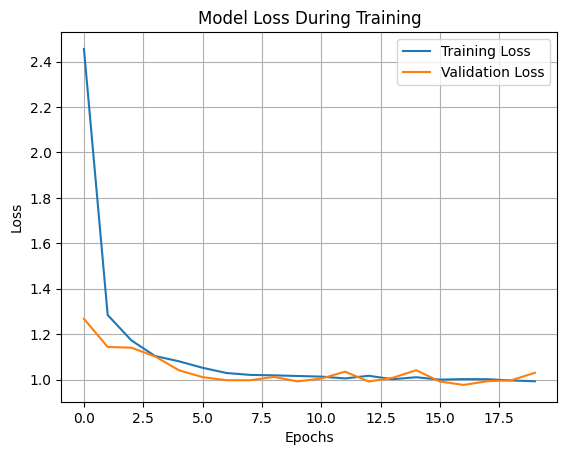

183/183 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Test MSE: 4.033896858919589
Test R-squared: 0.04532600220114891


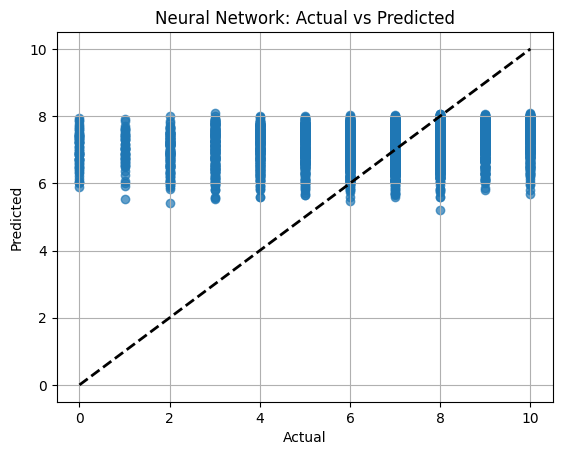

In [621]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import RobustScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.losses import Huber
from scipy import stats

# Define top 20 features based on previous feature importance analysis
top_20_features = [
    'ConvertedCompYearly', 'WorkExp', 'JobSat_ProjectSatisfaction', 'PurchaseInfluence_I have little or no influence',
    'JobSat_Teamwork', 'JobSat_WorkEnvironment', 'JobSat_JobRole', 'JobSat_Management', 
    'Knowledge_2_Strongly agree', 'Knowledge_8_Disagree', 'Knowledge_8_Strongly disagree', 
    'Knowledge_4_Disagree', 'Knowledge_3_Strongly disagree', 'Knowledge_3_Disagree', 
    'JobSat_Compensation', 'JobSat_WorkLifeBalance', 'JobSat_CompanyCulture', 'JobSat_ToolsAndResources', 
    'Frequency_3_Never', 'Knowledge_4_Strongly disagree'
]

# Subset the training and test data to only include the top 20 features
X_train_subset = X_train_transformed_df[top_20_features]
X_test_subset = X_test_transformed_df[top_20_features]

# Convert sparse data to dense format if necessary
def to_dense(df):
    return np.asarray(df.todense()) if hasattr(df, "todense") else np.asarray(df)

X_train_subset = to_dense(X_train_subset)
X_test_subset = to_dense(X_test_subset)

# Load and preprocess data
scaler = RobustScaler(with_centering=False)
X_train_scaled = scaler.fit_transform(X_train_subset)
X_test_scaled = scaler.transform(X_test_subset)

# Handle outliers by removing samples with extreme Z-scores
z_scores = np.abs(stats.zscore(X_train_scaled))
outlier_filter = (z_scores < 3).all(axis=1)
X_train_cleaned = X_train_scaled[outlier_filter]
y_train_cleaned = y_train[outlier_filter]  # Use boolean indexing for matching y values

# The rest of the code continues as before...

# Function to create the model
def create_model(input_dim, learning_rate=0.001, neurons=64, dropout_rate=0.2, l2_lambda=0.01):
    model = Sequential()
    model.add(Dense(neurons, input_dim=input_dim, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(neurons, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))
    return model

# Define hyperparameters for tuning
param_dist = {
    'neurons': [64, 128],
    'learning_rate': [0.001, 0.01],
    'batch_size': [32, 64],
    'epochs': [10, 20],
    'dropout_rate': [0.2, 0.3],
    'l2_lambda': [0.01, 0.001]
}

# Manual cross-validation for hyperparameter tuning
kf = KFold(n_splits=3, shuffle=True, random_state=42)
best_mse = float("inf")
best_params = {}

# Cross-validation loop through hyperparameters
for neurons in param_dist['neurons']:
    for learning_rate in param_dist['learning_rate']:
        for batch_size in param_dist['batch_size']:
            for epochs in param_dist['epochs']:
                for dropout_rate in param_dist['dropout_rate']:
                    for l2_lambda in param_dist['l2_lambda']:
                        fold_mse = []
                        for train_index, val_index in kf.split(X_train_cleaned):
                            X_train_cv, X_val_cv = X_train_cleaned[train_index], X_train_cleaned[val_index]
                            y_train_cv, y_val_cv = y_train_cleaned.iloc[train_index], y_train_cleaned.iloc[val_index]
                            
                            model = create_model(
                                input_dim=X_train_cleaned.shape[1], 
                                learning_rate=learning_rate, 
                                neurons=neurons, 
                                dropout_rate=dropout_rate, 
                                l2_lambda=l2_lambda
                            )
                            
                            early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                            lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                            
                            # Fit the model
                            history = model.fit(
                                X_train_cv, y_train_cv, 
                                epochs=epochs, 
                                batch_size=batch_size,
                                validation_data=(X_val_cv, y_val_cv), 
                                callbacks=[early_stopping, lr_scheduler], 
                                verbose=1
                            )
                            
                            # Calculate MSE for validation set
                            y_val_pred = model.predict(X_val_cv)
                            mse = mean_squared_error(y_val_cv, y_val_pred)
                            fold_mse.append(mse)
                        
                        avg_mse = np.mean(fold_mse)
                        if avg_mse < best_mse:
                            best_mse = avg_mse
                            best_params = {
                                'neurons': neurons, 
                                'learning_rate': learning_rate, 
                                'batch_size': batch_size, 
                                'epochs': epochs,
                                'dropout_rate': dropout_rate, 
                                'l2_lambda': l2_lambda
                            }

print(f"Best hyperparameters: {best_params}")
print(f"Best MSE: {best_mse}")

# Train the final model with the best parameters
best_model = create_model(
    input_dim=X_train_cleaned.shape[1], 
    learning_rate=best_params['learning_rate'], 
    neurons=best_params['neurons'],
    dropout_rate=best_params['dropout_rate'], 
    l2_lambda=best_params['l2_lambda']
)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)

history = best_model.fit(
    X_train_cleaned, y_train_cleaned, 
    epochs=best_params['epochs'], 
    batch_size=best_params['batch_size'], 
    validation_split=0.2, 
    callbacks=[early_stopping, lr_scheduler], 
    verbose=1
)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Predict on the test set and calculate MSE and R-squared
y_test_pred = best_model.predict(X_test_scaled)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Test MSE: {test_mse}")
print(f"Test R-squared: {test_r2}")

# Plot predicted vs actual values
plt.scatter(y_test, y_test_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Neural Network: Actual vs Predicted')
plt.grid(True)
plt.show()


In [614]:
import numpy as np
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFE
from sklearn.preprocessing import RobustScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.losses import Huber
import matplotlib.pyplot as plt
from scipy import stats

# Recursive Feature Elimination (RFE) to select the optimal number of features
def perform_rfe(X, y, model):
    rfe = RFE(estimator=model, n_features_to_select=10, step=1)
    rfe.fit(X, y)
    selected_features = X.columns[rfe.support_].tolist()
    return selected_features

# Function to build the model with regularization, dropout, and more layers
def create_model(learning_rate=0.001, neurons=64, dropout_rate=0.2, l2_lambda=0.01):
    model = Sequential()
    
    # Input layer using the `Input` function
    model.add(Dense(neurons, input_dim=X_train_subset.shape[1], activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())  # Add BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Second hidden layer with BatchNormalization and dropout
    model.add(Dense(neurons, activation='relu', kernel_regularizer='l2'))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    
    # Output layer (1 output for regression)
    model.add(Dense(1, activation='linear'))
    
    # Compile the model using Huber loss to be more robust to outliers
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))
    
    return model

# Load and preprocess data
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train_transformed_df)
X_test_scaled = scaler.transform(X_test_transformed_df)

# Handle outliers by removing extreme Z-scores
X_train_cleaned = X_train_transformed_df[(np.abs(stats.zscore(X_train_transformed_df)) < 3).all(axis=1)]
y_train_cleaned = y_train[X_train_cleaned.index]

# Recursive Feature Elimination (RFE) with Ridge to select the top features
ridge = Ridge()
selected_features = perform_rfe(X_train_cleaned, y_train_cleaned, ridge)
X_train_subset = X_train_cleaned[selected_features]
X_test_subset = X_test_transformed_df[selected_features]

# Hyperparameter Tuning with learning rate schedules and more neurons/layers
param_dist = {
    'neurons': [64, 128],
    'learning_rate': [0.001, 0.01],
    'batch_size': [32, 64],
    'epochs': [100, 200],
    'dropout_rate': [0.2, 0.3],
    'l2_lambda': [0.01, 0.001]
}

# Manual cross-validation with early stopping and learning rate schedule
kf = KFold(n_splits=3, shuffle=True, random_state=42)

best_mse = float("inf")
best_params = {}

# Cross-validation loop through hyperparameters
for neurons in param_dist['neurons']:
    for learning_rate in param_dist['learning_rate']:
        for batch_size in param_dist['batch_size']:
            for epochs in param_dist['epochs']:
                for dropout_rate in param_dist['dropout_rate']:
                    for l2_lambda in param_dist['l2_lambda']:
                        fold_mse = []
                        
                        for train_index, val_index in kf.split(X_train_subset):
                            X_train_cv, X_val_cv = X_train_subset.iloc[train_index], X_train_subset.iloc[val_index]
                            y_train_cv, y_val_cv = y_train_cleaned.iloc[train_index], y_train_cleaned.iloc[val_index]
                            
                            model = create_model(learning_rate=learning_rate, neurons=neurons, 
                                                 dropout_rate=dropout_rate, l2_lambda=l2_lambda)
                            
                            # Early stopping and learning rate scheduler
                            early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                            lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                            
                            # Fit the model
                            history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size,
                                                validation_data=(X_val_cv, y_val_cv), 
                                                callbacks=[early_stopping, lr_scheduler], verbose=1)
                            
                            # Predict and calculate MSE for validation set
                            y_val_pred = model.predict(X_val_cv)
                            mse = mean_squared_error(y_val_cv, y_val_pred)
                            fold_mse.append(mse)
                        
                        avg_mse = np.mean(fold_mse)
                        if avg_mse < best_mse:
                            best_mse = avg_mse
                            best_params = {'neurons': neurons, 'learning_rate': learning_rate, 
                                           'batch_size': batch_size, 'epochs': epochs,
                                           'dropout_rate': dropout_rate, 'l2_lambda': l2_lambda}

# Print the best hyperparameters and MSE
print(f"Best hyperparameters: {best_params}")
print(f"Best MSE: {best_mse}")

# Train the best model with the full training data
best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'],
                          dropout_rate=best_params['dropout_rate'], l2_lambda=best_params['l2_lambda'])
history = best_model.fit(X_train_subset, y_train_cleaned, epochs=best_params['epochs'], 
                         batch_size=best_params['batch_size'], validation_split=0.2, 
                         callbacks=[early_stopping, lr_scheduler], verbose=1)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Predict on the test set and calculate MSE and R-squared
y_test_pred = best_model.predict(X_test_subset)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Test MSE: {test_mse}")
print(f"Test R-squared: {test_r2}")

# Plot predicted vs actual values
plt.scatter(y_test, y_test_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Neural Network: Actual vs Predicted')
plt.grid(True)
plt.show()


ValueError: Cannot center sparse matrices: use `with_centering=False` instead. See docstring for motivation and alternatives.

Epoch 1/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 25.4531 - val_loss: 4.3172
Epoch 2/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0204 - val_loss: 3.8520
Epoch 3/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.7609 - val_loss: 3.8164
Epoch 4/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6358 - val_loss: 3.7950
Epoch 5/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.7409 - val_loss: 3.7833
Epoch 6/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6196 - val_loss: 3.7716
Epoch 7/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5642 - val_loss: 3.7653
Epoch 8/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5854 - val_loss: 3.7441
Epoch 9/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5556 - val_loss: 3.7803
Epoch 10/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5860 - val_loss: 3.7482
Epoch 11/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6306 - val_loss: 3.7619
Epoch 12/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/ste

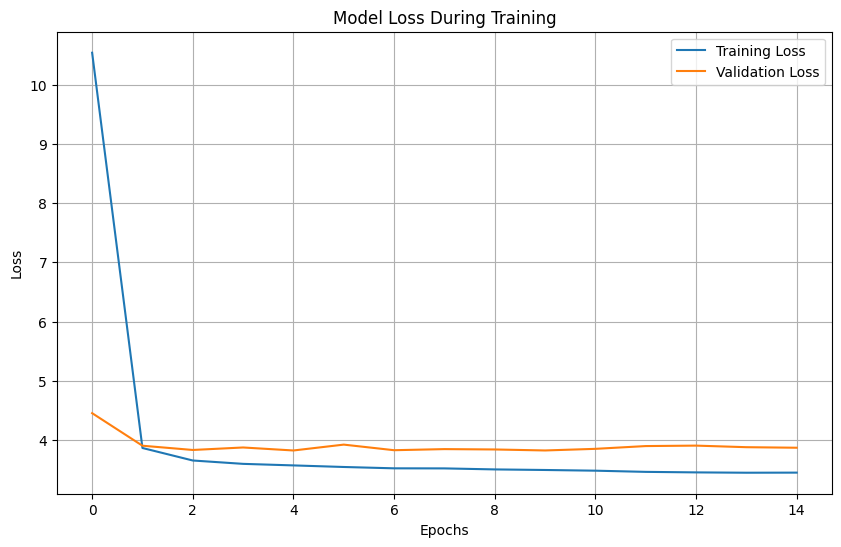

183/183 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Test MSE (Neural Network): 3.640299415558254
Test R-squared (Neural Network): 0.13847594081356374


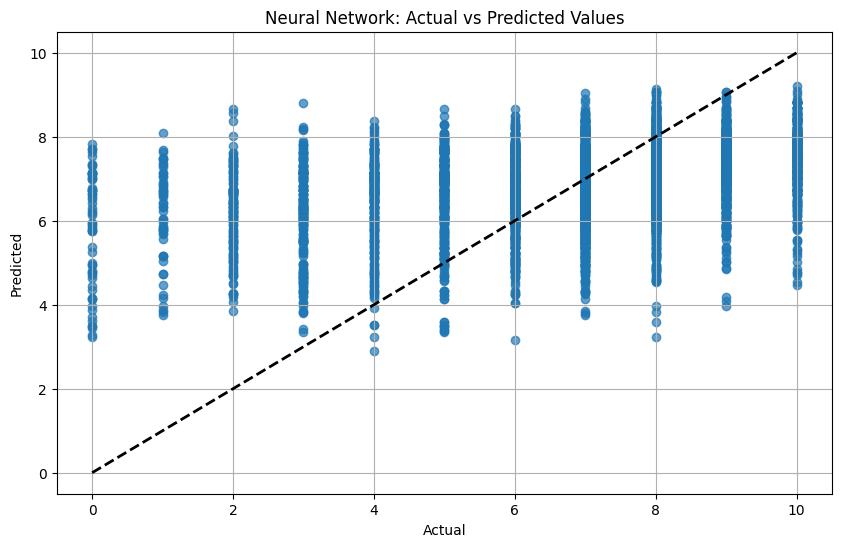

In [82]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt


# Function to build the model
def create_model(learning_rate=0.001, neurons=32):
    model = Sequential()
    
    # Input layer using the `Input` function
    model.add(Input(shape=(X_train_transformed_df.shape[1],)))  # Use Input to specify the input shape
    
    # First hidden layer
    model.add(Dense(neurons, activation='relu'))
    
    # Second hidden layer (you can add more layers as needed)
    model.add(Dense(neurons, activation='relu'))
    
    # Output layer (1 output for regression)
    model.add(Dense(1, activation='linear'))
    
    # Compile the model
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    
    return model


# Set the hyperparameters you want to tune
param_dist = {
    'neurons': [32, 64, 128],
    'learning_rate': [0.001, 0.01, 0.1],
    'batch_size': [32, 64, 128],
    'epochs': [50, 100, 200]
}

# Manual cross-validation with early stopping
kf = KFold(n_splits=3, shuffle=True, random_state=42)

best_mse = float("inf")
best_params = {}

# Loop through the hyperparameters
for neurons in param_dist['neurons']:
    for learning_rate in param_dist['learning_rate']:
        for batch_size in param_dist['batch_size']:
            for epochs in param_dist['epochs']:
                fold_mse = []
                # Cross-validation
                for train_index, val_index in kf.split(X_train_transformed_df):
                    X_train_cv, X_val_cv = X_train_transformed_df.iloc[train_index], X_train_transformed_df.iloc[val_index]
                    y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
                    
                    model = create_model(learning_rate=learning_rate, neurons=neurons)
                    
                    # Early stopping callback
                    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                    
                    # Fit the model with progress display (verbose=1)
                    history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, 
                                        validation_data=(X_val_cv, y_val_cv), callbacks=[early_stopping], verbose=1)
                    
                    # Predict on the validation set
                    y_val_pred = model.predict(X_val_cv)
                    mse = mean_squared_error(y_val_cv, y_val_pred)
                    fold_mse.append(mse)
                
                avg_mse = np.mean(fold_mse)
                
                if avg_mse < best_mse:
                    best_mse = avg_mse
                    best_params = {'neurons': neurons, 'learning_rate': learning_rate, 'batch_size': batch_size, 'epochs': epochs}

# Print the best hyperparameters and MSE
print(f"Best hyperparameters: {best_params}")
print(f"Best MSE: {best_mse}")

# Train the best model on the entire training set
best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'])

# Fit the model with verbose=1 and capture history
history = best_model.fit(X_train_transformed_df, y_train, epochs=best_params['epochs'], 
                         batch_size=best_params['batch_size'], validation_split=0.2, 
                         callbacks=[early_stopping], verbose=1)

# Plot training and validation loss over epochs
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Predict on the test set and calculate MSE and R-squared
y_test_pred_nn = best_model.predict(X_test_transformed_df)
test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
test_r2_nn = r2_score(y_test, y_test_pred_nn)

# Print MSE and R-squared
print(f"Test MSE (Neural Network): {test_mse_nn}")
print(f"Test R-squared (Neural Network): {test_r2_nn}")

# Plot predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of perfect prediction
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Neural Network: Actual vs Predicted Values')
plt.grid(True)
plt.show()


Epoch 1/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 24.8671 - val_loss: 3.9937
Epoch 2/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.9687 - val_loss: 3.9479
Epoch 3/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.9330 - val_loss: 3.9321
Epoch 4/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9736 - val_loss: 3.9628
Epoch 5/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.9916 - val_loss: 3.9417
Epoch 6/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0197 - val_loss: 3.9466
Epoch 7/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.9348 - val_loss: 3.9362
Epoch 8/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9292 - val_loss: 3.9336
Epoch 9/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9496 - val_loss: 3.9308
Epoch 10/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9428 - val_loss: 3.9493
Epoch 11/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 4.0566 - val_loss: 3.9222
Epoch 12/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/ste

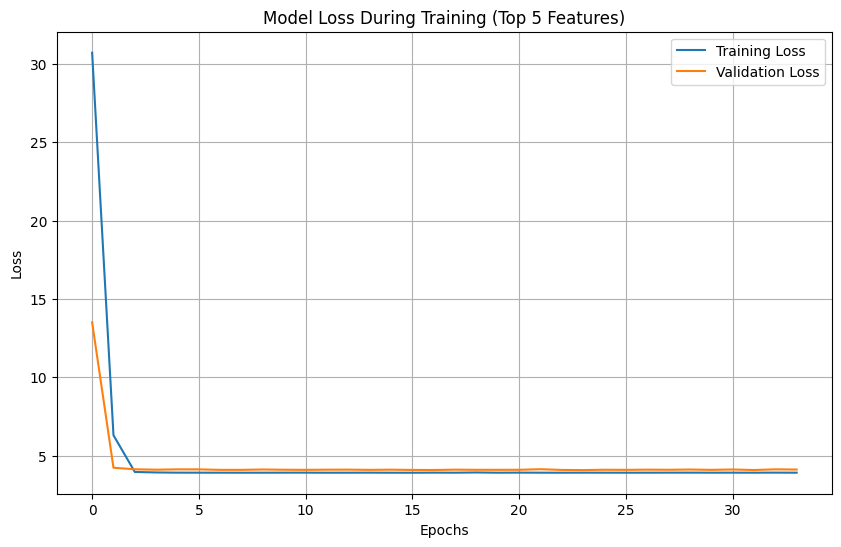

183/183 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Test MSE (Neural Network with 5 features): 3.8551862137252586
Test R-squared (Neural Network with 5 features): 0.08762019366507723


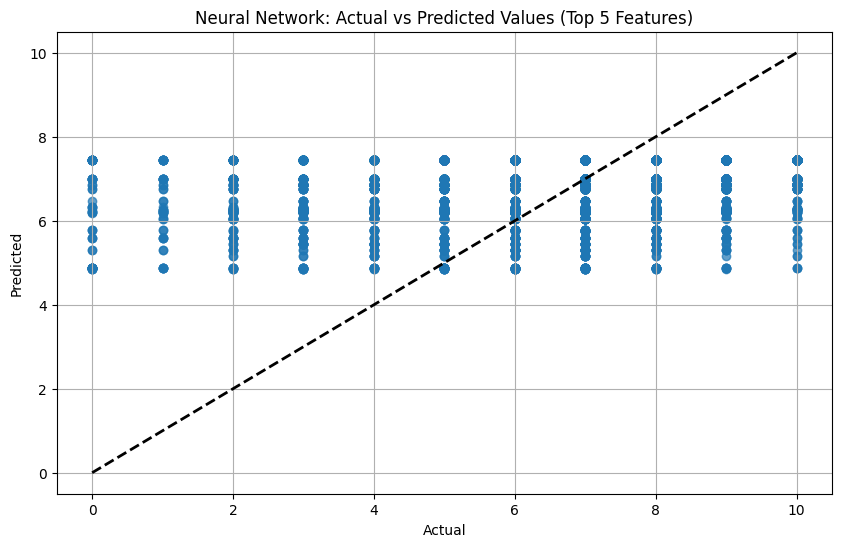

Epoch 1/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 24.4944 - val_loss: 3.9074
Epoch 2/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.8208 - val_loss: 3.8204
Epoch 3/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.7803 - val_loss: 3.7934
Epoch 4/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.8050 - val_loss: 3.8325
Epoch 5/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.8360 - val_loss: 3.7922
Epoch 6/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.8112 - val_loss: 3.7883
Epoch 7/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.8022 - val_loss: 3.8161
Epoch 8/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.7898 - val_loss: 3.7579
Epoch 9/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.7554 - val_loss: 3.8026
Epoch 10/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.7238 - val_loss: 3.7798
Epoch 11/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.7378 - val_loss: 3.8238
Epoch 12/50
485/485 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/ste

KeyboardInterrupt: 

In [83]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt


# Function to build the model
def create_model(learning_rate=0.001, neurons=32):
    model = Sequential()
    
    # Input layer using the `Input` function
    model.add(Input(shape=(X_train_subset.shape[1],)))  # Use Input to specify the input shape for subsets
    
    # First hidden layer
    model.add(Dense(neurons, activation='relu'))
    
    # Second hidden layer (you can add more layers as needed)
    model.add(Dense(neurons, activation='relu'))
    
    # Output layer (1 output for regression)
    model.add(Dense(1, activation='linear'))
    
    # Compile the model
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    
    return model


# Set the hyperparameters you want to tune
param_dist = {
    'neurons': [32, 64, 128],
    'learning_rate': [0.001, 0.01, 0.1],
    'batch_size': [32, 64, 128],
    'epochs': [50, 100, 200]
}

# Top 5, 10, 15, and 20 features
features_to_test = [5, 10, 15, 20]
results = {}

# Manual cross-validation with early stopping
kf = KFold(n_splits=3, shuffle=True, random_state=42)

for num_features in features_to_test:
    
    # Extract top N features based on feature importance
    top_n_features = feature_importances['Feature'][:num_features].tolist()
    
    # Filter X_train and X_test to keep only the top N features
    X_train_subset = X_train_transformed_df[top_n_features]
    X_test_subset = X_test_transformed_df[top_n_features]
    
    best_mse = float("inf")
    best_params = {}
    
    # Loop through the hyperparameters
    for neurons in param_dist['neurons']:
        for learning_rate in param_dist['learning_rate']:
            for batch_size in param_dist['batch_size']:
                for epochs in param_dist['epochs']:
                    fold_mse = []
                    # Cross-validation
                    for train_index, val_index in kf.split(X_train_subset):
                        X_train_cv, X_val_cv = X_train_subset.iloc[train_index], X_train_subset.iloc[val_index]
                        y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
                        
                        model = create_model(learning_rate=learning_rate, neurons=neurons)
                        
                        # Early stopping callback
                        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                        
                        # Fit the model with progress display (verbose=1)
                        history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, 
                                            validation_data=(X_val_cv, y_val_cv), callbacks=[early_stopping], verbose=1)
                        
                        # Predict on the validation set
                        y_val_pred = model.predict(X_val_cv)
                        mse = mean_squared_error(y_val_cv, y_val_pred)
                        fold_mse.append(mse)
                    
                    avg_mse = np.mean(fold_mse)
                    
                    if avg_mse < best_mse:
                        best_mse = avg_mse
                        best_params = {'neurons': neurons, 'learning_rate': learning_rate, 'batch_size': batch_size, 'epochs': epochs}
    
    # Print the best hyperparameters and MSE for this subset of features
    print(f"\nNumber of features: {num_features}")
    print(f"Best hyperparameters: {best_params}")
    print(f"Best MSE: {best_mse}")
    
    # Train the best model on the entire training set
    best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'])
    
    # Fit the model with verbose=1 and capture history
    history = best_model.fit(X_train_subset, y_train, epochs=best_params['epochs'], 
                             batch_size=best_params['batch_size'], validation_split=0.2, 
                             callbacks=[early_stopping], verbose=1)
    
    # Plot training and validation loss over epochs
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss During Training (Top {num_features} Features)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Predict on the test set and calculate MSE and R-squared
    y_test_pred_nn = best_model.predict(X_test_subset)
    test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
    test_r2_nn = r2_score(y_test, y_test_pred_nn)
    
    # Print MSE and R-squared
    print(f"Test MSE (Neural Network with {num_features} features): {test_mse_nn}")
    print(f"Test R-squared (Neural Network with {num_features} features): {test_r2_nn}")
    
    # Plot predicted vs actual values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of perfect prediction
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Neural Network: Actual vs Predicted Values (Top {num_features} Features)')
    plt.grid(True)
    plt.show()
    
    # Store results for each feature count
    results[num_features] = {'Test MSE': test_mse_nn, 'Test R-squared': test_r2_nn}
    
# Print final results summary
for num_features, metrics in results.items():
    print(f"\nNumber of Features: {num_features}")
    print(f"Test MSE: {metrics['Test MSE']}")
    print(f"Test R-squared: {metrics['Test R-squared']}")


In [638]:
# import numpy as np
# from sklearn.model_selection import KFold
# from sklearn.metrics import mean_squared_error
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.callbacks import EarlyStopping
# from tensorflow.keras.layers import Input
# from sklearn.metrics import r2_score
# import matplotlib.pyplot as plt


# # Function to build the model
# def create_model(learning_rate=0.001, neurons=32):
#     model = Sequential()
    
#     # Input layer using the `Input` function
#     model.add(Input(shape=(X_train_transformed_df.shape[1],)))  # Use Input to specify the input shape
    
#     # First hidden layer
#     model.add(Dense(neurons, activation='relu'))
    
#     # Second hidden layer (you can add more layers as needed)
#     model.add(Dense(neurons, activation='relu'))
    
#     # Output layer (1 output for regression)
#     model.add(Dense(1, activation='linear'))
    
#     # Compile the model
#     model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    
#     return model


# # Set the hyperparameters you want to tune
# param_dist = {
#     'neurons': [32, 64, 128],
#     'learning_rate': [0.001, 0.01, 0.1],
#     'batch_size': [32, 64, 128],
#     'epochs': [50, 100, 200]
# }

# # Manual cross-validation with early stopping
# kf = KFold(n_splits=3, shuffle=True, random_state=42)

# best_mse = float("inf")
# best_params = {}

# # Loop through the hyperparameters
# for neurons in param_dist['neurons']:
#     for learning_rate in param_dist['learning_rate']:
#         for batch_size in param_dist['batch_size']:
#             for epochs in param_dist['epochs']:
#                 fold_mse = []
#                 # Cross-validation
#                 for train_index, val_index in kf.split(X_train_transformed_df):
#                     X_train_cv, X_val_cv = X_train_transformed_df.iloc[train_index], X_train_transformed_df.iloc[val_index]
#                     y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
                    
#                     model = create_model(learning_rate=learning_rate, neurons=neurons)
                    
#                     # Early stopping callback
#                     early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                    
#                     # Fit the model
#                     model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, validation_data=(X_val_cv, y_val_cv),
#                               callbacks=[early_stopping], verbose=0)
                    
#                     # Predict on the validation set
#                     y_val_pred = model.predict(X_val_cv)
#                     mse = mean_squared_error(y_val_cv, y_val_pred)
#                     fold_mse.append(mse)
                
#                 avg_mse = np.mean(fold_mse)
                
#                 if avg_mse < best_mse:
#                     best_mse = avg_mse
#                     best_params = {'neurons': neurons, 'learning_rate': learning_rate, 'batch_size': batch_size, 'epochs': epochs}

# # Print the best hyperparameters and MSE
# print(f"Best hyperparameters: {best_params}")
# print(f"Best MSE: {best_mse}")

# # Train the best model on the entire training set
# best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'])

# best_model.fit(X_train_transformed_df, y_train, epochs=best_params['epochs'], batch_size=best_params['batch_size'], 
#                validation_split=0.2, callbacks=[early_stopping])




# # Predict on the test set and calculate MSE and R-squared
# y_test_pred_nn = best_model.predict(X_test_transformed_df)
# test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
# test_r2_nn = r2_score(y_test, y_test_pred_nn)

# # Print MSE and R-squared
# print(f"Test MSE (Neural Network): {test_mse_nn}")
# print(f"Test R-squared (Neural Network): {test_r2_nn}")

# # Plot predicted vs actual values
# plt.figure(figsize=(10, 6))
# plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
# plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of perfect prediction
# plt.xlabel('Actual')
# plt.ylabel('Predicted')
# plt.title('Neural Network: Actual vs Predicted Values')
# plt.grid(True)
# plt.show()

# # # Predict on the test set and calculate MSE
# # y_test_pred_nn = best_model.predict(X_test_transformed_df)
# # test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
# # print(f"Test MSE (Neural Network): {test_mse_nn}")


In [1]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Input
from tensorflow.keras.regularizers import l2
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Function to build the model with regularization, dropout, batch normalization, and more layers
def create_model(learning_rate=0.001, neurons=32, dropout_rate=0.2, l2_lambda=0.01):
    model = Sequential()
    
    # Input layer using the `Input` function
    model.add(Input(shape=(X_train_subset.shape[1],)))
    
    # First hidden layer with L2 regularization, dropout, and batch normalization
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Adding BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Second hidden layer with L2 regularization, dropout, and batch normalization
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Adding BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Additional third hidden layer to increase capacity
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Adding BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Output layer (1 output for regression)
    model.add(Dense(1, activation='linear'))
    
    # Compile the model
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    
    return model

# Set the hyperparameters you want to tune, including dropout and L2 regularization
param_dist = {
    'neurons': [32, 64, 128],
    'learning_rate': [0.001, 0.01, 0.1],
    'batch_size': [32, 64, 128],
    'epochs': [50, 100, 200],
    'dropout_rate': [0.2, 0.3],  # Dropout rates to experiment with
    'l2_lambda': [0.01, 0.001]   # L2 regularization strength to try
}

# Top 5, 10, 15, and 20 features
features_to_test = [5, 10, 15, 20]
results = {}

# Manual cross-validation with early stopping and learning rate scheduler
kf = KFold(n_splits=3, shuffle=True, random_state=42)

for num_features in features_to_test:
    
    # Extract top N features based on feature importance
    top_n_features = feature_importances['Feature'][:num_features].tolist()
    
    # Filter X_train and X_test to keep only the top N features
    X_train_subset = X_train_transformed_df[top_n_features]
    X_test_subset = X_test_transformed_df[top_n_features]
    
    best_mse = float("inf")
    best_params = {}
    
    # Loop through the hyperparameters
    for neurons in param_dist['neurons']:
        for learning_rate in param_dist['learning_rate']:
            for batch_size in param_dist['batch_size']:
                for epochs in param_dist['epochs']:
                    for dropout_rate in param_dist['dropout_rate']:
                        for l2_lambda in param_dist['l2_lambda']:
                            fold_mse = []
                            # Cross-validation
                            for train_index, val_index in kf.split(X_train_subset):
                                X_train_cv, X_val_cv = X_train_subset.iloc[train_index], X_train_subset.iloc[val_index]
                                y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
                                
                                model = create_model(learning_rate=learning_rate, neurons=neurons, 
                                                     dropout_rate=dropout_rate, l2_lambda=l2_lambda)
                                
                                # Early stopping and learning rate scheduler callbacks
                                early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                                lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                                
                                # Fit the model with progress display (verbose=1)
                                history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, 
                                                    validation_data=(X_val_cv, y_val_cv), 
                                                    callbacks=[early_stopping, lr_scheduler], verbose=1)
                                
                                # Predict on the validation set
                                y_val_pred = model.predict(X_val_cv)
                                mse = mean_squared_error(y_val_cv, y_val_pred)
                                fold_mse.append(mse)
                            
                            avg_mse = np.mean(fold_mse)
                            
                            if avg_mse < best_mse:
                                best_mse = avg_mse
                                best_params = {'neurons': neurons, 'learning_rate': learning_rate, 
                                               'batch_size': batch_size, 'epochs': epochs,
                                               'dropout_rate': dropout_rate, 'l2_lambda': l2_lambda}
    
    # Print the best hyperparameters and MSE for this subset of features
    print(f"\nNumber of features: {num_features}")
    print(f"Best hyperparameters: {best_params}")
    print(f"Best MSE: {best_mse}")
    
    # Train the best model on the entire training set
    best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'],
                              dropout_rate=best_params['dropout_rate'], l2_lambda=best_params['l2_lambda'])
    
    # Fit the model with verbose=1 and capture history
    history = best_model.fit(X_train_subset, y_train, epochs=best_params['epochs'], 
                             batch_size=best_params['batch_size'], validation_split=0.2, 
                             callbacks=[early_stopping, lr_scheduler], verbose=1)
    
    # Plot training and validation loss over epochs
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss During Training (Top {num_features} Features)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Predict on the test set and calculate MSE and R-squared
    y_test_pred_nn = best_model.predict(X_test_subset)
    test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
    test_r2_nn = r2_score(y_test, y_test_pred_nn)
    
    # Print MSE and R-squared
    print(f"Test MSE (Neural Network with {num_features} features): {test_mse_nn}")
    print(f"Test R-squared (Neural Network with {num_features} features): {test_r2_nn}")
    
    # Plot predicted vs actual values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of perfect prediction
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Neural Network: Actual vs Predicted Values (Top {num_features} Features)')
    plt.grid(True)
    plt.show()
    
    # Store results for each feature count
    results[num_features] = {'Test MSE': test_mse_nn, 'Test R-squared': test_r2_nn}
    
# Print final results summary
for num_features, metrics in results.items():
    print(f"\nNumber of Features: {num_features}")
    print(f"Test MSE: {metrics['Test MSE']}")
    print(f"Test R-squared: {metrics['Test R-squared']}")


NameError: name 'feature_importances' is not defined

In [639]:
# import numpy as np
# from sklearn.model_selection import KFold
# from sklearn.metrics import mean_squared_error
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Dropout
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.callbacks import EarlyStopping
# from tensorflow.keras.layers import Input
# from tensorflow.keras.regularizers import l2
# from sklearn.metrics import r2_score
# import matplotlib.pyplot as plt

# # Function to build the model with regularization, dropout, and more layers
# def create_model(learning_rate=0.001, neurons=32, dropout_rate=0.2, l2_lambda=0.01):
#     model = Sequential()
    
#     # Input layer using the `Input` function
#     model.add(Input(shape=(X_train_subset.shape[1],)))
    
#     # First hidden layer with L2 regularization and dropout
#     model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
#     model.add(Dropout(dropout_rate))
    
#     # Second hidden layer with L2 regularization and dropout
#     model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
#     model.add(Dropout(dropout_rate))
    
#     # Additional third hidden layer to increase capacity
#     model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
#     model.add(Dropout(dropout_rate))
    
#     # Output layer (1 output for regression)
#     model.add(Dense(1, activation='linear'))
    
#     # Compile the model
#     model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    
#     return model

# # Set the hyperparameters you want to tune, including dropout and L2 regularization
# param_dist = {
#     'neurons': [32, 64, 128],
#     'learning_rate': [0.001, 0.01, 0.1],
#     'batch_size': [32, 64, 128],
#     'epochs': [50, 100, 200],
#     'dropout_rate': [0.2, 0.3],  # Dropout rates to experiment with
#     'l2_lambda': [0.01, 0.001]   # L2 regularization strength to try
# }

# # Top 5, 10, 15, and 20 features
# features_to_test = [5, 10, 15, 20]
# results = {}

# # Manual cross-validation with early stopping
# kf = KFold(n_splits=3, shuffle=True, random_state=42)

# for num_features in features_to_test:
    
#     # Extract top N features based on feature importance
#     top_n_features = feature_importances['Feature'][:num_features].tolist()
    
#     # Filter X_train and X_test to keep only the top N features
#     X_train_subset = X_train_transformed_df[top_n_features]
#     X_test_subset = X_test_transformed_df[top_n_features]
    
#     best_mse = float("inf")
#     best_params = {}
    
#     # Loop through the hyperparameters
#     for neurons in param_dist['neurons']:
#         for learning_rate in param_dist['learning_rate']:
#             for batch_size in param_dist['batch_size']:
#                 for epochs in param_dist['epochs']:
#                     for dropout_rate in param_dist['dropout_rate']:
#                         for l2_lambda in param_dist['l2_lambda']:
#                             fold_mse = []
#                             # Cross-validation
#                             for train_index, val_index in kf.split(X_train_subset):
#                                 X_train_cv, X_val_cv = X_train_subset.iloc[train_index], X_train_subset.iloc[val_index]
#                                 y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
                                
#                                 model = create_model(learning_rate=learning_rate, neurons=neurons, 
#                                                      dropout_rate=dropout_rate, l2_lambda=l2_lambda)
                                
#                                 # Early stopping callback
#                                 early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                                
#                                 # Fit the model with progress display (verbose=1)
#                                 history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, 
#                                                     validation_data=(X_val_cv, y_val_cv), callbacks=[early_stopping], verbose=1)
                                
#                                 # Predict on the validation set
#                                 y_val_pred = model.predict(X_val_cv)
#                                 mse = mean_squared_error(y_val_cv, y_val_pred)
#                                 fold_mse.append(mse)
                            
#                             avg_mse = np.mean(fold_mse)
                            
#                             if avg_mse < best_mse:
#                                 best_mse = avg_mse
#                                 best_params = {'neurons': neurons, 'learning_rate': learning_rate, 
#                                                'batch_size': batch_size, 'epochs': epochs,
#                                                'dropout_rate': dropout_rate, 'l2_lambda': l2_lambda}
    
#     # Print the best hyperparameters and MSE for this subset of features
#     print(f"\nNumber of features: {num_features}")
#     print(f"Best hyperparameters: {best_params}")
#     print(f"Best MSE: {best_mse}")
    
#     # Train the best model on the entire training set
#     best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'],
#                               dropout_rate=best_params['dropout_rate'], l2_lambda=best_params['l2_lambda'])
    
#     # Fit the model with verbose=1 and capture history
#     history = best_model.fit(X_train_subset, y_train, epochs=best_params['epochs'], 
#                              batch_size=best_params['batch_size'], validation_split=0.2, 
#                              callbacks=[early_stopping], verbose=1)
    
#     # Plot training and validation loss over epochs
#     plt.figure(figsize=(10, 6))
#     plt.plot(history.history['loss'], label='Training Loss')
#     plt.plot(history.history['val_loss'], label='Validation Loss')
#     plt.title(f'Model Loss During Training (Top {num_features} Features)')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
    
#     # Predict on the test set and calculate MSE and R-squared
#     y_test_pred_nn = best_model.predict(X_test_subset)
#     test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
#     test_r2_nn = r2_score(y_test, y_test_pred_nn)
    
#     # Print MSE and R-squared
#     print(f"Test MSE (Neural Network with {num_features} features): {test_mse_nn}")
#     print(f"Test R-squared (Neural Network with {num_features} features): {test_r2_nn}")
    
#     # Plot predicted vs actual values
#     plt.figure(figsize=(10, 6))
#     plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
#     plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of perfect prediction
#     plt.xlabel('Actual')
#     plt.ylabel('Predicted')
#     plt.title(f'Neural Network: Actual vs Predicted Values (Top {num_features} Features)')
#     plt.grid(True)
#     plt.show()
    
#     # Store results for each feature count
#     results[num_features] = {'Test MSE': test_mse_nn, 'Test R-squared': test_r2_nn}
    
# # Print final results summary
# for num_features, metrics in results.items():
#     print(f"\nNumber of Features: {num_features}")
#     print(f"Test MSE: {metrics['Test MSE']}")
#     print(f"Test R-squared: {metrics['Test R-squared']}")


In [ ]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Input
from tensorflow.keras.losses import Huber
from tensorflow.keras.regularizers import l2
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Function to build the model with regularization, dropout, and BatchNormalization
def create_model(learning_rate=0.001, neurons=32, dropout_rate=0.2, l2_lambda=0.01):
    model = Sequential()
    
    # Input layer using the `Input` function
    model.add(Input(shape=(X_train_subset.shape[1],)))
    
    # First hidden layer with L2 regularization, BatchNormalization, and dropout
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Add BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Second hidden layer with L2 regularization, BatchNormalization, and dropout
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Add BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Additional third hidden layer to increase capacity
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Add BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Output layer (1 output for regression)
    model.add(Dense(1, activation='linear'))
    
    # Compile the model with Huber Loss
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))  # Use Huber loss
    
    return model

# Set the hyperparameters you want to tune, including dropout and L2 regularization
param_dist = {
    'neurons': [32, 64, 128],
    'learning_rate': [0.001, 0.01, 0.1],
    'batch_size': [32, 64, 128],
    'epochs': [50, 100, 200],
    'dropout_rate': [0.2, 0.3],  # Dropout rates to experiment with
    'l2_lambda': [0.01, 0.001]   # L2 regularization strength to try
}

# Top 5, 10, 15, and 20 features
features_to_test = [5, 10, 15, 20]
results = {}

# Manual cross-validation with early stopping
kf = KFold(n_splits=3, shuffle=True, random_state=42)

for num_features in features_to_test:
    
    # Extract top N features based on feature importance
    top_n_features = feature_importances['Feature'][:num_features].tolist()
    
    # Filter X_train and X_test to keep only the top N features
    X_train_subset = X_train_transformed_df[top_n_features]
    X_test_subset = X_test_transformed_df[top_n_features]
    
    best_mse = float("inf")
    best_params = {}
    
    # Loop through the hyperparameters
    for neurons in param_dist['neurons']:
        for learning_rate in param_dist['learning_rate']:
            for batch_size in param_dist['batch_size']:
                for epochs in param_dist['epochs']:
                    for dropout_rate in param_dist['dropout_rate']:
                        for l2_lambda in param_dist['l2_lambda']:
                            fold_mse = []
                            # Cross-validation
                            for train_index, val_index in kf.split(X_train_subset):
                                X_train_cv, X_val_cv = X_train_subset.iloc[train_index], X_train_subset.iloc[val_index]
                                y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
                                
                                model = create_model(learning_rate=learning_rate, neurons=neurons, 
                                                     dropout_rate=dropout_rate, l2_lambda=l2_lambda)
                                
                                # Early stopping callback
                                early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                                
                                # Reduce learning rate if validation loss plateaus
                                lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                                
                                # Fit the model with progress display (verbose=1)
                                history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, 
                                                    validation_data=(X_val_cv, y_val_cv), callbacks=[early_stopping, lr_scheduler], verbose=1)
                                
                                # Predict on the validation set
                                y_val_pred = model.predict(X_val_cv)
                                mse = mean_squared_error(y_val_cv, y_val_pred)
                                fold_mse.append(mse)
                            
                            avg_mse = np.mean(fold_mse)
                            
                            if avg_mse < best_mse:
                                best_mse = avg_mse
                                best_params = {'neurons': neurons, 'learning_rate': learning_rate, 
                                               'batch_size': batch_size, 'epochs': epochs,
                                               'dropout_rate': dropout_rate, 'l2_lambda': l2_lambda}
    
    # Print the best hyperparameters and MSE for this subset of features
    print(f"\nNumber of features: {num_features}")
    print(f"Best hyperparameters: {best_params}")
    print(f"Best MSE: {best_mse}")
    
    # Train the best model on the entire training set
    best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'],
                              dropout_rate=best_params['dropout_rate'], l2_lambda=best_params['l2_lambda'])
    
    # Fit the model with verbose=1 and capture history
    history = best_model.fit(X_train_subset, y_train, epochs=best_params['epochs'], 
                             batch_size=best_params['batch_size'], validation_split=0.2, 
                             callbacks=[early_stopping, lr_scheduler], verbose=1)
    
    # Plot training and validation loss over epochs
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss During Training (Top {num_features} Features)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Predict on the test set and calculate MSE and R-squared
    y_test_pred_nn = best_model.predict(X_test_subset)
    test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
    test_r2_nn = r2_score(y_test, y_test_pred_nn)
    
    # Print MSE and R-squared
    print(f"Test MSE (Neural Network with {num_features} features): {test_mse_nn}")
    print(f"Test R-squared (Neural Network with {num_features} features): {test_r2_nn}")
    
    # Plot predicted vs actual values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of pe


In [ ]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Input
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import Huber
from sklearn.metrics import r2_score
from sklearn.preprocessing import RobustScaler
from scipy import stats
import matplotlib.pyplot as plt

# Apply RobustScaler for robust scaling
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train_transformed_df)
X_test_scaled = scaler.transform(X_test_transformed_df)

# Remove outliers using z-score threshold
X_train_cleaned = X_train_transformed_df[(np.abs(stats.zscore(X_train_transformed_df)) < 3).all(axis=1)]
y_train_cleaned = y_train[X_train_cleaned.index]

# Function to build the model with regularization, dropout, BatchNormalization, and Huber Loss
def create_model(learning_rate=0.001, neurons=32, dropout_rate=0.2, l2_lambda=0.01):
    model = Sequential()
    
    # Input layer using the `Input` function
    model.add(Input(shape=(X_train_cleaned.shape[1],)))
    
    # First hidden layer with L2 regularization, BatchNormalization, and dropout
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Add BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Second hidden layer with L2 regularization, BatchNormalization, and dropout
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Add BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Additional third hidden layer to increase capacity
    model.add(Dense(neurons, activation='relu', kernel_regularizer=l2(l2_lambda)))
    model.add(BatchNormalization())  # Add BatchNormalization
    model.add(Dropout(dropout_rate))
    
    # Output layer (1 output for regression)
    model.add(Dense(1, activation='linear'))
    
    # Compile the model with Huber loss
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=Huber(delta=1.0))  # Use Huber loss
    
    return model

# Set the hyperparameters you want to tune, including dropout and L2 regularization
param_dist = {
    'neurons': [32, 64, 128],
    'learning_rate': [0.001, 0.01, 0.1],
    'batch_size': [32, 64, 128],
    'epochs': [50, 100, 200],
    'dropout_rate': [0.2, 0.3],  # Dropout rates to experiment with
    'l2_lambda': [0.01, 0.001]   # L2 regularization strength to try
}

# Top 5, 10, 15, and 20 features
features_to_test = [5, 10, 15, 20]
results = {}

# Manual cross-validation with early stopping
kf = KFold(n_splits=3, shuffle=True, random_state=42)

for num_features in features_to_test:
    
    # Extract top N features based on feature importance
    top_n_features = feature_importances['Feature'][:num_features].tolist()
    
    # Filter X_train and X_test to keep only the top N features
    X_train_subset = X_train_cleaned[top_n_features]
    X_test_subset = X_test_scaled[:, :num_features]  # Scaling has already been applied
    
    best_mse = float("inf")
    best_params = {}
    
    # Loop through the hyperparameters
    for neurons in param_dist['neurons']:
        for learning_rate in param_dist['learning_rate']:
            for batch_size in param_dist['batch_size']:
                for epochs in param_dist['epochs']:
                    for dropout_rate in param_dist['dropout_rate']:
                        for l2_lambda in param_dist['l2_lambda']:
                            fold_mse = []
                            # Cross-validation
                            for train_index, val_index in kf.split(X_train_subset):
                                X_train_cv, X_val_cv = X_train_subset.iloc[train_index], X_train_subset.iloc[val_index]
                                y_train_cv, y_val_cv = y_train_cleaned.iloc[train_index], y_train_cleaned.iloc[val_index]
                                
                                model = create_model(learning_rate=learning_rate, neurons=neurons, 
                                                     dropout_rate=dropout_rate, l2_lambda=l2_lambda)
                                
                                # Early stopping callback
                                early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
                                
                                # Reduce learning rate if validation loss plateaus
                                lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                                
                                # Fit the model with progress display (verbose=1)
                                history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, 
                                                    validation_data=(X_val_cv, y_val_cv), callbacks=[early_stopping, lr_scheduler], verbose=1)
                                
                                # Predict on the validation set
                                y_val_pred = model.predict(X_val_cv)
                                mse = mean_squared_error(y_val_cv, y_val_pred)
                                fold_mse.append(mse)
                            
                            avg_mse = np.mean(fold_mse)
                            
                            if avg_mse < best_mse:
                                best_mse = avg_mse
                                best_params = {'neurons': neurons, 'learning_rate': learning_rate, 
                                               'batch_size': batch_size, 'epochs': epochs,
                                               'dropout_rate': dropout_rate, 'l2_lambda': l2_lambda}
    
    # Print the best hyperparameters and MSE for this subset of features
    print(f"\nNumber of features: {num_features}")
    print(f"Best hyperparameters: {best_params}")
    print(f"Best MSE: {best_mse}")
    
    # Train the best model on the entire training set
    best_model = create_model(learning_rate=best_params['learning_rate'], neurons=best_params['neurons'],
                              dropout_rate=best_params['dropout_rate'], l2_lambda=best_params['l2_lambda'])
    
    # Fit the model with verbose=1 and capture history
    history = best_model.fit(X_train_subset, y_train_cleaned, epochs=best_params['epochs'], 
                             batch_size=best_params['batch_size'], validation_split=0.2, 
                             callbacks=[early_stopping, lr_scheduler], verbose=1)
    
    # Plot training and validation loss over epochs
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss During Training (Top {num_features} Features)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Predict on the test set and calculate MSE and R-squared
    y_test_pred_nn = best_model.predict(X_test_subset)
    test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
    test_r2_nn = r2_score(y_test, y_test_pred_nn)
    
    # Print MSE and R-squared
    print(f"Test MSE (Neural Network with {num_features} features): {test_mse_nn}")
    print(f"Test R-squared (Neural Network with {num_features} features): {test_r2_nn}")
    
    # Plot predicted vs actual values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of perfect prediction
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Neural Network: Actual vs Predicted Values (Top {num_features} Features)')
    plt.grid(True)
    plt.show()
    
    # Store results for each feature count
    results[num_features] = {'Test MSE': test_mse_nn, 'Test R-squared': test_r2_nn}
    
# Print final results summary
for num_features, metrics in results.items():
    print(f"\nNumber of Features: {num_features}")
    print(f"Test MSE: {metrics['Test MSE']}")
    print(f"Test R-squared: {metrics['Test R-squared']}")


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5932 - val_loss: 2.4371 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2774 - val_loss: 1.6168 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9161 - val_loss: 1.4486 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6547 - val_loss: 1.3022 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5110 - val_loss: 1.1852 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3703 - val_loss: 1.1139 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2991 - val_loss: 1.0768 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2256 - val_loss: 1.0768 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1791 - val_loss: 1.0114 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 6.5540 - val_loss: 2.2611 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2968 - val_loss: 1.7501 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9068 - val_loss: 1.4520 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6707 - val_loss: 1.2828 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4977 - val_loss: 1.2099 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3544 - val_loss: 1.1468 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2764 - val_loss: 1.1171 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1758 - val_loss: 1.0615 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1644 - val_loss: 1.0154 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 6.5510 - val_loss: 2.2346 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2975 - val_loss: 1.7054 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9387 - val_loss: 1.5463 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6868 - val_loss: 1.3624 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5112 - val_loss: 1.2702 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3828 - val_loss: 1.1837 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2919 - val_loss: 1.1406 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2264 - val_loss: 1.1002 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1558 - val_loss: 1.1022 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 5.5339 - val_loss: 1.4734 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5815 - val_loss: 1.0901 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4231 - val_loss: 1.1157 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3660 - val_loss: 1.1005 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2968 - val_loss: 1.0829 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2674 - val_loss: 1.0529 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2242 - val_loss: 1.0459 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2173 - val_loss: 1.0324 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1896 - val_loss: 1.0193 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5942 - val_loss: 1.5625 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6222 - val_loss: 1.1026 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4295 - val_loss: 1.1302 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3832 - val_loss: 1.0807 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2974 - val_loss: 1.0749 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2707 - val_loss: 1.0764 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2435 - val_loss: 1.0566 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2253 - val_loss: 1.0543 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1877 - val_loss: 1.0386 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 5.5097 - val_loss: 1.5120 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5902 - val_loss: 1.1436 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4414 - val_loss: 1.1364 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3397 - val_loss: 1.1593 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2868 - val_loss: 1.1158 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2567 - val_loss: 1.1154 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1974 - val_loss: 1.1003 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2041 - val_loss: 1.1074 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1480 - val_loss: 1.0835 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5893 - val_loss: 2.4413 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6090 - val_loss: 1.7565 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1843 - val_loss: 1.5761 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8828 - val_loss: 1.4348 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6664 - val_loss: 1.2899 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5434 - val_loss: 1.2097 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4085 - val_loss: 1.1363 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3195 - val_loss: 1.0725 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2685 - val_loss: 1.0383 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.6869 - val_loss: 2.5443 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5938 - val_loss: 1.7179 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1514 - val_loss: 1.5443 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8593 - val_loss: 1.4165 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6365 - val_loss: 1.2868 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4809 - val_loss: 1.1879 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3882 - val_loss: 1.1385 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2839 - val_loss: 1.0716 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2379 - val_loss: 1.0368 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6576 - val_loss: 2.7483 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5536 - val_loss: 1.8003 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1403 - val_loss: 1.6025 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8530 - val_loss: 1.4413 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6189 - val_loss: 1.3146 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4527 - val_loss: 1.2117 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3431 - val_loss: 1.1477 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2431 - val_loss: 1.1047 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2120 - val_loss: 1.0682 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 5.6858 - val_loss: 2.2823 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8514 - val_loss: 1.1428 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5172 - val_loss: 1.1144 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4676 - val_loss: 1.0933 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3587 - val_loss: 1.0866 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3196 - val_loss: 1.0813 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2543 - val_loss: 1.0787 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2677 - val_loss: 1.0528 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2421 - val_loss: 1.0491 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.6058 - val_loss: 2.1076 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8544 - val_loss: 1.1124 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5560 - val_loss: 1.1477 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4516 - val_loss: 1.1604 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3878 - val_loss: 1.1040 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3416 - val_loss: 1.0882 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2804 - val_loss: 1.0678 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2413 - val_loss: 1.0639 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1915 - val_loss: 1.0497 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5.5972 - val_loss: 1.5721 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8014 - val_loss: 1.2013 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5214 - val_loss: 1.1405 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4111 - val_loss: 1.1287 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3861 - val_loss: 1.1929 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3103 - val_loss: 1.1303 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2460 - val_loss: 1.1103 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2449 - val_loss: 1.1113 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1906 - val_loss: 1.0844 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 6.5237 - val_loss: 2.0000 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2836 - val_loss: 1.6820 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9561 - val_loss: 1.4626 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6931 - val_loss: 1.3294 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5306 - val_loss: 1.2490 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4125 - val_loss: 1.1445 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3098 - val_loss: 1.0734 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2382 - val_loss: 1.0524 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2112 - val_loss: 1.0120 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5975 - val_loss: 2.3141 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2767 - val_loss: 1.7341 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9154 - val_loss: 1.4493 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6891 - val_loss: 1.3683 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4978 - val_loss: 1.2191 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3648 - val_loss: 1.1265 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2717 - val_loss: 1.0739 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2337 - val_loss: 1.0452 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1889 - val_loss: 1.0558 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.5778 - val_loss: 2.3338 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2749 - val_loss: 1.7447 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9034 - val_loss: 1.4757 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6552 - val_loss: 1.4029 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5083 - val_loss: 1.2242 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3661 - val_loss: 1.1697 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2270 - val_loss: 1.1246 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1976 - val_loss: 1.0987 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1453 - val_loss: 1.0773 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5.5204 - val_loss: 1.5783 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6476 - val_loss: 1.1115 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4469 - val_loss: 1.1285 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3411 - val_loss: 1.0753 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2972 - val_loss: 1.0916 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3001 - val_loss: 1.0706 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2410 - val_loss: 1.0430 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2183 - val_loss: 1.0470 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1842 - val_loss: 1.0201 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5107 - val_loss: 1.3212 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6067 - val_loss: 1.1045 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4495 - val_loss: 1.1024 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4131 - val_loss: 1.0914 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3316 - val_loss: 1.0827 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2779 - val_loss: 1.0992 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2491 - val_loss: 1.0528 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2194 - val_loss: 1.0527 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1926 - val_loss: 1.0410 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5578 - val_loss: 1.6075 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5917 - val_loss: 1.1457 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4084 - val_loss: 1.1280 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3292 - val_loss: 1.1264 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2863 - val_loss: 1.1356 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2626 - val_loss: 1.1193 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2253 - val_loss: 1.1382 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1880 - val_loss: 1.0833 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1770 - val_loss: 1.0713 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.7202 - val_loss: 2.3379 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5559 - val_loss: 1.7573 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1470 - val_loss: 1.5833 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8731 - val_loss: 1.4044 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6076 - val_loss: 1.2656 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4812 - val_loss: 1.1815 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3629 - val_loss: 1.1123 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3025 - val_loss: 1.0799 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2133 - val_loss: 1.0315 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6965 - val_loss: 2.7457 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6119 - val_loss: 1.7180 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1067 - val_loss: 1.5705 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8297 - val_loss: 1.3864 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6278 - val_loss: 1.2659 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5120 - val_loss: 1.1976 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3783 - val_loss: 1.1173 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2961 - val_loss: 1.0891 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2243 - val_loss: 1.0526 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 6.7198 - val_loss: 2.7417 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5598 - val_loss: 1.7732 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1001 - val_loss: 1.6629 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8676 - val_loss: 1.4379 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5923 - val_loss: 1.3023 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4665 - val_loss: 1.2527 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3249 - val_loss: 1.1439 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2452 - val_loss: 1.1182 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1897 - val_loss: 1.0852 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5293 - val_loss: 1.4943 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7759 - val_loss: 1.1051 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5723 - val_loss: 1.1176 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4394 - val_loss: 1.0662 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3809 - val_loss: 1.0581 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3145 - val_loss: 1.0717 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2741 - val_loss: 1.0674 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2412 - val_loss: 1.0642 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2162 - val_loss: 1.0282 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.7037 - val_loss: 2.1101 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8687 - val_loss: 1.1304 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5567 - val_loss: 1.1638 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4381 - val_loss: 1.1430 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3758 - val_loss: 1.0849 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3383 - val_loss: 1.0805 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2924 - val_loss: 1.0688 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2662 - val_loss: 1.0544 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2287 - val_loss: 1.0510 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5874 - val_loss: 1.3718 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7825 - val_loss: 1.1721 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5674 - val_loss: 1.1423 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4440 - val_loss: 1.1492 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3577 - val_loss: 1.1250 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3085 - val_loss: 1.1215 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2961 - val_loss: 1.1012 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2283 - val_loss: 1.1070 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1950 - val_loss: 1.0906 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.1714 - val_loss: 4.8233 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1801 - val_loss: 1.8770 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1882 - val_loss: 1.6010 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9742 - val_loss: 1.4991 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7520 - val_loss: 1.4048 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6301 - val_loss: 1.3283 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4977 - val_loss: 1.2171 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4230 - val_loss: 1.1852 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3429 - val_loss: 1.0878 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.1996 - val_loss: 5.4356 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1566 - val_loss: 2.0698 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2081 - val_loss: 1.7123 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0093 - val_loss: 1.5340 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8306 - val_loss: 1.4318 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6926 - val_loss: 1.3455 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5270 - val_loss: 1.2611 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4457 - val_loss: 1.1748 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3709 - val_loss: 1.1237 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.1161 - val_loss: 5.0072 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.1077 - val_loss: 1.9366 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1888 - val_loss: 1.6573 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9784 - val_loss: 1.6603 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8247 - val_loss: 1.4644 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6419 - val_loss: 1.3903 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5557 - val_loss: 1.2925 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4471 - val_loss: 1.2521 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3837 - val_loss: 1.1835 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 6.1172 - val_loss: 4.3659 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.4948 - val_loss: 1.3557 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5737 - val_loss: 1.1180 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4756 - val_loss: 1.0841 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3975 - val_loss: 1.1487 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4007 - val_loss: 1.0925 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3459 - val_loss: 1.0673 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3046 - val_loss: 1.0690 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2923 - val_loss: 1.0507 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 6.1072 - val_loss: 4.1560 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.4898 - val_loss: 1.2237 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6114 - val_loss: 1.1286 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4319 - val_loss: 1.1144 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4263 - val_loss: 1.0974 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3821 - val_loss: 1.1231 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3486 - val_loss: 1.0689 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3084 - val_loss: 1.0865 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2703 - val_loss: 1.0819 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.0822 - val_loss: 3.9698 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.5142 - val_loss: 1.2071 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5634 - val_loss: 1.1288 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4567 - val_loss: 1.1519 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3818 - val_loss: 1.1854 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3450 - val_loss: 1.1267 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3155 - val_loss: 1.1289 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2557 - val_loss: 1.1173 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2325 - val_loss: 1.1034 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.2470 - val_loss: 5.4605 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.5842 - val_loss: 2.1939 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4605 - val_loss: 1.6480 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1272 - val_loss: 1.5657 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9618 - val_loss: 1.4653 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7811 - val_loss: 1.3837 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6181 - val_loss: 1.2997 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4955 - val_loss: 1.2211 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4548 - val_loss: 1.1739 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.2454 - val_loss: 5.3927 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.5334 - val_loss: 2.1847 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5366 - val_loss: 1.7035 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1518 - val_loss: 1.6242 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0071 - val_loss: 1.5000 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8567 - val_loss: 1.3992 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6931 - val_loss: 1.3321 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5507 - val_loss: 1.2355 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4494 - val_loss: 1.2041 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.2544 - val_loss: 5.7855 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.5744 - val_loss: 2.5238 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4546 - val_loss: 1.7334 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1225 - val_loss: 1.6524 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9432 - val_loss: 1.5597 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7757 - val_loss: 1.4598 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6934 - val_loss: 1.3773 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5290 - val_loss: 1.2998 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4724 - val_loss: 1.2292 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 6.1010 - val_loss: 4.6062 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7459 - val_loss: 1.4948 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8478 - val_loss: 1.1226 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6300 - val_loss: 1.0890 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5003 - val_loss: 1.1033 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4290 - val_loss: 1.1155 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4192 - val_loss: 1.0726 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3495 - val_loss: 1.0658 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3032 - val_loss: 1.0671 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 6.1351 - val_loss: 4.7262 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.6938 - val_loss: 1.5607 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7716 - val_loss: 1.1057 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6033 - val_loss: 1.0914 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5141 - val_loss: 1.0975 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4191 - val_loss: 1.0985 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4100 - val_loss: 1.0798 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3546 - val_loss: 1.0841 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3067 - val_loss: 1.0801 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 6.1823 - val_loss: 4.4532 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7596 - val_loss: 1.4040 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7954 - val_loss: 1.1439 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6070 - val_loss: 1.1397 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5393 - val_loss: 1.1625 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4545 - val_loss: 1.1497 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3679 - val_loss: 1.1353 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3360 - val_loss: 1.1310 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2941 - val_loss: 1.1302 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.1506 - val_loss: 4.9647 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.2979 - val_loss: 1.8252 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1770 - val_loss: 1.6103 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9602 - val_loss: 1.4782 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7809 - val_loss: 1.3943 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6509 - val_loss: 1.3200 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5453 - val_loss: 1.2258 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4160 - val_loss: 1.1573 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3450 - val_loss: 1.1124 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.1387 - val_loss: 5.8610 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.2464 - val_loss: 2.3517 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1934 - val_loss: 1.6660 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9701 - val_loss: 1.5396 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7883 - val_loss: 1.3883 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6471 - val_loss: 1.3032 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5084 - val_loss: 1.2294 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4478 - val_loss: 1.1803 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3792 - val_loss: 1.1442 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.1956 - val_loss: 5.0257 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.2706 - val_loss: 1.9074 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1662 - val_loss: 1.6401 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9110 - val_loss: 1.6166 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7032 - val_loss: 1.4163 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5791 - val_loss: 1.3200 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4850 - val_loss: 1.2466 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3715 - val_loss: 1.1801 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3165 - val_loss: 1.1434 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 6.1110 - val_loss: 4.6872 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.4973 - val_loss: 1.4268 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5885 - val_loss: 1.1485 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5021 - val_loss: 1.1098 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4297 - val_loss: 1.0839 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3663 - val_loss: 1.0913 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3524 - val_loss: 1.0666 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3016 - val_loss: 1.0632 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2696 - val_loss: 1.0477 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 6.0598 - val_loss: 4.1286 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.3994 - val_loss: 1.2394 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6065 - val_loss: 1.1113 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5068 - val_loss: 1.1385 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4576 - val_loss: 1.0924 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3501 - val_loss: 1.1018 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3444 - val_loss: 1.0903 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2870 - val_loss: 1.0945 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2878 - val_loss: 1.0652 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 6.1008 - val_loss: 4.5795 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.5214 - val_loss: 1.4520 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5743 - val_loss: 1.1615 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4253 - val_loss: 1.1348 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3536 - val_loss: 1.1496 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3522 - val_loss: 1.1221 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2905 - val_loss: 1.1250 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2585 - val_loss: 1.1077 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2382 - val_loss: 1.1441 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.1657 - val_loss: 5.2242 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.4324 - val_loss: 2.0986 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4724 - val_loss: 1.7090 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2094 - val_loss: 1.5991 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0142 - val_loss: 1.4980 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8580 - val_loss: 1.4572 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7003 - val_loss: 1.3253 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5842 - val_loss: 1.2540 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5152 - val_loss: 1.1771 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.2234 - val_loss: 4.8818 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.5139 - val_loss: 1.8912 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4567 - val_loss: 1.6744 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1998 - val_loss: 1.5656 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9843 - val_loss: 1.4715 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8168 - val_loss: 1.3740 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6874 - val_loss: 1.3056 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5400 - val_loss: 1.2255 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4375 - val_loss: 1.1604 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 7.2003 - val_loss: 5.4573 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.4418 - val_loss: 2.1909 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4782 - val_loss: 1.7852 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1669 - val_loss: 1.6786 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9653 - val_loss: 1.5328 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7775 - val_loss: 1.4331 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6611 - val_loss: 1.3534 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5505 - val_loss: 1.2812 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4378 - val_loss: 1.2287 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.1102 - val_loss: 4.7669 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7878 - val_loss: 1.4428 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7665 - val_loss: 1.1076 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6289 - val_loss: 1.1012 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4982 - val_loss: 1.0813 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4616 - val_loss: 1.0821 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3760 - val_loss: 1.0771 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3483 - val_loss: 1.0628 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3345 - val_loss: 1.0649 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.1551 - val_loss: 4.4641 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7809 - val_loss: 1.4152 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7671 - val_loss: 1.1305 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6211 - val_loss: 1.1161 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4889 - val_loss: 1.1081 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4414 - val_loss: 1.1033 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4011 - val_loss: 1.0900 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3314 - val_loss: 1.0708 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3059 - val_loss: 1.0702 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 6.1543 - val_loss: 4.4348 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.8184 - val_loss: 1.3392 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7588 - val_loss: 1.1392 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5465 - val_loss: 1.1596 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4883 - val_loss: 1.1234 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4004 - val_loss: 1.1352 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3846 - val_loss: 1.1285 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3408 - val_loss: 1.1484 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2715 - val_loss: 1.1127 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.7785 - val_loss: 1.2059 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2486 - val_loss: 1.0720 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1508 - val_loss: 1.0012 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0609 - val_loss: 1.0029 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0750 - val_loss: 0.9752 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0906 - val_loss: 0.9786 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0651 - val_loss: 1.0417 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0828 - val_loss: 0.9833 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0646 - val_loss: 0.9787 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.8927 - val_loss: 1.1728 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2297 - val_loss: 1.0590 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1309 - val_loss: 1.0481 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0742 - val_loss: 1.1105 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0525 - val_loss: 0.9901 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0518 - val_loss: 0.9960 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0491 - val_loss: 1.0528 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0409 - val_loss: 0.9971 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0764 - val_loss: 0.9976 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.7660 - val_loss: 1.1744 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2079 - val_loss: 1.1812 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1091 - val_loss: 1.0492 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0744 - val_loss: 1.0521 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0518 - val_loss: 1.0554 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0144 - val_loss: 1.0331 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0292 - val_loss: 1.0916 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0258 - val_loss: 1.1237 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0260 - val_loss: 1.0507 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.2865 - val_loss: 1.2328 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1511 - val_loss: 1.0794 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1016 - val_loss: 0.9862 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0665 - val_loss: 1.0000 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0708 - val_loss: 1.0410 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0667 - val_loss: 0.9879 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0404 - val_loss: 0.9786 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0488 - val_loss: 0.9732 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0463 - val_loss: 1.0625 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.3257 - val_loss: 1.0692 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1626 - val_loss: 1.1026 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1236 - val_loss: 1.0137 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0666 - val_loss: 1.0272 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0506 - val_loss: 1.0014 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0537 - val_loss: 0.9974 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0525 - val_loss: 0.9854 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0528 - val_loss: 1.0331 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0354 - val_loss: 1.0467 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.3299 - val_loss: 1.0977 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1868 - val_loss: 1.0717 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0997 - val_loss: 1.0280 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0583 - val_loss: 1.0561 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0234 - val_loss: 1.1262 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0555 - val_loss: 1.0899 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0521 - val_loss: 1.0214 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0039 - val_loss: 1.0686 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0330 - val_loss: 1.0126 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.0109 - val_loss: 1.1851 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2591 - val_loss: 1.1512 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1665 - val_loss: 1.0079 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1034 - val_loss: 1.0004 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1105 - val_loss: 1.1019 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0864 - val_loss: 1.0221 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0837 - val_loss: 1.0701 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0882 - val_loss: 0.9732 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0999 - val_loss: 0.9733 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 3.0100 - val_loss: 1.2046 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2631 - val_loss: 1.0493 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1392 - val_loss: 1.0426 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1042 - val_loss: 1.0700 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0788 - val_loss: 1.0885 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0827 - val_loss: 1.0242 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0894 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0931 - val_loss: 1.0970 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0702 - val_loss: 1.0181 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.9994 - val_loss: 1.1668 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2647 - val_loss: 1.1422 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1320 - val_loss: 1.0949 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0752 - val_loss: 1.0750 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0457 - val_loss: 1.1011 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0722 - val_loss: 1.0754 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0351 - val_loss: 1.1611 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0975 - val_loss: 1.1133 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0474 - val_loss: 1.0574 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.4486 - val_loss: 1.0823 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2175 - val_loss: 1.1528 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1285 - val_loss: 1.0071 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0955 - val_loss: 0.9869 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0825 - val_loss: 0.9774 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0599 - val_loss: 1.0195 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0703 - val_loss: 0.9668 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0698 - val_loss: 1.0162 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0413 - val_loss: 1.0560 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4424 - val_loss: 1.0854 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1948 - val_loss: 1.0368 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0943 - val_loss: 1.0238 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0825 - val_loss: 1.2334 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0856 - val_loss: 1.0939 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0846 - val_loss: 0.9979 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0544 - val_loss: 0.9934 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0596 - val_loss: 1.0121 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0491 - val_loss: 0.9769 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4334 - val_loss: 1.1225 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1971 - val_loss: 1.0451 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0826 - val_loss: 1.0480 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0576 - val_loss: 1.1240 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0532 - val_loss: 1.0280 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0689 - val_loss: 1.0152 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0431 - val_loss: 1.0271 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0451 - val_loss: 1.0181 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0117 - val_loss: 1.0129 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.8206 - val_loss: 1.1864 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2072 - val_loss: 1.0736 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1377 - val_loss: 1.0303 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0972 - val_loss: 1.1183 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1174 - val_loss: 1.0114 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0836 - val_loss: 0.9779 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0750 - val_loss: 0.9799 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0802 - val_loss: 1.0639 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0706 - val_loss: 1.0175 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.8105 - val_loss: 1.1709 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2549 - val_loss: 1.1065 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1125 - val_loss: 1.0133 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0924 - val_loss: 1.0020 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0555 - val_loss: 0.9923 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0795 - val_loss: 1.0715 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0794 - val_loss: 1.0022 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0429 - val_loss: 1.0625 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0637 - val_loss: 0.9956 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.7813 - val_loss: 1.1426 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2196 - val_loss: 1.0879 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1012 - val_loss: 1.0596 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0681 - val_loss: 1.0595 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0566 - val_loss: 1.0322 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0567 - val_loss: 1.1702 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0566 - val_loss: 1.0287 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0532 - val_loss: 1.0339 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0536 - val_loss: 1.0837 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.3206 - val_loss: 1.0405 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1883 - val_loss: 1.0176 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1120 - val_loss: 1.0193 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0649 - val_loss: 0.9969 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0703 - val_loss: 0.9557 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0332 - val_loss: 1.0779 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0480 - val_loss: 1.0051 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0346 - val_loss: 1.0383 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0307 - val_loss: 1.0127 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.3477 - val_loss: 1.1048 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1961 - val_loss: 1.0276 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1196 - val_loss: 0.9901 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0648 - val_loss: 1.1366 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0646 - val_loss: 0.9843 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0398 - val_loss: 0.9784 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0434 - val_loss: 1.0388 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0292 - val_loss: 1.0139 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0263 - val_loss: 0.9879 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 2.3163 - val_loss: 1.1008 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1484 - val_loss: 1.0492 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0942 - val_loss: 1.0552 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0613 - val_loss: 1.0804 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0239 - val_loss: 1.0642 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0414 - val_loss: 1.0124 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0141 - val_loss: 1.0310 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0077 - val_loss: 1.0136 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0231 - val_loss: 1.0364 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.0634 - val_loss: 1.0963 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2563 - val_loss: 1.0609 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1399 - val_loss: 1.0483 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1263 - val_loss: 0.9755 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1118 - val_loss: 1.0771 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1100 - val_loss: 1.0328 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1113 - val_loss: 1.0242 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1184 - val_loss: 1.0422 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0616 - val_loss: 1.0460 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.0274 - val_loss: 1.1278 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3043 - val_loss: 1.1354 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1460 - val_loss: 1.0534 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0989 - val_loss: 1.0005 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1278 - val_loss: 1.2050 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0684 - val_loss: 1.0304 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1173 - val_loss: 1.0051 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0992 - val_loss: 1.0230 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0857 - val_loss: 1.0004 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.0014 - val_loss: 1.1399 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2572 - val_loss: 1.0932 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1451 - val_loss: 1.1547 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0838 - val_loss: 1.0392 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0776 - val_loss: 1.0573 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0748 - val_loss: 1.0478 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0708 - val_loss: 1.0820 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0374 - val_loss: 1.0472 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0490 - val_loss: 1.0502 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4863 - val_loss: 1.0753 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2294 - val_loss: 1.0198 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1135 - val_loss: 0.9772 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0765 - val_loss: 0.9847 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0492 - val_loss: 0.9852 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0723 - val_loss: 0.9650 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0733 - val_loss: 1.0120 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0730 - val_loss: 0.9688 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0511 - val_loss: 0.9798 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.4561 - val_loss: 1.1266 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2075 - val_loss: 1.0139 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1204 - val_loss: 0.9889 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0937 - val_loss: 0.9834 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0724 - val_loss: 0.9867 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0564 - val_loss: 1.0182 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0762 - val_loss: 0.9902 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0492 - val_loss: 1.0045 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0624 - val_loss: 1.0134 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.4517 - val_loss: 1.1061 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1771 - val_loss: 1.0777 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1018 - val_loss: 1.0892 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0765 - val_loss: 1.1720 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0533 - val_loss: 1.1079 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0585 - val_loss: 1.0845 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0210 - val_loss: 1.0352 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0118 - val_loss: 1.1118 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0419 - val_loss: 1.0260 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.3754 - val_loss: 1.1572 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3270 - val_loss: 1.0786 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2018 - val_loss: 1.0454 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1545 - val_loss: 1.0867 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1057 - val_loss: 0.9911 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0737 - val_loss: 1.0043 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0683 - val_loss: 0.9695 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0885 - val_loss: 0.9846 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0430 - val_loss: 1.0092 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.3303 - val_loss: 1.1188 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3131 - val_loss: 1.0833 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1750 - val_loss: 1.0620 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1374 - val_loss: 1.0310 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0991 - val_loss: 1.0100 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0778 - val_loss: 0.9912 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0581 - val_loss: 1.0177 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0726 - val_loss: 0.9939 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0457 - val_loss: 0.9862 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.3923 - val_loss: 1.1876 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2605 - val_loss: 1.2157 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1670 - val_loss: 1.0862 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1166 - val_loss: 1.0555 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0843 - val_loss: 1.0307 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0377 - val_loss: 1.0442 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0380 - val_loss: 1.1015 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0307 - val_loss: 1.1594 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0282 - val_loss: 1.0238 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.8477 - val_loss: 1.0647 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2230 - val_loss: 1.0371 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1131 - val_loss: 1.0197 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0998 - val_loss: 0.9727 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0798 - val_loss: 0.9915 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0754 - val_loss: 0.9784 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0500 - val_loss: 0.9694 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0440 - val_loss: 0.9696 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0433 - val_loss: 0.9762 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.8137 - val_loss: 1.0901 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2155 - val_loss: 1.0621 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1155 - val_loss: 1.0316 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0899 - val_loss: 0.9922 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0741 - val_loss: 0.9916 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0691 - val_loss: 0.9907 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0367 - val_loss: 1.0027 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0411 - val_loss: 1.0254 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0207 - val_loss: 0.9908 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.8005 - val_loss: 1.1590 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2483 - val_loss: 1.0839 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1091 - val_loss: 1.0442 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1240 - val_loss: 1.0330 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0602 - val_loss: 1.0450 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0392 - val_loss: 1.0208 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0239 - val_loss: 1.0200 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0224 - val_loss: 1.0160 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0279 - val_loss: 1.0583 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.4948 - val_loss: 1.1499 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3743 - val_loss: 1.0819 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2221 - val_loss: 1.0930 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1755 - val_loss: 0.9884 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1204 - val_loss: 0.9903 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0566 - val_loss: 1.0287 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0749 - val_loss: 0.9685 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1129 - val_loss: 1.0704 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0992 - val_loss: 1.0235 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.5997 - val_loss: 1.2196 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3755 - val_loss: 1.0856 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2225 - val_loss: 1.1073 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1341 - val_loss: 1.0393 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1212 - val_loss: 0.9899 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0960 - val_loss: 1.0185 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0920 - val_loss: 1.0067 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1004 - val_loss: 1.0054 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1056 - val_loss: 0.9835 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.6114 - val_loss: 1.2409 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3364 - val_loss: 1.1333 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2145 - val_loss: 1.0871 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1397 - val_loss: 1.0624 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1153 - val_loss: 1.0340 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0599 - val_loss: 1.0525 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0411 - val_loss: 1.0837 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0737 - val_loss: 1.0329 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0498 - val_loss: 1.0793 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 2.9179 - val_loss: 1.0783 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3071 - val_loss: 1.1041 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1274 - val_loss: 1.0405 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0931 - val_loss: 0.9824 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0901 - val_loss: 0.9850 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0650 - val_loss: 1.0510 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0747 - val_loss: 0.9555 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0520 - val_loss: 0.9939 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0682 - val_loss: 1.0898 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.9451 - val_loss: 1.0893 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2914 - val_loss: 1.0416 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1730 - val_loss: 1.0144 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1209 - val_loss: 1.0033 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1070 - val_loss: 0.9956 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0776 - val_loss: 1.0789 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0540 - val_loss: 0.9750 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0513 - val_loss: 1.0263 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0708 - val_loss: 1.0064 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.0176 - val_loss: 1.1655 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2667 - val_loss: 1.0714 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1484 - val_loss: 1.0683 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1048 - val_loss: 1.0467 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0774 - val_loss: 1.1947 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0505 - val_loss: 1.0254 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0678 - val_loss: 1.0677 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0311 - val_loss: 1.0853 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0365 - val_loss: 1.0209 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.3910 - val_loss: 1.1334 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3041 - val_loss: 1.0990 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1809 - val_loss: 1.0413 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1653 - val_loss: 1.0014 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0867 - val_loss: 0.9859 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0788 - val_loss: 0.9740 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0942 - val_loss: 0.9739 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0525 - val_loss: 1.1689 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0708 - val_loss: 0.9721 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.4085 - val_loss: 1.1446 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2966 - val_loss: 1.3032 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2026 - val_loss: 1.0522 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1469 - val_loss: 1.0596 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0855 - val_loss: 0.9927 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0754 - val_loss: 1.0725 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0402 - val_loss: 1.0353 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0582 - val_loss: 1.0580 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0678 - val_loss: 1.1597 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.3887 - val_loss: 1.1729 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2628 - val_loss: 1.2260 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1454 - val_loss: 1.0894 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1338 - val_loss: 1.0834 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0913 - val_loss: 1.0452 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0401 - val_loss: 1.0379 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0330 - val_loss: 1.0661 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0416 - val_loss: 1.0446 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0225 - val_loss: 1.0327 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.8142 - val_loss: 1.2330 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2473 - val_loss: 1.1119 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1368 - val_loss: 1.0892 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1085 - val_loss: 1.1713 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0921 - val_loss: 0.9792 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0890 - val_loss: 0.9619 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0674 - val_loss: 0.9571 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0586 - val_loss: 1.0192 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0450 - val_loss: 0.9984 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.8456 - val_loss: 1.1573 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2452 - val_loss: 1.0158 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1531 - val_loss: 1.0350 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1040 - val_loss: 1.0124 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0455 - val_loss: 1.0108 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0667 - val_loss: 0.9922 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0397 - val_loss: 1.1177 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0269 - val_loss: 0.9796 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0268 - val_loss: 0.9647 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 2.8232 - val_loss: 1.1249 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2498 - val_loss: 1.1062 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1206 - val_loss: 1.0418 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0815 - val_loss: 1.0710 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0544 - val_loss: 1.0251 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0372 - val_loss: 1.0301 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0362 - val_loss: 1.0275 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0081 - val_loss: 1.0262 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0268 - val_loss: 1.0335 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3.5890 - val_loss: 1.1738 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3800 - val_loss: 1.0855 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2205 - val_loss: 1.0632 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1583 - val_loss: 1.0170 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1205 - val_loss: 0.9846 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0872 - val_loss: 0.9857 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1047 - val_loss: 1.0082 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1137 - val_loss: 1.0116 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1059 - val_loss: 0.9879 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.6245 - val_loss: 1.1894 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3403 - val_loss: 1.1456 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1932 - val_loss: 1.0446 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1569 - val_loss: 1.0354 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1169 - val_loss: 1.0342 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0988 - val_loss: 1.0468 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0972 - val_loss: 0.9965 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0776 - val_loss: 1.0003 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0973 - val_loss: 1.0499 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.5871 - val_loss: 1.2571 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3641 - val_loss: 1.1265 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1828 - val_loss: 1.1543 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1252 - val_loss: 1.0592 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0722 - val_loss: 1.0488 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0491 - val_loss: 1.0335 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0505 - val_loss: 1.0509 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0580 - val_loss: 1.0526 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0394 - val_loss: 1.0637 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.9279 - val_loss: 1.1193 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2849 - val_loss: 1.0401 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1978 - val_loss: 0.9945 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1472 - val_loss: 0.9785 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1172 - val_loss: 1.0686 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0886 - val_loss: 1.0711 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0706 - val_loss: 1.0522 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0635 - val_loss: 1.0404 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0555 - val_loss: 0.9587 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.9262 - val_loss: 1.1275 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3356 - val_loss: 1.0325 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1798 - val_loss: 1.0225 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1100 - val_loss: 1.1049 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0750 - val_loss: 1.0179 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0543 - val_loss: 1.0107 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0521 - val_loss: 1.0465 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0513 - val_loss: 0.9824 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0688 - val_loss: 0.9735 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 2.9078 - val_loss: 1.1489 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2958 - val_loss: 1.0926 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1420 - val_loss: 1.0435 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0892 - val_loss: 1.0560 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0824 - val_loss: 1.0970 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0605 - val_loss: 1.0915 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0580 - val_loss: 1.0130 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0357 - val_loss: 1.0844 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0346 - val_loss: 1.0127 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.0174 - val_loss: 2.3837 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5624 - val_loss: 1.7538 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9355 - val_loss: 1.3548 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5406 - val_loss: 1.1598 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3484 - val_loss: 1.1006 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2582 - val_loss: 1.1507 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1968 - val_loss: 1.0387 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1557 - val_loss: 1.0549 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1517 - val_loss: 1.0219 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.0369 - val_loss: 2.5078 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5549 - val_loss: 1.7511 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9607 - val_loss: 1.4834 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5594 - val_loss: 1.2578 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3753 - val_loss: 1.1234 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2530 - val_loss: 1.0991 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1837 - val_loss: 1.0810 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1670 - val_loss: 1.0344 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1442 - val_loss: 1.0824 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.0904 - val_loss: 2.5034 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5572 - val_loss: 1.8397 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9540 - val_loss: 1.4919 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5902 - val_loss: 1.2666 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3345 - val_loss: 1.1807 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2479 - val_loss: 1.1345 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1968 - val_loss: 1.0679 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1566 - val_loss: 1.0902 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1122 - val_loss: 1.1107 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 5.2492 - val_loss: 1.4506 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6171 - val_loss: 1.2561 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5328 - val_loss: 1.2645 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3920 - val_loss: 1.1732 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3416 - val_loss: 1.1447 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3069 - val_loss: 1.1087 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2646 - val_loss: 1.0857 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2156 - val_loss: 1.0518 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1770 - val_loss: 1.0407 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.1918 - val_loss: 1.2613 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6425 - val_loss: 1.2700 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5151 - val_loss: 1.2518 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4190 - val_loss: 1.1843 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3417 - val_loss: 1.1309 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2861 - val_loss: 1.1342 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2168 - val_loss: 1.0824 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2047 - val_loss: 1.0535 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1770 - val_loss: 1.0613 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.2715 - val_loss: 1.3944 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5887 - val_loss: 1.3002 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5031 - val_loss: 1.3266 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4000 - val_loss: 1.2059 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3144 - val_loss: 1.1527 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2584 - val_loss: 1.1634 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2086 - val_loss: 1.1464 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1828 - val_loss: 1.1231 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1524 - val_loss: 1.0861 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.1913 - val_loss: 2.5470 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.9430 - val_loss: 1.9834 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2621 - val_loss: 1.6866 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8006 - val_loss: 1.3208 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5099 - val_loss: 1.1905 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3683 - val_loss: 1.0686 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2425 - val_loss: 1.0620 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2196 - val_loss: 1.0184 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1740 - val_loss: 1.0455 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.2380 - val_loss: 2.6258 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.9503 - val_loss: 2.0793 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2893 - val_loss: 1.6597 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8125 - val_loss: 1.3706 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5192 - val_loss: 1.2077 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3254 - val_loss: 1.1061 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2291 - val_loss: 1.0578 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2136 - val_loss: 1.0537 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1669 - val_loss: 1.0272 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.2851 - val_loss: 2.6503 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.9147 - val_loss: 2.1156 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2548 - val_loss: 1.8274 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8003 - val_loss: 1.3994 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5105 - val_loss: 1.2226 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3609 - val_loss: 1.1665 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2405 - val_loss: 1.1035 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1793 - val_loss: 1.1180 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1410 - val_loss: 1.0999 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.3248 - val_loss: 1.2614 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7472 - val_loss: 1.2890 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6046 - val_loss: 1.2201 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4657 - val_loss: 1.2016 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4176 - val_loss: 1.2144 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3621 - val_loss: 1.1418 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2905 - val_loss: 1.1019 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2646 - val_loss: 1.0627 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2113 - val_loss: 1.0407 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.2522 - val_loss: 1.3059 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7921 - val_loss: 1.4637 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6641 - val_loss: 1.4451 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4926 - val_loss: 1.2113 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4003 - val_loss: 1.1559 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3436 - val_loss: 1.1237 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3066 - val_loss: 1.1246 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2250 - val_loss: 1.0939 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2193 - val_loss: 1.0734 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.2661 - val_loss: 1.2951 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8340 - val_loss: 1.3378 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5986 - val_loss: 1.3113 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4479 - val_loss: 1.2454 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4047 - val_loss: 1.2576 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3273 - val_loss: 1.2031 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2630 - val_loss: 1.1519 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2270 - val_loss: 1.1605 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1674 - val_loss: 1.1091 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.0884 - val_loss: 2.4125 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6368 - val_loss: 1.9048 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0159 - val_loss: 1.5235 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6326 - val_loss: 1.2395 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3985 - val_loss: 1.1028 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2867 - val_loss: 1.0741 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2368 - val_loss: 1.0400 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1822 - val_loss: 1.0676 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1618 - val_loss: 1.0921 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.0685 - val_loss: 2.3165 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5558 - val_loss: 1.8122 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9472 - val_loss: 1.4345 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5229 - val_loss: 1.2656 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3506 - val_loss: 1.1183 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2603 - val_loss: 1.0844 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1897 - val_loss: 1.0289 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1497 - val_loss: 1.0209 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1304 - val_loss: 1.0310 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.1097 - val_loss: 2.4332 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.5962 - val_loss: 1.8613 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9373 - val_loss: 1.5160 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5657 - val_loss: 1.2555 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3216 - val_loss: 1.1537 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2600 - val_loss: 1.1039 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1640 - val_loss: 1.0862 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1321 - val_loss: 1.0719 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1168 - val_loss: 1.0713 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5.2252 - val_loss: 1.3345 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5960 - val_loss: 1.2147 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5010 - val_loss: 1.1793 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4009 - val_loss: 1.1750 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3332 - val_loss: 1.1213 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2920 - val_loss: 1.0950 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2498 - val_loss: 1.0804 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2200 - val_loss: 1.0912 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1889 - val_loss: 1.0369 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.2240 - val_loss: 1.3398 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5822 - val_loss: 1.2517 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4883 - val_loss: 1.2869 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4130 - val_loss: 1.1683 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3384 - val_loss: 1.1770 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2932 - val_loss: 1.1133 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2557 - val_loss: 1.0934 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1791 - val_loss: 1.0609 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1830 - val_loss: 1.0647 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.2564 - val_loss: 1.3390 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6165 - val_loss: 1.2865 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4841 - val_loss: 1.2569 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3982 - val_loss: 1.2004 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3286 - val_loss: 1.2031 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2557 - val_loss: 1.1621 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2094 - val_loss: 1.1151 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1778 - val_loss: 1.1155 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1409 - val_loss: 1.0900 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 7.1845 - val_loss: 2.5814 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0121 - val_loss: 2.0593 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3277 - val_loss: 1.6125 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8004 - val_loss: 1.3910 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5206 - val_loss: 1.1658 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3443 - val_loss: 1.0657 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2377 - val_loss: 1.0444 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2133 - val_loss: 1.0235 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1967 - val_loss: 1.0092 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 7.2713 - val_loss: 2.5343 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0014 - val_loss: 2.0237 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2972 - val_loss: 1.6252 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7919 - val_loss: 1.3251 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5105 - val_loss: 1.1726 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3495 - val_loss: 1.0830 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2305 - val_loss: 1.0454 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1913 - val_loss: 1.0319 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1595 - val_loss: 1.0584 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7.2363 - val_loss: 2.6383 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0187 - val_loss: 2.1731 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3139 - val_loss: 1.6914 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8601 - val_loss: 1.4327 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5506 - val_loss: 1.2418 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3559 - val_loss: 1.1342 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2223 - val_loss: 1.1111 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1906 - val_loss: 1.0709 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1523 - val_loss: 1.0789 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 5.3116 - val_loss: 1.2625 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7422 - val_loss: 1.3516 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5919 - val_loss: 1.3083 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4689 - val_loss: 1.1928 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3953 - val_loss: 1.1470 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3384 - val_loss: 1.1115 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2809 - val_loss: 1.0938 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2382 - val_loss: 1.0702 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1894 - val_loss: 1.0610 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.3142 - val_loss: 1.3241 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7872 - val_loss: 1.3484 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5954 - val_loss: 1.2317 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5012 - val_loss: 1.1865 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4225 - val_loss: 1.1641 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3474 - val_loss: 1.1336 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3095 - val_loss: 1.1234 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2535 - val_loss: 1.0744 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1838 - val_loss: 1.0529 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 5.2955 - val_loss: 1.2731 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8204 - val_loss: 1.2784 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5891 - val_loss: 1.2540 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4288 - val_loss: 1.2953 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3760 - val_loss: 1.2014 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3313 - val_loss: 1.1936 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2671 - val_loss: 1.1539 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2034 - val_loss: 1.1165 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1902 - val_loss: 1.1258 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.8904 - val_loss: 4.8120 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.6066 - val_loss: 2.1517 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3983 - val_loss: 1.7391 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0515 - val_loss: 1.5027 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7710 - val_loss: 1.3645 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5627 - val_loss: 1.2361 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4829 - val_loss: 1.1769 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3356 - val_loss: 1.2084 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2728 - val_loss: 1.0660 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.9003 - val_loss: 4.6760 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.6239 - val_loss: 2.1051 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4642 - val_loss: 1.7946 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1051 - val_loss: 1.5509 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7832 - val_loss: 1.3512 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5606 - val_loss: 1.2806 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4722 - val_loss: 1.2002 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3310 - val_loss: 1.0914 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2678 - val_loss: 1.1023 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.9489 - val_loss: 4.8907 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.6117 - val_loss: 2.1467 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3364 - val_loss: 1.8164 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9690 - val_loss: 1.5412 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7297 - val_loss: 1.4205 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5138 - val_loss: 1.3441 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3969 - val_loss: 1.1765 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2950 - val_loss: 1.1689 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2426 - val_loss: 1.1425 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 5.9277 - val_loss: 3.6751 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.4445 - val_loss: 1.4179 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6425 - val_loss: 1.2254 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5525 - val_loss: 1.1901 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4739 - val_loss: 1.2604 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4045 - val_loss: 1.1895 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3815 - val_loss: 1.1845 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3313 - val_loss: 1.1746 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2650 - val_loss: 1.0891 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.0265 - val_loss: 3.2441 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.4493 - val_loss: 1.2196 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6093 - val_loss: 1.2170 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5099 - val_loss: 1.2014 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4811 - val_loss: 1.2354 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4242 - val_loss: 1.1984 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3503 - val_loss: 1.1774 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3281 - val_loss: 1.1252 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2897 - val_loss: 1.1412 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 5.9865 - val_loss: 3.5960 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4987 - val_loss: 1.3016 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5948 - val_loss: 1.3019 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5014 - val_loss: 1.2432 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4293 - val_loss: 1.2667 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3957 - val_loss: 1.1970 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3597 - val_loss: 1.1893 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2655 - val_loss: 1.1700 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2515 - val_loss: 1.1877 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.9993 - val_loss: 4.8168 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.0253 - val_loss: 2.3399 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.8622 - val_loss: 2.0852 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4298 - val_loss: 1.7755 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0382 - val_loss: 1.5284 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7849 - val_loss: 1.3770 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5896 - val_loss: 1.2223 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4506 - val_loss: 1.1391 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3395 - val_loss: 1.0885 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 8.0174 - val_loss: 5.2025 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.0356 - val_loss: 2.3973 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.7975 - val_loss: 2.0561 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3752 - val_loss: 1.7748 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0324 - val_loss: 1.5424 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7995 - val_loss: 1.3767 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5852 - val_loss: 1.2378 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4514 - val_loss: 1.1608 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3513 - val_loss: 1.0963 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 8.0292 - val_loss: 4.6028 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.9830 - val_loss: 2.2988 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.7040 - val_loss: 2.0053 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3390 - val_loss: 1.7518 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9990 - val_loss: 1.5310 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7310 - val_loss: 1.3655 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5581 - val_loss: 1.2694 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4095 - val_loss: 1.1760 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2774 - val_loss: 1.1263 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 6.1042 - val_loss: 3.6715 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.7919 - val_loss: 1.2516 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7782 - val_loss: 1.2524 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6168 - val_loss: 1.3108 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5573 - val_loss: 1.2432 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4981 - val_loss: 1.2079 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4561 - val_loss: 1.1891 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3873 - val_loss: 1.1375 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3418 - val_loss: 1.1328 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 6.0309 - val_loss: 3.6269 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.7590 - val_loss: 1.2716 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7764 - val_loss: 1.2360 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6645 - val_loss: 1.2696 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5594 - val_loss: 1.2287 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4786 - val_loss: 1.1860 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4197 - val_loss: 1.1610 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3768 - val_loss: 1.1677 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3196 - val_loss: 1.1412 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 6.0597 - val_loss: 3.3243 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.7074 - val_loss: 1.3033 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7420 - val_loss: 1.3312 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5851 - val_loss: 1.2330 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5288 - val_loss: 1.2302 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4437 - val_loss: 1.2266 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3727 - val_loss: 1.2243 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3351 - val_loss: 1.1891 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2975 - val_loss: 1.1583 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.8441 - val_loss: 4.5630 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.6402 - val_loss: 2.1538 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4715 - val_loss: 1.8285 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0672 - val_loss: 1.5835 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7879 - val_loss: 1.3620 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5290 - val_loss: 1.1946 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4523 - val_loss: 1.1190 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3437 - val_loss: 1.0924 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2703 - val_loss: 1.0473 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.9107 - val_loss: 4.1429 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.6539 - val_loss: 2.1669 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4964 - val_loss: 1.8659 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.1041 - val_loss: 1.5770 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7686 - val_loss: 1.3774 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5863 - val_loss: 1.2512 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4238 - val_loss: 1.1554 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3114 - val_loss: 1.1072 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2622 - val_loss: 1.0517 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 7.9598 - val_loss: 4.4138 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.5844 - val_loss: 2.2276 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3973 - val_loss: 1.8789 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0447 - val_loss: 1.5815 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7407 - val_loss: 1.4953 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5400 - val_loss: 1.2886 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4038 - val_loss: 1.2343 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2957 - val_loss: 1.1416 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2532 - val_loss: 1.0909 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 5.9907 - val_loss: 3.4756 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4797 - val_loss: 1.2304 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6161 - val_loss: 1.2463 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5189 - val_loss: 1.2327 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4896 - val_loss: 1.1749 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4206 - val_loss: 1.1862 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3818 - val_loss: 1.1814 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3256 - val_loss: 1.0990 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2785 - val_loss: 1.0814 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 5.9855 - val_loss: 3.2111 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4611 - val_loss: 1.2059 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6102 - val_loss: 1.2363 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5235 - val_loss: 1.2504 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4646 - val_loss: 1.1916 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4168 - val_loss: 1.1757 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3755 - val_loss: 1.1844 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3272 - val_loss: 1.1183 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2674 - val_loss: 1.1052 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 5.9850 - val_loss: 3.3206 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4039 - val_loss: 1.2654 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6279 - val_loss: 1.2797 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5543 - val_loss: 1.2522 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4748 - val_loss: 1.3119 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3822 - val_loss: 1.2235 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3912 - val_loss: 1.2201 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3216 - val_loss: 1.1697 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2604 - val_loss: 1.1464 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 8.0222 - val_loss: 4.8494 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.0240 - val_loss: 2.2762 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.7358 - val_loss: 1.9944 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3837 - val_loss: 1.7383 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9761 - val_loss: 1.5233 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7274 - val_loss: 1.3312 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5134 - val_loss: 1.2102 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4195 - val_loss: 1.1323 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2882 - val_loss: 1.0855 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 8.0094 - val_loss: 4.6966 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.0589 - val_loss: 2.4216 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.8016 - val_loss: 2.0371 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.3416 - val_loss: 1.7652 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0291 - val_loss: 1.5082 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7928 - val_loss: 1.4118 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5448 - val_loss: 1.2369 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4143 - val_loss: 1.1526 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3752 - val_loss: 1.2095 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 8.0778 - val_loss: 4.9876 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.0562 - val_loss: 2.4520 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.7634 - val_loss: 2.0688 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.3563 - val_loss: 1.7581 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0111 - val_loss: 1.5465 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7119 - val_loss: 1.3560 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5089 - val_loss: 1.2977 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4050 - val_loss: 1.1740 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3249 - val_loss: 1.1203 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.0074 - val_loss: 3.4051 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.7063 - val_loss: 1.2316 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7751 - val_loss: 1.2360 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6410 - val_loss: 1.1932 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5726 - val_loss: 1.2264 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4952 - val_loss: 1.2057 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3944 - val_loss: 1.1574 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3742 - val_loss: 1.1498 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3293 - val_loss: 1.1036 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 6.0232 - val_loss: 3.9625 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.6997 - val_loss: 1.2929 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7428 - val_loss: 1.2377 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6327 - val_loss: 1.2454 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5833 - val_loss: 1.2116 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4912 - val_loss: 1.1733 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4255 - val_loss: 1.1561 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3903 - val_loss: 1.1515 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3147 - val_loss: 1.1240 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 6.0655 - val_loss: 4.1220 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.7484 - val_loss: 1.3611 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7617 - val_loss: 1.2803 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6180 - val_loss: 1.2538 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5070 - val_loss: 1.2482 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4694 - val_loss: 1.2366 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4219 - val_loss: 1.2197 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3693 - val_loss: 1.1845 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3340 - val_loss: 1.1978 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.1692 - val_loss: 1.3791 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3115 - val_loss: 1.0976 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1880 - val_loss: 1.1063 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1212 - val_loss: 1.1032 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0981 - val_loss: 1.1201 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1221 - val_loss: 1.1406 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0972 - val_loss: 1.0910 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0664 - val_loss: 1.0305 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0650 - val_loss: 1.0482 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.0559 - val_loss: 1.3350 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3655 - val_loss: 1.1283 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1913 - val_loss: 1.1316 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1189 - val_loss: 1.1144 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1274 - val_loss: 1.1588 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1026 - val_loss: 1.0376 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0722 - val_loss: 1.0060 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0858 - val_loss: 1.0495 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0893 - val_loss: 1.0355 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.0263 - val_loss: 1.3015 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3563 - val_loss: 1.1660 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1936 - val_loss: 1.0751 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0915 - val_loss: 1.1034 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0786 - val_loss: 1.1648 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1129 - val_loss: 1.1357 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0778 - val_loss: 1.0861 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0766 - val_loss: 1.1445 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0123 - val_loss: 1.0390 - learning_rate: 0.0050
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 2.3909 - val_loss: 1.1078 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2420 - val_loss: 1.1418 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1173 - val_loss: 1.0367 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0842 - val_loss: 0.9867 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0790 - val_loss: 1.0209 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0641 - val_loss: 1.0037 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0458 - val_loss: 1.0143 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0639 - val_loss: 1.0036 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.0535 - val_loss: 1.0219 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 2.4468 - val_loss: 1.1403 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2412 - val_loss: 1.1132 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1481 - val_loss: 1.0268 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0921 - val_loss: 1.1787 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0777 - val_loss: 0.9812 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0811 - val_loss: 1.0847 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0742 - val_loss: 0.9899 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0654 - val_loss: 0.9842 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0414 - val_loss: 1.0465 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.3874 - val_loss: 1.1151 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1964 - val_loss: 1.0965 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1501 - val_loss: 1.1149 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0919 - val_loss: 1.0760 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0286 - val_loss: 1.1440 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0558 - val_loss: 1.0356 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0406 - val_loss: 1.1187 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0535 - val_loss: 1.3572 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0393 - val_loss: 1.1016 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.3425 - val_loss: 1.2101 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4177 - val_loss: 1.0835 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2052 - val_loss: 1.0750 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1521 - val_loss: 1.1272 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1057 - val_loss: 1.1127 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1086 - val_loss: 1.0070 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1138 - val_loss: 1.0426 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0963 - val_loss: 1.1037 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1152 - val_loss: 1.0352 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.2379 - val_loss: 1.4997 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3935 - val_loss: 1.3581 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2302 - val_loss: 1.0927 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1251 - val_loss: 1.0657 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1336 - val_loss: 1.0373 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1129 - val_loss: 1.0419 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1184 - val_loss: 1.1220 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1150 - val_loss: 1.0743 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1214 - val_loss: 1.0358 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 3.3177 - val_loss: 1.2982 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3642 - val_loss: 1.2982 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2102 - val_loss: 1.1071 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0939 - val_loss: 1.2735 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1350 - val_loss: 1.1375 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0900 - val_loss: 1.0972 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0930 - val_loss: 1.1642 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1149 - val_loss: 1.1276 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0642 - val_loss: 1.1064 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4537 - val_loss: 1.1803 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2579 - val_loss: 1.0726 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1528 - val_loss: 1.0090 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1086 - val_loss: 1.0171 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0886 - val_loss: 1.0146 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0723 - val_loss: 0.9842 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0597 - val_loss: 1.0309 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0696 - val_loss: 1.0021 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0751 - val_loss: 1.0141 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.5133 - val_loss: 1.1562 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2351 - val_loss: 1.3147 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1741 - val_loss: 1.0652 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0766 - val_loss: 0.9880 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0671 - val_loss: 1.0201 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0682 - val_loss: 0.9881 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0581 - val_loss: 0.9893 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0849 - val_loss: 1.0080 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0855 - val_loss: 0.9944 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 2.4687 - val_loss: 1.1848 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2317 - val_loss: 1.2069 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1467 - val_loss: 1.1144 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0871 - val_loss: 1.0596 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0513 - val_loss: 1.1024 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0515 - val_loss: 1.1181 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0524 - val_loss: 1.0334 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0433 - val_loss: 1.0774 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0388 - val_loss: 1.0791 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 3.1360 - val_loss: 1.3455 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3315 - val_loss: 1.1136 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1753 - val_loss: 1.0208 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1180 - val_loss: 1.0673 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0970 - val_loss: 1.1144 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0838 - val_loss: 1.0025 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0870 - val_loss: 1.0743 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0783 - val_loss: 1.0363 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0810 - val_loss: 1.0387 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.0134 - val_loss: 1.2060 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3437 - val_loss: 1.1244 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2099 - val_loss: 1.0803 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1257 - val_loss: 1.0648 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1034 - val_loss: 1.0701 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0675 - val_loss: 1.0328 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0758 - val_loss: 1.0373 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0997 - val_loss: 0.9940 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0926 - val_loss: 1.1392 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.0954 - val_loss: 1.5965 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3457 - val_loss: 1.1259 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1586 - val_loss: 1.1842 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0730 - val_loss: 1.1268 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0774 - val_loss: 1.0800 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0759 - val_loss: 1.1153 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0822 - val_loss: 1.1085 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0611 - val_loss: 1.0657 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0537 - val_loss: 1.0964 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4276 - val_loss: 1.1012 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2149 - val_loss: 1.0429 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1266 - val_loss: 1.2722 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1191 - val_loss: 1.0032 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0877 - val_loss: 1.0193 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0364 - val_loss: 0.9803 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0614 - val_loss: 1.0769 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0592 - val_loss: 1.0549 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0647 - val_loss: 0.9789 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.3867 - val_loss: 1.2163 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1950 - val_loss: 1.2180 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1654 - val_loss: 1.1363 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1070 - val_loss: 0.9883 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0526 - val_loss: 1.0824 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0409 - val_loss: 1.0984 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0639 - val_loss: 1.0326 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0485 - val_loss: 0.9789 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0652 - val_loss: 1.0041 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.3071 - val_loss: 1.1670 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1737 - val_loss: 1.0883 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1109 - val_loss: 1.1122 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0905 - val_loss: 1.0689 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0799 - val_loss: 1.0398 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0251 - val_loss: 1.0474 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0421 - val_loss: 1.1994 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0511 - val_loss: 1.0620 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0296 - val_loss: 1.0570 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.2556 - val_loss: 1.2022 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4034 - val_loss: 1.0902 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1943 - val_loss: 1.1104 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1430 - val_loss: 1.0725 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0890 - val_loss: 1.0234 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1374 - val_loss: 1.0381 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1116 - val_loss: 1.1034 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1211 - val_loss: 1.0929 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1124 - val_loss: 1.0436 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.3173 - val_loss: 1.3230 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3900 - val_loss: 1.1431 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1991 - val_loss: 1.1438 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1449 - val_loss: 1.0172 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1271 - val_loss: 1.0360 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0998 - val_loss: 1.0244 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1031 - val_loss: 1.0875 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0965 - val_loss: 1.0469 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1226 - val_loss: 1.0526 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.3194 - val_loss: 1.2666 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3688 - val_loss: 1.1516 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1529 - val_loss: 1.0792 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1038 - val_loss: 1.1505 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0994 - val_loss: 1.1169 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1197 - val_loss: 1.1021 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1046 - val_loss: 1.1643 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1029 - val_loss: 1.1844 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0536 - val_loss: 1.0462 - learning_rate: 0.0050
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 2.4436 - val_loss: 1.2212 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2702 - val_loss: 1.1684 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1516 - val_loss: 1.1487 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0916 - val_loss: 1.0310 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0714 - val_loss: 0.9858 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0936 - val_loss: 1.1071 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0611 - val_loss: 0.9996 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0556 - val_loss: 1.0450 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.0655 - val_loss: 1.0107 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.4904 - val_loss: 1.1360 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2669 - val_loss: 1.1712 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1530 - val_loss: 1.0471 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1065 - val_loss: 1.0382 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0877 - val_loss: 0.9797 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0773 - val_loss: 1.0004 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0515 - val_loss: 1.1410 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0759 - val_loss: 1.1276 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0649 - val_loss: 0.9935 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 2.5000 - val_loss: 1.1848 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2118 - val_loss: 1.1312 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1583 - val_loss: 1.1471 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.0893 - val_loss: 1.0586 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0791 - val_loss: 1.0907 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0245 - val_loss: 1.0369 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0322 - val_loss: 1.0939 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0531 - val_loss: 1.0907 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0384 - val_loss: 1.0434 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 3.8678 - val_loss: 1.3388 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4007 - val_loss: 1.1331 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3262 - val_loss: 1.0979 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2102 - val_loss: 1.1356 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1681 - val_loss: 1.1313 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0845 - val_loss: 1.1564 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1140 - val_loss: 1.0018 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0728 - val_loss: 1.0222 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1004 - val_loss: 1.0600 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 3.8071 - val_loss: 1.2256 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4467 - val_loss: 1.1436 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2759 - val_loss: 1.1355 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1907 - val_loss: 1.1838 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1390 - val_loss: 1.0312 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1066 - val_loss: 1.0742 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0705 - val_loss: 1.0312 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0831 - val_loss: 1.0147 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0725 - val_loss: 1.0078 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 3.6644 - val_loss: 1.2855 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4237 - val_loss: 1.2140 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2801 - val_loss: 1.2883 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2069 - val_loss: 1.1183 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1214 - val_loss: 1.1049 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0727 - val_loss: 1.0451 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0706 - val_loss: 1.0571 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0475 - val_loss: 1.1125 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0501 - val_loss: 1.0730 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.8266 - val_loss: 1.1314 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3165 - val_loss: 1.0526 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1787 - val_loss: 1.0316 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1314 - val_loss: 1.0690 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1427 - val_loss: 1.0007 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0877 - val_loss: 1.0505 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1090 - val_loss: 0.9854 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0805 - val_loss: 0.9941 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0611 - val_loss: 1.0172 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 2.8771 - val_loss: 1.1076 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2815 - val_loss: 1.0776 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1759 - val_loss: 1.0347 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1481 - val_loss: 1.0902 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1010 - val_loss: 0.9986 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0593 - val_loss: 0.9929 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0655 - val_loss: 1.0137 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0718 - val_loss: 0.9892 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0794 - val_loss: 1.0028 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 2.9153 - val_loss: 1.2271 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2677 - val_loss: 1.1086 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1652 - val_loss: 1.0757 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0867 - val_loss: 1.1048 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0943 - val_loss: 1.1305 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0679 - val_loss: 1.0633 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0509 - val_loss: 1.0228 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0318 - val_loss: 1.0239 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0593 - val_loss: 1.0171 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 3.9670 - val_loss: 1.2501 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4562 - val_loss: 1.1832 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3177 - val_loss: 1.1398 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2331 - val_loss: 1.1307 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1461 - val_loss: 1.0249 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1270 - val_loss: 1.0817 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1218 - val_loss: 1.1838 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1113 - val_loss: 1.0647 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1235 - val_loss: 1.0185 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 3.8907 - val_loss: 1.3364 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4810 - val_loss: 1.2252 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3575 - val_loss: 1.1559 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2514 - val_loss: 1.1284 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2035 - val_loss: 1.0534 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1249 - val_loss: 1.0463 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1316 - val_loss: 1.1203 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1194 - val_loss: 1.0644 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0966 - val_loss: 1.0507 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 3.8373 - val_loss: 1.2768 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4563 - val_loss: 1.2165 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3176 - val_loss: 1.1697 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2128 - val_loss: 1.1189 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1372 - val_loss: 1.0639 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0929 - val_loss: 1.1415 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1074 - val_loss: 1.1287 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0834 - val_loss: 1.1798 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0807 - val_loss: 1.0938 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 2.9252 - val_loss: 1.1636 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3285 - val_loss: 1.1437 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2330 - val_loss: 1.0301 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1578 - val_loss: 1.0546 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1490 - val_loss: 0.9963 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1018 - val_loss: 1.0122 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0869 - val_loss: 1.0122 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0715 - val_loss: 1.0204 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0901 - val_loss: 1.0238 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 2.9328 - val_loss: 1.1373 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3102 - val_loss: 1.0585 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2162 - val_loss: 1.1033 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1829 - val_loss: 1.0201 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1353 - val_loss: 1.0150 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0957 - val_loss: 1.0224 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0669 - val_loss: 1.0225 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0727 - val_loss: 1.0050 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0384 - val_loss: 0.9736 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.9849 - val_loss: 1.1664 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3167 - val_loss: 1.1489 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1832 - val_loss: 1.0845 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1324 - val_loss: 1.0747 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1063 - val_loss: 1.2275 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0878 - val_loss: 1.0475 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0362 - val_loss: 1.1379 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0512 - val_loss: 1.0179 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0457 - val_loss: 1.0552 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 3.7074 - val_loss: 1.2153 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4377 - val_loss: 1.1308 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2710 - val_loss: 1.1463 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2417 - val_loss: 1.0945 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1519 - val_loss: 1.0308 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0946 - val_loss: 1.0397 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.0961 - val_loss: 1.0748 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0889 - val_loss: 1.0048 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0733 - val_loss: 1.0702 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 4.0082 - val_loss: 1.2134 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4498 - val_loss: 1.1713 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2717 - val_loss: 1.1460 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2092 - val_loss: 1.0613 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1301 - val_loss: 1.0363 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0861 - val_loss: 1.0252 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0783 - val_loss: 1.0058 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0444 - val_loss: 1.0762 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0668 - val_loss: 1.0427 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 3.7792 - val_loss: 1.3926 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4196 - val_loss: 1.3057 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2521 - val_loss: 1.2472 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1820 - val_loss: 1.1410 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1215 - val_loss: 1.0779 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0825 - val_loss: 1.1438 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0826 - val_loss: 1.1396 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0700 - val_loss: 1.0625 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0684 - val_loss: 1.0362 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 2.9390 - val_loss: 1.1156 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2787 - val_loss: 1.1845 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2021 - val_loss: 1.0542 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1561 - val_loss: 1.1795 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1170 - val_loss: 0.9767 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0808 - val_loss: 0.9905 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0878 - val_loss: 1.0817 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0741 - val_loss: 1.0213 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0826 - val_loss: 1.0077 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 2.9332 - val_loss: 1.1212 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3008 - val_loss: 1.0663 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2090 - val_loss: 1.0568 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1653 - val_loss: 1.0340 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1205 - val_loss: 1.0351 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1011 - val_loss: 1.0160 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0934 - val_loss: 1.0033 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0298 - val_loss: 0.9755 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0367 - val_loss: 0.9798 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 2.8883 - val_loss: 1.3139 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2946 - val_loss: 1.1532 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1549 - val_loss: 1.0701 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1039 - val_loss: 1.0567 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1330 - val_loss: 1.1129 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0849 - val_loss: 1.0647 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0438 - val_loss: 1.0232 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0427 - val_loss: 1.0618 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0499 - val_loss: 1.1623 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 4.0100 - val_loss: 1.2206 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4716 - val_loss: 1.1966 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3260 - val_loss: 1.2798 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2205 - val_loss: 1.0491 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1712 - val_loss: 1.0463 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0961 - val_loss: 1.1270 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1012 - val_loss: 1.0505 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1066 - val_loss: 1.0339 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1163 - val_loss: 1.0213 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 3.9990 - val_loss: 1.2752 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4904 - val_loss: 1.1570 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2996 - val_loss: 1.1429 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2265 - val_loss: 1.0878 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1425 - val_loss: 1.0242 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1127 - val_loss: 1.0435 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1110 - val_loss: 1.0087 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1116 - val_loss: 1.0886 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1079 - val_loss: 1.0200 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 4.0554 - val_loss: 1.2975 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4463 - val_loss: 1.2246 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3007 - val_loss: 1.1614 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2179 - val_loss: 1.1144 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1298 - val_loss: 1.0715 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1043 - val_loss: 1.0825 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0981 - val_loss: 1.0841 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0829 - val_loss: 1.0650 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0853 - val_loss: 1.0536 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 2.8896 - val_loss: 1.1167 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3389 - val_loss: 1.0477 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2346 - val_loss: 1.0606 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1391 - val_loss: 1.0045 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1646 - val_loss: 1.1913 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1025 - val_loss: 0.9757 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0882 - val_loss: 1.0143 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0488 - val_loss: 1.0127 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0728 - val_loss: 0.9727 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 2.9868 - val_loss: 1.1602 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3553 - val_loss: 1.2058 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2123 - val_loss: 1.0358 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1669 - val_loss: 1.1410 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1500 - val_loss: 1.0442 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0956 - val_loss: 0.9870 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0769 - val_loss: 0.9915 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0614 - val_loss: 0.9867 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0610 - val_loss: 1.0297 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 2.9747 - val_loss: 1.1774 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3267 - val_loss: 1.1202 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2006 - val_loss: 1.1262 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1444 - val_loss: 1.0651 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1249 - val_loss: 1.0554 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.1185 - val_loss: 1.0397 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0554 - val_loss: 1.0466 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0397 - val_loss: 1.0341 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.0324 - val_loss: 1.0196 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.1311 - val_loss: 2.5817 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.6728 - val_loss: 1.5601 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7179 - val_loss: 1.2010 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3922 - val_loss: 1.1810 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2897 - val_loss: 1.1246 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2515 - val_loss: 1.0741 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2279 - val_loss: 1.0772 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2089 - val_loss: 1.1091 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1865 - val_loss: 1.0908 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.1759 - val_loss: 2.5511 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.6097 - val_loss: 1.6827 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7556 - val_loss: 1.2471 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4478 - val_loss: 1.2391 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3145 - val_loss: 1.2068 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2682 - val_loss: 1.1757 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2127 - val_loss: 1.3701 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1953 - val_loss: 1.0801 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1810 - val_loss: 1.1043 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.2278 - val_loss: 2.7300 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.6019 - val_loss: 1.5606 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6384 - val_loss: 1.2329 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3461 - val_loss: 1.3728 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3024 - val_loss: 1.2050 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2095 - val_loss: 1.1297 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2078 - val_loss: 1.1425 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1883 - val_loss: 1.1663 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1414 - val_loss: 1.1206 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 4.9927 - val_loss: 1.5409 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7932 - val_loss: 1.3848 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5928 - val_loss: 1.2664 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4380 - val_loss: 1.2084 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3677 - val_loss: 1.1330 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2726 - val_loss: 1.1512 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2337 - val_loss: 1.0494 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1774 - val_loss: 1.2171 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1918 - val_loss: 1.0278 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.0085 - val_loss: 1.5553 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7810 - val_loss: 1.3974 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6106 - val_loss: 1.3948 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4472 - val_loss: 1.2842 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3386 - val_loss: 1.1192 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2588 - val_loss: 1.1084 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2440 - val_loss: 1.0481 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1594 - val_loss: 1.0849 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1066 - val_loss: 1.0611 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.0700 - val_loss: 1.4996 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7915 - val_loss: 1.3845 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5446 - val_loss: 1.3792 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4384 - val_loss: 1.2622 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3114 - val_loss: 1.2171 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2225 - val_loss: 1.1382 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1698 - val_loss: 1.1443 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1369 - val_loss: 1.0830 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1240 - val_loss: 1.0858 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 8.6081 - val_loss: 3.2821 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.2499 - val_loss: 1.8985 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.0472 - val_loss: 1.4917 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5920 - val_loss: 1.1805 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3802 - val_loss: 1.1225 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2802 - val_loss: 1.0745 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2313 - val_loss: 1.0980 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2032 - val_loss: 1.1066 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1986 - val_loss: 1.0794 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 8.6044 - val_loss: 3.3754 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3.2501 - val_loss: 1.9644 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.0480 - val_loss: 1.4334 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5603 - val_loss: 1.2049 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3663 - val_loss: 1.1352 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2848 - val_loss: 1.1041 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2510 - val_loss: 1.1326 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2181 - val_loss: 1.1516 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2078 - val_loss: 1.0961 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 8.5757 - val_loss: 3.2562 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3.2890 - val_loss: 1.9917 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.0505 - val_loss: 1.5719 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5936 - val_loss: 1.2344 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3653 - val_loss: 1.2265 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2556 - val_loss: 1.1427 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2266 - val_loss: 1.1098 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1762 - val_loss: 1.1335 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1917 - val_loss: 1.1263 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.1028 - val_loss: 1.5616 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9411 - val_loss: 1.5992 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7471 - val_loss: 1.3291 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5609 - val_loss: 1.2580 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4612 - val_loss: 1.2264 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3425 - val_loss: 1.1308 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2722 - val_loss: 1.0672 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2348 - val_loss: 1.0961 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1664 - val_loss: 1.0512 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 5.0536 - val_loss: 1.5328 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9888 - val_loss: 1.4309 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7358 - val_loss: 1.3399 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5360 - val_loss: 1.3706 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4289 - val_loss: 1.1842 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3432 - val_loss: 1.1640 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2647 - val_loss: 1.1643 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2134 - val_loss: 1.1280 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1434 - val_loss: 1.0408 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.1398 - val_loss: 1.5506 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9095 - val_loss: 1.5793 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.6974 - val_loss: 1.3763 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5572 - val_loss: 1.3399 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4023 - val_loss: 1.2104 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3079 - val_loss: 1.2140 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2415 - val_loss: 1.1150 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1749 - val_loss: 1.1078 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1505 - val_loss: 1.0935 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 8.1933 - val_loss: 2.7892 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.6098 - val_loss: 1.5500 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7554 - val_loss: 1.2831 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3914 - val_loss: 1.1070 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2786 - val_loss: 1.1176 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2821 - val_loss: 1.1339 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2656 - val_loss: 1.1203 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1872 - val_loss: 1.1303 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1823 - val_loss: 1.1933 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.2422 - val_loss: 2.6970 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.5879 - val_loss: 1.4976 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7056 - val_loss: 1.2722 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3888 - val_loss: 1.1878 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2930 - val_loss: 1.2127 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2502 - val_loss: 1.1420 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2176 - val_loss: 1.0879 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2005 - val_loss: 1.0736 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1756 - val_loss: 1.0693 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.1432 - val_loss: 2.6365 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.5357 - val_loss: 1.5434 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.6289 - val_loss: 1.3078 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3678 - val_loss: 1.1738 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2859 - val_loss: 1.3578 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2193 - val_loss: 1.1258 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1927 - val_loss: 1.1527 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2018 - val_loss: 1.1656 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1710 - val_loss: 1.1073 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.0853 - val_loss: 1.4826 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7633 - val_loss: 1.3684 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5672 - val_loss: 1.2763 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4335 - val_loss: 1.2281 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3226 - val_loss: 1.1391 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2505 - val_loss: 1.2334 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2214 - val_loss: 1.0484 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1695 - val_loss: 1.0478 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1290 - val_loss: 1.0470 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 4.9520 - val_loss: 1.6033 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.8272 - val_loss: 1.4387 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5897 - val_loss: 1.3009 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4395 - val_loss: 1.2084 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3643 - val_loss: 1.1406 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2689 - val_loss: 1.0762 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2065 - val_loss: 1.1013 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1801 - val_loss: 1.0685 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1778 - val_loss: 1.0505 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.0224 - val_loss: 1.5643 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.8058 - val_loss: 1.5469 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.6003 - val_loss: 1.4329 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4583 - val_loss: 1.2362 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3086 - val_loss: 1.2336 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2759 - val_loss: 1.1373 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2019 - val_loss: 1.2090 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1741 - val_loss: 1.1485 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1426 - val_loss: 1.1458 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.5609 - val_loss: 3.1860 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3.2228 - val_loss: 1.7878 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9893 - val_loss: 1.3444 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5616 - val_loss: 1.1751 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3359 - val_loss: 1.1149 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2853 - val_loss: 1.1058 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2351 - val_loss: 1.1710 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2293 - val_loss: 1.0864 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1706 - val_loss: 1.0941 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.5750 - val_loss: 3.1826 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3.2467 - val_loss: 1.8963 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.0509 - val_loss: 1.3967 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5639 - val_loss: 1.2001 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3540 - val_loss: 1.1348 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2760 - val_loss: 1.1300 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2745 - val_loss: 1.1266 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2233 - val_loss: 1.0944 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2235 - val_loss: 1.1124 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 8.5838 - val_loss: 3.3214 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3.2263 - val_loss: 1.9620 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9876 - val_loss: 1.3651 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4828 - val_loss: 1.1981 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3079 - val_loss: 1.1693 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2478 - val_loss: 1.1404 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1995 - val_loss: 1.1853 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1866 - val_loss: 1.1794 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1832 - val_loss: 1.1930 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.1173 - val_loss: 1.6486 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9695 - val_loss: 1.4354 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7278 - val_loss: 1.4002 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5431 - val_loss: 1.2371 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4509 - val_loss: 1.1940 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3529 - val_loss: 1.1765 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2790 - val_loss: 1.0735 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2188 - val_loss: 1.0732 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1731 - val_loss: 1.0779 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.0732 - val_loss: 1.4780 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9387 - val_loss: 1.4766 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.7350 - val_loss: 1.4011 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5276 - val_loss: 1.2760 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.4399 - val_loss: 1.1926 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3478 - val_loss: 1.1166 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2505 - val_loss: 1.1103 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2014 - val_loss: 1.0792 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2066 - val_loss: 1.1313 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2241 - val_loss: 1.5701 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.9390 - val_loss: 1.6198 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.6793 - val_loss: 1.4721 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5249 - val_loss: 1.3501 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.3834 - val_loss: 1.4205 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2878 - val_loss: 1.2423 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2472 - val_loss: 1.1507 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1875 - val_loss: 1.1071 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.1576 - val_loss: 1.0854 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.3566 - val_loss: 3.8942 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.3949 - val_loss: 2.1517 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.2760 - val_loss: 1.5194 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.7602 - val_loss: 1.2536 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4904 - val_loss: 1.1340 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3981 - val_loss: 1.1711 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3184 - val_loss: 1.0619 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2638 - val_loss: 1.0887 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2464 - val_loss: 1.1799 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.3622 - val_loss: 3.7675 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.4905 - val_loss: 2.1663 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.3673 - val_loss: 1.6329 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.8359 - val_loss: 1.3068 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5513 - val_loss: 1.2243 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4090 - val_loss: 1.2636 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3473 - val_loss: 1.1505 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2828 - val_loss: 1.1249 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2847 - val_loss: 1.0923 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.3925 - val_loss: 3.6327 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.5020 - val_loss: 2.1353 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.2936 - val_loss: 1.6303 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7779 - val_loss: 1.3496 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5145 - val_loss: 1.3318 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4089 - val_loss: 1.1914 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3058 - val_loss: 1.2058 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2820 - val_loss: 1.1777 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2276 - val_loss: 1.2035 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.8969 - val_loss: 2.4267 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0251 - val_loss: 1.4604 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.7965 - val_loss: 1.4430 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6780 - val_loss: 1.2990 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5716 - val_loss: 1.2623 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4321 - val_loss: 1.1979 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3588 - val_loss: 1.2162 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2961 - val_loss: 1.1237 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2839 - val_loss: 1.0925 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.9680 - val_loss: 2.2754 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0703 - val_loss: 1.4002 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7592 - val_loss: 1.4242 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6671 - val_loss: 1.3123 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5434 - val_loss: 1.2890 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4396 - val_loss: 1.2730 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3805 - val_loss: 1.1453 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3165 - val_loss: 1.1220 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2414 - val_loss: 1.1427 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.9359 - val_loss: 2.7366 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0862 - val_loss: 1.5151 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7305 - val_loss: 1.5000 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6434 - val_loss: 1.4018 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5314 - val_loss: 1.2852 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4337 - val_loss: 1.2397 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3492 - val_loss: 1.2051 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3150 - val_loss: 1.2001 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2381 - val_loss: 1.1575 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.5693 - val_loss: 4.3534 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.1201 - val_loss: 2.5271 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.8180 - val_loss: 1.8117 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0918 - val_loss: 1.4472 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6987 - val_loss: 1.2365 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4756 - val_loss: 1.1435 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3615 - val_loss: 1.0902 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3056 - val_loss: 1.1153 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2558 - val_loss: 1.0581 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.6518 - val_loss: 4.2036 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.2211 - val_loss: 2.6836 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.8873 - val_loss: 1.9151 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.2024 - val_loss: 1.5732 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7547 - val_loss: 1.2769 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5336 - val_loss: 1.2553 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4180 - val_loss: 1.1322 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3147 - val_loss: 1.1040 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.2907 - val_loss: 1.1697 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.6326 - val_loss: 4.0940 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.1276 - val_loss: 2.6383 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.7994 - val_loss: 1.9330 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0500 - val_loss: 1.4736 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6446 - val_loss: 1.3085 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4665 - val_loss: 1.2727 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3505 - val_loss: 1.1672 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3412 - val_loss: 1.1518 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3010 - val_loss: 1.1310 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.9629 - val_loss: 2.7669 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.2637 - val_loss: 1.4662 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.9123 - val_loss: 1.4233 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7487 - val_loss: 1.3681 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6674 - val_loss: 1.2941 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5552 - val_loss: 1.3718 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4237 - val_loss: 1.1857 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3590 - val_loss: 1.1261 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3188 - val_loss: 1.1185 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.9723 - val_loss: 2.5626 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.3538 - val_loss: 1.4599 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.9625 - val_loss: 1.4379 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7615 - val_loss: 1.4634 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6752 - val_loss: 1.3194 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.5429 - val_loss: 1.3542 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4527 - val_loss: 1.2055 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3519 - val_loss: 1.2528 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3199 - val_loss: 1.1505 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.8781 - val_loss: 2.1637 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.2752 - val_loss: 1.4804 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.9134 - val_loss: 1.5615 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7399 - val_loss: 1.4252 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6244 - val_loss: 1.3584 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5446 - val_loss: 1.2934 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5012 - val_loss: 1.2520 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3904 - val_loss: 1.2150 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2964 - val_loss: 1.1652 - learning_rate: 0.0010
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.4042 - val_loss: 4.3472 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.4897 - val_loss: 2.3349 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.3812 - val_loss: 1.6308 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7842 - val_loss: 1.3315 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5763 - val_loss: 1.1852 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4184 - val_loss: 1.1519 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3242 - val_loss: 1.1452 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2840 - val_loss: 1.2007 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2386 - val_loss: 1.0683 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.3261 - val_loss: 3.8201 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.4831 - val_loss: 2.0910 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.3345 - val_loss: 1.5659 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7644 - val_loss: 1.3407 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4941 - val_loss: 1.1668 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3536 - val_loss: 1.1750 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3138 - val_loss: 1.3254 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2663 - val_loss: 1.2391 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2362 - val_loss: 1.0877 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 9.3494 - val_loss: 3.8680 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.4957 - val_loss: 2.2444 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.3729 - val_loss: 1.6538 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.8420 - val_loss: 1.4199 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6144 - val_loss: 1.2743 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4239 - val_loss: 1.1711 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3287 - val_loss: 1.3076 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2774 - val_loss: 1.1815 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2349 - val_loss: 1.2054 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.8527 - val_loss: 2.3769 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0611 - val_loss: 1.4178 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7676 - val_loss: 1.5033 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6581 - val_loss: 1.3092 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5579 - val_loss: 1.3118 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4533 - val_loss: 1.2517 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4203 - val_loss: 1.2036 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3333 - val_loss: 1.1789 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2953 - val_loss: 1.1026 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 5.8814 - val_loss: 2.0211 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0617 - val_loss: 1.4502 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7698 - val_loss: 1.3837 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6603 - val_loss: 1.3509 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5637 - val_loss: 1.2657 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4600 - val_loss: 1.2705 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3943 - val_loss: 1.1695 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3094 - val_loss: 1.1741 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2823 - val_loss: 1.1548 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 5.8670 - val_loss: 2.4917 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0614 - val_loss: 1.5250 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7242 - val_loss: 1.4278 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6412 - val_loss: 1.4277 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5483 - val_loss: 1.4299 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4528 - val_loss: 1.2868 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3847 - val_loss: 1.2006 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2795 - val_loss: 1.1746 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2484 - val_loss: 1.1421 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 9.6153 - val_loss: 4.7788 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.2024 - val_loss: 2.5748 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.8924 - val_loss: 1.9459 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.1417 - val_loss: 1.5030 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6926 - val_loss: 1.2757 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4891 - val_loss: 1.1571 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4050 - val_loss: 1.1416 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.3076 - val_loss: 1.1066 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.2680 - val_loss: 1.1255 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 9.7288 - val_loss: 4.3425 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.1656 - val_loss: 2.5451 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.8637 - val_loss: 1.8294 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.0883 - val_loss: 1.4823 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.7387 - val_loss: 1.2819 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4608 - val_loss: 1.2065 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3800 - val_loss: 1.1201 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3253 - val_loss: 1.1389 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2636 - val_loss: 1.1271 - learning_rate: 0.0010

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 9.6629 - val_loss: 4.4574 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.2223 - val_loss: 2.7679 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.8586 - val_loss: 1.9008 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.0720 - val_loss: 1.4901 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.6914 - val_loss: 1.3584 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4823 - val_loss: 1.2620 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4051 - val_loss: 1.2191 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2905 - val_loss: 1.2275 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2818 - val_loss: 1.1532 - learning_rate: 0.001

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 6.0004 - val_loss: 2.5985 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.2974 - val_loss: 1.4721 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.9185 - val_loss: 1.4153 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.7779 - val_loss: 1.4195 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.6763 - val_loss: 1.2983 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.5736 - val_loss: 1.2564 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4388 - val_loss: 1.2417 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3816 - val_loss: 1.1616 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3126 - val_loss: 1.1612 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 5.9125 - val_loss: 2.5369 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.3204 - val_loss: 1.4766 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.9489 - val_loss: 1.4651 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.8042 - val_loss: 1.3906 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.6854 - val_loss: 1.3585 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.5762 - val_loss: 1.3020 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4600 - val_loss: 1.2131 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3974 - val_loss: 1.1665 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3064 - val_loss: 1.1734 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 6.0030 - val_loss: 2.0057 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.2500 - val_loss: 1.5531 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.9079 - val_loss: 1.4423 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.7407 - val_loss: 1.4382 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.6528 - val_loss: 1.3400 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.5251 - val_loss: 1.3039 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4202 - val_loss: 1.2424 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3561 - val_loss: 1.2217 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3198 - val_loss: 1.1607 - learning_rate: 0.0010


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 3.8643 - val_loss: 1.5720 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5727 - val_loss: 1.4027 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2885 - val_loss: 1.2304 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1590 - val_loss: 1.0952 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1478 - val_loss: 1.1279 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1412 - val_loss: 1.0266 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1618 - val_loss: 1.0610 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1225 - val_loss: 1.1788 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1334 - val_loss: 1.1245 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 3.8987 - val_loss: 1.4445 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5642 - val_loss: 1.3101 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2742 - val_loss: 1.1538 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1819 - val_loss: 1.0587 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1525 - val_loss: 1.0497 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1669 - val_loss: 1.0564 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1115 - val_loss: 1.1261 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1169 - val_loss: 1.2082 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1112 - val_loss: 1.2140 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 3.9239 - val_loss: 1.5182 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.4807 - val_loss: 1.1919 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1915 - val_loss: 1.4318 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1267 - val_loss: 1.2236 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0805 - val_loss: 1.2401 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1205 - val_loss: 1.0695 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1013 - val_loss: 1.1228 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1171 - val_loss: 1.2485 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0697 - val_loss: 1.0906 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.6514 - val_loss: 1.1709 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3115 - val_loss: 1.2041 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1830 - val_loss: 1.0280 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1234 - val_loss: 0.9942 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0842 - val_loss: 0.9716 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0771 - val_loss: 1.0453 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0687 - val_loss: 1.0395 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0619 - val_loss: 1.0594 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0709 - val_loss: 1.1257 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.8175 - val_loss: 1.1810 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3149 - val_loss: 1.3587 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1967 - val_loss: 1.1119 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1033 - val_loss: 1.1411 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1032 - val_loss: 1.0398 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0379 - val_loss: 1.1188 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0587 - val_loss: 1.0301 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0722 - val_loss: 1.0020 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0564 - val_loss: 1.0000 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.8294 - val_loss: 1.2792 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2946 - val_loss: 1.1725 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1768 - val_loss: 1.1759 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0884 - val_loss: 1.0471 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0484 - val_loss: 1.2181 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0440 - val_loss: 1.1691 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0667 - val_loss: 1.0595 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0383 - val_loss: 1.0311 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0264 - val_loss: 1.1603 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 4.1444 - val_loss: 1.5427 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6138 - val_loss: 1.3278 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2377 - val_loss: 1.1244 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2089 - val_loss: 1.1476 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1749 - val_loss: 1.0796 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1616 - val_loss: 1.1149 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1950 - val_loss: 1.7113 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1517 - val_loss: 1.1025 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1668 - val_loss: 1.1521 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 4.2577 - val_loss: 1.5340 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6278 - val_loss: 1.2168 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2792 - val_loss: 1.1152 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2130 - val_loss: 1.3655 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2083 - val_loss: 1.6128 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1872 - val_loss: 1.0928 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1433 - val_loss: 1.2791 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1770 - val_loss: 1.2424 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1692 - val_loss: 1.3459 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 4.2336 - val_loss: 1.4627 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5845 - val_loss: 1.6166 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2434 - val_loss: 1.1207 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1617 - val_loss: 1.1464 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1645 - val_loss: 1.3548 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1514 - val_loss: 1.1221 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1389 - val_loss: 1.1483 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1492 - val_loss: 1.1534 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0711 - val_loss: 1.0601 - learning_rate: 0.0050
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.8899 - val_loss: 1.1373 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3473 - val_loss: 1.1233 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2063 - val_loss: 1.1321 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1399 - val_loss: 1.0768 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0890 - val_loss: 0.9866 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1138 - val_loss: 1.0477 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0773 - val_loss: 1.0698 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0913 - val_loss: 1.0024 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0751 - val_loss: 1.1145 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 2.8797 - val_loss: 1.1955 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3445 - val_loss: 1.1883 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2062 - val_loss: 1.0250 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1394 - val_loss: 0.9943 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0988 - val_loss: 1.0696 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0921 - val_loss: 1.0184 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0922 - val_loss: 1.0410 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0850 - val_loss: 1.0505 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0680 - val_loss: 0.9983 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.8886 - val_loss: 1.3849 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3185 - val_loss: 1.2431 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2147 - val_loss: 1.1462 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1318 - val_loss: 1.0797 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0952 - val_loss: 1.0951 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0676 - val_loss: 1.0487 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0662 - val_loss: 1.1405 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0429 - val_loss: 1.1024 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0560 - val_loss: 1.0996 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 3.9720 - val_loss: 1.4738 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5736 - val_loss: 1.2618 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2756 - val_loss: 1.2687 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1406 - val_loss: 1.1237 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1560 - val_loss: 1.1714 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1239 - val_loss: 1.2590 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1018 - val_loss: 1.0576 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1276 - val_loss: 1.0604 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1160 - val_loss: 1.1180 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 3.8525 - val_loss: 1.6111 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5443 - val_loss: 1.3417 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2774 - val_loss: 1.2227 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1344 - val_loss: 1.0513 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1322 - val_loss: 1.0615 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1268 - val_loss: 1.0582 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1383 - val_loss: 1.2200 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1350 - val_loss: 1.2238 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1055 - val_loss: 1.0837 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 3.8718 - val_loss: 1.6796 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5657 - val_loss: 1.2301 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2422 - val_loss: 1.1776 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1385 - val_loss: 1.1198 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1236 - val_loss: 1.1512 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1443 - val_loss: 1.2838 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1426 - val_loss: 1.3635 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1152 - val_loss: 1.2458 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0991 - val_loss: 1.1590 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.8428 - val_loss: 1.1210 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3261 - val_loss: 1.1136 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2019 - val_loss: 1.4247 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1560 - val_loss: 1.1286 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0878 - val_loss: 1.0116 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0670 - val_loss: 1.0130 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0742 - val_loss: 1.1598 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0997 - val_loss: 1.1431 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0815 - val_loss: 1.0102 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.7295 - val_loss: 1.1568 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2991 - val_loss: 1.0976 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1793 - val_loss: 1.0662 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1353 - val_loss: 1.0475 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0650 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0825 - val_loss: 1.1196 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0639 - val_loss: 0.9805 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0528 - val_loss: 0.9966 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0581 - val_loss: 0.9859 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.7310 - val_loss: 1.1706 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3149 - val_loss: 1.1361 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1965 - val_loss: 1.1559 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1095 - val_loss: 1.0804 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0742 - val_loss: 1.0793 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0688 - val_loss: 1.0591 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0632 - val_loss: 1.2762 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0426 - val_loss: 1.0408 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0491 - val_loss: 1.0789 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 4.1072 - val_loss: 1.7343 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.6417 - val_loss: 1.5443 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2626 - val_loss: 1.2131 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2174 - val_loss: 1.0893 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1940 - val_loss: 1.0653 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1822 - val_loss: 1.2245 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1945 - val_loss: 1.1950 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1505 - val_loss: 1.3740 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1800 - val_loss: 1.2158 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 4.1963 - val_loss: 1.7408 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5595 - val_loss: 1.1334 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2286 - val_loss: 1.1231 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1970 - val_loss: 1.1758 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1659 - val_loss: 1.2357 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2002 - val_loss: 1.2648 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1791 - val_loss: 1.1758 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1899 - val_loss: 1.2390 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0868 - val_loss: 1.0335 - learning_rate: 0.0050
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 4.1930 - val_loss: 1.6320 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5798 - val_loss: 1.5865 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2786 - val_loss: 1.1682 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1727 - val_loss: 1.1163 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1633 - val_loss: 1.2901 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1633 - val_loss: 1.1823 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1374 - val_loss: 1.2583 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1717 - val_loss: 1.2026 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1347 - val_loss: 1.1212 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.8740 - val_loss: 1.2410 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3308 - val_loss: 1.3733 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2239 - val_loss: 1.3495 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1325 - val_loss: 1.1387 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1276 - val_loss: 1.1280 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1025 - val_loss: 1.0129 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0774 - val_loss: 1.0028 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1171 - val_loss: 0.9819 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0973 - val_loss: 1.0004 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.9114 - val_loss: 1.1980 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3610 - val_loss: 1.2076 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2165 - val_loss: 1.1724 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1231 - val_loss: 1.0066 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0815 - val_loss: 1.0238 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0899 - val_loss: 1.0830 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0814 - val_loss: 1.0125 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0934 - val_loss: 1.0725 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1020 - val_loss: 0.9958 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.8225 - val_loss: 1.2501 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3190 - val_loss: 1.2693 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1907 - val_loss: 1.2635 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1217 - val_loss: 1.3548 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1015 - val_loss: 1.0694 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0804 - val_loss: 1.3341 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0830 - val_loss: 1.0463 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0719 - val_loss: 1.1158 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0742 - val_loss: 1.0877 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 5.1407 - val_loss: 1.6583 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.6821 - val_loss: 1.2604 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4914 - val_loss: 1.2156 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3866 - val_loss: 1.1665 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2458 - val_loss: 1.0972 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1594 - val_loss: 1.1493 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1072 - val_loss: 1.1638 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1298 - val_loss: 1.0342 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1155 - val_loss: 1.0112 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 4.8710 - val_loss: 1.3583 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.7664 - val_loss: 1.3387 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4848 - val_loss: 1.2457 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3361 - val_loss: 1.1448 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1895 - val_loss: 1.3073 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1485 - val_loss: 1.0972 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1194 - val_loss: 1.0319 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1069 - val_loss: 1.1077 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1031 - val_loss: 1.0470 - learning_rate: 0.0100
Epoch 10

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 5.0168 - val_loss: 1.4559 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.7162 - val_loss: 1.3823 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4591 - val_loss: 1.4039 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3318 - val_loss: 1.1901 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1843 - val_loss: 1.1092 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0850 - val_loss: 1.1478 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1255 - val_loss: 1.1235 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0927 - val_loss: 1.1189 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0932 - val_loss: 1.1208 - learning_rate: 0.0100
Epoch 10

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 3.2496 - val_loss: 1.2283 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4254 - val_loss: 1.3494 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3592 - val_loss: 1.2825 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2391 - val_loss: 1.0779 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1816 - val_loss: 1.0506 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1447 - val_loss: 1.0350 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1019 - val_loss: 0.9921 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0659 - val_loss: 0.9754 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0484 - val_loss: 1.0271 - learning_rate: 0.0100
Epoch

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 3.3589 - val_loss: 1.1508 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4093 - val_loss: 1.1121 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2306 - val_loss: 1.0903 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1911 - val_loss: 1.1459 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1380 - val_loss: 1.2394 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1311 - val_loss: 1.0998 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1257 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0822 - val_loss: 1.0091 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0592 - val_loss: 0.9820 - learning_rate: 0.0100
Epoch 1

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 3.4032 - val_loss: 1.4492 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4080 - val_loss: 1.1606 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2507 - val_loss: 1.1342 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2175 - val_loss: 1.2177 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1551 - val_loss: 1.1683 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1657 - val_loss: 1.0657 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1124 - val_loss: 1.0661 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0617 - val_loss: 1.0688 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0777 - val_loss: 1.0512 - learning_rate: 0.0100
Epoch

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 5.0566 - val_loss: 1.7285 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.8307 - val_loss: 1.3046 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.5621 - val_loss: 1.7431 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.4101 - val_loss: 1.1873 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2449 - val_loss: 1.1865 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1810 - val_loss: 1.1261 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1500 - val_loss: 1.0739 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1704 - val_loss: 1.1557 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1816 - val_loss: 1.0874 - learning_rate: 0.0100
Epoc

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 4.9103 - val_loss: 1.8413 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.8649 - val_loss: 1.4528 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.5760 - val_loss: 1.2601 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3872 - val_loss: 1.2075 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2528 - val_loss: 1.0587 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1455 - val_loss: 1.1421 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1642 - val_loss: 1.0460 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1213 - val_loss: 1.0973 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1389 - val_loss: 1.1480 - learning_rate: 0.0100
Epoc

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 4.9026 - val_loss: 1.7224 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7865 - val_loss: 1.4951 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.5824 - val_loss: 1.7368 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3407 - val_loss: 1.3097 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2046 - val_loss: 1.1476 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1340 - val_loss: 1.1017 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1208 - val_loss: 1.0754 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1499 - val_loss: 1.1096 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1092 - val_loss: 1.2864 - learning_rate: 0.0100
Epoch

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 3.3547 - val_loss: 1.2080 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4950 - val_loss: 1.3313 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2943 - val_loss: 1.2064 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2398 - val_loss: 1.1238 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1891 - val_loss: 1.0894 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.1699 - val_loss: 1.0573 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0899 - val_loss: 0.9925 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0871 - val_loss: 0.9937 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.0981 - val_loss: 1.0663 - learning_rate: 0.0100
Epoch 

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - loss: 3.4504 - val_loss: 1.1865 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4578 - val_loss: 1.1746 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 1.2673 - val_loss: 1.1663 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2232 - val_loss: 1.0582 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1984 - val_loss: 1.0945 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1362 - val_loss: 1.1440 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 1.1205 - val_loss: 0.9905 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0600 - val_loss: 1.0056 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0659 - val_loss: 0.9916 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 3.3700 - val_loss: 1.3259 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3846 - val_loss: 1.1953 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2982 - val_loss: 1.1393 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2255 - val_loss: 1.1180 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1553 - val_loss: 1.2042 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1183 - val_loss: 1.0770 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 1.0928 - val_loss: 1.0716 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0636 - val_loss: 1.0352 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0402 - val_loss: 1.0815 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 4.9801 - val_loss: 1.7407 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.7312 - val_loss: 1.3896 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4898 - val_loss: 1.3316 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3736 - val_loss: 1.0918 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2287 - val_loss: 1.1292 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1618 - val_loss: 1.0639 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1128 - val_loss: 1.0407 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1336 - val_loss: 1.0323 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1108 - val_loss: 1.0407 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 5.0216 - val_loss: 1.5152 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.6795 - val_loss: 1.3859 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4812 - val_loss: 1.5287 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3256 - val_loss: 1.0915 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1634 - val_loss: 1.0958 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1113 - val_loss: 1.0514 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1300 - val_loss: 1.1918 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1127 - val_loss: 1.0255 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0957 - val_loss: 1.0489 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 4.8978 - val_loss: 1.4941 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.6899 - val_loss: 1.3488 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4865 - val_loss: 1.3380 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3896 - val_loss: 1.2148 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2791 - val_loss: 1.2029 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1518 - val_loss: 1.1714 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0941 - val_loss: 1.1233 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0844 - val_loss: 1.1119 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0908 - val_loss: 1.1131 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 3.3673 - val_loss: 1.2056 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3462 - val_loss: 1.1700 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2919 - val_loss: 1.2330 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2244 - val_loss: 1.0727 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1735 - val_loss: 1.2672 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1309 - val_loss: 1.1400 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1038 - val_loss: 1.1650 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0837 - val_loss: 0.9861 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0580 - val_loss: 1.0443 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 3.2222 - val_loss: 1.2730 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3775 - val_loss: 1.4493 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2592 - val_loss: 1.0925 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1902 - val_loss: 1.0617 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1714 - val_loss: 1.4534 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1610 - val_loss: 1.0462 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1089 - val_loss: 1.0305 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0733 - val_loss: 1.0085 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0535 - val_loss: 1.0096 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 3.3344 - val_loss: 1.3361 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3949 - val_loss: 1.1603 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.2473 - val_loss: 1.1358 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1744 - val_loss: 1.0825 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.1194 - val_loss: 1.2078 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.0838 - val_loss: 1.0455 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0570 - val_loss: 1.1529 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.0274 - val_loss: 1.0573 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0403 - val_loss: 1.0845 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 5.1260 - val_loss: 1.5962 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.8491 - val_loss: 1.3958 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.6057 - val_loss: 1.5123 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4437 - val_loss: 1.2182 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.2684 - val_loss: 1.0873 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1625 - val_loss: 1.1758 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1787 - val_loss: 1.0817 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1607 - val_loss: 1.2228 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1478 - val_loss: 1.1460 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 5.0960 - val_loss: 1.7020 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.7494 - val_loss: 1.6538 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.5330 - val_loss: 1.3683 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3655 - val_loss: 1.1484 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.2225 - val_loss: 1.1622 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1544 - val_loss: 1.2522 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1586 - val_loss: 1.1083 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.1309 - val_loss: 1.1089 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.1381 - val_loss: 1.1859 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 5.2199 - val_loss: 1.4927 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.7216 - val_loss: 1.3993 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4986 - val_loss: 1.2917 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3785 - val_loss: 1.2611 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1761 - val_loss: 1.2760 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.1484 - val_loss: 1.1505 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.1216 - val_loss: 1.1714 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1516 - val_loss: 1.1267 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.1428 - val_loss: 1.1419 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 3.4688 - val_loss: 1.1739 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3929 - val_loss: 1.2559 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2876 - val_loss: 1.1154 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2260 - val_loss: 1.1261 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1939 - val_loss: 1.2482 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1806 - val_loss: 1.0081 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.1297 - val_loss: 1.0950 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0964 - val_loss: 0.9779 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0754 - val_loss: 1.0656 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 3.3683 - val_loss: 1.2185 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4725 - val_loss: 1.1814 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3097 - val_loss: 1.0924 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2544 - val_loss: 1.1546 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1654 - val_loss: 1.1027 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1504 - val_loss: 1.2454 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0810 - val_loss: 1.1255 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0831 - val_loss: 1.0481 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0791 - val_loss: 1.0273 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 3.3582 - val_loss: 1.3392 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4423 - val_loss: 1.2097 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2777 - val_loss: 1.2485 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1939 - val_loss: 1.1672 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1779 - val_loss: 1.1172 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.1318 - val_loss: 1.0643 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.0799 - val_loss: 1.0410 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0734 - val_loss: 1.0253 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.0525 - val_loss: 1.1292 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 7.7380 - val_loss: 2.3797 - learning_rate: 0.0010
Epoch 2/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 2.3559 - val_loss: 1.3954 - learning_rate: 0.0010
Epoch 3/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.5128 - val_loss: 1.1574 - learning_rate: 0.0010
Epoch 4/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.3336 - val_loss: 1.1153 - learning_rate: 0.0010
Epoch 5/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.2429 - val_loss: 1.0869 - learning_rate: 0.0010
Epoch 6/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.2230 - val_loss: 1.1014 - learning_rate: 0.0010
Epoch 7/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.1868 - val_loss: 1.1873 - learning_rate: 0.0010
Epoch 8/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.1671 - val_loss: 1.0694 - learning_rate: 0.0010
Epoch 9/50
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.1112 - val_loss: 1.0974 - learning_rate: 0.0010
Epoch 10/5

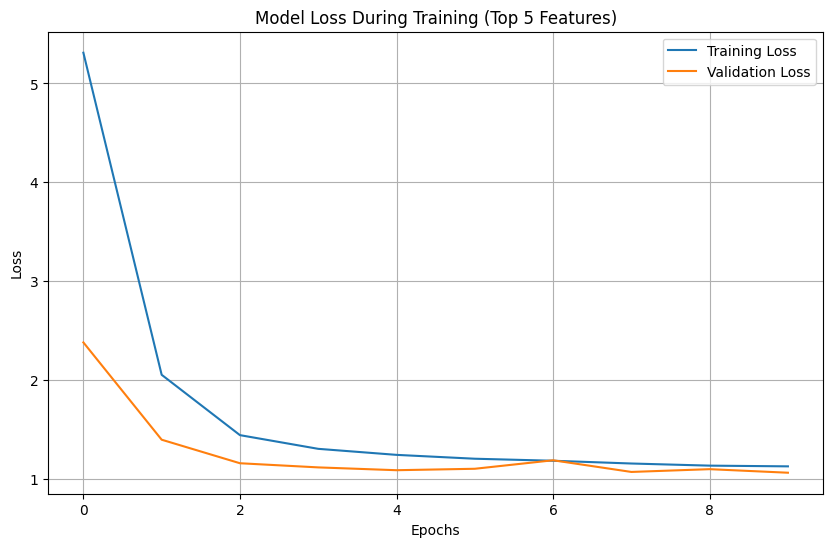

183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Test MSE (Neural Network with 5 features): 4.62189810702727
Test R-squared (Neural Network with 5 features): -0.09383211757091225


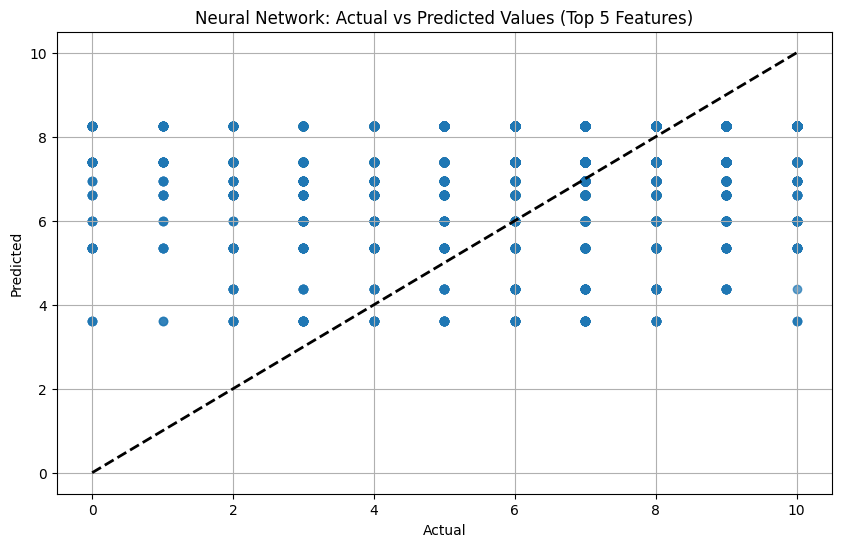

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.6776 - val_loss: 2.5286 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3554 - val_loss: 1.7370 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9840 - val_loss: 1.5453 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7870 - val_loss: 1.4696 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5989 - val_loss: 1.2640 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4041 - val_loss: 1.1952 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3003 - val_loss: 1.0854 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2389 - val_loss: 1.0418 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1800 - val_loss: 1.0096 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.5473 - val_loss: 2.2194 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4048 - val_loss: 1.7762 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0530 - val_loss: 1.5624 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8086 - val_loss: 1.4140 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5997 - val_loss: 1.2718 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4615 - val_loss: 1.2122 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3410 - val_loss: 1.1186 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2327 - val_loss: 1.0693 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1799 - val_loss: 1.0864 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.7159 - val_loss: 2.4035 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3387 - val_loss: 1.7519 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9794 - val_loss: 1.6077 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7638 - val_loss: 1.4117 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5829 - val_loss: 1.3123 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4307 - val_loss: 1.2154 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3024 - val_loss: 1.1474 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2003 - val_loss: 1.0946 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1632 - val_loss: 1.0682 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 5.5827 - val_loss: 1.6038 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5917 - val_loss: 1.1012 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4154 - val_loss: 1.1174 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3471 - val_loss: 1.1314 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3073 - val_loss: 1.0698 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3068 - val_loss: 1.0522 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2170 - val_loss: 1.0382 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1920 - val_loss: 1.0557 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1928 - val_loss: 1.0203 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5094 - val_loss: 1.4117 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6157 - val_loss: 1.1588 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4601 - val_loss: 1.1186 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3495 - val_loss: 1.1200 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3319 - val_loss: 1.0745 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2802 - val_loss: 1.0653 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2449 - val_loss: 1.0505 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2131 - val_loss: 1.0565 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1874 - val_loss: 1.0325 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5386 - val_loss: 1.4810 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6078 - val_loss: 1.1591 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4392 - val_loss: 1.1217 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3091 - val_loss: 1.1274 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2952 - val_loss: 1.1143 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2461 - val_loss: 1.1074 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2061 - val_loss: 1.0956 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1743 - val_loss: 1.0801 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1473 - val_loss: 1.0747 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.7281 - val_loss: 2.7447 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.6535 - val_loss: 1.8057 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2028 - val_loss: 1.6497 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9242 - val_loss: 1.4742 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7068 - val_loss: 1.3465 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5458 - val_loss: 1.2451 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4269 - val_loss: 1.1520 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3088 - val_loss: 1.0940 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2310 - val_loss: 1.0636 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.6461 - val_loss: 2.3116 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6276 - val_loss: 1.7972 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2264 - val_loss: 1.6730 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9554 - val_loss: 1.4647 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7090 - val_loss: 1.3380 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5082 - val_loss: 1.2276 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4139 - val_loss: 1.1560 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3002 - val_loss: 1.1166 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2366 - val_loss: 1.0432 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.7422 - val_loss: 2.5134 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6672 - val_loss: 1.8363 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.1975 - val_loss: 1.6624 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9038 - val_loss: 1.5041 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6474 - val_loss: 1.3792 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5355 - val_loss: 1.2872 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4041 - val_loss: 1.1848 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2842 - val_loss: 1.1307 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1948 - val_loss: 1.0900 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 5.5131 - val_loss: 1.4514 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8236 - val_loss: 1.1128 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5523 - val_loss: 1.1022 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4601 - val_loss: 1.0717 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3766 - val_loss: 1.0727 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2994 - val_loss: 1.0825 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2792 - val_loss: 1.0749 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2378 - val_loss: 1.0728 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2198 - val_loss: 1.0469 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5319 - val_loss: 1.5994 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8298 - val_loss: 1.0811 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6026 - val_loss: 1.1026 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4310 - val_loss: 1.1141 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3781 - val_loss: 1.0830 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3357 - val_loss: 1.0701 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2639 - val_loss: 1.0623 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2553 - val_loss: 1.0558 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1971 - val_loss: 1.0406 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 5.6072 - val_loss: 1.6669 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8054 - val_loss: 1.1693 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5705 - val_loss: 1.1537 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4200 - val_loss: 1.1199 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3643 - val_loss: 1.1116 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3048 - val_loss: 1.1193 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2482 - val_loss: 1.1016 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2280 - val_loss: 1.0843 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1904 - val_loss: 1.0826 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6354 - val_loss: 2.8263 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4019 - val_loss: 1.7744 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0317 - val_loss: 1.6082 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7841 - val_loss: 1.4417 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5888 - val_loss: 1.3125 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4531 - val_loss: 1.1973 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3672 - val_loss: 1.1301 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2595 - val_loss: 1.0779 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2090 - val_loss: 1.0498 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.6491 - val_loss: 2.5139 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3624 - val_loss: 1.8028 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0225 - val_loss: 1.5892 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8299 - val_loss: 1.4079 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5996 - val_loss: 1.3106 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4668 - val_loss: 1.2038 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3685 - val_loss: 1.1616 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2511 - val_loss: 1.1059 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2166 - val_loss: 1.0483 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.7007 - val_loss: 2.5464 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3794 - val_loss: 1.7528 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.0057 - val_loss: 1.5841 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7740 - val_loss: 1.4201 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5568 - val_loss: 1.2968 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3728 - val_loss: 1.2101 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2857 - val_loss: 1.1316 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2057 - val_loss: 1.0903 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1456 - val_loss: 1.0711 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 5.5978 - val_loss: 1.5339 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6563 - val_loss: 1.0932 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4151 - val_loss: 1.0801 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3414 - val_loss: 1.0757 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2834 - val_loss: 1.0630 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2580 - val_loss: 1.0541 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2547 - val_loss: 1.0319 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1632 - val_loss: 1.0328 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1841 - val_loss: 1.0320 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5995 - val_loss: 1.5324 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6638 - val_loss: 1.1428 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4212 - val_loss: 1.0933 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3612 - val_loss: 1.0856 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2971 - val_loss: 1.0818 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2572 - val_loss: 1.0619 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1880 - val_loss: 1.0667 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1597 - val_loss: 1.0540 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1815 - val_loss: 1.0443 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5814 - val_loss: 1.5383 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.6023 - val_loss: 1.1462 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4373 - val_loss: 1.1415 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3334 - val_loss: 1.1273 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2867 - val_loss: 1.1226 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2546 - val_loss: 1.0996 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2392 - val_loss: 1.0846 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1700 - val_loss: 1.0819 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1380 - val_loss: 1.0724 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6.6888 - val_loss: 2.6989 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6445 - val_loss: 1.8410 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2432 - val_loss: 1.6597 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9255 - val_loss: 1.4647 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7137 - val_loss: 1.3517 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5490 - val_loss: 1.2367 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4238 - val_loss: 1.1362 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3067 - val_loss: 1.0909 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2431 - val_loss: 1.0595 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6649 - val_loss: 2.6752 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6714 - val_loss: 1.9158 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2316 - val_loss: 1.6586 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9377 - val_loss: 1.4843 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7364 - val_loss: 1.3720 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5757 - val_loss: 1.2451 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4386 - val_loss: 1.1590 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3257 - val_loss: 1.1172 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2426 - val_loss: 1.0727 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 6.6241 - val_loss: 2.5172 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6432 - val_loss: 1.8612 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2263 - val_loss: 1.6699 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.9741 - val_loss: 1.5276 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7693 - val_loss: 1.3939 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5171 - val_loss: 1.2822 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4076 - val_loss: 1.1938 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3069 - val_loss: 1.1440 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2517 - val_loss: 1.0867 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.5773 - val_loss: 1.6032 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8686 - val_loss: 1.1187 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5703 - val_loss: 1.0881 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4309 - val_loss: 1.0960 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3647 - val_loss: 1.0797 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3418 - val_loss: 1.0582 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2743 - val_loss: 1.0475 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2371 - val_loss: 1.0592 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2080 - val_loss: 1.0491 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.6169 - val_loss: 1.4971 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8410 - val_loss: 1.1027 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5813 - val_loss: 1.0837 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4232 - val_loss: 1.0965 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3543 - val_loss: 1.0752 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3095 - val_loss: 1.0591 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2769 - val_loss: 1.0557 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2516 - val_loss: 1.0473 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2121 - val_loss: 1.0475 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 5.6733 - val_loss: 1.8731 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.8664 - val_loss: 1.1459 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.5624 - val_loss: 1.1449 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.4107 - val_loss: 1.1269 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3221 - val_loss: 1.1166 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2671 - val_loss: 1.1033 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2298 - val_loss: 1.0978 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2235 - val_loss: 1.0870 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1934 - val_loss: 1.0824 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2592 - val_loss: 4.9392 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.2541 - val_loss: 1.8567 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2705 - val_loss: 1.6654 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0950 - val_loss: 1.5757 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8810 - val_loss: 1.4864 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7454 - val_loss: 1.3898 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6313 - val_loss: 1.2970 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5249 - val_loss: 1.2421 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3843 - val_loss: 1.1730 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2288 - val_loss: 5.6777 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.3554 - val_loss: 2.0709 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2384 - val_loss: 1.6700 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0053 - val_loss: 1.5479 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8410 - val_loss: 1.4476 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6675 - val_loss: 1.3466 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5687 - val_loss: 1.2785 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4534 - val_loss: 1.2027 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3626 - val_loss: 1.1717 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2366 - val_loss: 4.9722 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.2728 - val_loss: 1.9592 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2900 - val_loss: 1.7654 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0972 - val_loss: 1.6589 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8852 - val_loss: 1.5970 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.7819 - val_loss: 1.4698 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6364 - val_loss: 1.3811 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5149 - val_loss: 1.3201 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4305 - val_loss: 1.2429 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 6.0760 - val_loss: 4.2635 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.5195 - val_loss: 1.3264 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6342 - val_loss: 1.1116 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4730 - val_loss: 1.1410 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3886 - val_loss: 1.0736 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3789 - val_loss: 1.0611 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3230 - val_loss: 1.0773 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3017 - val_loss: 1.0834 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2529 - val_loss: 1.0603 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.0927 - val_loss: 4.0941 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.5153 - val_loss: 1.2162 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6151 - val_loss: 1.1074 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5018 - val_loss: 1.0857 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4428 - val_loss: 1.0914 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3474 - val_loss: 1.0852 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3383 - val_loss: 1.0881 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2758 - val_loss: 1.0645 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2753 - val_loss: 1.0562 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.1217 - val_loss: 4.6686 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.5142 - val_loss: 1.3775 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6045 - val_loss: 1.1405 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4332 - val_loss: 1.1387 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4008 - val_loss: 1.1383 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3776 - val_loss: 1.1369 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2850 - val_loss: 1.1085 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2560 - val_loss: 1.1238 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2416 - val_loss: 1.0945 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.3307 - val_loss: 5.3313 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.6106 - val_loss: 2.1935 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.5218 - val_loss: 1.7391 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2069 - val_loss: 1.6231 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.0109 - val_loss: 1.5203 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.8635 - val_loss: 1.4310 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6884 - val_loss: 1.3507 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5823 - val_loss: 1.2845 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5149 - val_loss: 1.1952 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.3443 - val_loss: 5.4828 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.6854 - val_loss: 2.2182 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.5523 - val_loss: 1.7712 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2564 - val_loss: 1.6852 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0471 - val_loss: 1.5748 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.9037 - val_loss: 1.4927 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7551 - val_loss: 1.4166 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6387 - val_loss: 1.3318 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5386 - val_loss: 1.2456 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2897 - val_loss: 4.7449 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.4943 - val_loss: 2.0496 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.5522 - val_loss: 1.8263 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2881 - val_loss: 1.7343 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0908 - val_loss: 1.6007 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.9240 - val_loss: 1.5143 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7545 - val_loss: 1.4202 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6294 - val_loss: 1.3396 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5077 - val_loss: 1.2729 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.1019 - val_loss: 4.1866 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.6174 - val_loss: 1.3435 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7855 - val_loss: 1.0885 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6184 - val_loss: 1.0925 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5439 - val_loss: 1.0901 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4662 - val_loss: 1.1189 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3457 - val_loss: 1.0666 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3346 - val_loss: 1.0784 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3136 - val_loss: 1.0708 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.0594 - val_loss: 4.2625 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.6461 - val_loss: 1.3141 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8364 - val_loss: 1.1210 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6559 - val_loss: 1.1117 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5386 - val_loss: 1.0926 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4742 - val_loss: 1.0801 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3802 - val_loss: 1.0757 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3440 - val_loss: 1.0728 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3031 - val_loss: 1.0864 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.1635 - val_loss: 4.2089 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.7119 - val_loss: 1.3545 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7982 - val_loss: 1.1292 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5686 - val_loss: 1.1289 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5149 - val_loss: 1.1131 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4171 - val_loss: 1.1312 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3556 - val_loss: 1.1011 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3075 - val_loss: 1.1108 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2633 - val_loss: 1.0979 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.1644 - val_loss: 5.2382 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.2189 - val_loss: 2.0158 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2666 - val_loss: 1.7052 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0815 - val_loss: 1.6540 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8814 - val_loss: 1.4878 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7617 - val_loss: 1.3796 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6112 - val_loss: 1.3040 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5096 - val_loss: 1.2240 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4287 - val_loss: 1.1613 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2363 - val_loss: 4.8386 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.3003 - val_loss: 1.7936 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2512 - val_loss: 1.6575 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0350 - val_loss: 1.6004 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8750 - val_loss: 1.5108 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7330 - val_loss: 1.4185 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6372 - val_loss: 1.2997 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4779 - val_loss: 1.2498 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4228 - val_loss: 1.1880 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2154 - val_loss: 5.1115 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.2196 - val_loss: 1.9749 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2436 - val_loss: 1.7160 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.9944 - val_loss: 1.6389 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8668 - val_loss: 1.5197 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7486 - val_loss: 1.4144 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5971 - val_loss: 1.3699 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5094 - val_loss: 1.2772 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3959 - val_loss: 1.2243 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.1061 - val_loss: 4.3706 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.4177 - val_loss: 1.3966 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6247 - val_loss: 1.1195 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5150 - val_loss: 1.1138 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4301 - val_loss: 1.1343 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3323 - val_loss: 1.0745 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3347 - val_loss: 1.0794 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3160 - val_loss: 1.0678 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2608 - val_loss: 1.0630 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.0946 - val_loss: 4.4744 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.4791 - val_loss: 1.3250 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6182 - val_loss: 1.1360 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5058 - val_loss: 1.1114 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4302 - val_loss: 1.0877 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3881 - val_loss: 1.0881 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3299 - val_loss: 1.0713 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3108 - val_loss: 1.0682 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2606 - val_loss: 1.0869 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.1089 - val_loss: 4.0900 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.5006 - val_loss: 1.2975 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6009 - val_loss: 1.1202 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4561 - val_loss: 1.1190 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3807 - val_loss: 1.1170 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3200 - val_loss: 1.1081 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2668 - val_loss: 1.1620 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2845 - val_loss: 1.1136 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2241 - val_loss: 1.1086 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2545 - val_loss: 5.0879 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.5717 - val_loss: 2.0325 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.5825 - val_loss: 1.7716 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2918 - val_loss: 1.6600 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0756 - val_loss: 1.5920 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8834 - val_loss: 1.4577 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7451 - val_loss: 1.3632 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6397 - val_loss: 1.2814 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5272 - val_loss: 1.2230 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.2750 - val_loss: 5.4361 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.5134 - val_loss: 2.2078 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.5699 - val_loss: 1.7961 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2582 - val_loss: 1.7011 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0977 - val_loss: 1.5879 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.9069 - val_loss: 1.4812 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7801 - val_loss: 1.3973 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6053 - val_loss: 1.3067 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4969 - val_loss: 1.2338 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.3266 - val_loss: 5.3089 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.5840 - val_loss: 2.1177 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.5554 - val_loss: 1.8262 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.2821 - val_loss: 1.7325 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.0732 - val_loss: 1.6203 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8955 - val_loss: 1.5197 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.7521 - val_loss: 1.4298 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6032 - val_loss: 1.3450 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5134 - val_loss: 1.2689 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.0997 - val_loss: 4.1981 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.8205 - val_loss: 1.3413 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8478 - val_loss: 1.0796 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6013 - val_loss: 1.0931 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5253 - val_loss: 1.1129 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4378 - val_loss: 1.0791 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3738 - val_loss: 1.0586 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3425 - val_loss: 1.0674 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3225 - val_loss: 1.0553 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.1413 - val_loss: 4.2627 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.5957 - val_loss: 1.3150 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8045 - val_loss: 1.1635 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6529 - val_loss: 1.1057 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5399 - val_loss: 1.1203 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4929 - val_loss: 1.0713 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3764 - val_loss: 1.0800 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3638 - val_loss: 1.0655 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3047 - val_loss: 1.0699 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 6.1476 - val_loss: 4.4173 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.7178 - val_loss: 1.4807 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.8018 - val_loss: 1.1601 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.6328 - val_loss: 1.1464 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.5136 - val_loss: 1.1546 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4375 - val_loss: 1.1265 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3940 - val_loss: 1.1145 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3229 - val_loss: 1.1136 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2988 - val_loss: 1.1137 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.9383 - val_loss: 1.1024 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2382 - val_loss: 1.0365 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1174 - val_loss: 1.0214 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0753 - val_loss: 0.9907 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0838 - val_loss: 1.0848 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0718 - val_loss: 1.0416 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0695 - val_loss: 1.1500 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0414 - val_loss: 0.9844 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0482 - val_loss: 0.9711 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.8793 - val_loss: 1.1043 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2118 - val_loss: 1.0146 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1153 - val_loss: 0.9994 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0513 - val_loss: 1.1112 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0393 - val_loss: 0.9917 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0486 - val_loss: 1.0162 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0369 - val_loss: 0.9727 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0528 - val_loss: 0.9820 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0491 - val_loss: 1.0244 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.9028 - val_loss: 1.1546 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2059 - val_loss: 1.1097 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0848 - val_loss: 1.0690 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0481 - val_loss: 1.0468 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0358 - val_loss: 1.0138 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0438 - val_loss: 1.0295 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0466 - val_loss: 1.0634 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0261 - val_loss: 1.0127 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0186 - val_loss: 1.0383 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.3351 - val_loss: 1.1092 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1829 - val_loss: 1.0496 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0796 - val_loss: 0.9900 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0562 - val_loss: 1.0381 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0358 - val_loss: 1.0051 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0114 - val_loss: 0.9619 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0353 - val_loss: 0.9403 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0081 - val_loss: 0.9525 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0094 - val_loss: 1.0152 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 2.3486 - val_loss: 1.0692 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1558 - val_loss: 1.0200 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0719 - val_loss: 0.9796 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0416 - val_loss: 1.1104 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0441 - val_loss: 0.9531 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0169 - val_loss: 1.1638 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0350 - val_loss: 0.9719 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0159 - val_loss: 1.0065 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0130 - val_loss: 0.9661 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.3755 - val_loss: 1.1313 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1143 - val_loss: 1.1351 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0813 - val_loss: 1.0164 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0271 - val_loss: 1.1020 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0114 - val_loss: 1.0903 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0111 - val_loss: 1.0085 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9993 - val_loss: 1.0046 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0142 - val_loss: 1.0030 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9938 - val_loss: 0.9914 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.1906 - val_loss: 1.2070 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2367 - val_loss: 1.0564 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1214 - val_loss: 0.9902 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0982 - val_loss: 0.9816 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0867 - val_loss: 1.0610 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1008 - val_loss: 1.0515 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0857 - val_loss: 0.9985 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0467 - val_loss: 0.9925 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0509 - val_loss: 1.0144 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.1402 - val_loss: 1.1147 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2526 - val_loss: 1.0401 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1082 - val_loss: 1.0655 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1044 - val_loss: 1.0201 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1084 - val_loss: 0.9824 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0662 - val_loss: 1.0001 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0640 - val_loss: 0.9839 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0452 - val_loss: 0.9928 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0645 - val_loss: 1.0070 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.1401 - val_loss: 1.1747 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2044 - val_loss: 1.0733 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1224 - val_loss: 1.1155 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0707 - val_loss: 1.0669 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0614 - val_loss: 1.1086 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0721 - val_loss: 1.1022 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0554 - val_loss: 1.0290 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0093 - val_loss: 1.0536 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0408 - val_loss: 1.0426 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4485 - val_loss: 1.0538 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1994 - val_loss: 0.9874 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0974 - val_loss: 0.9659 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0962 - val_loss: 0.9492 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0658 - val_loss: 1.0126 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0546 - val_loss: 0.9666 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0534 - val_loss: 0.9670 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0330 - val_loss: 0.9862 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0375 - val_loss: 1.0854 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4673 - val_loss: 1.2513 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2047 - val_loss: 0.9987 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1031 - val_loss: 0.9702 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0442 - val_loss: 1.0654 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0703 - val_loss: 0.9853 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0493 - val_loss: 0.9961 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0712 - val_loss: 1.0383 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0278 - val_loss: 0.9884 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9917 - val_loss: 0.9499 - learning_rate: 0.0050
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4386 - val_loss: 1.0933 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1642 - val_loss: 1.0612 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0936 - val_loss: 1.0564 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0285 - val_loss: 1.0340 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0248 - val_loss: 1.0181 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0263 - val_loss: 1.0098 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0443 - val_loss: 0.9960 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0283 - val_loss: 0.9971 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9897 - val_loss: 1.0081 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.9289 - val_loss: 1.0773 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2184 - val_loss: 1.1251 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1145 - val_loss: 0.9858 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0909 - val_loss: 1.0005 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1108 - val_loss: 1.0716 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0779 - val_loss: 0.9688 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0549 - val_loss: 1.0098 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0270 - val_loss: 0.9691 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0375 - val_loss: 0.9870 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.9904 - val_loss: 1.2287 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2280 - val_loss: 1.0346 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1441 - val_loss: 0.9834 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0594 - val_loss: 1.0357 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0793 - val_loss: 1.0445 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0716 - val_loss: 0.9990 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0603 - val_loss: 1.0573 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0599 - val_loss: 0.9944 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0247 - val_loss: 0.9870 - learning_rate: 0.0050
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.9488 - val_loss: 1.1682 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1718 - val_loss: 1.0966 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0981 - val_loss: 1.1916 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0732 - val_loss: 1.0660 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0529 - val_loss: 1.0258 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0310 - val_loss: 1.1626 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0619 - val_loss: 1.0390 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0093 - val_loss: 1.0514 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0466 - val_loss: 1.0382 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.3748 - val_loss: 1.1306 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1830 - val_loss: 0.9799 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1052 - val_loss: 0.9747 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0524 - val_loss: 0.9512 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0350 - val_loss: 1.0412 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0529 - val_loss: 0.9518 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0381 - val_loss: 0.9797 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0320 - val_loss: 0.9540 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0174 - val_loss: 1.0457 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.3497 - val_loss: 1.0545 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1768 - val_loss: 0.9895 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0744 - val_loss: 1.0893 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0258 - val_loss: 0.9717 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0235 - val_loss: 0.9773 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0190 - val_loss: 0.9604 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9953 - val_loss: 0.9546 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0329 - val_loss: 0.9668 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0322 - val_loss: 1.0035 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.3193 - val_loss: 1.1485 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1302 - val_loss: 1.0302 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0624 - val_loss: 1.0790 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0526 - val_loss: 1.0331 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0025 - val_loss: 0.9996 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0117 - val_loss: 0.9993 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0094 - val_loss: 0.9947 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0102 - val_loss: 1.0080 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0066 - val_loss: 1.0012 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.1453 - val_loss: 1.2160 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2497 - val_loss: 1.0385 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1255 - val_loss: 0.9753 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1088 - val_loss: 1.1433 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1007 - val_loss: 0.9812 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0863 - val_loss: 1.0140 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0922 - val_loss: 0.9972 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0776 - val_loss: 0.9864 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0413 - val_loss: 0.9576 - learning_rate: 0.0050
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 3.1223 - val_loss: 1.1221 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2407 - val_loss: 1.0341 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1193 - val_loss: 0.9993 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0759 - val_loss: 1.0254 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1105 - val_loss: 1.0542 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0888 - val_loss: 1.0236 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0624 - val_loss: 1.1360 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0739 - val_loss: 1.0337 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0399 - val_loss: 0.9620 - learning_rate: 0.0050
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 3.1367 - val_loss: 1.2676 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2107 - val_loss: 1.1248 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0956 - val_loss: 1.0458 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0764 - val_loss: 1.1045 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0748 - val_loss: 1.0443 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0648 - val_loss: 1.0298 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0577 - val_loss: 1.0262 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0424 - val_loss: 1.0246 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0396 - val_loss: 1.0667 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4507 - val_loss: 1.1218 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2206 - val_loss: 1.0120 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0899 - val_loss: 0.9887 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0877 - val_loss: 1.0017 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0569 - val_loss: 0.9531 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0571 - val_loss: 0.9642 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0725 - val_loss: 1.0200 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0259 - val_loss: 0.9480 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0399 - val_loss: 1.0197 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4847 - val_loss: 1.1687 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1981 - val_loss: 1.1448 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0963 - val_loss: 0.9683 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0271 - val_loss: 0.9595 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0460 - val_loss: 1.0997 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0354 - val_loss: 1.0392 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0865 - val_loss: 0.9685 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0266 - val_loss: 0.9523 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0521 - val_loss: 0.9818 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 2.4810 - val_loss: 1.0937 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1764 - val_loss: 1.0378 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0784 - val_loss: 1.0361 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0460 - val_loss: 1.0269 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0211 - val_loss: 0.9991 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0512 - val_loss: 1.0157 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0173 - val_loss: 1.0964 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0227 - val_loss: 1.0239 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.0162 - val_loss: 1.0003 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 3.4924 - val_loss: 1.1536 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3143 - val_loss: 1.0399 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1920 - val_loss: 1.1461 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1211 - val_loss: 1.0029 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1044 - val_loss: 1.0929 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0433 - val_loss: 0.9728 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0312 - val_loss: 1.0788 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0411 - val_loss: 0.9873 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0236 - val_loss: 0.9872 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 3.4424 - val_loss: 1.1539 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2952 - val_loss: 1.1025 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1839 - val_loss: 1.0593 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1380 - val_loss: 1.0058 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1152 - val_loss: 0.9969 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0523 - val_loss: 0.9925 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0646 - val_loss: 1.0835 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0572 - val_loss: 1.0149 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0504 - val_loss: 0.9748 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 3.5209 - val_loss: 1.1686 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2486 - val_loss: 1.1023 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1652 - val_loss: 1.0626 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0947 - val_loss: 1.0502 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0827 - val_loss: 1.0260 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0385 - val_loss: 1.0868 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0311 - val_loss: 1.0371 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0060 - val_loss: 1.0213 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0029 - val_loss: 1.0119 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 2.8221 - val_loss: 1.1081 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2648 - val_loss: 1.0667 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1512 - val_loss: 0.9796 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0650 - val_loss: 0.9579 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0486 - val_loss: 0.9614 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0436 - val_loss: 1.0073 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0369 - val_loss: 0.9976 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0385 - val_loss: 1.0223 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0375 - val_loss: 0.9521 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.8562 - val_loss: 1.1157 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2107 - val_loss: 1.0024 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1074 - val_loss: 0.9814 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0618 - val_loss: 1.0512 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0521 - val_loss: 0.9829 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0568 - val_loss: 0.9683 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0391 - val_loss: 0.9569 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0171 - val_loss: 0.9504 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0525 - val_loss: 1.0084 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.8738 - val_loss: 1.1562 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1892 - val_loss: 1.0598 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0877 - val_loss: 1.1152 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0695 - val_loss: 1.0183 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0361 - val_loss: 1.0331 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0155 - val_loss: 1.0226 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0174 - val_loss: 1.0157 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0334 - val_loss: 0.9934 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.9905 - val_loss: 0.9925 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 3.7078 - val_loss: 1.1932 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3784 - val_loss: 1.0599 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1834 - val_loss: 1.0786 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1289 - val_loss: 0.9811 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0752 - val_loss: 0.9880 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0946 - val_loss: 0.9831 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0668 - val_loss: 1.1173 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0670 - val_loss: 0.9681 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0796 - val_loss: 1.0623 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 3.7727 - val_loss: 1.1828 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3205 - val_loss: 1.1204 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1815 - val_loss: 1.0360 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1122 - val_loss: 0.9865 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0785 - val_loss: 0.9893 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0760 - val_loss: 0.9817 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0781 - val_loss: 1.0121 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0751 - val_loss: 1.0463 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0643 - val_loss: 0.9790 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 3.7055 - val_loss: 1.2206 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3509 - val_loss: 1.1434 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1733 - val_loss: 1.1257 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1096 - val_loss: 1.0347 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0799 - val_loss: 1.0542 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0529 - val_loss: 1.0699 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0636 - val_loss: 1.0213 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0678 - val_loss: 1.0149 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0489 - val_loss: 1.0586 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.9070 - val_loss: 1.2420 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3041 - val_loss: 1.0937 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1420 - val_loss: 0.9906 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1073 - val_loss: 0.9645 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0856 - val_loss: 0.9633 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0442 - val_loss: 0.9575 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0674 - val_loss: 1.0040 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0553 - val_loss: 0.9545 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0524 - val_loss: 0.9406 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.9424 - val_loss: 1.1101 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.3048 - val_loss: 1.0246 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1310 - val_loss: 1.0842 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0718 - val_loss: 1.0099 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0866 - val_loss: 1.0016 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0360 - val_loss: 0.9569 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0125 - val_loss: 0.9710 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0484 - val_loss: 0.9666 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0614 - val_loss: 0.9625 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.9067 - val_loss: 1.1409 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2569 - val_loss: 1.0637 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1102 - val_loss: 1.1168 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0802 - val_loss: 1.0102 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0348 - val_loss: 1.0132 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0347 - val_loss: 0.9957 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0396 - val_loss: 0.9999 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0179 - val_loss: 0.9971 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0129 - val_loss: 0.9882 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 3.5230 - val_loss: 1.1458 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3205 - val_loss: 1.0624 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1679 - val_loss: 1.0444 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1152 - val_loss: 1.0911 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0771 - val_loss: 1.0564 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0669 - val_loss: 1.0742 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0493 - val_loss: 0.9622 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0402 - val_loss: 0.9810 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0572 - val_loss: 0.9609 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 3.5770 - val_loss: 1.2037 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2995 - val_loss: 1.0801 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1409 - val_loss: 1.0215 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1126 - val_loss: 1.0088 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0876 - val_loss: 1.0191 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0721 - val_loss: 1.0524 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0565 - val_loss: 1.1215 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0304 - val_loss: 1.0334 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0462 - val_loss: 0.9987 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 3.4858 - val_loss: 1.1752 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3022 - val_loss: 1.1209 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1748 - val_loss: 1.0826 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1066 - val_loss: 1.0230 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0441 - val_loss: 1.0349 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0335 - val_loss: 1.0119 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0360 - val_loss: 1.0174 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0320 - val_loss: 1.0054 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0323 - val_loss: 1.0195 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.8731 - val_loss: 1.1478 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2604 - val_loss: 1.0197 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1299 - val_loss: 1.1494 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0975 - val_loss: 0.9911 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0697 - val_loss: 0.9627 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0586 - val_loss: 0.9488 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0399 - val_loss: 0.9488 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0405 - val_loss: 0.9544 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0156 - val_loss: 0.9541 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.8495 - val_loss: 1.1581 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2395 - val_loss: 1.0343 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0930 - val_loss: 1.0168 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1015 - val_loss: 1.1200 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0448 - val_loss: 0.9984 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0630 - val_loss: 0.9938 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0532 - val_loss: 0.9488 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0211 - val_loss: 0.9737 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0127 - val_loss: 0.9496 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.8463 - val_loss: 1.1758 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2332 - val_loss: 1.1131 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1219 - val_loss: 1.0621 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0476 - val_loss: 1.0160 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0510 - val_loss: 1.0374 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0269 - val_loss: 1.0081 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0308 - val_loss: 1.0060 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0074 - val_loss: 1.0397 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0212 - val_loss: 1.0341 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 3.7540 - val_loss: 1.1713 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3547 - val_loss: 1.0558 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1855 - val_loss: 1.0345 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1544 - val_loss: 1.1014 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1117 - val_loss: 1.0547 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0813 - val_loss: 0.9894 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0663 - val_loss: 0.9963 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0630 - val_loss: 0.9846 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0588 - val_loss: 1.1148 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 3.8242 - val_loss: 1.1804 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3538 - val_loss: 1.0705 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1884 - val_loss: 1.0821 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1088 - val_loss: 1.0787 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1047 - val_loss: 0.9933 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0803 - val_loss: 1.0685 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0749 - val_loss: 0.9906 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0576 - val_loss: 1.0234 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0726 - val_loss: 1.0482 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 3.7715 - val_loss: 1.2926 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.3167 - val_loss: 1.1532 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1966 - val_loss: 1.1469 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1070 - val_loss: 1.0421 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0718 - val_loss: 1.0609 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0621 - val_loss: 1.0511 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0647 - val_loss: 1.0301 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0628 - val_loss: 1.0576 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0306 - val_loss: 1.0398 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 2.9821 - val_loss: 1.2391 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2907 - val_loss: 1.0344 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1539 - val_loss: 1.0059 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1229 - val_loss: 1.0276 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0938 - val_loss: 0.9916 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0524 - val_loss: 0.9704 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0461 - val_loss: 0.9978 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0253 - val_loss: 0.9467 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0261 - val_loss: 0.9422 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.9834 - val_loss: 1.0998 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2744 - val_loss: 1.0693 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1540 - val_loss: 0.9989 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0759 - val_loss: 0.9818 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1157 - val_loss: 0.9709 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0508 - val_loss: 0.9570 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0343 - val_loss: 0.9991 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0612 - val_loss: 0.9838 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0532 - val_loss: 0.9599 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 2.9287 - val_loss: 1.2379 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.2640 - val_loss: 1.1509 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.1167 - val_loss: 1.0573 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0791 - val_loss: 1.0417 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0516 - val_loss: 1.0379 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0303 - val_loss: 1.0090 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0505 - val_loss: 1.2145 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0313 - val_loss: 1.0032 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.0332 - val_loss: 0.9896 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.1370 - val_loss: 2.6204 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.8946 - val_loss: 2.0921 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2903 - val_loss: 1.6721 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.8224 - val_loss: 1.4006 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4963 - val_loss: 1.1891 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2994 - val_loss: 1.0974 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2451 - val_loss: 1.0273 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1481 - val_loss: 1.0354 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1460 - val_loss: 1.0398 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.1861 - val_loss: 2.5177 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.7914 - val_loss: 2.1535 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2646 - val_loss: 1.6812 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.8157 - val_loss: 1.3901 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5600 - val_loss: 1.2103 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3517 - val_loss: 1.1499 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2223 - val_loss: 1.0819 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1753 - val_loss: 1.1498 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1244 - val_loss: 0.9978 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.1745 - val_loss: 2.5852 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.8511 - val_loss: 2.1483 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2195 - val_loss: 1.7049 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7914 - val_loss: 1.3736 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4751 - val_loss: 1.2715 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2890 - val_loss: 1.1251 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1826 - val_loss: 1.0845 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1310 - val_loss: 1.1221 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1163 - val_loss: 1.0966 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2298 - val_loss: 1.3006 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6705 - val_loss: 1.2355 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5619 - val_loss: 1.2847 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4398 - val_loss: 1.2783 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3759 - val_loss: 1.1641 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3127 - val_loss: 1.1248 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2491 - val_loss: 1.0874 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2020 - val_loss: 1.0708 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1700 - val_loss: 1.0333 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2976 - val_loss: 1.3720 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6283 - val_loss: 1.2617 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5514 - val_loss: 1.2660 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4382 - val_loss: 1.2085 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3695 - val_loss: 1.1658 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2749 - val_loss: 1.1448 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2588 - val_loss: 1.0872 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1984 - val_loss: 1.0867 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1789 - val_loss: 1.0747 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2607 - val_loss: 1.2909 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6583 - val_loss: 1.2999 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5113 - val_loss: 1.2490 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4214 - val_loss: 1.2313 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3646 - val_loss: 1.2435 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2887 - val_loss: 1.1816 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2332 - val_loss: 1.1547 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1992 - val_loss: 1.1432 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1619 - val_loss: 1.0862 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.2736 - val_loss: 2.7467 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.1856 - val_loss: 2.2621 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.5453 - val_loss: 1.8372 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.0597 - val_loss: 1.5363 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6453 - val_loss: 1.2704 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3885 - val_loss: 1.1247 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2912 - val_loss: 1.0376 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2101 - val_loss: 1.0463 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1657 - val_loss: 1.0466 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.2719 - val_loss: 2.6842 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.1100 - val_loss: 2.2671 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.5302 - val_loss: 1.8330 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.0057 - val_loss: 1.5339 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6832 - val_loss: 1.3825 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4780 - val_loss: 1.2259 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3060 - val_loss: 1.1003 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2229 - val_loss: 1.0453 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1703 - val_loss: 1.0553 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.3848 - val_loss: 2.7435 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.1549 - val_loss: 2.2686 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.4664 - val_loss: 1.8909 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.9774 - val_loss: 1.5193 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6204 - val_loss: 1.2837 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3945 - val_loss: 1.1652 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2399 - val_loss: 1.1172 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1662 - val_loss: 1.0589 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1178 - val_loss: 1.0431 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.3515 - val_loss: 1.3250 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7762 - val_loss: 1.3078 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5898 - val_loss: 1.2872 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4860 - val_loss: 1.2012 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4142 - val_loss: 1.1889 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3552 - val_loss: 1.1535 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3031 - val_loss: 1.1319 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2657 - val_loss: 1.0901 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2540 - val_loss: 1.0752 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2798 - val_loss: 1.2448 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.8060 - val_loss: 1.3442 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6490 - val_loss: 1.2810 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4777 - val_loss: 1.2347 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4160 - val_loss: 1.1998 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3469 - val_loss: 1.1567 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2849 - val_loss: 1.1371 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2461 - val_loss: 1.0942 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1997 - val_loss: 1.0748 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.3647 - val_loss: 1.2933 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.8154 - val_loss: 1.2831 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6165 - val_loss: 1.2552 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4638 - val_loss: 1.2613 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3801 - val_loss: 1.2156 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3430 - val_loss: 1.1749 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2888 - val_loss: 1.1567 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2345 - val_loss: 1.1353 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1794 - val_loss: 1.1061 - learning_rate: 0.0010
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.1489 - val_loss: 2.6347 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.8402 - val_loss: 2.0847 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2342 - val_loss: 1.6493 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.8138 - val_loss: 1.3590 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5353 - val_loss: 1.2879 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3373 - val_loss: 1.1362 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2096 - val_loss: 1.0576 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1464 - val_loss: 1.0042 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1366 - val_loss: 1.0150 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.2304 - val_loss: 2.5437 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.8511 - val_loss: 2.1078 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2400 - val_loss: 1.7086 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7750 - val_loss: 1.3131 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4931 - val_loss: 1.2947 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3006 - val_loss: 1.0875 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2175 - val_loss: 1.0663 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1228 - val_loss: 1.0304 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1214 - val_loss: 1.0245 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.1946 - val_loss: 2.6288 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.8606 - val_loss: 2.1426 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2376 - val_loss: 1.7058 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7403 - val_loss: 1.3410 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4360 - val_loss: 1.2577 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2661 - val_loss: 1.0935 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1963 - val_loss: 1.1498 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1298 - val_loss: 1.0801 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1290 - val_loss: 1.0377 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2179 - val_loss: 1.2960 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6651 - val_loss: 1.2603 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5214 - val_loss: 1.2684 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4195 - val_loss: 1.1783 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3141 - val_loss: 1.1463 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2898 - val_loss: 1.0949 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2306 - val_loss: 1.0745 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1824 - val_loss: 1.0497 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1553 - val_loss: 1.0556 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2070 - val_loss: 1.3183 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6627 - val_loss: 1.3177 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5386 - val_loss: 1.2742 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4193 - val_loss: 1.2093 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3588 - val_loss: 1.1723 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2884 - val_loss: 1.1214 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2623 - val_loss: 1.0823 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1974 - val_loss: 1.0924 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1836 - val_loss: 1.0667 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2178 - val_loss: 1.3504 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6561 - val_loss: 1.3517 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5282 - val_loss: 1.2661 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3909 - val_loss: 1.2250 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3719 - val_loss: 1.2789 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2628 - val_loss: 1.1713 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2126 - val_loss: 1.1706 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1764 - val_loss: 1.1247 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1748 - val_loss: 1.1031 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.3189 - val_loss: 2.7710 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.1386 - val_loss: 2.2700 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.5175 - val_loss: 1.8433 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.9865 - val_loss: 1.5261 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6574 - val_loss: 1.3198 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4524 - val_loss: 1.1857 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2764 - val_loss: 1.1108 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2106 - val_loss: 1.0556 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1606 - val_loss: 1.0372 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.3765 - val_loss: 2.7127 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.1568 - val_loss: 2.3356 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.5499 - val_loss: 1.8442 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.0048 - val_loss: 1.5101 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6714 - val_loss: 1.3171 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4518 - val_loss: 1.1594 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2929 - val_loss: 1.0603 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1576 - val_loss: 1.0341 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1475 - val_loss: 1.0455 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 7.3385 - val_loss: 2.8483 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.1357 - val_loss: 2.2798 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.4528 - val_loss: 1.8256 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.9609 - val_loss: 1.5184 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6078 - val_loss: 1.3271 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4051 - val_loss: 1.2173 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2532 - val_loss: 1.1119 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1736 - val_loss: 1.0722 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1385 - val_loss: 1.0429 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.3637 - val_loss: 1.4523 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7609 - val_loss: 1.2398 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6068 - val_loss: 1.2462 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4966 - val_loss: 1.1747 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4151 - val_loss: 1.1786 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3375 - val_loss: 1.1427 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2902 - val_loss: 1.1053 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2556 - val_loss: 1.0983 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1950 - val_loss: 1.0904 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.3429 - val_loss: 1.3362 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.8055 - val_loss: 1.2139 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5873 - val_loss: 1.2570 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5106 - val_loss: 1.2294 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4356 - val_loss: 1.1713 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3912 - val_loss: 1.1498 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2870 - val_loss: 1.1494 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2418 - val_loss: 1.1160 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2245 - val_loss: 1.0800 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 5.2853 - val_loss: 1.4782 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7770 - val_loss: 1.3004 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6031 - val_loss: 1.2788 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4780 - val_loss: 1.2854 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4140 - val_loss: 1.2188 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.3653 - val_loss: 1.1818 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2803 - val_loss: 1.1755 - learning_rate: 0.0010
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2199 - val_loss: 1.1595 - learning_rate: 0.0010
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2107 - val_loss: 1.1292 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 7.9874 - val_loss: 4.5661 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.7732 - val_loss: 2.3382 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6781 - val_loss: 2.0783 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.3385 - val_loss: 1.7888 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.0152 - val_loss: 1.5777 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7411 - val_loss: 1.3828 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5717 - val_loss: 1.2726 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3863 - val_loss: 1.1474 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2436 - val_loss: 1.0814 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 8.0207 - val_loss: 4.6858 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.7997 - val_loss: 2.2963 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6314 - val_loss: 2.0109 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.2978 - val_loss: 1.7393 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.9992 - val_loss: 1.5619 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6867 - val_loss: 1.3165 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4949 - val_loss: 1.2229 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3599 - val_loss: 1.1240 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2803 - val_loss: 1.0856 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 8.0301 - val_loss: 4.5196 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.8058 - val_loss: 2.3929 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6598 - val_loss: 2.0739 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.3294 - val_loss: 1.8035 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.9695 - val_loss: 1.5872 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7301 - val_loss: 1.4309 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5493 - val_loss: 1.3364 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3777 - val_loss: 1.1993 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.2884 - val_loss: 1.1367 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 5.9872 - val_loss: 3.6057 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.4421 - val_loss: 1.3271 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6508 - val_loss: 1.1951 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5455 - val_loss: 1.2938 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4871 - val_loss: 1.2361 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4302 - val_loss: 1.2646 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3732 - val_loss: 1.1703 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3028 - val_loss: 1.1903 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3131 - val_loss: 1.1240 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 5.9810 - val_loss: 3.2263 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.4736 - val_loss: 1.2420 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6442 - val_loss: 1.2358 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5755 - val_loss: 1.2617 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4775 - val_loss: 1.2120 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4121 - val_loss: 1.2002 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3929 - val_loss: 1.1744 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3446 - val_loss: 1.1582 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3038 - val_loss: 1.1508 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 5.9991 - val_loss: 3.5077 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.4662 - val_loss: 1.2956 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6048 - val_loss: 1.2573 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5144 - val_loss: 1.2738 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4603 - val_loss: 1.2606 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4077 - val_loss: 1.2308 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3538 - val_loss: 1.2247 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3101 - val_loss: 1.1766 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2850 - val_loss: 1.1779 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 8.1068 - val_loss: 4.7187 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.1073 - val_loss: 2.4041 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.9337 - val_loss: 2.2112 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.5784 - val_loss: 1.9161 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.2371 - val_loss: 1.6700 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.9323 - val_loss: 1.4666 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.6885 - val_loss: 1.3293 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5132 - val_loss: 1.2183 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3892 - val_loss: 1.1514 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 8.1656 - val_loss: 4.9609 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.1926 - val_loss: 2.5121 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.0038 - val_loss: 2.2481 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.5861 - val_loss: 1.9767 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.2267 - val_loss: 1.7110 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.9276 - val_loss: 1.5074 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7154 - val_loss: 1.3416 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5376 - val_loss: 1.2278 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3874 - val_loss: 1.1643 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 8.1162 - val_loss: 5.1923 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.2087 - val_loss: 2.5286 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.9647 - val_loss: 2.3210 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.5296 - val_loss: 1.9867 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.2007 - val_loss: 1.7238 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.8954 - val_loss: 1.5004 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6613 - val_loss: 1.4286 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4572 - val_loss: 1.2413 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3400 - val_loss: 1.1570 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 6.0550 - val_loss: 3.5723 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.7714 - val_loss: 1.2412 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7620 - val_loss: 1.2540 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6712 - val_loss: 1.2369 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5371 - val_loss: 1.2358 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4642 - val_loss: 1.1876 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4281 - val_loss: 1.1592 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3620 - val_loss: 1.1568 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3177 - val_loss: 1.1331 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 6.0658 - val_loss: 3.1557 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.7269 - val_loss: 1.2543 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7699 - val_loss: 1.2230 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6490 - val_loss: 1.2011 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5557 - val_loss: 1.2197 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5092 - val_loss: 1.1810 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4236 - val_loss: 1.1936 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3863 - val_loss: 1.1807 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3208 - val_loss: 1.1386 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 6.0220 - val_loss: 3.3617 - learning_rate: 0.0010
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.7560 - val_loss: 1.3103 - learning_rate: 0.0010
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.7967 - val_loss: 1.2769 - learning_rate: 0.0010
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6499 - val_loss: 1.2555 - learning_rate: 0.0010
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5644 - val_loss: 1.2266 - learning_rate: 0.0010
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5122 - val_loss: 1.2381 - learning_rate: 0.0010
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4031 - val_loss: 1.2112 - learning_rate: 0.0010
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3475 - val_loss: 1.2483 - learning_rate: 0.0010
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3354 - val_loss: 1.1723 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 7.9851 - val_loss: 4.3589 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.7892 - val_loss: 2.2805 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6202 - val_loss: 2.0206 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.2879 - val_loss: 1.7325 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.9138 - val_loss: 1.5530 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7208 - val_loss: 1.5622 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5423 - val_loss: 1.2233 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3961 - val_loss: 1.2016 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3438 - val_loss: 1.0946 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 7.9867 - val_loss: 4.2651 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.7500 - val_loss: 2.3184 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6381 - val_loss: 2.0704 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.2505 - val_loss: 1.8495 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.9690 - val_loss: 1.5274 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7223 - val_loss: 1.3761 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.5380 - val_loss: 1.2758 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3797 - val_loss: 1.1777 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2976 - val_loss: 1.0777 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 8.0991 - val_loss: 5.3830 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.8435 - val_loss: 2.4006 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6487 - val_loss: 2.1245 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.3331 - val_loss: 1.8124 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.9966 - val_loss: 1.6099 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.7172 - val_loss: 1.4021 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.5138 - val_loss: 1.2899 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3618 - val_loss: 1.2523 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.2784 - val_loss: 1.1229 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 5.9836 - val_loss: 3.4902 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.4973 - val_loss: 1.2336 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.6135 - val_loss: 1.2480 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5589 - val_loss: 1.3200 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4729 - val_loss: 1.2165 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4162 - val_loss: 1.1759 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3995 - val_loss: 1.1657 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3595 - val_loss: 1.1319 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3291 - val_loss: 1.1129 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 6.0456 - val_loss: 3.0077 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.5489 - val_loss: 1.2237 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6497 - val_loss: 1.2088 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5591 - val_loss: 1.2076 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4861 - val_loss: 1.2732 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4334 - val_loss: 1.1769 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3647 - val_loss: 1.1973 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3390 - val_loss: 1.1915 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3045 - val_loss: 1.1151 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 6.0175 - val_loss: 3.4423 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 2.4980 - val_loss: 1.3180 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.6301 - val_loss: 1.2616 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.5386 - val_loss: 1.2647 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4461 - val_loss: 1.2442 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4137 - val_loss: 1.2891 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3785 - val_loss: 1.2052 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3198 - val_loss: 1.2157 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.2743 - val_loss: 1.1958 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 8.1482 - val_loss: 4.6725 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 4.2296 - val_loss: 2.4802 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.9840 - val_loss: 2.2458 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 2.6009 - val_loss: 1.9944 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 2.2349 - val_loss: 1.7362 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.9722 - val_loss: 1.5389 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.7401 - val_loss: 1.4006 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.5675 - val_loss: 1.2592 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4382 - val_loss: 1.1886 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 8.1415 - val_loss: 4.9488 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 4.1882 - val_loss: 2.4569 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.9449 - val_loss: 2.2180 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.5611 - val_loss: 1.9272 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.1938 - val_loss: 1.7595 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.8939 - val_loss: 1.5163 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.6913 - val_loss: 1.3770 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.5063 - val_loss: 1.2649 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4288 - val_loss: 1.1523 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 8.1779 - val_loss: 4.8846 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 4.1497 - val_loss: 2.4434 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.9086 - val_loss: 2.1983 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 2.5004 - val_loss: 1.9009 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.1246 - val_loss: 1.7487 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.8578 - val_loss: 1.4781 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.6224 - val_loss: 1.3366 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4421 - val_loss: 1.2188 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3619 - val_loss: 1.1453 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 6.0606 - val_loss: 3.5770 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 2.6911 - val_loss: 1.2285 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.7688 - val_loss: 1.2724 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.6585 - val_loss: 1.2147 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.5487 - val_loss: 1.1912 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4652 - val_loss: 1.2057 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.4289 - val_loss: 1.1757 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.3979 - val_loss: 1.1445 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3453 - val_loss: 1.1525 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 17s 16ms/step - loss: 6.0562 - val_loss: 3.7326 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.7356 - val_loss: 1.3190 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.7335 - val_loss: 1.2412 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.7015 - val_loss: 1.2736 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.5764 - val_loss: 1.2398 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4997 - val_loss: 1.2297 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4279 - val_loss: 1.2053 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.3539 - val_loss: 1.1677 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.3399 - val_loss: 1.1438 - learning_rate

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 6.0324 - val_loss: 3.5881 - learning_rate: 0.0010
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 2.7576 - val_loss: 1.2738 - learning_rate: 0.0010
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.8131 - val_loss: 1.2808 - learning_rate: 0.0010
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.6551 - val_loss: 1.2895 - learning_rate: 0.0010
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.5674 - val_loss: 1.2577 - learning_rate: 0.0010
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4536 - val_loss: 1.2434 - learning_rate: 0.0010
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4271 - val_loss: 1.2213 - learning_rate: 0.0010
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.3632 - val_loss: 1.1967 - learning_rate: 0.0010
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.3080 - val_loss: 1.1951 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.2775 - val_loss: 1.2705 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.3162 - val_loss: 1.2618 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1680 - val_loss: 1.0030 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0970 - val_loss: 1.0125 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0949 - val_loss: 1.0682 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0709 - val_loss: 0.9920 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0848 - val_loss: 1.0546 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0667 - val_loss: 1.2011 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0605 - val_loss: 0.9911 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.2614 - val_loss: 1.3297 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3120 - val_loss: 1.3388 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1568 - val_loss: 1.0582 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1026 - val_loss: 1.1351 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0760 - val_loss: 1.1353 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0855 - val_loss: 1.0145 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0523 - val_loss: 1.4209 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0744 - val_loss: 1.0256 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0544 - val_loss: 1.0376 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.2954 - val_loss: 1.2452 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2939 - val_loss: 1.1542 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1379 - val_loss: 1.0414 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0808 - val_loss: 1.0458 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0523 - val_loss: 1.0707 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0562 - val_loss: 1.0590 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0696 - val_loss: 1.0491 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0492 - val_loss: 1.0362 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0350 - val_loss: 1.0682 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.4170 - val_loss: 1.1722 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1954 - val_loss: 1.0404 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1217 - val_loss: 1.0579 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0860 - val_loss: 0.9710 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0805 - val_loss: 1.0842 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0494 - val_loss: 0.9875 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0377 - val_loss: 0.9950 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0364 - val_loss: 1.1212 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0258 - val_loss: 0.9782 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.4433 - val_loss: 1.3962 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1836 - val_loss: 1.0540 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0829 - val_loss: 0.9863 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0870 - val_loss: 0.9965 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0526 - val_loss: 0.9703 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0261 - val_loss: 1.0410 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0728 - val_loss: 0.9614 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0301 - val_loss: 0.9890 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0409 - val_loss: 0.9678 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.4391 - val_loss: 1.1378 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1768 - val_loss: 1.1086 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0834 - val_loss: 1.0203 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0428 - val_loss: 1.0174 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0339 - val_loss: 1.0572 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0172 - val_loss: 1.0627 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0360 - val_loss: 1.0112 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0155 - val_loss: 1.1580 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0035 - val_loss: 1.0040 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 3.5854 - val_loss: 1.4077 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3957 - val_loss: 1.0886 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1829 - val_loss: 1.0673 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1387 - val_loss: 1.1816 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1231 - val_loss: 1.0176 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1112 - val_loss: 1.2843 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1249 - val_loss: 1.1546 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1050 - val_loss: 1.0708 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1069 - val_loss: 1.2141 - learning_rate: 0.0100
Epoch 10/5

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.5127 - val_loss: 1.4675 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.3765 - val_loss: 1.3818 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1881 - val_loss: 1.1349 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1369 - val_loss: 1.0059 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1220 - val_loss: 1.0421 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1088 - val_loss: 1.0391 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1161 - val_loss: 1.0358 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1066 - val_loss: 1.0613 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0980 - val_loss: 1.1927 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.4537 - val_loss: 1.4317 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3425 - val_loss: 1.1498 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1735 - val_loss: 1.1061 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1285 - val_loss: 1.1417 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0934 - val_loss: 1.1450 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0795 - val_loss: 1.0915 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0906 - val_loss: 1.1187 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0979 - val_loss: 1.2007 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0772 - val_loss: 1.0783 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.5277 - val_loss: 1.2917 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.2403 - val_loss: 1.0451 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1471 - val_loss: 1.1726 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0984 - val_loss: 0.9835 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0602 - val_loss: 0.9746 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0763 - val_loss: 0.9795 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0683 - val_loss: 0.9840 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0357 - val_loss: 1.0630 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0557 - val_loss: 1.0022 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.5704 - val_loss: 1.1941 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.2462 - val_loss: 1.0641 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1242 - val_loss: 0.9945 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0981 - val_loss: 1.0353 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0813 - val_loss: 0.9867 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0598 - val_loss: 0.9693 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0476 - val_loss: 1.0043 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0523 - val_loss: 0.9681 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0430 - val_loss: 0.9710 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.4968 - val_loss: 1.1218 - learning_rate: 0.0100
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.2478 - val_loss: 1.1553 - learning_rate: 0.0100
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1310 - val_loss: 1.1740 - learning_rate: 0.0100
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0828 - val_loss: 1.0428 - learning_rate: 0.0100
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0375 - val_loss: 1.2713 - learning_rate: 0.0100
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0443 - val_loss: 1.0697 - learning_rate: 0.0100
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0449 - val_loss: 1.0179 - learning_rate: 0.0100
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0312 - val_loss: 1.0561 - learning_rate: 0.0100
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0224 - val_loss: 1.0354 - learning_rate: 0.0100
Epoch 10/

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.2714 - val_loss: 1.2581 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3362 - val_loss: 1.1092 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1467 - val_loss: 1.0064 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0713 - val_loss: 1.0041 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0849 - val_loss: 1.1313 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0799 - val_loss: 0.9865 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0726 - val_loss: 1.0434 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0631 - val_loss: 0.9753 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0680 - val_loss: 1.0842 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.2972 - val_loss: 1.2287 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2991 - val_loss: 1.5499 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1777 - val_loss: 1.0614 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1035 - val_loss: 1.0977 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1330 - val_loss: 1.0494 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0570 - val_loss: 1.0814 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0650 - val_loss: 1.0506 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0699 - val_loss: 1.0392 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0829 - val_loss: 0.9859 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.3191 - val_loss: 1.2619 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.2957 - val_loss: 1.1572 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1233 - val_loss: 1.0599 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0914 - val_loss: 1.0985 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0618 - val_loss: 1.0478 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0856 - val_loss: 1.0481 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0321 - val_loss: 1.2317 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0318 - val_loss: 1.0932 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0594 - val_loss: 1.0201 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.4828 - val_loss: 1.2357 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1989 - val_loss: 1.0146 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1400 - val_loss: 1.0673 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0762 - val_loss: 1.1118 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0678 - val_loss: 1.0246 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0423 - val_loss: 0.9657 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0371 - val_loss: 0.9676 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0540 - val_loss: 0.9905 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0509 - val_loss: 1.0376 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.4386 - val_loss: 1.2606 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1961 - val_loss: 1.2444 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1015 - val_loss: 1.1746 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0530 - val_loss: 1.1674 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0473 - val_loss: 1.0686 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0491 - val_loss: 0.9823 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0463 - val_loss: 1.0935 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0372 - val_loss: 1.0534 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0154 - val_loss: 1.0269 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.3761 - val_loss: 1.1777 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1864 - val_loss: 1.1232 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1080 - val_loss: 1.1397 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0652 - val_loss: 1.0201 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0197 - val_loss: 1.0393 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0315 - val_loss: 1.1297 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0417 - val_loss: 1.2141 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0198 - val_loss: 1.0770 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0074 - val_loss: 1.0314 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.4025 - val_loss: 1.3536 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.3861 - val_loss: 1.1344 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1765 - val_loss: 1.0650 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1579 - val_loss: 1.1072 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1293 - val_loss: 1.3595 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1295 - val_loss: 0.9969 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1046 - val_loss: 1.1516 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0865 - val_loss: 1.0614 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0882 - val_loss: 1.0520 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.5190 - val_loss: 1.4893 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3324 - val_loss: 1.1541 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1655 - val_loss: 1.1286 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1573 - val_loss: 1.0824 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1041 - val_loss: 1.3903 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1281 - val_loss: 1.0759 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1159 - val_loss: 1.1531 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1035 - val_loss: 1.0792 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0701 - val_loss: 1.0513 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3.4947 - val_loss: 1.2815 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.3556 - val_loss: 1.1366 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1624 - val_loss: 1.1630 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1084 - val_loss: 1.0874 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1181 - val_loss: 1.1877 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1362 - val_loss: 1.1253 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0856 - val_loss: 1.1644 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0598 - val_loss: 1.0386 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0808 - val_loss: 1.0554 - learning_rate: 0.0100


d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.5391 - val_loss: 1.0868 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2699 - val_loss: 1.0853 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1421 - val_loss: 1.0374 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.1194 - val_loss: 0.9913 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0904 - val_loss: 1.1146 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0668 - val_loss: 1.0677 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0575 - val_loss: 1.0099 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0314 - val_loss: 0.9657 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0645 - val_loss: 1.0934 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.5557 - val_loss: 1.1255 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2578 - val_loss: 1.1631 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1448 - val_loss: 0.9953 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0527 - val_loss: 1.0293 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0776 - val_loss: 1.1844 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0565 - val_loss: 1.0233 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0693 - val_loss: 1.1735 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0698 - val_loss: 0.9823 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0783 - val_loss: 0.9950 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 2.5461 - val_loss: 1.2306 - learning_rate: 0.0100
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2480 - val_loss: 1.1376 - learning_rate: 0.0100
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1234 - val_loss: 1.0942 - learning_rate: 0.0100
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0731 - val_loss: 1.0793 - learning_rate: 0.0100
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0411 - val_loss: 1.1047 - learning_rate: 0.0100
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0510 - val_loss: 1.0146 - learning_rate: 0.0100
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0419 - val_loss: 1.0468 - learning_rate: 0.0100
Epoch 8/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0462 - val_loss: 1.0248 - learning_rate: 0.0100
Epoch 9/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0395 - val_loss: 1.0294 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 3.9954 - val_loss: 1.2195 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.3948 - val_loss: 1.2181 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.2551 - val_loss: 1.0497 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1645 - val_loss: 1.0260 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1132 - val_loss: 1.0073 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0764 - val_loss: 1.0273 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0706 - val_loss: 1.2330 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0887 - val_loss: 1.0660 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0694 - val_loss: 0.9711 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 3.9562 - val_loss: 1.2418 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.4366 - val_loss: 1.1667 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.2353 - val_loss: 1.0866 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1330 - val_loss: 1.1464 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1059 - val_loss: 1.0449 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0653 - val_loss: 1.1315 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0677 - val_loss: 1.0231 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0618 - val_loss: 1.1536 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0657 - val_loss: 1.0754 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 3.9777 - val_loss: 1.3293 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.3721 - val_loss: 1.3286 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2641 - val_loss: 1.2425 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1863 - val_loss: 1.1102 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1074 - val_loss: 1.0383 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0542 - val_loss: 1.0344 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0484 - val_loss: 1.0664 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0406 - val_loss: 1.0405 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0579 - val_loss: 1.0566 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 2.9696 - val_loss: 1.1186 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.2615 - val_loss: 1.0996 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1496 - val_loss: 1.0430 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1414 - val_loss: 1.0459 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1154 - val_loss: 0.9935 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0718 - val_loss: 0.9631 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0799 - val_loss: 0.9663 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0406 - val_loss: 0.9631 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0244 - val_loss: 0.9494 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 2.8867 - val_loss: 1.2048 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.2793 - val_loss: 1.0430 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1822 - val_loss: 1.0250 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1314 - val_loss: 1.0676 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0790 - val_loss: 1.1871 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0755 - val_loss: 0.9690 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0536 - val_loss: 1.0898 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0492 - val_loss: 0.9822 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0394 - val_loss: 1.0379 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 2.8682 - val_loss: 1.1626 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.2743 - val_loss: 1.0785 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1378 - val_loss: 1.3454 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1162 - val_loss: 1.0594 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0593 - val_loss: 1.1524 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0325 - val_loss: 1.0174 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0023 - val_loss: 1.0248 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0214 - val_loss: 1.0135 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.9995 - val_loss: 1.0588 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 4.1766 - val_loss: 1.2894 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.4556 - val_loss: 1.1499 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2883 - val_loss: 1.0843 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2059 - val_loss: 1.0837 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1555 - val_loss: 1.0741 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0954 - val_loss: 0.9964 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1382 - val_loss: 1.1466 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0800 - val_loss: 0.9874 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0691 - val_loss: 1.0497 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 4.1737 - val_loss: 1.3244 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.4586 - val_loss: 1.1814 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2993 - val_loss: 1.0858 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1644 - val_loss: 1.0295 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1212 - val_loss: 1.0546 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1285 - val_loss: 1.0485 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0882 - val_loss: 1.0658 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1292 - val_loss: 1.0740 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0914 - val_loss: 1.0156 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 4.1633 - val_loss: 1.3003 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4229 - val_loss: 1.2346 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2865 - val_loss: 1.1444 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.2039 - val_loss: 1.1233 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0868 - val_loss: 1.1001 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1088 - val_loss: 1.1180 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0830 - val_loss: 1.0552 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0710 - val_loss: 1.0785 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0506 - val_loss: 1.0641 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 3.0193 - val_loss: 1.1672 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.3598 - val_loss: 1.0699 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1637 - val_loss: 1.0057 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1440 - val_loss: 1.0458 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1208 - val_loss: 1.1213 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0877 - val_loss: 1.0598 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0634 - val_loss: 0.9939 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0485 - val_loss: 0.9929 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0484 - val_loss: 0.9676 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 3.0299 - val_loss: 1.2663 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.3538 - val_loss: 1.0835 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.2006 - val_loss: 1.2456 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1398 - val_loss: 1.1331 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1265 - val_loss: 1.0106 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0476 - val_loss: 1.0169 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0693 - val_loss: 1.0113 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0396 - val_loss: 0.9738 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0569 - val_loss: 1.0536 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 2.9678 - val_loss: 1.3699 - learning_rate: 0.0100
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.3329 - val_loss: 1.1448 - learning_rate: 0.0100
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1924 - val_loss: 1.0477 - learning_rate: 0.0100
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1201 - val_loss: 1.0320 - learning_rate: 0.0100
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0931 - val_loss: 1.0618 - learning_rate: 0.0100
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0462 - val_loss: 1.0088 - learning_rate: 0.0100
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0491 - val_loss: 1.1786 - learning_rate: 0.0100
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0377 - val_loss: 1.0152 - learning_rate: 0.0100
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.0106 - val_loss: 1.0216 - learning_rate: 0.0100
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 3.8942 - val_loss: 1.2130 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4047 - val_loss: 1.1567 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2415 - val_loss: 1.4183 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1956 - val_loss: 1.1701 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1157 - val_loss: 1.0800 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0881 - val_loss: 1.0077 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0766 - val_loss: 0.9828 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0672 - val_loss: 1.0557 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0634 - val_loss: 0.9992 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 3.9540 - val_loss: 1.2529 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4529 - val_loss: 1.2986 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2599 - val_loss: 1.1649 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1674 - val_loss: 1.0216 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1102 - val_loss: 1.0128 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0574 - val_loss: 0.9988 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1060 - val_loss: 0.9898 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0589 - val_loss: 1.0803 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0510 - val_loss: 1.0111 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 3.9461 - val_loss: 1.3559 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.3770 - val_loss: 1.3541 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2700 - val_loss: 1.1784 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1530 - val_loss: 1.0713 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0943 - val_loss: 1.2295 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0602 - val_loss: 1.0778 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0584 - val_loss: 1.0883 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0658 - val_loss: 1.0458 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0420 - val_loss: 1.0109 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 2.8473 - val_loss: 1.1685 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.3166 - val_loss: 1.0713 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1608 - val_loss: 1.0055 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1254 - val_loss: 0.9804 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1075 - val_loss: 0.9943 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0571 - val_loss: 0.9837 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0419 - val_loss: 0.9995 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0266 - val_loss: 1.0083 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0450 - val_loss: 0.9492 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 2.8664 - val_loss: 1.1257 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.2745 - val_loss: 1.0919 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 1.1667 - val_loss: 1.0291 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1209 - val_loss: 1.0103 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0975 - val_loss: 1.1081 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0672 - val_loss: 1.1556 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0330 - val_loss: 0.9930 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0277 - val_loss: 0.9629 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0228 - val_loss: 0.9728 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 2.9271 - val_loss: 1.1512 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.2553 - val_loss: 1.0925 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1501 - val_loss: 1.1159 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1117 - val_loss: 1.0722 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0667 - val_loss: 1.2916 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0710 - val_loss: 1.0322 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0384 - val_loss: 1.0694 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0285 - val_loss: 1.0097 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0223 - val_loss: 1.1871 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 4.2346 - val_loss: 1.2817 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.4770 - val_loss: 1.1698 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.2855 - val_loss: 1.0846 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1906 - val_loss: 1.0507 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1373 - val_loss: 1.0107 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1010 - val_loss: 0.9819 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0808 - val_loss: 1.0824 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0788 - val_loss: 1.0248 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0851 - val_loss: 0.9969 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 4.1868 - val_loss: 1.2625 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.4273 - val_loss: 1.1432 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.2480 - val_loss: 1.1458 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1998 - val_loss: 1.0345 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1093 - val_loss: 1.0399 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1141 - val_loss: 1.0159 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1155 - val_loss: 1.0495 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0835 - val_loss: 1.0266 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0761 - val_loss: 1.0590 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 4.1795 - val_loss: 1.3373 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4665 - val_loss: 1.2083 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.2652 - val_loss: 1.2140 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1789 - val_loss: 1.1453 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1181 - val_loss: 1.0372 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1000 - val_loss: 1.0344 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0942 - val_loss: 1.1405 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0645 - val_loss: 1.0280 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0637 - val_loss: 1.0290 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 3.0439 - val_loss: 1.1361 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.3055 - val_loss: 1.0898 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1878 - val_loss: 1.1470 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1276 - val_loss: 0.9787 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1259 - val_loss: 1.0517 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0976 - val_loss: 1.2869 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0825 - val_loss: 1.0388 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0481 - val_loss: 0.9584 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0553 - val_loss: 1.0912 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 3.0142 - val_loss: 1.2272 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 1.3306 - val_loss: 1.1157 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.2059 - val_loss: 1.0753 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.1425 - val_loss: 1.0395 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1219 - val_loss: 0.9939 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0746 - val_loss: 0.9741 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0581 - val_loss: 1.0353 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0723 - val_loss: 1.0210 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0426 - val_loss: 1.0201 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 3.0129 - val_loss: 1.2711 - learning_rate: 0.0100
Epoch 2/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.3152 - val_loss: 1.1885 - learning_rate: 0.0100
Epoch 3/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1943 - val_loss: 1.1342 - learning_rate: 0.0100
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.1383 - val_loss: 1.1042 - learning_rate: 0.0100
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0961 - val_loss: 1.0327 - learning_rate: 0.0100
Epoch 6/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0788 - val_loss: 1.0331 - learning_rate: 0.0100
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0582 - val_loss: 1.0227 - learning_rate: 0.0100
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1.0509 - val_loss: 1.0173 - learning_rate: 0.0100
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.9956 - val_loss: 1.0104 - learning_rate:

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 8.4293 - val_loss: 3.1854 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 3.1947 - val_loss: 1.9047 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.9347 - val_loss: 1.3493 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.4493 - val_loss: 1.1271 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.2752 - val_loss: 1.1220 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.2132 - val_loss: 1.1035 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.2165 - val_loss: 1.0732 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1627 - val_loss: 1.0800 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1387 - val_loss: 1.0928 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 8.4399 - val_loss: 3.2502 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 3.1900 - val_loss: 1.8911 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.9016 - val_loss: 1.4491 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.4311 - val_loss: 1.1877 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2887 - val_loss: 1.0873 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2381 - val_loss: 1.0976 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2039 - val_loss: 1.1200 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1654 - val_loss: 1.0950 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1339 - val_loss: 1.0445 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 8.4498 - val_loss: 3.1774 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 3.0967 - val_loss: 1.8453 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.8367 - val_loss: 1.2861 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3679 - val_loss: 1.1606 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2298 - val_loss: 1.1049 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1862 - val_loss: 1.1309 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1652 - val_loss: 1.0931 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1328 - val_loss: 1.1183 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1255 - val_loss: 1.0748 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 4.9973 - val_loss: 1.5950 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.8488 - val_loss: 1.4677 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.6588 - val_loss: 1.4103 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.5189 - val_loss: 1.2269 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3921 - val_loss: 1.1797 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3060 - val_loss: 1.1117 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1833 - val_loss: 1.0687 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1494 - val_loss: 1.0269 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.0885 - val_loss: 1.0169 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 5.0601 - val_loss: 1.5273 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.8545 - val_loss: 1.5801 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.6552 - val_loss: 1.3848 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.5152 - val_loss: 1.3297 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3561 - val_loss: 1.1914 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2393 - val_loss: 1.1172 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1842 - val_loss: 1.0453 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1274 - val_loss: 1.0704 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.0967 - val_loss: 0.9986 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 5.0922 - val_loss: 1.6409 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.8489 - val_loss: 1.6269 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.6646 - val_loss: 1.4000 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.4768 - val_loss: 1.4221 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3762 - val_loss: 1.2585 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2846 - val_loss: 1.1720 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1828 - val_loss: 1.1251 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1262 - val_loss: 1.1064 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.0776 - val_loss: 1.0432 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 8.7559 - val_loss: 3.5759 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 3.6971 - val_loss: 2.2523 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 2.2858 - val_loss: 1.4424 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.5872 - val_loss: 1.1573 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3610 - val_loss: 1.0906 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2720 - val_loss: 1.0864 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2195 - val_loss: 1.0842 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2008 - val_loss: 1.0786 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1906 - val_loss: 1.0527 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 8.8310 - val_loss: 3.7021 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 3.8430 - val_loss: 2.4138 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 2.4187 - val_loss: 1.5718 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.6431 - val_loss: 1.1862 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.3662 - val_loss: 1.1765 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.2740 - val_loss: 1.1137 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2357 - val_loss: 1.0926 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2296 - val_loss: 1.0742 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1635 - val_loss: 1.1085 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 8.8003 - val_loss: 3.6724 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 3.7931 - val_loss: 2.5403 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 2.4094 - val_loss: 1.5559 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.5998 - val_loss: 1.2425 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3004 - val_loss: 1.1587 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2251 - val_loss: 1.1043 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1831 - val_loss: 1.1588 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1718 - val_loss: 1.1025 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1652 - val_loss: 1.1132 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 5.1623 - val_loss: 1.5655 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.9939 - val_loss: 1.5106 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.7487 - val_loss: 1.5735 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.6073 - val_loss: 1.3031 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.4889 - val_loss: 1.2720 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 1.3473 - val_loss: 1.1518 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.2632 - val_loss: 1.1124 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.2237 - val_loss: 1.0582 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 1.1615 - val_loss: 1.0132 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 5.1371 - val_loss: 1.5684 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.9905 - val_loss: 1.4735 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.7358 - val_loss: 1.5244 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.6182 - val_loss: 1.2849 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.4843 - val_loss: 1.2271 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.3486 - val_loss: 1.1743 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.2736 - val_loss: 1.0836 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.1603 - val_loss: 1.0698 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1361 - val_loss: 1.0194 - learning_rate: 0.0010
E

d:\ReDI\Data Circle\Redi project Stackoverflow\stackproj\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 5.1663 - val_loss: 1.5283 - learning_rate: 0.0010
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.9984 - val_loss: 1.6793 - learning_rate: 0.0010
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 1.7557 - val_loss: 1.4457 - learning_rate: 0.0010
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 1.5740 - val_loss: 1.4063 - learning_rate: 0.0010
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.4499 - val_loss: 1.2822 - learning_rate: 0.0010
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.3277 - val_loss: 1.2256 - learning_rate: 0.0010
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 1.2501 - val_loss: 1.1630 - learning_rate: 0.0010
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1972 - val_loss: 1.1129 - learning_rate: 0.0010
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 1.1517 - val_loss: 1.1193 - learning_rate: 0.0010
E

KeyboardInterrupt: 

In [219]:
# import numpy as np
# from sklearn.model_selection import KFold
# from sklearn.metrics import mean_squared_error, r2_score
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, LeakyReLU
# from tensorflow.keras.optimizers import RMSprop
# from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# from tensorflow.keras.regularizers import l2
# from tensorflow.keras.losses import Huber
# from sklearn.preprocessing import RobustScaler
# from scipy import stats
# import pandas as pd
# import matplotlib.pyplot as plt

# # Convert sparse DataFrames to dense format
# X_train_dense = X_train_transformed_df.sparse.to_dense()
# X_test_dense = X_test_transformed_df.sparse.to_dense()

# # Apply RobustScaler for robust scaling
# scaler = RobustScaler()
# X_train_scaled = scaler.fit_transform(X_train_dense)
# X_test_scaled = scaler.transform(X_test_dense)

# # Remove outliers using z-score threshold
# X_train_cleaned = X_train_transformed_df[(np.abs(stats.zscore(X_train_transformed_df)) < 3).all(axis=1)]
# y_train_cleaned = y_train[X_train_cleaned.index]

# # Function to dynamically build the model based on num_features
# def create_model(input_shape, learning_rate=0.001, neurons=32, dropout_rate=0.2, l2_lambda=0.01):
#     model = Sequential()
    
#     # Input layer
#     model.add(Dense(neurons, kernel_regularizer=l2(l2_lambda), input_shape=(input_shape,)))
#     model.add(LeakyReLU())
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
    
#     # Hidden layers
#     model.add(Dense(neurons, kernel_regularizer=l2(l2_lambda)))
#     model.add(LeakyReLU())
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
    
#     model.add(Dense(neurons, kernel_regularizer=l2(l2_lambda)))
#     model.add(LeakyReLU())
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
    
#     # Output layer
#     model.add(Dense(1, activation='linear'))
    
#     # Compile the model with Huber loss
#     model.compile(optimizer=RMSprop(learning_rate=learning_rate), loss=Huber(delta=1.0))
#     return model

# # Set hyperparameters
# param_dist = {
#     'neurons': [64, 128, 256],
#     'learning_rate': [0.001, 0.01],
#     'batch_size': [32, 64],
#     'epochs': [50, 100],
#     'dropout_rate': [0.2, 0.3],
#     'l2_lambda': [0.01, 0.001]
# }

# # Feature subsets to test
# features_to_test = [5, 10, 15, 20]
# results = {}

# kf = KFold(n_splits=3, shuffle=True, random_state=42)

# for num_features in features_to_test:
    
#     # Extract top N features based on feature importance
#     top_n_features = feature_importances['Feature'][:num_features].tolist()
    
#     # Filter X_train and X_test to keep only the top N features
#     X_train_subset = X_train_cleaned[top_n_features].sparse.to_dense()
#     X_test_subset = X_test_dense[top_n_features]
    
#     best_mse = float("inf")
#     best_params = {}
    
#     # Loop through hyperparameters
#     for neurons in param_dist['neurons']:
#         for learning_rate in param_dist['learning_rate']:
#             for batch_size in param_dist['batch_size']:
#                 for epochs in param_dist['epochs']:
#                     for dropout_rate in param_dist['dropout_rate']:
#                         for l2_lambda in param_dist['l2_lambda']:
#                             fold_mse = []
#                             for train_index, val_index in kf.split(X_train_subset):
#                                 X_train_cv, X_val_cv = X_train_subset.iloc[train_index], X_train_subset.iloc[val_index]
#                                 y_train_cv, y_val_cv = y_train_cleaned.iloc[train_index], y_train_cleaned.iloc[val_index]
                                
#                                 model = create_model(input_shape=X_train_cv.shape[1], learning_rate=learning_rate, 
#                                                      neurons=neurons, dropout_rate=dropout_rate, l2_lambda=l2_lambda)
                                
#                                 early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
#                                 lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
                                
#                                 history = model.fit(X_train_cv, y_train_cv, epochs=epochs, batch_size=batch_size, 
#                                                     validation_data=(X_val_cv, y_val_cv), 
#                                                     callbacks=[early_stopping, lr_scheduler], verbose=1)
                                
#                                 y_val_pred = model.predict(X_val_cv)
#                                 mse = mean_squared_error(y_val_cv, y_val_pred)
#                                 fold_mse.append(mse)
                            
#                             avg_mse = np.mean(fold_mse)
                            
#                             if avg_mse < best_mse:
#                                 best_mse = avg_mse
#                                 best_params = {'neurons': neurons, 'learning_rate': learning_rate, 
#                                                'batch_size': batch_size, 'epochs': epochs,
#                                                'dropout_rate': dropout_rate, 'l2_lambda': l2_lambda}
    
#     print(f"\nNumber of features: {num_features}")
#     print(f"Best hyperparameters: {best_params}")
#     print(f"Best MSE: {best_mse}")
    
#     best_model = create_model(input_shape=X_train_subset.shape[1], learning_rate=best_params['learning_rate'], 
#                               neurons=best_params['neurons'], dropout_rate=best_params['dropout_rate'], 
#                               l2_lambda=best_params['l2_lambda'])
    
#     history = best_model.fit(X_train_subset, y_train_cleaned, epochs=best_params['epochs'], 
#                              batch_size=best_params['batch_size'], validation_split=0.2, 
#                              callbacks=[early_stopping, lr_scheduler], verbose=1)
    
#     # Plot training and validation loss over epochs
#     plt.figure(figsize=(10, 6))
#     plt.plot(history.history['loss'], label='Training Loss')
#     plt.plot(history.history['val_loss'], label='Validation Loss')
#     plt.title(f'Model Loss During Training (Top {num_features} Features)')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
    
#     y_test_pred_nn = best_model.predict(X_test_subset)
#     test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
#     test_r2_nn = r2_score(y_test, y_test_pred_nn)
    
#     print(f"Test MSE (Neural Network with {num_features} features): {test_mse_nn}")
#     print(f"Test R-squared (Neural Network with {num_features} features): {test_r2_nn}")
    
#     plt.figure(figsize=(10, 6))
#     plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
#     plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
#     plt.xlabel('Actual')
#     plt.ylabel('Predicted')
#     plt.title(f'Neural Network: Actual vs Predicted Values (Top {num_features} Features)')
#     plt.grid(True)
#     plt.show()
    
#     results[num_features] = {'Test MSE': test_mse_nn, 'Test R-squared': test_r2_nn}
    
# # Summary of results
# for num_features, metrics in results.items():
#     print(f"\nNumber of Features: {num_features}")
#     print(f"Test MSE: {metrics['Test MSE']}")
#     print(f"Test R-squared: {metrics['Test R-squared']}")


In [222]:
# import numpy as np
# from sklearn.model_selection import KFold
# from sklearn.metrics import mean_squared_error, r2_score
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, LeakyReLU
# from tensorflow.keras.optimizers import RMSprop
# from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# from tensorflow.keras.regularizers import l2
# from tensorflow.keras.losses import Huber
# from sklearn.preprocessing import RobustScaler
# from scipy import stats
# import pandas as pd
# import matplotlib.pyplot as plt
# import optuna
# from optuna.integration import KerasPruningCallback

# # Convert sparse DataFrames to dense format
# X_train_dense = X_train_transformed_df.sparse.to_dense()
# X_test_dense = X_test_transformed_df.sparse.to_dense()

# # Apply RobustScaler for robust scaling
# scaler = RobustScaler()
# X_train_scaled = scaler.fit_transform(X_train_dense)
# X_test_scaled = scaler.transform(X_test_dense)

# # Remove outliers using z-score threshold
# X_train_cleaned = X_train_transformed_df[(np.abs(stats.zscore(X_train_transformed_df)) < 3).all(axis=1)]
# y_train_cleaned = y_train[X_train_cleaned.index]

# # Function to dynamically build the model based on num_features
# def create_model(input_shape, learning_rate=0.001, neurons=32, dropout_rate=0.2, l2_lambda=0.01):
#     model = Sequential()
    
#     # Input layer
#     model.add(Dense(neurons, kernel_regularizer=l2(l2_lambda), input_shape=(input_shape,)))
#     model.add(LeakyReLU())
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
    
#     # Hidden layers
#     model.add(Dense(neurons, kernel_regularizer=l2(l2_lambda)))
#     model.add(LeakyReLU())
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
    
#     model.add(Dense(neurons, kernel_regularizer=l2(l2_lambda)))
#     model.add(LeakyReLU())
#     model.add(BatchNormalization())
#     model.add(Dropout(dropout_rate))
    
#     # Output layer
#     model.add(Dense(1, activation='linear'))
    
#     # Compile the model with Huber loss
#     model.compile(optimizer=RMSprop(learning_rate=learning_rate), loss=Huber(delta=1.0))
#     return model

# # Set hyperparameters
# param_dist = {
#     'neurons': [64, 128, 256],
#     'learning_rate': [0.001, 0.01],
#     'batch_size': [32, 64],
#     'epochs': [50, 100],
#     'dropout_rate': [0.2, 0.3],
#     'l2_lambda': [0.01, 0.001]
# }

# # Use Optuna to tune the hyperparameters
# def objective(trial):
#     # Define the hyperparameters to be optimized
#     neurons = trial.suggest_categorical('neurons', [64, 128, 256])
#     learning_rate = trial.suggest_loguniform('learning_rate', 1e-4, 1e-2)
#     dropout_rate = trial.suggest_uniform('dropout_rate', 0.2, 0.5)
#     l2_lambda = trial.suggest_loguniform('l2_lambda', 1e-4, 1e-2)
#     batch_size = trial.suggest_categorical('batch_size', [32, 64])

#     # Build the model with the given hyperparameters
#     model = create_model(input_shape=X_train_cv.shape[1], neurons=neurons, 
#                          learning_rate=learning_rate, dropout_rate=dropout_rate, l2_lambda=l2_lambda)

#     # Define early stopping and learning rate scheduler
#     early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
#     lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)
    
#     # Train the model
#     history = model.fit(X_train_cv, y_train_cv, validation_data=(X_val_cv, y_val_cv),
#                         batch_size=batch_size, epochs=100, 
#                         callbacks=[early_stopping, lr_scheduler, KerasPruningCallback(trial, "val_loss")],
#                         verbose=0)
    
#     # Evaluate the model on the validation set
#     y_val_pred = model.predict(X_val_cv)
#     return mean_squared_error(y_val_cv, y_val_pred)

# # Optimize using Optuna
# study = optuna.create_study(direction="minimize")
# study.optimize(objective, n_trials=50)  # Adjust the number of trials as needed

# # Display the best hyperparameters found
# print(f"Best hyperparameters: {study.best_trial.params}")
# print(f"Best MSE: {study.best_trial.value}")

# # Best model creation and evaluation
# best_params = study.best_trial.params
# best_model = create_model(input_shape=X_train_cleaned.shape[1], neurons=best_params['neurons'], 
#                           learning_rate=best_params['learning_rate'], dropout_rate=best_params['dropout_rate'], 
#                           l2_lambda=best_params['l2_lambda'])

# # Train the best model
# history = best_model.fit(X_train_cleaned, y_train_cleaned, epochs=best_params['epochs'], 
#                          batch_size=best_params['batch_size'], validation_split=0.2, 
#                          callbacks=[early_stopping, lr_scheduler], verbose=1)

# # Plot training and validation loss over epochs
# plt.figure(figsize=(10, 6))
# plt.plot(history.history['loss'], label='Training Loss')
# plt.plot(history.history['val_loss'], label='Validation Loss')
# plt.title('Model Loss During Training (Best Hyperparameters)')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()
# plt.grid(True)
# plt.show()

# # Test the model on the test set
# y_test_pred_nn = best_model.predict(X_test_scaled)
# test_mse_nn = mean_squared_error(y_test, y_test_pred_nn)
# test_r2_nn = r2_score(y_test, y_test_pred_nn)

# # Display results
# print(f"Test MSE (Neural Network): {test_mse_nn}")
# print(f"Test R-squared (Neural Network): {test_r2_nn}")

# # Plot actual vs predicted
# plt.figure(figsize=(10, 6))
# plt.scatter(y_test, y_test_pred_nn, alpha=0.7)
# plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
# plt.xlabel('Actual')
# plt.ylabel('Predicted')
# plt.title('Neural Network: Actual vs Predicted Values')
# plt.grid(True)
# plt.show()


[I 2024-10-26 10:41:28,504] A new study created in memory with name: no-name-3d6d323a-e255-4736-ac45-10eea7ed821f
C:\Users\msn\AppData\Local\Temp\ipykernel_11960\4019673164.py:72: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-4, 1e-2)
C:\Users\msn\AppData\Local\Temp\ipykernel_11960\4019673164.py:73: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform('dropout_rate', 0.2, 0.5)
C:\Users\msn\AppData\Local\Temp\ipykernel_11960\4019673164.py:74: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0

KeyboardInterrupt: 